# Sales Forecasting

Rossmann is a European drug distributor which operates over 3,000 drug stores across seven European countries. Since a lot of drugs come with a short shelf life, that is, they do not have a long expiry date, it becomes imperative for Rossmann to accurately forecast sales at their individual stores. Based on the historical data provided for 1115 Rossmann stores, a forecasting model has to be built to forecast the daily sales for the next six weeks. Since the company is just embarking on this project, the scope has been kept to nine key stores across Europe. The stores are key for the company keeping in mind the revenue and historical prestige associated with them. These stores are numbered - 1,3,8,9,13,25,29,31 and 46.

###### Data Defenition:
The data is provided in two tables, stores and train. 

The store table contains the metadata for every single store including the following:
- Store - an Id that represents the store
- StoreType - differentiates between 4 different store models: a, b, c, d
- Assortment - describes an assortment level: a = basic, b = extra, c = extended
- CompetitionDistance - describes thedistance in meters to the nearest competitor store
- CompetitionOpenSince[Month/Year] - gives the approximate year and month of the time the nearest competitor was opened
- Promo2 - Promo2 is a continuing and consecutive promotion for some stores: 0 = store is not participating, 1 = store is participating
- Promo2Since[Year/Week] - describes the year and calendar week when the store started participating in Promo2
- PromoInterval - describes the consecutive intervals Promo2 is started, naming the months the promotion is started anew. E.g. "Feb, May, Aug, Nov" means each round starts in February, May, August, November of any given year for that store

The train table contains the sales data for individual stores at a daily level along with the details about the day
- Store - a unique Id for each store
- DayOfWeek - Describes the day of the week (1 - Monday till 7 - Sunday)
- Date - Describes the date on the day
- Sales - the turnover for any given day (this is what you are forecasting)
- Customers - the number of customers on a given day
- Open - an indicator for whether the store was open: 0 = closed, 1 = open
- StateHoliday - indicates a state holiday. Normally all stores, with few exceptions, are closed on state holidays. Note that all schools are closed on public holidays and weekends. a = public holiday, b = Easter holiday, c = Christmas, 0 = None
- SchoolHoliday - indicates if the (Store, Date) was affected by the closure of public schools

In [6]:
# import required libraries
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# suppressing warnings
import warnings
warnings.filterwarnings('ignore')

from sklearn.preprocessing import StandardScaler
from statsmodels.tsa.stattools import adfuller 
from statsmodels.graphics.tsaplots import plot_acf
from statsmodels.graphics.tsaplots import plot_pacf
from sklearn.metrics import mean_squared_error
from statsmodels.tsa.vector_ar.vecm import coint_johansen #Johansen Cointegration test
import statsmodels.api as sm
from sklearn.metrics import mean_absolute_percentage_error

#from statsmodels.tsa.arima_model import ARIMA
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.statespace.sarimax import SARIMAX
import itertools

### 1. Read and understand data

In [7]:
# Import store data with information about 1115 different stores
store = pd.read_csv('store.csv')
store.head()

,Store,StoreType,Assortment,CompetitionDistance,CompetitionOpenSinceMonth,CompetitionOpenSinceYear,Promo2,Promo2SinceWeek,Promo2SinceYear,PromoInterval
0,1,c,a,1270.0,9.0,2008.0,0,NaN,NaN,NaN
1,2,a,a,570.0,11.0,2007.0,1,13.0,2010.0,"Jan,Apr,Jul,Oct"
2,3,a,a,14130.0,12.0,2006.0,1,14.0,2011.0,"Jan,Apr,Jul,Oct"
3,4,c,c,620.0,9.0,2009.0,0,NaN,NaN,NaN
4,5,a,a,29910.0,4.0,2015.0,0,NaN,NaN,NaN


In [8]:
store.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1115 entries, 0 to 1114
Data columns (total 10 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Store                      1115 non-null   int64  
 1   StoreType                  1115 non-null   object 
 2   Assortment                 1115 non-null   object 
 3   CompetitionDistance        1112 non-null   float64
 4   CompetitionOpenSinceMonth  761 non-null    float64
 5   CompetitionOpenSinceYear   761 non-null    float64
 6   Promo2                     1115 non-null   int64  
 7   Promo2SinceWeek            571 non-null    float64
 8   Promo2SinceYear            571 non-null    float64
 9   PromoInterval              571 non-null    object 
dtypes: float64(5), int64(2), object(3)
memory usage: 87.2+ KB


In [9]:
store.shape

(1115, 10)

For analysis we have to join the month and year to form a date time format. But before that let's extract only the relevant store details which comes under the scope of the project.

In [10]:
store_data = store.loc[store['Store'].isin([1,3,8,9,13,25,29,31,46])].reset_index(drop=True)
store_data

,Store,StoreType,Assortment,CompetitionDistance,CompetitionOpenSinceMonth,CompetitionOpenSinceYear,Promo2,Promo2SinceWeek,Promo2SinceYear,PromoInterval
0,1,c,a,1270.0,9.0,2008.0,0,NaN,NaN,NaN
1,3,a,a,14130.0,12.0,2006.0,1,14.0,2011.0,"Jan,Apr,Jul,Oct"
2,8,a,a,7520.0,10.0,2014.0,0,NaN,NaN,NaN
3,9,a,c,2030.0,8.0,2000.0,0,NaN,NaN,NaN
4,13,d,a,310.0,NaN,NaN,1,45.0,2009.0,"Feb,May,Aug,Nov"
5,25,c,a,430.0,4.0,2003.0,0,NaN,NaN,NaN
6,29,d,c,2170.0,NaN,NaN,0,NaN,NaN,NaN
7,31,d,c,9800.0,7.0,2012.0,0,NaN,NaN,NaN
8,46,c,a,1200.0,9.0,2005.0,1,14.0,2011.0,"Jan,Apr,Jul,Oct"


###### Inferences:
- Among 9 stores only 3 stores have promotional activities, so PromoInterval is missing for 6 stores. We will utilize promo2 months for these 3 stores, namely store 3,13 and 46 in the forecast

- All 9 stores have competitors and the distance is provided. 

In [11]:
#Create a new variable for CompetitionSince indicating start date of competition.
store_data['CompetitionSince'] = store_data['CompetitionOpenSinceMonth'].astype(str).apply(lambda x: x.split('.')[0])+'-'+store_data['CompetitionOpenSinceYear'].astype(str).apply(lambda x: x.split('.')[0])
store_data.loc[store_data['CompetitionSince'] == 'nan-nan','CompetitionSince'] = np.nan
store_data['CompetitionSince'] = pd.to_datetime(store_data['CompetitionSince'])


In [12]:
store_data

,Store,StoreType,Assortment,CompetitionDistance,CompetitionOpenSinceMonth,CompetitionOpenSinceYear,Promo2,Promo2SinceWeek,Promo2SinceYear,PromoInterval,CompetitionSince
0,1,c,a,1270.0,9.0,2008.0,0,NaN,NaN,NaN,2008-09-01
1,3,a,a,14130.0,12.0,2006.0,1,14.0,2011.0,"Jan,Apr,Jul,Oct",2006-12-01
2,8,a,a,7520.0,10.0,2014.0,0,NaN,NaN,NaN,2014-10-01
3,9,a,c,2030.0,8.0,2000.0,0,NaN,NaN,NaN,2000-08-01
4,13,d,a,310.0,NaN,NaN,1,45.0,2009.0,"Feb,May,Aug,Nov",NaT
5,25,c,a,430.0,4.0,2003.0,0,NaN,NaN,NaN,2003-04-01
6,29,d,c,2170.0,NaN,NaN,0,NaN,NaN,NaN,NaT
7,31,d,c,9800.0,7.0,2012.0,0,NaN,NaN,NaN,2012-07-01
8,46,c,a,1200.0,9.0,2005.0,1,14.0,2011.0,"Jan,Apr,Jul,Oct",2005-09-01


In [13]:
# import train data
sales = pd.read_csv('train.csv')

In [14]:
sales.head()

,Store,DayOfWeek,Date,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday
0,1,5,2015-07-31,5263,555,1,1,0,1
1,2,5,2015-07-31,6064,625,1,1,0,1
2,3,5,2015-07-31,8314,821,1,1,0,1
3,4,5,2015-07-31,13995,1498,1,1,0,1
4,5,5,2015-07-31,4822,559,1,1,0,1


In [15]:
sales.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1017209 entries, 0 to 1017208
Data columns (total 9 columns):
 #   Column         Non-Null Count    Dtype 
---  ------         --------------    ----- 
 0   Store          1017209 non-null  int64 
 1   DayOfWeek      1017209 non-null  int64 
 2   Date           1017209 non-null  object
 3   Sales          1017209 non-null  int64 
 4   Customers      1017209 non-null  int64 
 5   Open           1017209 non-null  int64 
 6   Promo          1017209 non-null  int64 
 7   StateHoliday   1017209 non-null  object
 8   SchoolHoliday  1017209 non-null  int64 
dtypes: int64(7), object(2)
memory usage: 69.8+ MB


In [16]:
# Extract categorical columns
obj_cols = ['DayOfWeek','Open','Promo','StateHoliday','SchoolHoliday']

In [17]:
# Check the categories
for cols in obj_cols:
    print(cols,':')
    print(sales[cols].value_counts(normalize=True))
    print('-------------')

DayOfWeek :
5    0.143378
4    0.143378
3    0.143201
2    0.143200
1    0.142281
7    0.142281
6    0.142281
Name: DayOfWeek, dtype: float64
-------------
Open :
1    0.830107
0    0.169893
Name: Open, dtype: float64
-------------
Promo :
0    0.618485
1    0.381515
Name: Promo, dtype: float64
-------------
StateHoliday :
0    0.840621
0    0.128855
a    0.019917
b    0.006577
c    0.004031
Name: StateHoliday, dtype: float64
-------------
SchoolHoliday :
0    0.821353
1    0.178647
Name: SchoolHoliday, dtype: float64
-------------


StateHoliday is an object type column and None value is reperesented with both int-0 and string 0. Converting numeric to string.

In [18]:
sales.loc[sales.StateHoliday == 0,'StateHoliday']  = str('0')
sales.StateHoliday.value_counts(normalize=True)

0    0.969475
a    0.019917
b    0.006577
c    0.004031
Name: StateHoliday, dtype: float64

In [19]:
# We will extrct data of stores which are under the scope of this project
sales_data = sales.loc[sales['Store'].isin([1,3,8,9,13,25,29,31,46])].reset_index(drop=True)
sales_data.head()

,Store,DayOfWeek,Date,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday
0,1,5,2015-07-31,5263,555,1,1,0,1
1,3,5,2015-07-31,8314,821,1,1,0,1
2,8,5,2015-07-31,8492,833,1,1,0,1
3,9,5,2015-07-31,8565,687,1,1,0,1
4,13,5,2015-07-31,8821,568,1,1,0,0


###### We will merge store details with sales data.
- The Promo2SinceYear indicates that the promotion 2 had been there for store 3,13 and 46 from 2009/2011. So the promo interval can be utilized for the 3 stores as we have sales data from 2013 to 2015 
- Columns StoreType, Assortment, CompetitionDistance, Promo2SinceYear and Promo2SinceWeek are not merged with sales data as they give only a single information from 2013 to 2015.
- CompetitionOpenSinceMonth, CompetitionOpenSinceYear is missing for store 13 and 29. So we assume here that competition existed before 2013.
- For all 8 stores competition is present and they exist even before our sales data is collected. Only for store 8 the cometitor has opened a store in 10/2014. We will include this information in store 8 model.

In [20]:
# Merge sales data and store data 

data = sales_data.merge(store_data[['Store','Promo2','PromoInterval','CompetitionSince']],how='inner',on='Store')
data.head()


,Store,DayOfWeek,Date,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,Promo2,PromoInterval,CompetitionSince
0,1,5,2015-07-31,5263,555,1,1,0,1,0,NaN,2008-09-01
1,1,4,2015-07-30,5020,546,1,1,0,1,0,NaN,2008-09-01
2,1,3,2015-07-29,4782,523,1,1,0,1,0,NaN,2008-09-01
3,1,2,2015-07-28,5011,560,1,1,0,1,0,NaN,2008-09-01
4,1,1,2015-07-27,6102,612,1,1,0,1,0,NaN,2008-09-01


In [21]:
# Convert the date column to pandas datetime format
data.Date = pd.to_datetime(data.Date)
data.head()

,Store,DayOfWeek,Date,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,Promo2,PromoInterval,CompetitionSince
0,1,5,2015-07-31,5263,555,1,1,0,1,0,NaN,2008-09-01
1,1,4,2015-07-30,5020,546,1,1,0,1,0,NaN,2008-09-01
2,1,3,2015-07-29,4782,523,1,1,0,1,0,NaN,2008-09-01
3,1,2,2015-07-28,5011,560,1,1,0,1,0,NaN,2008-09-01
4,1,1,2015-07-27,6102,612,1,1,0,1,0,NaN,2008-09-01


In [22]:
#Create year,month variables from sales date
data['SaleYear'] = data.Date.dt.year
data['SaleMonth'] = data.Date.dt.month
data.head()

,Store,DayOfWeek,Date,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,Promo2,PromoInterval,CompetitionSince,SaleYear,SaleMonth
0,1,5,2015-07-31,5263,555,1,1,0,1,0,NaN,2008-09-01,2015,7
1,1,4,2015-07-30,5020,546,1,1,0,1,0,NaN,2008-09-01,2015,7
2,1,3,2015-07-29,4782,523,1,1,0,1,0,NaN,2008-09-01,2015,7
3,1,2,2015-07-28,5011,560,1,1,0,1,0,NaN,2008-09-01,2015,7
4,1,1,2015-07-27,6102,612,1,1,0,1,0,NaN,2008-09-01,2015,7


In [23]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8110 entries, 0 to 8109
Data columns (total 14 columns):
 #   Column            Non-Null Count  Dtype         
---  ------            --------------  -----         
 0   Store             8110 non-null   int64         
 1   DayOfWeek         8110 non-null   int64         
 2   Date              8110 non-null   datetime64[ns]
 3   Sales             8110 non-null   int64         
 4   Customers         8110 non-null   int64         
 5   Open              8110 non-null   int64         
 6   Promo             8110 non-null   int64         
 7   StateHoliday      8110 non-null   object        
 8   SchoolHoliday     8110 non-null   int64         
 9   Promo2            8110 non-null   int64         
 10  PromoInterval     2458 non-null   object        
 11  CompetitionSince  6410 non-null   datetime64[ns]
 12  SaleYear          8110 non-null   int64         
 13  SaleMonth         8110 non-null   int64         
dtypes: datetime64[ns](2), in

In [24]:
# Make the date as index
data.set_index(keys=['Date'],inplace=True)
data.sort_index(inplace=True)
data.head()

,Store,DayOfWeek,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,Promo2,PromoInterval,CompetitionSince,SaleYear,SaleMonth
Date,,,,,,,,,,,,,
2013-01-01,46,2,0,0,0,0,a,1,1,"Jan,Apr,Jul,Oct",2005-09-01,2013,1
2013-01-01,25,2,0,0,0,0,a,1,0,NaN,2003-04-01,2013,1
2013-01-01,8,2,0,0,0,0,a,1,0,NaN,2014-10-01,2013,1
2013-01-01,13,2,0,0,0,0,a,1,1,"Feb,May,Aug,Nov",NaT,2013,1
2013-01-01,9,2,0,0,0,0,a,1,0,NaN,2000-08-01,2013,1


In [25]:
data.tail()

,Store,DayOfWeek,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,Promo2,PromoInterval,CompetitionSince,SaleYear,SaleMonth
Date,,,,,,,,,,,,,
2015-07-31,8,5,8492,833,1,1,0,1,0,NaN,2014-10-01,2015,7
2015-07-31,29,5,9411,737,1,1,0,1,0,NaN,NaT,2015,7
2015-07-31,31,5,7248,645,1,1,0,1,0,NaN,2012-07-01,2015,7
2015-07-31,25,5,14180,1586,1,1,0,1,0,NaN,2003-04-01,2015,7
2015-07-31,1,5,5263,555,1,1,0,1,0,NaN,2008-09-01,2015,7


In [26]:
# Check the number of data points for each store
data.Store.value_counts()

25    942
8     942
9     942
3     942
1     942
31    942
29    942
46    758
13    758
Name: Store, dtype: int64

Stores 13 and 46 have missing data points. 

##### Understand the overall data 

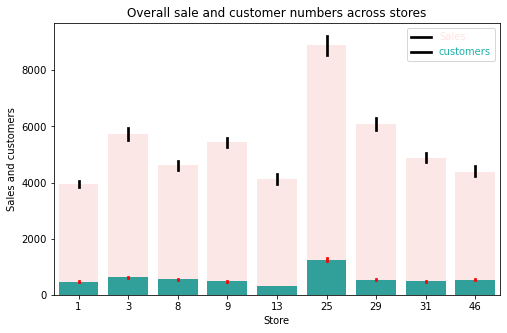

In [27]:
plt.figure(figsize=(8,5))
sns.barplot(x=data.Store, y=data.Sales,color='mistyrose',errcolor='black')
sns.barplot(x=data.Store, y=data.Customers,color='lightseagreen',errcolor='red')
plt.ylabel('Sales and customers')
plt.legend(labels=['Sales','customers'],labelcolor=['mistyrose','lightseagreen'])
plt.title('Overall sale and customer numbers across stores')
plt.show()

The sales and customers are highest for store 25 and the lowest for store 13. 

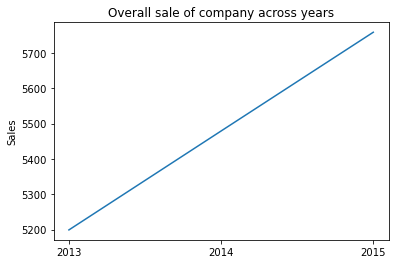

In [28]:
sns.lineplot(x=['2013','2014','2015'],y=data.groupby(by='SaleYear')['Sales'].median())
plt.title('Overall sale of company across years')
plt.show()

The median value of sales across the 9 stores are linearly increasing

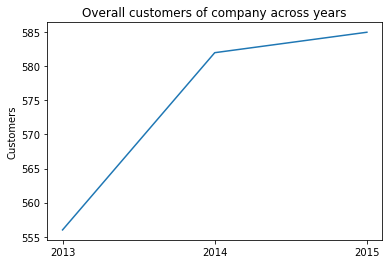

In [29]:
sns.lineplot(x=['2013','2014','2015'],y=data.groupby(by='SaleYear')['Customers'].median())
plt.title('Overall customers of company across years')
plt.show()

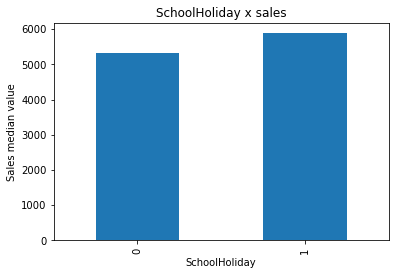

In [30]:
#Relation with School holiday  and sales
data.groupby(by='SchoolHoliday')['Sales'].median().plot.bar()
plt.title('SchoolHoliday x sales')
plt.ylabel('Sales median value')
plt.show()

Looks like sale is higher during school holidays than school days.

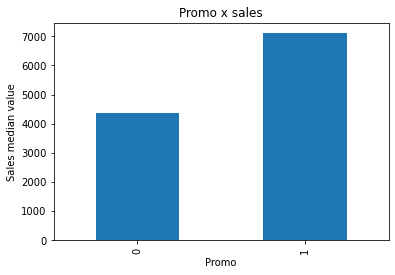

In [31]:
#Relation with running a promo and sales
data.groupby(by='Promo')['Sales'].median().plot.bar()
plt.title('Promo x sales')
plt.ylabel('Sales median value')
plt.show()

Running a promotion defenitely increases the sales

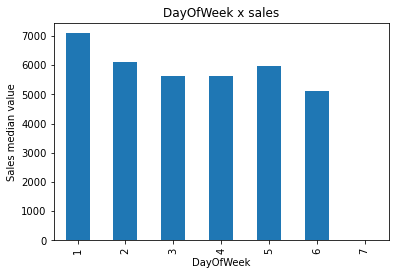

In [32]:
#Relation with DayOfWeek  and sales
data.groupby(by='DayOfWeek')['Sales'].median().plot.bar()
plt.title('DayOfWeek x sales')
plt.ylabel('Sales median value')
plt.show()

Sales is highest on Mondays and 0 for Sunday as it is public holiday and stores are closed.

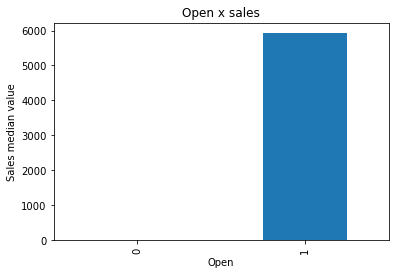

In [33]:
#Relation with Open  and sales
data.groupby(by='Open')['Sales'].median().plot.bar()
plt.title('Open x sales')
plt.ylabel('Sales median value')
plt.show()

Store closed meaning 0 sales

In [34]:
data.shape

(8110, 13)

###### Creating 9 datasets by extracting data for each of the 9 stores.

In [35]:
for x in [1,3,8,9,13,25,29,31,46]:
    globals()[f"store_{x}"] = data.loc[data.Store == x,'DayOfWeek':]


In [36]:
store_1.shape

(942, 12)

## 2. Build model for store1

##### 2.1 Analyse data 

In [800]:
store_1.head(1)

,DayOfWeek,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,Promo2,PromoInterval,CompetitionSince,SaleYear,SaleMonth
Date,,,,,,,,,,,,
2013-01-01,2,0,0,0,0,a,1,0,NaN,2008-09-01,2013,1


In [801]:
# set frequency for the dataset
store_1.index.freq = store_1.index.inferred_freq
store_1.index

DatetimeIndex(['2013-01-01', '2013-01-02', '2013-01-03', '2013-01-04',
               '2013-01-05', '2013-01-06', '2013-01-07', '2013-01-08',
               '2013-01-09', '2013-01-10',
               ...
               '2015-07-22', '2015-07-23', '2015-07-24', '2015-07-25',
               '2015-07-26', '2015-07-27', '2015-07-28', '2015-07-29',
               '2015-07-30', '2015-07-31'],
              dtype='datetime64[ns]', name='Date', length=942, freq='D')

In [802]:
store_1.describe(include='all')

,DayOfWeek,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,Promo2,PromoInterval,CompetitionSince,SaleYear,SaleMonth
count,942.000000,942.000000,942.000000,942.000000,942.000000,942,942.000000,942.0,0,942,942.000000,942.000000
unique,NaN,NaN,NaN,NaN,NaN,4,NaN,NaN,0,1,NaN,NaN
top,NaN,NaN,NaN,NaN,NaN,0,NaN,NaN,NaN,2008-09-01 00:00:00,NaN,NaN
freq,NaN,NaN,NaN,NaN,NaN,915,NaN,NaN,NaN,942,NaN,NaN
first,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2008-09-01 00:00:00,NaN,NaN
last,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2008-09-01 00:00:00,NaN,NaN
mean,3.997877,3945.704883,467.646497,0.829087,0.382166,NaN,0.204883,0.0,NaN,NaN,2013.837580,5.961783
std,1.998404,2015.417840,228.930850,0.376633,0.486175,NaN,0.403831,0.0,NaN,NaN,0.766009,3.350357
min,1.000000,0.000000,0.000000,0.000000,0.000000,NaN,0.000000,0.0,NaN,NaN,2013.000000,1.000000
25%,2.000000,3588.250000,463.000000,1.000000,0.000000,NaN,0.000000,0.0,NaN,NaN,2013.000000,3.000000


- store 1 no promo2 running.
- Competition columns can be deleted as it has only one value and doesn't give any information


In [803]:
# Remove Promo2,PromoInterval,CompetitionSince columns from store_1 data
store_1.drop(labels=['Promo2','PromoInterval','CompetitionSince'],axis=1,inplace=True)
store_1.shape

(942, 9)

In [804]:
store_1.StateHoliday.value_counts()

0    915
a     17
b      6
c      4
Name: StateHoliday, dtype: int64

In [805]:
# Check the sales by state holiday
store_1.groupby(by=['StateHoliday'])['Sales'].sum()

StateHoliday
0    3716854
a          0
b          0
c          0
Name: Sales, dtype: int64

Sales is zero whenever there is a state holiday. So it is better make the variables having only 2 levels, 1 for  state holiday and 0 for non-holiday.

In [806]:
store_1.StateHoliday= store_1.StateHoliday.apply(lambda x : 0 if x=='0' else 1)
store_1.StateHoliday.value_counts()

0    915
1     27
Name: StateHoliday, dtype: int64

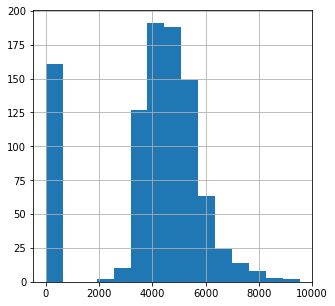

In [808]:
# Check the distribution of sales
plt.figure(figsize=(5,5))
store_1.Sales.hist(bins=15)
plt.show()

Looks like Sales has a right skewed distribution. Also lot of data points are having zero as sales value and that is a valid value as sales will be zero for holidays. Now let's check for outliers

###### Check for outliers

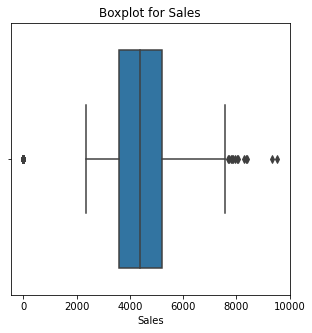

In [810]:
# Check for outliers in sales data
plt.figure(figsize=(5,5))
sns.boxplot(store_1.Sales)
plt.title('Boxplot for Sales')
plt.show()

In [811]:
store_1.Sales.quantile([.75,.8,.9,.99,.995,.999,1])

0.750    5220.000
0.800    5376.000
0.900    5860.600
0.990    7806.240
0.995    8130.360
0.999    9342.623
1.000    9528.000
Name: Sales, dtype: float64


For Values > 0.99th percentile value, we can do capping method to set them as 99th percentile value.

In [812]:
 store_1.loc[store_1.Sales > store_1.Sales.quantile([0.99])[0.99],'Sales'] =  store_1.Sales.quantile([0.99])[0.99]

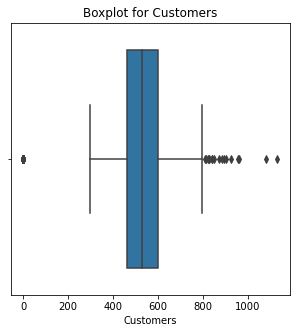

In [813]:
# Check for outliers for customers data
plt.figure(figsize=(5,5))
sns.boxplot(store_1.Customers)
plt.title('Boxplot for Customers')
plt.show()

In [814]:
store_1.Customers.quantile([.75,.8,.9,.99,.995,.999,1])

0.750     598.750
0.800     614.000
0.900     665.000
0.990     846.310
0.995     909.375
0.999    1082.950
1.000    1130.000
Name: Customers, dtype: float64

In [815]:
#For Values > 0.99th percentile value, we can do capping method to set them as 99th percentile value.

store_1.loc[store_1.Customers > store_1.Customers.quantile([0.99])[0.99],'Customers'] =  store_1.Customers.quantile([0.99])[0.99]


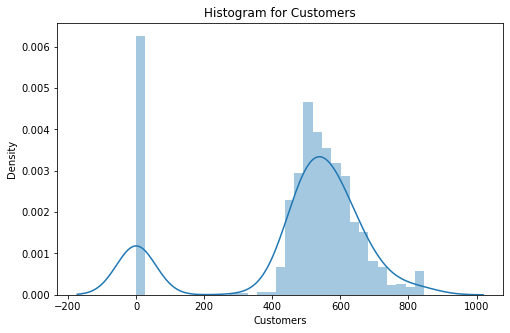

In [817]:
# Check for outliers for customers data, plot the distribution after removing outliers
plt.figure(figsize=(8,5))
sns.distplot(store_1.Customers)
plt.title('Histogram for Customers')
plt.show()

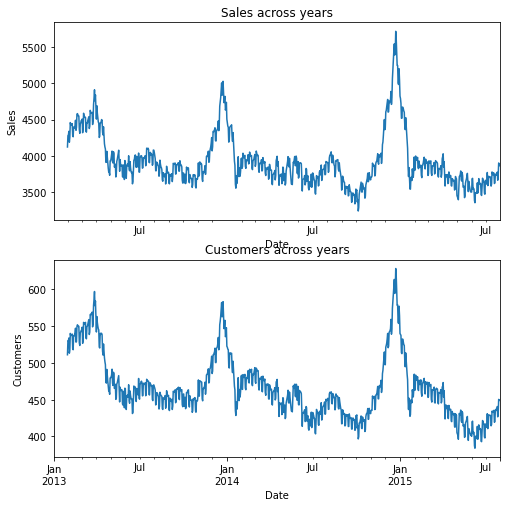

In [818]:
# Plot sales data using a rolling window
plt.figure(figsize=(8,8))
plt.subplot(2,1,1)
plt.title('Sales across years')
store_1.Sales.rolling(30).mean().plot()
plt.xticks([])
plt.ylabel('Sales')



plt.subplot(2,1,2)
plt.title('Customers across years')
store_1.Customers.rolling(30).mean().plot()
plt.xlabel('Date')
plt.ylabel('Customers')
plt.show()

We have two time series here, sales and customers. Sale value is directly proportional to number of customers.
Sales is peaking in December month.

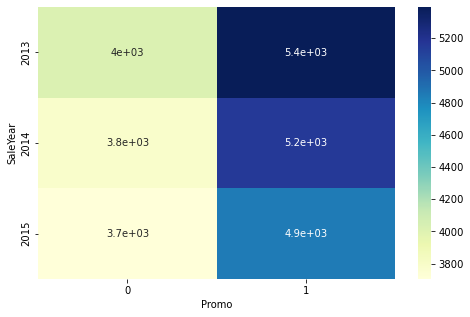

In [820]:
# Relation between sales and Promo
plt.figure(figsize=(8,5))
sns.heatmap(store_1.groupby(by=['SaleYear','Promo'])['Sales'].median().unstack(),cmap="YlGnBu",annot=True)
plt.show()

Clearly promotion has a high influence in the sales.

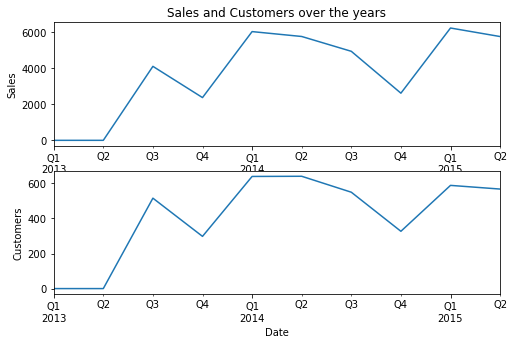

In [821]:
# Plot sales and customers over the years
plt.figure(figsize=(8,5))
plt.subplot(2,1,1)
plt.title('Sales and Customers over the years')
store_1.Sales.asfreq('Q').plot()
plt.ylabel('Sales')
plt.subplot(2,1,2)
store_1.Customers.asfreq('Q').plot()
plt.ylabel('Customers')
plt.show()

Sales and customers time series looks very much related and they move together.

###### Check correlation between data points

In [822]:
store1_corr = store_1.corr()
store1_corr

,DayOfWeek,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,SaleYear,SaleMonth
DayOfWeek,1.000000,-0.502811,-0.497456,-0.544070,-0.392929,-0.053968,-0.067935,0.001857,-0.005567
Sales,-0.502811,1.000000,0.984132,0.893868,0.475220,-0.338187,0.004794,-0.064383,0.040900
Customers,-0.497456,0.984132,1.000000,0.934717,0.383342,-0.353642,-0.005590,-0.085601,0.010543
Open,-0.544070,0.893868,0.934717,1.000000,0.299053,-0.378341,-0.000096,-0.004235,0.000713
Promo,-0.392929,0.475220,0.383342,0.299053,1.000000,-0.004170,0.028374,0.024173,-0.009944
StateHoliday,-0.053968,-0.338187,-0.353642,-0.378341,-0.004170,1.000000,0.117721,0.011512,-0.007539
SchoolHoliday,-0.067935,0.004794,-0.005590,-0.000096,0.028374,0.117721,1.000000,-0.091563,0.106331
SaleYear,0.001857,-0.064383,-0.085601,-0.004235,0.024173,0.011512,-0.091563,1.000000,-0.255839
SaleMonth,-0.005567,0.040900,0.010543,0.000713,-0.009944,-0.007539,0.106331,-0.255839,1.000000


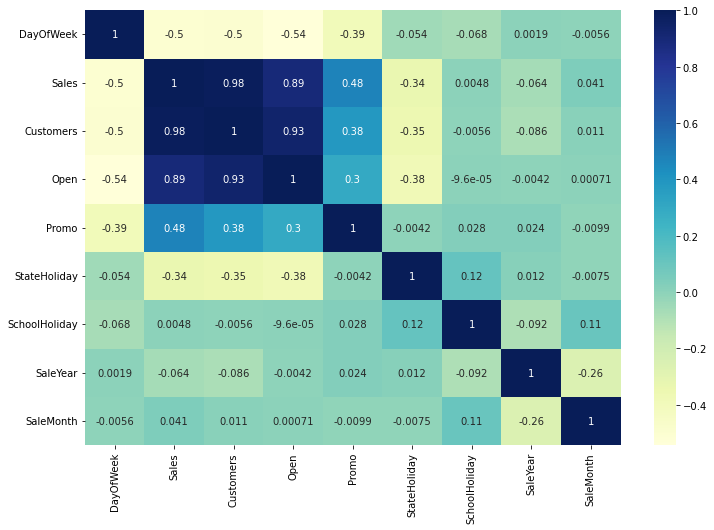

In [823]:
plt.figure(figsize=(12,8))
sns.heatmap(store1_corr,annot=True,cmap='YlGnBu')
plt.show()

- Sales is having a high correlation with Customers,Open and Promo
- For sales column, highest correlation is with Customers column and least with SchoolHoliday


##### Preprocess data
- Make DayOfWeek as a onehot encoded variable
- Drop SaleYear and SaleMonth columns

In [824]:
# Drop variables
store_1.drop(['SaleYear','SaleMonth'],inplace=True,axis=1)
# Make DayOfWeek as a onehot encoded variable
store_1 = pd.concat([store_1.iloc[:,1:],pd.get_dummies(store_1.DayOfWeek)],axis=1)
store_1.shape

(942, 13)

##### 2.2 Split the data into train and test.

As we need a daily forecast for 6 weeks, we will take last 42 days data as test set and the rest as train set.

In [825]:
store1_train = store_1[:-42].copy()
print('train set shape:',store1_train.shape)
store1_test  = store_1[-42:].copy()
print('test set shape:',store1_test.shape)

train set shape: (900, 13)
test set shape: (42, 13)


##### We need to standardize the sales and customers data
- It makes model calculations easy
- Handle MAPE calculation when sale value is zero

In [826]:
# Standardize train data
scaler = StandardScaler()
store1_train[['Sales','Customers']] = scaler.fit_transform(store1_train[['Sales','Customers']])
store1_train.head()

,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,1,2,3,4,5,6,7
Date,,,,,,,,,,,,,
2013-01-01,-1.959666,-2.049559,0,0,1,1,0,1,0,0,0,0,0
2013-01-02,0.785336,0.875636,1,0,0,1,0,0,1,0,0,0,0
2013-01-03,0.188187,0.481523,1,0,0,1,0,0,0,1,0,0,0
2013-01-04,0.267112,0.661063,1,0,0,1,0,0,0,0,1,0,0
2013-01-05,0.520764,0.731128,1,0,0,1,0,0,0,0,0,1,0


In [827]:
store1_test[['Sales','Customers']] = scaler.transform(store1_test[['Sales','Customers']])
store1_test.head()

,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,1,2,3,4,5,6,7
Date,,,,,,,,,,,,,
2015-06-20,0.074018,0.113684,1,0,0,0,0,0,0,0,0,1,0
2015-06-21,-1.959666,-2.049559,0,0,0,0,0,0,0,0,0,0,1
2015-06-22,-0.050574,0.091789,1,0,0,0,1,0,0,0,0,0,0
2015-06-23,-0.092270,-0.092131,1,0,0,0,0,1,0,0,0,0,0
2015-06-24,-0.298766,-0.236639,1,0,0,0,0,0,1,0,0,0,0


##### 2.3 Check stationarity of the series

In [828]:
def adf_test(series):
    
    print('\n' + series.name + ': ADF test results:')
    result = adfuller(series.dropna())
    print('ADF Statistic: %f' % result[0])
    print('p-value: %f' % result[1])
    print('Critical Values:')
    for key, value in result[4].items():
        print('\t%s: %.3f' % (key, value))
 #       if key=='5%': 
    return None

In [829]:
# Check stationarity of sales series
adf_test(store1_train.Sales) # ADF test--> H0: Not stationary, H1: Is stationary if p<0.05 then reject H0 then series is stationary 



Sales: ADF test results:
ADF Statistic: -4.253069
p-value: 0.000535
Critical Values:
	1%: -3.438
	5%: -2.865
	10%: -2.569


ADF test: As the p-value is < 0.05 per the sales series is stationary.
This means that the Sales data neither has trend nor seasonality.

In [830]:
# Check stationarity of Customers series
adf_test(store1_train.Customers)



Customers: ADF test results:
ADF Statistic: -3.621503
p-value: 0.005363
Critical Values:
	1%: -3.438
	5%: -2.865
	10%: -2.569


Customers series is also stationary

##### 2.4 Autocorrelation function (ACF) and Partial autocorrelation function (PACF)
Let's plot ACF to find q value and PACF to know p value

In [831]:
# Define a function to plot acf and pacf plots
def plot_autocorrelation(series,lags=30):
    
    plt.figure(figsize=(8,4))
    plot_acf(series, ax=plt.gca(), lags = lags)
    plt.show()
    plt.figure(figsize=(8,4))
    plot_pacf(series, ax=plt.gca(), lags = lags)
    plt.show()
    return None
    

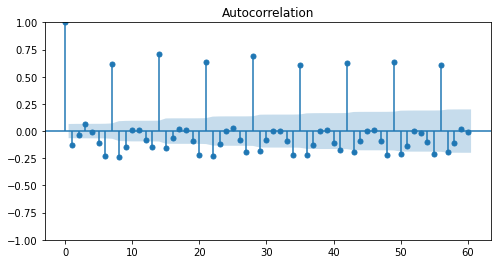

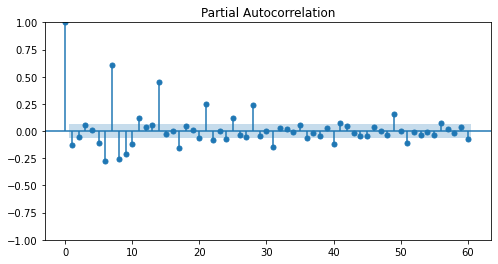

In [832]:
#Plot acf and pacf for store1 sales data
plot_autocorrelation(store1_train.Sales,60)

- There exists a seasonal pattern which repeats after 7 lags.
- As pacf and acf shows significant correlations that doesn't die soon , we will build a sarima model and find optimum p and q using grid search. We will go with model giving least AIC. 


#### 2.5 Build SARIMA model

In [833]:
# Create combinations for lag and ma orderes for both seasonal and non seasonal components
p = q = range(0, 3)
d = range(0, 1)
pdq = list(itertools.product(p, d, q))
p = q = range(0, 2)
d = range(0, 2)
seasonal_pdq = [(x[0], x[1], x[2], 7) for x in list(itertools.product(p, d, q))]

print('Examples of parameter combinations for Seasonal ARIMA...')
print('SARIMAX: {} x {}'.format(pdq[1], seasonal_pdq[1]))
print('SARIMAX: {} x {}'.format(pdq[1], seasonal_pdq[2]))
print('SARIMAX: {} x {}'.format(pdq[2], seasonal_pdq[3]))
print('SARIMAX: {} x {}'.format(pdq[2], seasonal_pdq[4]))


Examples of parameter combinations for Seasonal ARIMA...
SARIMAX: (0, 0, 1) x (0, 0, 1, 7)
SARIMAX: (0, 0, 1) x (0, 1, 0, 7)
SARIMAX: (0, 0, 2) x (0, 1, 1, 7)
SARIMAX: (0, 0, 2) x (1, 0, 0, 7)


In [834]:
for param in pdq:
    for param_seasonal in seasonal_pdq:
        try:
            model = SARIMAX(store1_train.Sales,
                            order=param,
                            seasonal_order=param_seasonal)
    

            results = model.fit()

            print('ARIMA{} x {} - AIC:{}'.format(param, param_seasonal, results.aic))
        except:
            continue

ARIMA(0, 0, 0) x (0, 0, 0, 7) - AIC:2556.0893597684108
ARIMA(0, 0, 0) x (0, 0, 1, 7) - AIC:2354.7521102524415
ARIMA(0, 0, 0) x (0, 1, 0, 7) - AIC:2275.564272560683
ARIMA(0, 0, 0) x (0, 1, 1, 7) - AIC:1626.4409576567718
ARIMA(0, 0, 0) x (1, 0, 0, 7) - AIC:2113.6627771823196
ARIMA(0, 0, 0) x (1, 0, 1, 7) - AIC:1645.402583033617
ARIMA(0, 0, 0) x (1, 1, 0, 7) - AIC:1833.6570798041644
ARIMA(0, 0, 0) x (1, 1, 1, 7) - AIC:1620.7892385925438
ARIMA(0, 0, 1) x (0, 0, 0, 7) - AIC:2541.472830464512
ARIMA(0, 0, 1) x (0, 0, 1, 7) - AIC:2356.525904209514
ARIMA(0, 0, 1) x (0, 1, 0, 7) - AIC:2223.3395288650477
ARIMA(0, 0, 1) x (0, 1, 1, 7) - AIC:1587.9693294550332
ARIMA(0, 0, 1) x (1, 0, 0, 7) - AIC:2088.8657600784913
ARIMA(0, 0, 1) x (1, 0, 1, 7) - AIC:1607.9206082691394
ARIMA(0, 0, 1) x (1, 1, 0, 7) - AIC:1823.4955892407509
ARIMA(0, 0, 1) x (1, 1, 1, 7) - AIC:1585.0762305854169
ARIMA(0, 0, 2) x (0, 0, 0, 7) - AIC:2542.8687593087425
ARIMA(0, 0, 2) x (0, 0, 1, 7) - AIC:2354.811526078484
ARIMA(0, 0, 2) 

/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(2, 0, 2) x (1, 0, 1, 7) - AIC:1536.0096733073494


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(2, 0, 2) x (1, 1, 0, 7) - AIC:1740.750578583732
ARIMA(2, 0, 2) x (1, 1, 1, 7) - AIC:1515.0468925535158


We will try both ARIMA(2, 0, 2) x (0, 1, 1, 7) - AIC:1515.6204313465992
and ARIMA(2, 0, 2) x (1, 1, 1, 7) - AIC:1515.0468925535158



In [835]:

store1_SARIMA = SARIMAX(store1_train.Sales,
                                order=(2, 0, 2),
                                seasonal_order=(0, 1, 1, 7))
            

store1_SARIMA = store1_SARIMA.fit()
store1_SARIMA.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                      SARIMAX Results                                      
===========================================================================================
Dep. Variable:                               Sales   No. Observations:                  900
Model:             SARIMAX(2, 0, 2)x(0, 1, [1], 7)   Log Likelihood                -751.810
Date:                             Tue, 06 Sep 2022   AIC                           1515.620
Time:                                     23:42:41   BIC                           1544.388
Sample:                                 01-01-2013   HQIC                          1526.614
                                      - 06-19-2015                                         
Covariance Type:                               opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          1.6849      0.029     58.620      0.000       1.629       1.741
ar.L2         -0.8895      0.026    -33.949      0.000      -0.941      -0.838
ma.L1         -1.5392      0.034    -44.684      0.000      -1.607      -1.472
ma.L2          0.8018      0.032     24.759      0.000       0.738       0.865
ma.S.L7       -0.9783      0.013    -73.638      0.000      -1.004      -0.952
sigma2         0.3073      0.007     44.328      0.000       0.294       0.321
===================================================================================
Ljung-Box (L1) (Q):                   0.01   Jarque-Bera (JB):              2726.96
Prob(Q):                              0.94   Prob(JB):                         0.00
Heteroskedasticity (H):               1.27   Skew:                            -1.73
Prob(H) (two-sided):                  0.04   Kurtosis:                        10.83
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

In [836]:
store1_SARIMA1 = SARIMAX(store1_train.Sales,
                                order=(2, 0, 2),
                                seasonal_order=(1, 1, 1, 7))
            

store1_SARIMA1 = store1_SARIMA1.fit()
store1_SARIMA1.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                      SARIMAX Results                                      
===========================================================================================
Dep. Variable:                               Sales   No. Observations:                  900
Model:             SARIMAX(2, 0, 2)x(1, 1, [1], 7)   Log Likelihood                -750.523
Date:                             Tue, 06 Sep 2022   AIC                           1515.047
Time:                                     23:43:23   BIC                           1548.609
Sample:                                 01-01-2013   HQIC                          1527.873
                                      - 06-19-2015                                         
Covariance Type:                               opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          1.6947      0.028     61.128      0.000       1.640       1.749
ar.L2         -0.9001      0.027    -33.014      0.000      -0.954      -0.847
ma.L1         -1.5409      0.033    -47.252      0.000      -1.605      -1.477
ma.L2          0.8028      0.032     25.057      0.000       0.740       0.866
ar.S.L7        0.0702      0.035      2.029      0.042       0.002       0.138
ma.S.L7       -0.9982      0.085    -11.779      0.000      -1.164      -0.832
sigma2         0.3031      0.023     13.205      0.000       0.258       0.348
===================================================================================
Ljung-Box (L1) (Q):                   0.29   Jarque-Bera (JB):              2802.38
Prob(Q):                              0.59   Prob(JB):                         0.00
Heteroskedasticity (H):               1.24   Skew:                            -1.77
Prob(H) (two-sided):                  0.06   Kurtosis:                        10.92
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

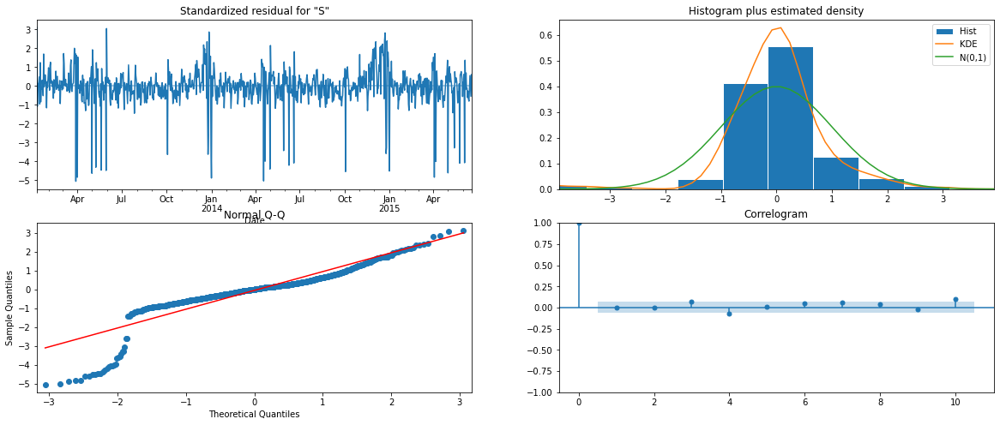

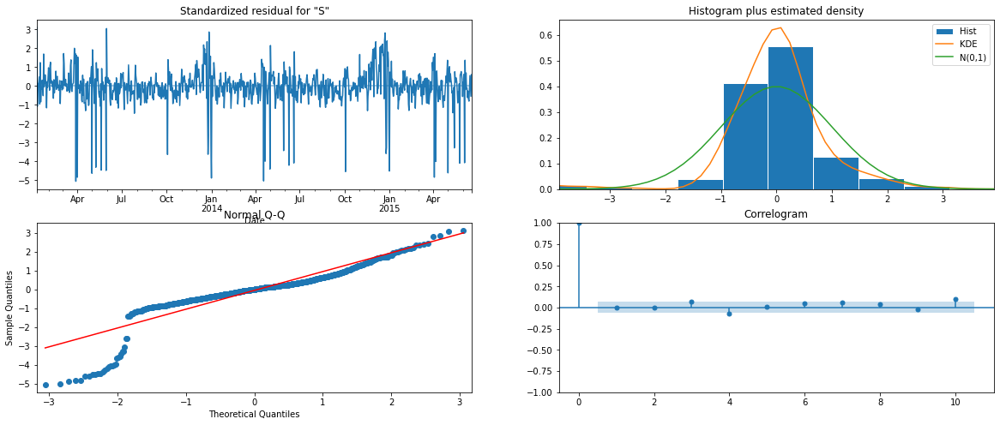

In [838]:
# Plot diagnostics
store1_SARIMA.plot_diagnostics()


According to the plots our model residuals are almost normally distributed also there is no significant correlation in the residuals. So our model is acceptable.


In [839]:
# Define a function to calculate evaluation meterices for model performance
def calculate_metrics(test,prediction,Results,model_name,aic):
    
    plt.figure(figsize=(12,4))
    plt.plot(test, label='Test')
    plt.plot(prediction, label=f'{model_name} forecast')
    plt.legend(loc='best')
    plt.title(f'{model_name} method')
    plt.show()
    
    rmse = np.sqrt(mean_squared_error(test, prediction)).round(2)
    mape = mean_absolute_percentage_error(test ,prediction).round(2)

    Results.loc[len(Results.index)] = [model_name,rmse,mape,aic]
    
    return Results


In [841]:
store1_start = store1_test.index.min()
store1_end = store1_test.index.max()

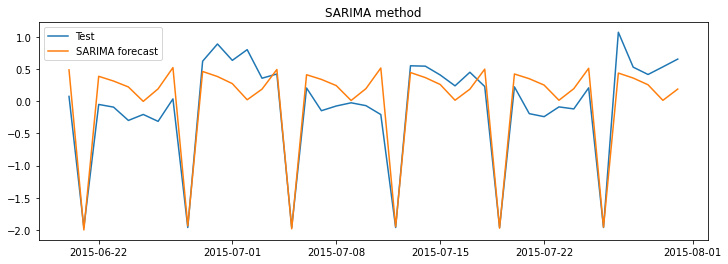

,Model,RMSE,MAPE,AIC
0,SARIMA,0.36,1.77,1515.620431


In [842]:
#Now let's calculate RMSE and MAPE score
# Create a results dataframe
Results_store1 = pd.DataFrame(columns=['Model', 'RMSE' ,'MAPE','AIC'])

calculate_metrics(store1_test.Sales,store1_SARIMA.predict(store1_start,store1_end),Results_store1,'SARIMA',store1_SARIMA.aic)



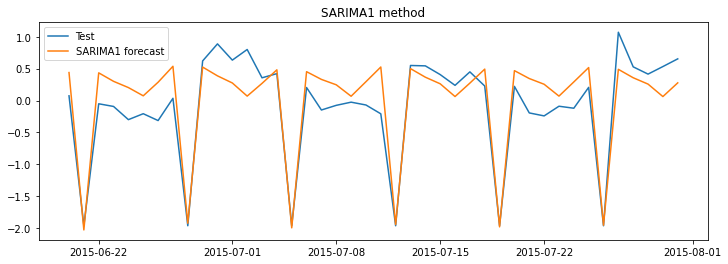

,Model,RMSE,MAPE,AIC
0,SARIMA,0.36,1.77,1515.620431
1,SARIMA1,0.36,1.91,1515.046893


In [843]:
calculate_metrics(store1_test.Sales,store1_SARIMA1.predict(store1_start,store1_end),Results_store1,'SARIMA1',store1_SARIMA1.aic)


#### 2.6 Build SARIMAX model with exogenous variable


In [844]:

print(list(store1_train.columns))


['Sales', 'Customers', 'Open', 'Promo', 'StateHoliday', 'SchoolHoliday', 1, 2, 3, 4, 5, 6, 7]


In [847]:
store1_SARIMAX = SARIMAX(store1_train.Sales,
                                order=(2, 0, 2),
                                seasonal_order=(0, 1, 1, 7),
                         exog=store1_train[['Open', 'Promo', 'StateHoliday', 'SchoolHoliday', 1, 2, 3, 4, 5, 6, 7]])
            

store1_SARIMAX = store1_SARIMAX.fit(max_iter=1000)
store1_SARIMAX.summary()

/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


<class 'statsmodels.iolib.summary.Summary'>
"""
                                      SARIMAX Results                                      
===========================================================================================
Dep. Variable:                               Sales   No. Observations:                  900
Model:             SARIMAX(2, 0, 2)x(0, 1, [1], 7)   Log Likelihood                -175.427
Date:                             Tue, 06 Sep 2022   AIC                            384.854
Time:                                     23:52:39   BIC                            466.362
Sample:                                 01-01-2013   HQIC                           416.003
                                      - 06-19-2015                                         
Covariance Type:                               opg                                         
=================================================================================
                    coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------
Open              1.2342      0.022     56.991      0.000       1.192       1.277
Promo             0.6038      0.026     22.889      0.000       0.552       0.655
StateHoliday     -1.2516      0.022    -57.793      0.000      -1.294      -1.209
SchoolHoliday     0.0319      0.037      0.854      0.393      -0.041       0.105
1             -1.779e-06   1.13e-10  -1.58e+04      0.000   -1.78e-06   -1.78e-06
2             -1.062e-06   8.12e-11  -1.31e+04      0.000   -1.06e-06   -1.06e-06
3             -2.454e-06   4.18e-11  -5.88e+04      0.000   -2.45e-06   -2.45e-06
4              3.246e-07   2.66e-11   1.22e+04      0.000    3.24e-07    3.25e-07
5                6.2e-07   6.92e-11   8966.028      0.000     6.2e-07     6.2e-07
6              1.526e-06   5.79e-11   2.63e+04      0.000    1.53e-06    1.53e-06
7               1.38e-06   3.45e-11      4e+04      0.000    1.38e-06    1.38e-06
ar.L1             0.0532      0.069      0.769      0.442      -0.082       0.189
ar.L2             0.8109      0.061     13.355      0.000       0.692       0.930
ma.L1             0.2585      0.073      3.548      0.000       0.116       0.401
ma.L2            -0.6082      0.044    -13.944      0.000      -0.694      -0.523
ma.S.L7          -0.9866      0.014    -71.365      0.000      -1.014      -0.959
sigma2            0.0830      0.003     27.657      0.000       0.077       0.089
===================================================================================
Ljung-Box (L1) (Q):                   1.27   Jarque-Bera (JB):               179.15
Prob(Q):                              0.26   Prob(JB):                         0.00
Heteroskedasticity (H):               1.36   Skew:                             0.06
Prob(H) (two-sided):                  0.01   Kurtosis:                         5.19
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
[2] Covariance matrix is singular or near-singular, with condition number 1.96e+34. Standard errors may be unstable.
"""

In [848]:
# AIC has improved . Remove SchoolHoliday as its insignificant and then rebuild model
store1_SARIMAX1 = SARIMAX(store1_train.Sales,
                                order=(2, 0, 2),
                                seasonal_order=(0, 1, 1, 7),
                         exog=store1_train[['Open', 'Promo', 'StateHoliday', 1, 2, 3, 4, 5, 6, 7]])
            

store1_SARIMAX1 = store1_SARIMAX1.fit(max_iter=1000)
store1_SARIMAX1.summary()

/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


<class 'statsmodels.iolib.summary.Summary'>
"""
                                      SARIMAX Results                                      
===========================================================================================
Dep. Variable:                               Sales   No. Observations:                  900
Model:             SARIMAX(2, 0, 2)x(0, 1, [1], 7)   Log Likelihood                -175.089
Date:                             Tue, 06 Sep 2022   AIC                            382.178
Time:                                     23:54:13   BIC                            458.892
Sample:                                 01-01-2013   HQIC                           411.494
                                      - 06-19-2015                                         
Covariance Type:                               opg                                         
================================================================================
                   coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------
Open             1.2168      0.022     55.592      0.000       1.174       1.260
Promo            0.5989      0.027     22.509      0.000       0.547       0.651
StateHoliday    -1.2607      0.022    -57.599      0.000      -1.304      -1.218
1            -4.758e-06   1.22e-10  -3.89e+04      0.000   -4.76e-06   -4.76e-06
2             -2.99e-06   3.23e-11  -9.26e+04      0.000   -2.99e-06   -2.99e-06
3            -6.685e-06   3.32e-11  -2.01e+05      0.000   -6.68e-06   -6.68e-06
4             5.351e-07   1.05e-11   5.11e+04      0.000    5.35e-07    5.35e-07
5             1.336e-06   8.83e-11   1.51e+04      0.000    1.34e-06    1.34e-06
6             3.567e-06   3.16e-11   1.13e+05      0.000    3.57e-06    3.57e-06
7             3.457e-06    3.3e-11   1.05e+05      0.000    3.46e-06    3.46e-06
ar.L1            0.0314      0.059      0.536      0.592      -0.084       0.146
ar.L2            0.8164      0.051     15.964      0.000       0.716       0.917
ma.L1            0.2897      0.063      4.571      0.000       0.166       0.414
ma.L2           -0.5996      0.040    -15.051      0.000      -0.678      -0.522
ma.S.L7         -0.9698      0.013    -76.758      0.000      -0.995      -0.945
sigma2           0.0850      0.003     28.372      0.000       0.079       0.091
===================================================================================
Ljung-Box (L1) (Q):                   1.97   Jarque-Bera (JB):               179.25
Prob(Q):                              0.16   Prob(JB):                         0.00
Heteroskedasticity (H):               1.38   Skew:                             0.09
Prob(H) (two-sided):                  0.01   Kurtosis:                         5.19
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
[2] Covariance matrix is singular or near-singular, with condition number 9.17e+35. Standard errors may be unstable.
"""

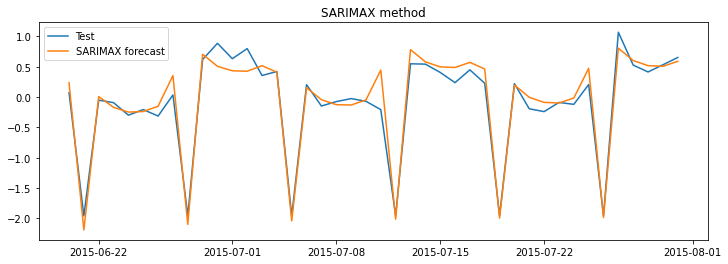

,Model,RMSE,MAPE,AIC
0,SARIMA,0.36,1.77,1515.620431
1,SARIMA1,0.36,1.91,1515.046893
2,SARIMAX,0.19,0.80,382.178300


In [849]:
# Calculate rmse and mape
calculate_metrics(store1_test.Sales,store1_SARIMAX1.predict(store1_start,store1_end,
                exog=store1_test[['Open', 'Promo', 'StateHoliday', 1, 2, 3, 4, 5, 6, 7]]),
                  Results_store1,'SARIMAX',store1_SARIMAX1.aic)


We have the best rmse,mape and aic values.But the weekely peaks are not captured well here. Let's see if the endogenous variable,Customers will help in capturing these peaks.


#### 2.7 Build VARMAX model

##### Cointegration test

As per the adf test both Sales and Customers series are stationary, so we can build VARMAX model. Not building a VAR model because as per the previous model building we know that the exogenous variables helps our forecast models to perform better.

In [850]:
#As per the adf test both Sales and Customers series are stationary, so we can build VARMAX model. Still
#we will execute Johansen's cointegration test.
def joh_output(res):
    output = pd.DataFrame([res.lr2,res.lr1],
                          index=['max_eig_stat',"trace_stat"])
    print(output.T,'\n')
    print("Critical values(90%, 95%, 99%) of max_eig_stat\n",res.cvm,'\n')
    print("Critical values(90%, 95%, 99%) of trace_stat\n",res.cvt,'\n')

In [851]:
joh_model1 = coint_johansen(store_1[['Sales','Customers']],-1,1) # k_ar_diff +1 = K
joh_output(joh_model1)

   max_eig_stat  trace_stat
0    146.624437  179.670326
1     33.045890   33.045890 

Critical values(90%, 95%, 99%) of max_eig_stat
 [[ 9.4748 11.2246 15.0923]
 [ 2.9762  4.1296  6.9406]] 

Critical values(90%, 95%, 99%) of trace_stat
 [[10.4741 12.3212 16.364 ]
 [ 2.9762  4.1296  6.9406]] 



Here the test-statistics at each stage for both trace test and max eigen test are greater than the test statistic at 5% significance level. 
SO THE RANK OF THE MATRIX IS 2 => NO COINTEGRATION => we can build VARMAX


In [852]:
# schoolholiday variable is not included as it turned to be insignificant in previous model
store1_VARMAX = sm.tsa.VARMAX(store1_train[['Sales', 'Customers']], order=(2,2),trend='n',
                              exog=store1_train[['Open', 'Promo', 'StateHoliday', 1, 2, 3, 4, 5, 6, 7]])
store1_VARMAX = store1_VARMAX.fit(maxiter=1000, disp=False)
print(store1_VARMAX.summary())


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/statespace/varmax.py:163: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  EstimationWarning)
/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


                             Statespace Model Results                             
Dep. Variable:     ['Sales', 'Customers']   No. Observations:                  900
Model:                        VARMAX(2,2)   Log Likelihood                 518.165
Date:                    Wed, 07 Sep 2022   AIC                           -958.330
Time:                            00:10:36   BIC                           -771.037
Sample:                        01-01-2013   HQIC                          -886.783
                             - 06-19-2015                                         
Covariance Type:                      opg                                         
Ljung-Box (L1) (Q):             1.68, 0.04   Jarque-Bera (JB):       775.24, 109.40
Prob(Q):                        0.19, 0.84   Prob(JB):                   0.00, 0.00
Heteroskedasticity (H):         1.48, 0.87   Skew:                      0.69, -0.01
Prob(H) (two-sided):            0.00, 0.21   Kurtosis:                   7.33, 4.71


In [853]:
# Try ORDER (3,3)  ALSO
store1_VARMAX1 = sm.tsa.VARMAX(store1_train[['Sales', 'Customers']], order=(3,3),trend='n',
                              exog=store1_train[['Open', 'Promo', 'StateHoliday', 1, 2, 3, 4, 5, 6, 7]])
store1_VARMAX1 = store1_VARMAX1.fit(maxiter=1000, disp=False)
print(store1_VARMAX1.summary())

/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/statespace/varmax.py:163: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  EstimationWarning)
/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


                             Statespace Model Results                             
Dep. Variable:     ['Sales', 'Customers']   No. Observations:                  900
Model:                        VARMAX(3,3)   Log Likelihood                 552.416
Date:                    Wed, 07 Sep 2022   AIC                          -1010.831
Time:                            00:13:42   BIC                           -785.119
Sample:                        01-01-2013   HQIC                          -924.607
                             - 06-19-2015                                         
Covariance Type:                      opg                                         
Ljung-Box (L1) (Q):             0.61, 0.18   Jarque-Bera (JB):        535.58, 92.58
Prob(Q):                        0.43, 0.67   Prob(JB):                   0.00, 0.00
Heteroskedasticity (H):         1.37, 0.86   Skew:                       0.55, 0.00
Prob(H) (two-sided):            0.01, 0.18   Kurtosis:                   6.62, 4.57


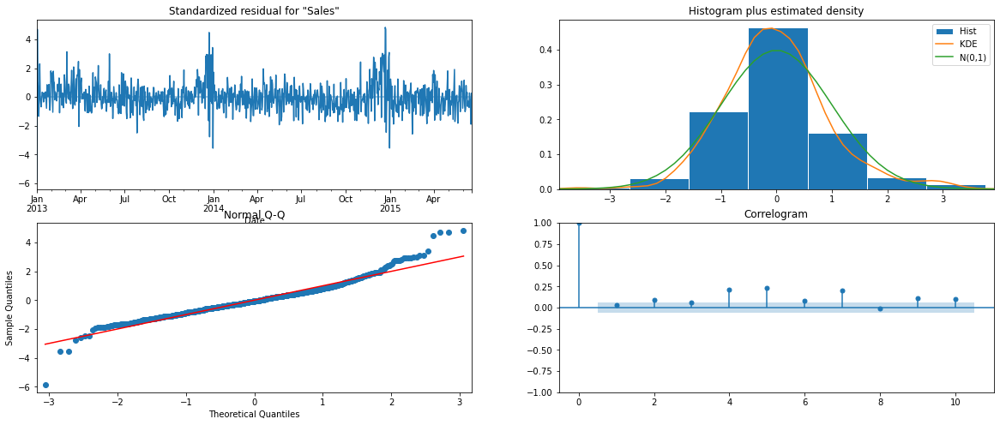

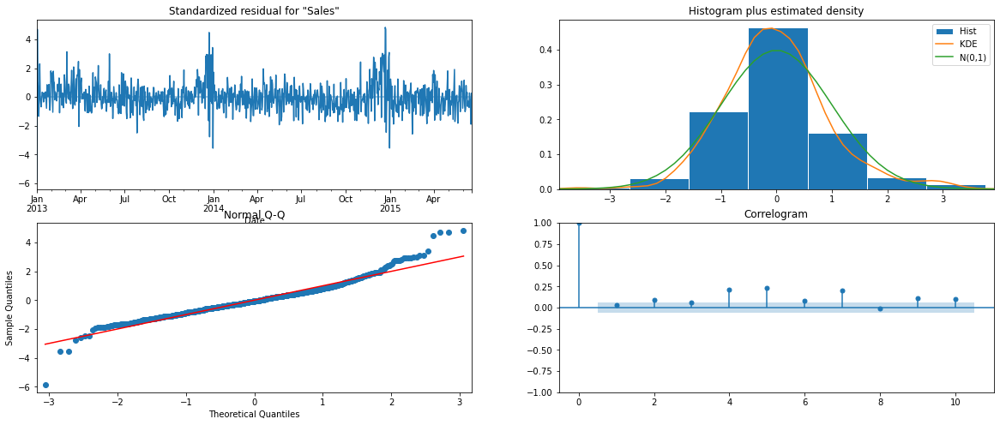

In [854]:
#store1_VARMAX1 HAS BETTER AIC
#plot diagnostics
store1_VARMAX1.plot_diagnostics()


Model seems to be significant

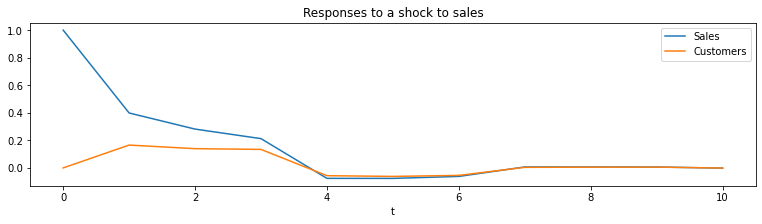

In [857]:
##### Check impluse response function


ax = store1_VARMAX1.impulse_responses(10, orthogonalized=False).plot(figsize=(13,3))
ax.set(xlabel='t', title='Responses to a shock to sales');


As per the model, after 7 lags the values of both sales and customers stabilises.


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/statespace/varmax.py:163: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  EstimationWarning)
/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/statespace/varmax.py:163: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  EstimationWarning)


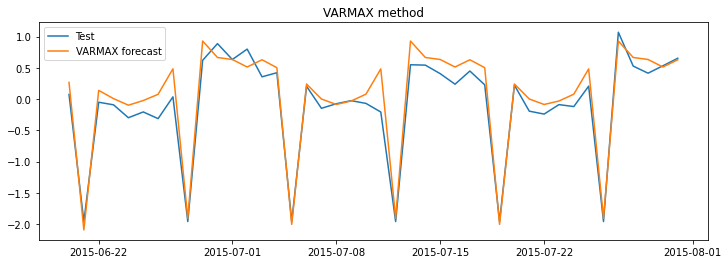

,Model,RMSE,MAPE,AIC
0,SARIMA,0.36,1.77,1515.620431
1,SARIMA1,0.36,1.91,1515.046893
2,SARIMAX,0.19,0.80,382.178300
3,VARMAX,0.22,1.02,-1010.831313


In [859]:
# Calculate rmse and mapre
calculate_metrics(store1_test.Sales,store1_VARMAX1.predict(store1_start,store1_end,
                exog=store1_test[['Open', 'Promo', 'StateHoliday', 1, 2, 3, 4, 5, 6, 7]])['Sales'],
                  Results_store1,'VARMAX',store1_VARMAX1.aic)


For store 1 the best results are given by the SARIMAX model in terms of mape . We can use store1_SARIMAX1 for sales prediction for store 1

In [866]:
coef_df = store1_SARIMAX.params.to_frame()
coef_df.reset_index(inplace=True)

In [868]:
# Check the importance of params
coef_df

,index,0
0,Open,1.234235e+00
1,Promo,6.037660e-01
2,StateHoliday,-1.251593e+00
3,SchoolHoliday,3.186849e-02
4,1,-1.779198e-06
5,2,-1.061879e-06
6,3,-2.453689e-06
7,4,3.245518e-07
8,5,6.200402e-07
9,6,1.525829e-06


## 3. Build model for store3

##### 3.1 Analyse data 

In [37]:
store_3.head(1)

,DayOfWeek,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,Promo2,PromoInterval,CompetitionSince,SaleYear,SaleMonth
Date,,,,,,,,,,,,
2013-01-01,2,0,0,0,0,a,1,1,"Jan,Apr,Jul,Oct",2006-12-01,2013,1


- Store 3 has promotion running in Jan, Apr, Jul and Oct. We will recreate a Promo2 column with a value of 1 in Jan, Apr, Jul and Oct months and rest all values as zero.
- Competition columns can be deleted as it translates to only a single information

In [38]:
store_3.Promo2 = store_3.SaleMonth.apply(lambda x: 1 if x in ([1,4,7,10]) else 0)
store_3.Promo2.value_counts()

0    604
1    338
Name: Promo2, dtype: int64

In [39]:
# set frequency for the dataset
store_3.index.freq = store_3.index.inferred_freq
store_3.index


DatetimeIndex(['2013-01-01', '2013-01-02', '2013-01-03', '2013-01-04',
               '2013-01-05', '2013-01-06', '2013-01-07', '2013-01-08',
               '2013-01-09', '2013-01-10',
               ...
               '2015-07-22', '2015-07-23', '2015-07-24', '2015-07-25',
               '2015-07-26', '2015-07-27', '2015-07-28', '2015-07-29',
               '2015-07-30', '2015-07-31'],
              dtype='datetime64[ns]', name='Date', length=942, freq='D')

In [40]:
store_3.describe(include='all')

,DayOfWeek,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,Promo2,PromoInterval,CompetitionSince,SaleYear,SaleMonth
count,942.000000,942.000000,942.000000,942.000000,942.000000,942,942.000000,942.000000,942,942,942.000000,942.000000
unique,NaN,NaN,NaN,NaN,NaN,4,NaN,NaN,1,1,NaN,NaN
top,NaN,NaN,NaN,NaN,NaN,0,NaN,NaN,"Jan,Apr,Jul,Oct",2006-12-01 00:00:00,NaN,NaN
freq,NaN,NaN,NaN,NaN,NaN,913,NaN,NaN,942,942,NaN,NaN
first,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2006-12-01 00:00:00,NaN,NaN
last,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2006-12-01 00:00:00,NaN,NaN
mean,3.997877,5741.253715,620.286624,0.826964,0.382166,NaN,0.180467,0.358811,NaN,NaN,2013.837580,5.961783
std,1.998404,3298.782559,323.366048,0.378479,0.486175,NaN,0.384780,0.479906,NaN,NaN,0.766009,3.350357
min,1.000000,0.000000,0.000000,0.000000,0.000000,NaN,0.000000,0.000000,NaN,NaN,2013.000000,1.000000
25%,2.000000,4247.500000,475.000000,1.000000,0.000000,NaN,0.000000,0.000000,NaN,NaN,2013.000000,3.000000


In [41]:
# Remove PromoInterval,CompetitionSince columns from store_3 data
store_3.drop(labels=['PromoInterval','CompetitionSince'],axis=1,inplace=True)
store_3.shape

(942, 10)

In [42]:
store_3.StateHoliday.value_counts()


0    913
a     19
b      6
c      4
Name: StateHoliday, dtype: int64

In [43]:

# Check the sales by state holiday
store_3.groupby(by=['StateHoliday'])['Sales'].sum()

StateHoliday
0    5408261
a          0
b          0
c          0
Name: Sales, dtype: int64

In [44]:
#Sales is zero whenever there is a state holiday. So it is better make the variables having only 2 levels,
#1 for  state holiday and 0 for non-holiday.

store_3.StateHoliday= store_3.StateHoliday.apply(lambda x : 0 if x=='0' else 1)

store_3.StateHoliday.value_counts()


0    913
1     29
Name: StateHoliday, dtype: int64

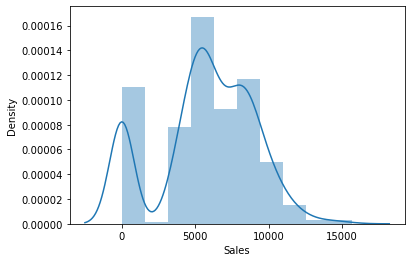

In [45]:
# Check the distribution of sales
sns.distplot(store_3.Sales,bins=10)
plt.show()

Looks like Sales has a right skewed distribution. Also lot of data points are having zero as sales value and that is a valid value as sales will be zero for holidays. Now let's check for outliers



###### Check for outliers


In [46]:
# Check for outliers in sales data
def check_outliers(data):
    for col in data.columns:
        plt.figure(figsize=(8,5))
        sns.boxplot(data[col])
        plt.title(f'Boxplot for {col}')
        plt.show()
        print(f'Quartile values for {col}')
        print(data[col].quantile([.75,.8,.9,.99,.995,.999,1]))


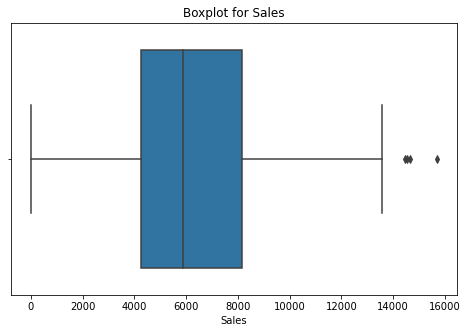

Quartile values for Sales
0.750     8152.750
0.800     8531.200
0.900     9587.300
0.990    12314.280
0.995    13506.220
0.999    14708.478
1.000    15689.000
Name: Sales, dtype: float64


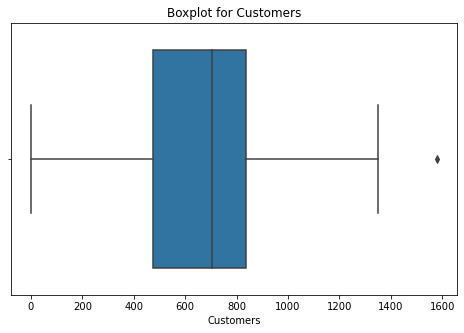

Quartile values for Customers
0.750     834.750
0.800     865.800
0.900     937.000
0.990    1166.180
0.995    1214.310
0.999    1365.393
1.000    1579.000
Name: Customers, dtype: float64


In [47]:
check_outliers(store_3[['Sales','Customers']])


In [48]:
store_3.Sales.quantile(0.995)

13506.219999999996

In [49]:
#For Values > 0.995th percentile value, we can do capping method to set them as 995th percentile value.
store_3.loc[store_3.Sales > store_3.Sales.quantile(0.995),'Sales'] =  store_3.Sales.quantile(0.995)
#For Values > 0.999th percentile value, we can do capping method to set them as 999th percentile value.
store_3.loc[store_3.Customers > store_3.Customers.quantile(0.999),'Customers'] =  store_3.Customers.quantile(0.999)


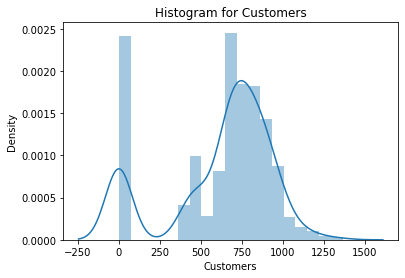

In [50]:
#  plot the distribution after removing outliers
sns.distplot(store_3.Customers)
plt.title('Histogram for Customers')
plt.show()

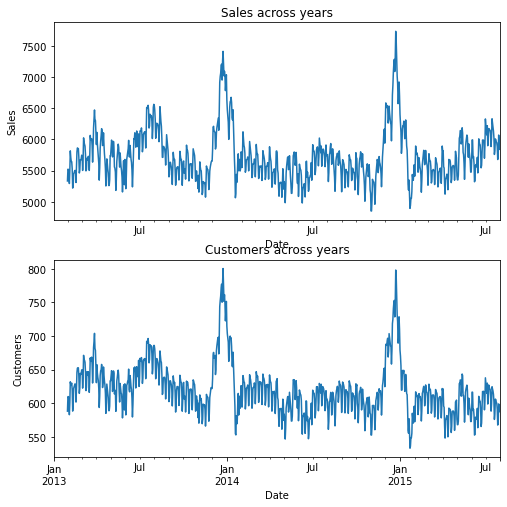

In [47]:
# Plot sales data using a rolling window
plt.figure(figsize=(8,8))
plt.subplot(2,1,1)
plt.title('Sales across years')
store_3.Sales.rolling(30).mean().plot()
plt.xticks([])
plt.ylabel('Sales')

plt.subplot(2,1,2)
plt.title('Customers across years')
store_3.Customers.rolling(30).mean().plot()
plt.xlabel('Date')
plt.ylabel('Customers')
plt.show()

We have two time series here, sales and customers. Sale value is directly proportional to number of customers.
Sales is peaking in December month.


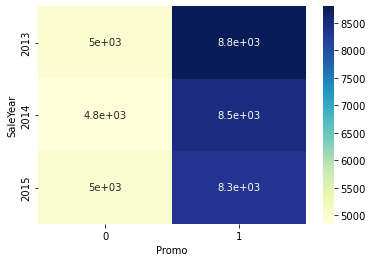

In [48]:
# Relation between sales and Promo
sns.heatmap(store_3.groupby(by=['SaleYear','Promo'])['Sales'].median().unstack(),cmap="YlGnBu",annot=True)
plt.show()

Clearly promotion has a high influence in the sales.


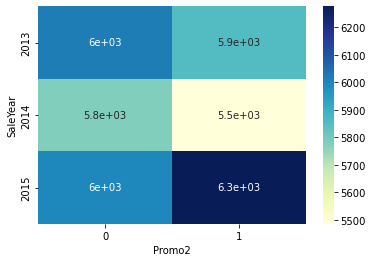

In [49]:
# Relation between sales and Promo
sns.heatmap(store_3.groupby(by=['SaleYear','Promo2'])['Sales'].median().unstack(),cmap="YlGnBu",annot=True)
plt.show()

Promo2 not showing any particular relation with Sales

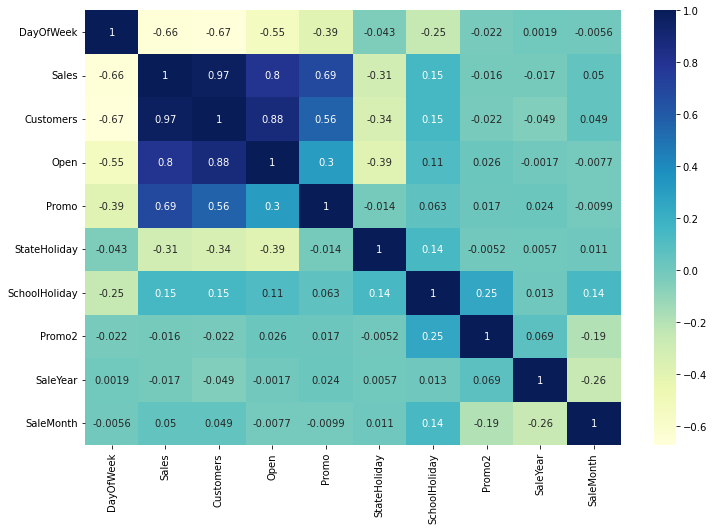

In [50]:
###### Check correlation between data points

store3_corr = store_3.corr()

plt.figure(figsize=(12,8))
sns.heatmap(store3_corr,annot=True,cmap='YlGnBu')
plt.show()


- Sales is having a high correlation with Customers,Open and Promo

##### Preprocess data


In [51]:
# Drop SaleYear and SaleMonth columns
store_3.drop(['SaleYear','SaleMonth'],inplace=True,axis=1)

# Make DayOfWeek as a onehot encoded variable
store_3 = pd.concat([store_3.iloc[:,1:],pd.get_dummies(store_3.DayOfWeek)],axis=1)
store_3.shape

(942, 14)

##### 3.2 Split the data into train and test.
As we need a daily forecast for 6 weeks, we will take last 42 days data as test set and the rest as train set.



In [52]:
store3_train = store_3[:-42].copy()
print('train set shape:',store3_train.shape)
store3_test  = store_3[-42:].copy()
print('test set shape:',store3_test.shape)


train set shape: (900, 14)
test set shape: (42, 14)


##### Standardize train data


In [53]:
# Standardize train data
scaler = StandardScaler()
store3_train[['Sales','Customers']] = scaler.fit_transform(store3_train[['Sales','Customers']])
print(store3_train.head())
store3_test[['Sales','Customers']] = scaler.transform(store3_test[['Sales','Customers']])
print(store3_test.head())

               Sales  Customers  Open  Promo  StateHoliday  SchoolHoliday  \
Date                                                                        
2013-01-01 -1.739291  -1.914050     0      0             1              1   
2013-01-02  0.331877   0.565514     1      0             0              1   
2013-01-03  0.052301   0.306777     1      0             0              1   
2013-01-04  0.102995   0.211290     1      0             0              1   
2013-01-05 -0.366304  -0.296943     1      0             0              0   

            Promo2  1  2  3  4  5  6  7  
Date                                     
2013-01-01       1  0  1  0  0  0  0  0  
2013-01-02       1  0  0  1  0  0  0  0  
2013-01-03       1  0  0  0  1  0  0  0  
2013-01-04       1  0  0  0  0  1  0  0  
2013-01-05       1  0  0  0  0  0  1  0  
               Sales  Customers  Open  Promo  StateHoliday  SchoolHoliday  \
Date                                                                        
2015-06-20 -

##### 3.3 Check stationarity of the series


In [62]:
# Check stationarity of sales series
adf_test(store3_train.Sales) # ADF test--> H0: Not stationary, H1: Is stationary if p<0.05 then reject H0 then series is stationary 
# Check stationarity of Customers series
adf_test(store3_train.Customers)


Sales: ADF test results:
ADF Statistic: -5.764094
p-value: 0.000001
Critical Values:
	1%: -3.438
	5%: -2.865
	10%: -2.569

Customers: ADF test results:
ADF Statistic: -5.488556
p-value: 0.000002
Critical Values:
	1%: -3.438
	5%: -2.865
	10%: -2.569



ADF test: As the p-value is < 0.05 for both sales and customers they are stationary.

##### 3.4 Autocorrelation function (ACF) and Partial autocorrelation function (PACF)
Let's plot ACF to find q value and PACF to know p value

-----ACF and PCF for Sales-------


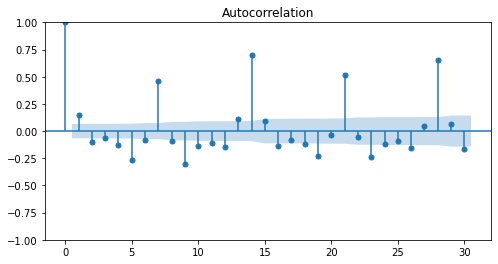

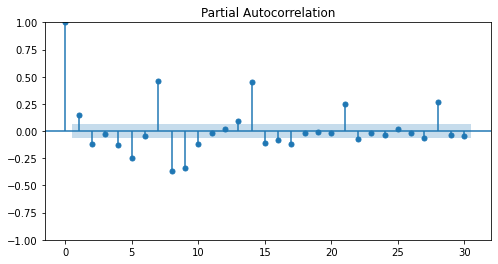

-----ACF and PCF for Customers-------


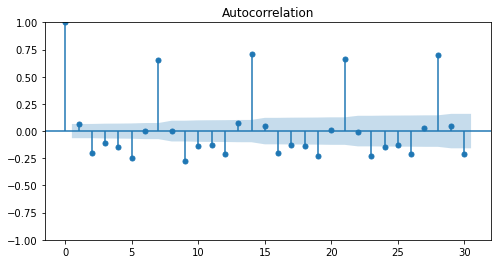

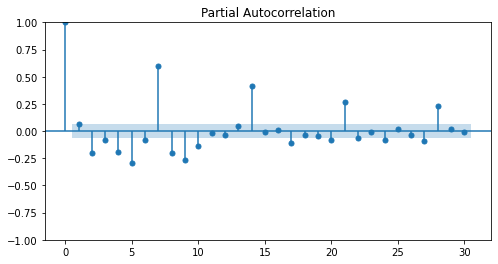

In [63]:
#Plot acf and pacf for store3 sales data
print('-----ACF and PCF for Sales-------')
plot_autocorrelation(store3_train.Sales,30)
print('-----ACF and PCF for Customers-------')
#Plot acf and pacf for customers  data
plot_autocorrelation(store3_train.Customers,30)

There is a weekely spike happening in the acf plot. The same is reflecting in pacf plot as well, so s can be taken as 7.


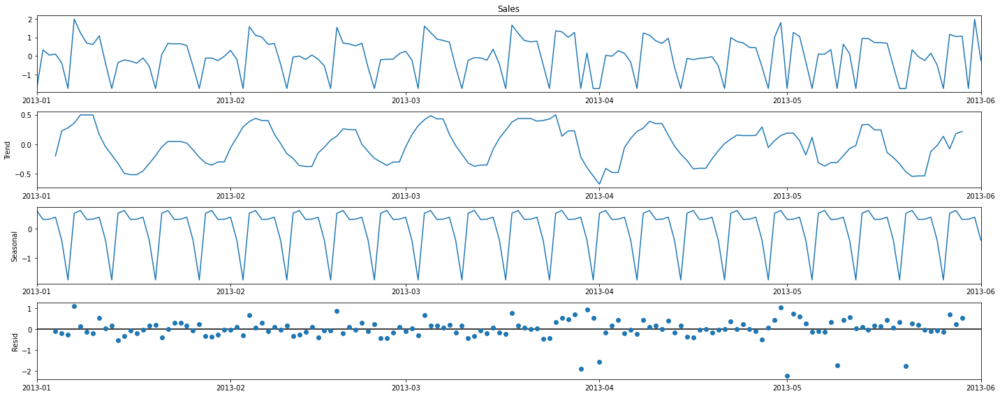

In [64]:
# Let's try to decompose the data to identify if there are any seasonal components
from pylab import rcParams
import statsmodels.api as sm
rcParams['figure.figsize'] = 20, 8
decomposition = sm.tsa.seasonal_decompose(store3_train.Sales[:'2013-06-01'], model='additive') # additive seasonal index
fig = decomposition.plot()
plt.show()

Clearly the series is random and the values are fluctuating throughout the year. The peaks come after 7 days.

In [68]:
# Create start and end indexes
store3_start = store3_test.index.min()
store3_end = store3_test.index.max()

#### 3.5 Build SARIMA model


As the acf and pacf plots are showing significant correlations for higher orders we will try few values for p and q and then go with the model with least AIC values.

In [82]:
# Create combinations for lag and ma orderes for both seasonal and non seasonal components
p = q = range(0, 3)
d = range(0, 1)
pdq = list(itertools.product(p, d, q))
p = q = range(0, 2)
d = range(0, 2)
seasonal_pdq = [(x[0], x[1], x[2], 7) for x in list(itertools.product(p, d, q))]

print('Examples of parameter combinations for Seasonal ARIMA...')
print('SARIMAX: {} x {}'.format(pdq[1], seasonal_pdq[1]))
print('SARIMAX: {} x {}'.format(pdq[1], seasonal_pdq[2]))
print('SARIMAX: {} x {}'.format(pdq[2], seasonal_pdq[3]))
print('SARIMAX: {} x {}'.format(pdq[2], seasonal_pdq[4]))

Examples of parameter combinations for Seasonal ARIMA...
SARIMAX: (0, 0, 1) x (0, 0, 1, 7)
SARIMAX: (0, 0, 1) x (0, 1, 0, 7)
SARIMAX: (0, 0, 2) x (0, 1, 1, 7)
SARIMAX: (0, 0, 2) x (1, 0, 0, 7)


In [83]:
for param in pdq:
    for param_seasonal in seasonal_pdq:
        try:
            model = SARIMAX(store3_train.Sales,
                            order=param,
                            seasonal_order=param_seasonal)
    

            results = model.fit()

            print('ARIMA{}x{}7 - AIC:{}'.format(param, param_seasonal, results.aic))
        except:
            continue

ARIMA(0, 0, 0)x(0, 0, 0, 7)7 - AIC:2556.0893597684108
ARIMA(0, 0, 0)x(0, 0, 1, 7)7 - AIC:2462.940425162534
ARIMA(0, 0, 0)x(0, 1, 0, 7)7 - AIC:2595.9255006958065
ARIMA(0, 0, 0)x(0, 1, 1, 7)7 - AIC:1758.4727714720073
ARIMA(0, 0, 0)x(1, 0, 0, 7)7 - AIC:2341.583096624766
ARIMA(0, 0, 0)x(1, 0, 1, 7)7 - AIC:1776.8318907944893
ARIMA(0, 0, 0)x(1, 1, 0, 7)7 - AIC:1935.8396254771194
ARIMA(0, 0, 0)x(1, 1, 1, 7)7 - AIC:1651.494383775595
ARIMA(0, 0, 1)x(0, 0, 0, 7)7 - AIC:2532.871576371383
ARIMA(0, 0, 1)x(0, 0, 1, 7)7 - AIC:2411.9717627779705
ARIMA(0, 0, 1)x(0, 1, 0, 7)7 - AIC:2475.3745417123596
ARIMA(0, 0, 1)x(0, 1, 1, 7)7 - AIC:1684.8894817800422
ARIMA(0, 0, 1)x(1, 0, 0, 7)7 - AIC:2257.2245313100148
ARIMA(0, 0, 1)x(1, 0, 1, 7)7 - AIC:1703.3419776124033
ARIMA(0, 0, 1)x(1, 1, 0, 7)7 - AIC:1907.7895206098265
ARIMA(0, 0, 1)x(1, 1, 1, 7)7 - AIC:1613.534963958206
ARIMA(0, 0, 2)x(0, 0, 0, 7)7 - AIC:2527.100192132558
ARIMA(0, 0, 2)x(0, 0, 1, 7)7 - AIC:2412.1318718359043
ARIMA(0, 0, 2)x(0, 1, 0, 7)7 - AIC

/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(0, 0, 2)x(1, 0, 1, 7)7 - AIC:1667.7639138137886
ARIMA(0, 0, 2)x(1, 1, 0, 7)7 - AIC:1881.329243140256
ARIMA(0, 0, 2)x(1, 1, 1, 7)7 - AIC:1599.4619340760983
ARIMA(1, 0, 0)x(0, 0, 0, 7)7 - AIC:2538.1213204345895
ARIMA(1, 0, 0)x(0, 0, 1, 7)7 - AIC:2409.6874145044103
ARIMA(1, 0, 0)x(0, 1, 0, 7)7 - AIC:2406.8519309565863
ARIMA(1, 0, 0)x(0, 1, 1, 7)7 - AIC:1654.5907475682525
ARIMA(1, 0, 0)x(1, 0, 0, 7)7 - AIC:2224.489653280384
ARIMA(1, 0, 0)x(1, 0, 1, 7)7 - AIC:1673.5882134817602
ARIMA(1, 0, 0)x(1, 1, 0, 7)7 - AIC:1896.7983693860172
ARIMA(1, 0, 0)x(1, 1, 1, 7)7 - AIC:1601.3152697807632
ARIMA(1, 0, 1)x(0, 0, 0, 7)7 - AIC:2522.430688711029
ARIMA(1, 0, 1)x(0, 0, 1, 7)7 - AIC:2411.6397441787444
ARIMA(1, 0, 1)x(0, 1, 0, 7)7 - AIC:2388.3997270014233
ARIMA(1, 0, 1)x(0, 1, 1, 7)7 - AIC:1638.7118881949282
ARIMA(1, 0, 1)x(1, 0, 0, 7)7 - AIC:2215.9290698770055


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(1, 0, 1)x(1, 0, 1, 7)7 - AIC:1658.1659541971144
ARIMA(1, 0, 1)x(1, 1, 0, 7)7 - AIC:1881.1910219885372
ARIMA(1, 0, 1)x(1, 1, 1, 7)7 - AIC:1588.58451116494
ARIMA(1, 0, 2)x(0, 0, 0, 7)7 - AIC:2498.905984214539
ARIMA(1, 0, 2)x(0, 0, 1, 7)7 - AIC:2413.6373886189367
ARIMA(1, 0, 2)x(0, 1, 0, 7)7 - AIC:2353.8740509914364
ARIMA(1, 0, 2)x(0, 1, 1, 7)7 - AIC:1625.9436990695347
ARIMA(1, 0, 2)x(1, 0, 0, 7)7 - AIC:2202.402186166657


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(1, 0, 2)x(1, 0, 1, 7)7 - AIC:1645.8470489312735
ARIMA(1, 0, 2)x(1, 1, 0, 7)7 - AIC:1870.5393395150659
ARIMA(1, 0, 2)x(1, 1, 1, 7)7 - AIC:1584.7734748592122
ARIMA(2, 0, 0)x(0, 0, 0, 7)7 - AIC:2526.6243282410373
ARIMA(2, 0, 0)x(0, 0, 1, 7)7 - AIC:2411.636936473252
ARIMA(2, 0, 0)x(0, 1, 0, 7)7 - AIC:2371.3944112308513
ARIMA(2, 0, 0)x(0, 1, 1, 7)7 - AIC:1630.6610880707406
ARIMA(2, 0, 0)x(1, 0, 0, 7)7 - AIC:2209.238037277514
ARIMA(2, 0, 0)x(1, 0, 1, 7)7 - AIC:1650.3991764491955
ARIMA(2, 0, 0)x(1, 1, 0, 7)7 - AIC:1873.36704751509
ARIMA(2, 0, 0)x(1, 1, 1, 7)7 - AIC:1586.8722480476947
ARIMA(2, 0, 1)x(0, 0, 0, 7)7 - AIC:2497.0102766427817
ARIMA(2, 0, 1)x(0, 0, 1, 7)7 - AIC:2359.050274899994
ARIMA(2, 0, 1)x(0, 1, 0, 7)7 - AIC:2370.295480854509
ARIMA(2, 0, 1)x(0, 1, 1, 7)7 - AIC:1632.6300714586266
ARIMA(2, 0, 1)x(1, 0, 0, 7)7 - AIC:2210.4014810377353


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(2, 0, 1)x(1, 0, 1, 7)7 - AIC:1652.38454464854
ARIMA(2, 0, 1)x(1, 1, 0, 7)7 - AIC:1874.5586651512451
ARIMA(2, 0, 1)x(1, 1, 1, 7)7 - AIC:1587.3412888411235
ARIMA(2, 0, 2)x(0, 0, 0, 7)7 - AIC:2504.3274082146854
ARIMA(2, 0, 2)x(0, 0, 1, 7)7 - AIC:2415.3112094143007
ARIMA(2, 0, 2)x(0, 1, 0, 7)7 - AIC:2137.1579657764
ARIMA(2, 0, 2)x(0, 1, 1, 7)7 - AIC:1519.1914533407937
ARIMA(2, 0, 2)x(1, 0, 0, 7)7 - AIC:2006.2274400351132


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(2, 0, 2)x(1, 0, 1, 7)7 - AIC:1538.5266093446567
ARIMA(2, 0, 2)x(1, 1, 0, 7)7 - AIC:1833.5003082628186
ARIMA(2, 0, 2)x(1, 1, 1, 7)7 - AIC:1517.863783293688


ARIMA(2, 0, 2)x(1, 1, 1, 7) is giving an aic of 2. Let's build ARIMA(2, 0, 2)x(1, 1, 1, 7) and see the rmse and mape scores for the same.

In [88]:
store3_SARIMA = SARIMAX(store3_train.Sales,
                                order=(2, 0, 2),
                                seasonal_order=(1, 1, 1, 7))
            

store3_SARIMA = store3_SARIMA.fit()
store3_SARIMA.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                      SARIMAX Results                                      
===========================================================================================
Dep. Variable:                               Sales   No. Observations:                  900
Model:             SARIMAX(2, 0, 2)x(1, 1, [1], 7)   Log Likelihood                -751.932
Date:                             Mon, 05 Sep 2022   AIC                           1517.864
Time:                                     13:35:46   BIC                           1551.426
Sample:                                 01-01-2013   HQIC                          1530.690
                                      - 06-19-2015                                         
Covariance Type:                               opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          1.7366      0.019     91.470      0.000       1.699       1.774
ar.L2         -0.9342      0.018    -50.551      0.000      -0.970      -0.898
ma.L1         -1.5518      0.027    -57.789      0.000      -1.604      -1.499
ma.L2          0.7820      0.026     29.849      0.000       0.731       0.833
ar.S.L7       -0.0651      0.036     -1.790      0.073      -0.136       0.006
ma.S.L7       -0.9990      0.141     -7.062      0.000      -1.276      -0.722
sigma2         0.3029      0.041      7.410      0.000       0.223       0.383
===================================================================================
Ljung-Box (L1) (Q):                   0.46   Jarque-Bera (JB):              1710.65
Prob(Q):                              0.50   Prob(JB):                         0.00
Heteroskedasticity (H):               1.28   Skew:                            -1.30
Prob(H) (two-sided):                  0.03   Kurtosis:                         9.27
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

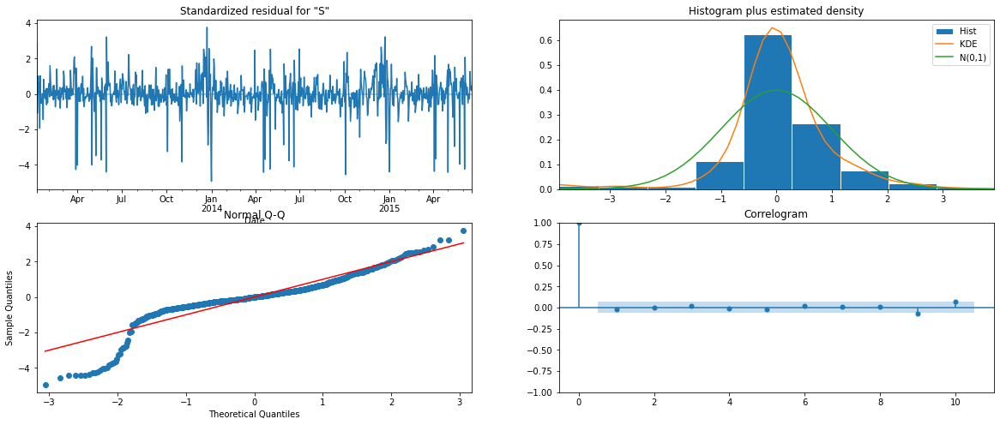

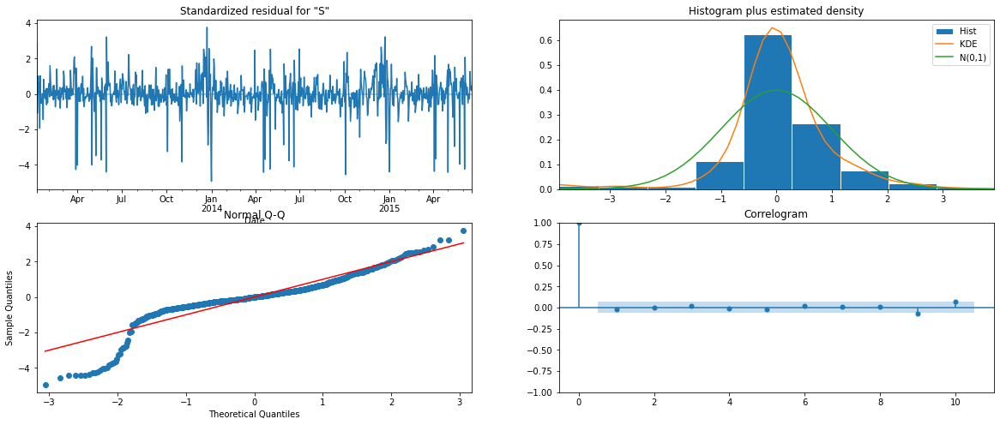

In [96]:
# Plot diagnostics
store3_SARIMA.plot_diagnostics()

According to the plots our model residuals are almost normally distributed also there is no significant correlation in the residuals. So our model is acceptable.

In [89]:
#Now let's calculate RMSE and MAPE score
# Create a results dataframe
Results_store3 = pd.DataFrame(columns=['Model', 'RMSE' ,'MAPE','AIC'])

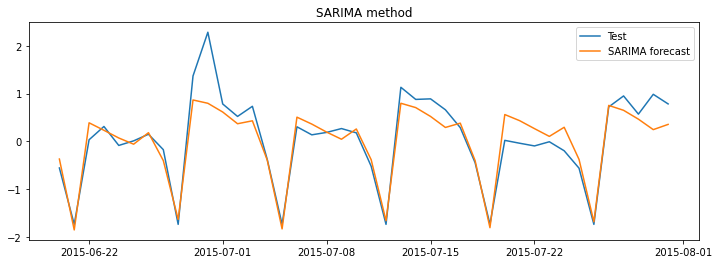

,Model,RMSE,MAPE,AIC
0,SARIMA,0.35,2.13,1517.863783


In [90]:
calculate_metrics(store3_test.Sales,store3_SARIMA.predict(store3_start,store3_end),Results_store3,'SARIMA',store3_SARIMA.aic)


#### 3.6 Build SARIMAX model with exogenous variable

In [104]:
print(list(store3_train.columns))

['Sales', 'Customers', 'Open', 'Promo', 'StateHoliday', 'SchoolHoliday', 'Promo2', 1, 2, 3, 4, 5, 6, 7]


In [105]:
store3_SARIMAX = SARIMAX(store3_train.Sales,
                                order=(2, 0, 2),
                                seasonal_order=(1, 1, 1, 7),
                         exog=store3_train[['Open', 'Promo', 'StateHoliday', 'SchoolHoliday', 'Promo2', 1, 2, 3, 4, 5, 6, 7]])
            

store3_SARIMAX = store3_SARIMAX.fit()
store3_SARIMAX.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                      SARIMAX Results                                      
===========================================================================================
Dep. Variable:                               Sales   No. Observations:                  900
Model:             SARIMAX(2, 0, 2)x(1, 1, [1], 7)   Log Likelihood                -209.547
Date:                             Mon, 05 Sep 2022   AIC                            457.094
Time:                                     13:48:51   BIC                            548.191
Sample:                                 01-01-2013   HQIC                           491.907
                                      - 06-19-2015                                         
Covariance Type:                               opg                                         
=================================================================================
                    coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------
Open              1.1127      0.020     56.139      0.000       1.074       1.152
Promo             0.9116      0.028     33.052      0.000       0.858       0.966
StateHoliday     -1.1148      0.020    -56.242      0.000      -1.154      -1.076
SchoolHoliday     0.1212      0.039      3.107      0.002       0.045       0.198
Promo2           -0.1131      0.041     -2.772      0.006      -0.193      -0.033
1             -5.268e-07   2.57e-09   -204.669      0.000   -5.32e-07   -5.22e-07
2              -1.49e-07   2.42e-09    -61.581      0.000   -1.54e-07   -1.44e-07
3             -1.666e-07    2.2e-09    -75.593      0.000   -1.71e-07   -1.62e-07
4             -6.121e-09   2.26e-09     -2.714      0.007   -1.05e-08    -1.7e-09
5              5.276e-08   1.84e-09     28.652      0.000    4.92e-08    5.64e-08
6              2.718e-08   2.21e-09     12.307      0.000    2.29e-08    3.15e-08
7              6.058e-08   2.19e-09     27.644      0.000    5.63e-08    6.49e-08
ar.L1             0.0036      0.114      0.032      0.975      -0.220       0.228
ar.L2             0.8223      0.100      8.186      0.000       0.625       1.019
ma.L1             0.2139      0.116      1.841      0.066      -0.014       0.442
ma.L2            -0.6546      0.079     -8.304      0.000      -0.809      -0.500
ar.S.L7          -0.0530      0.028     -1.863      0.063      -0.109       0.003
ma.S.L7          -0.9942      0.026    -38.886      0.000      -1.044      -0.944
sigma2            0.0906      0.003     26.742      0.000       0.084       0.097
===================================================================================
Ljung-Box (L1) (Q):                   1.35   Jarque-Bera (JB):               421.03
Prob(Q):                              0.25   Prob(JB):                         0.00
Heteroskedasticity (H):               1.29   Skew:                             0.61
Prob(H) (two-sided):                  0.03   Kurtosis:                         6.14
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
[2] Covariance matrix is singular or near-singular, with condition number 1.01e+32. Standard errors may be unstable.
"""

We have an improved model with lesser aic and almost all variables are significant here

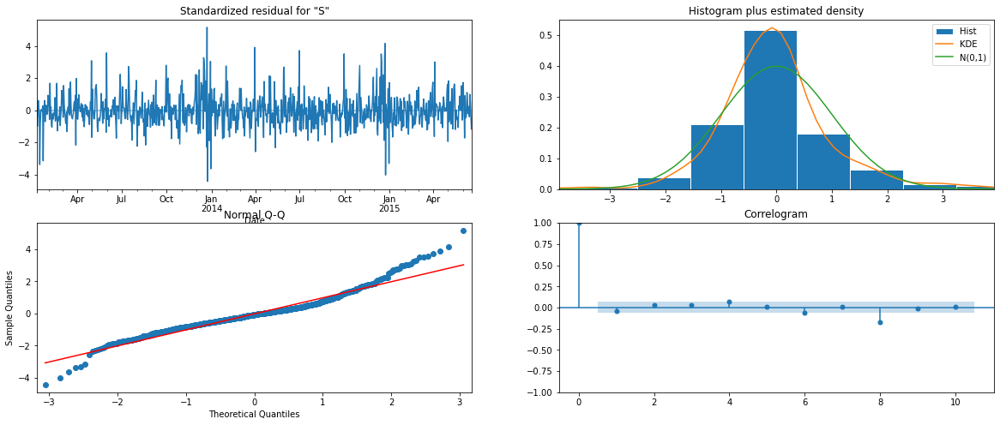

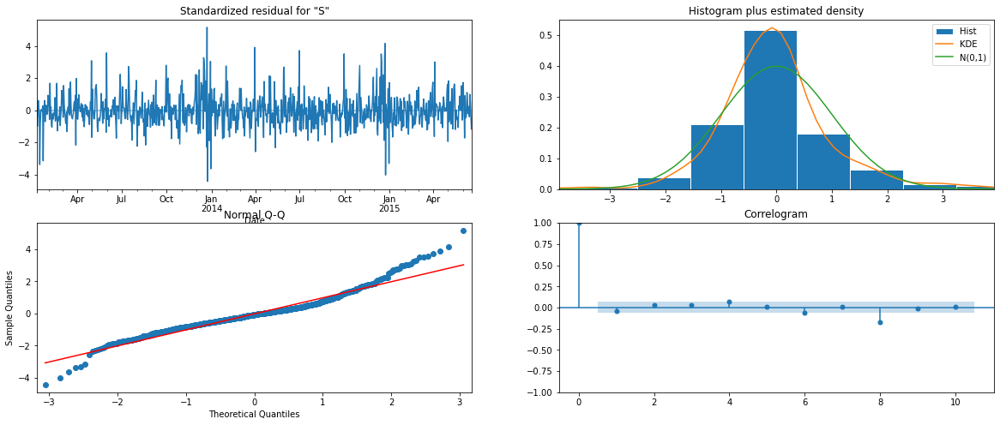

In [107]:
# Plot diagnostics
store3_SARIMAX.plot_diagnostics()

Residuals are normaly distributed.

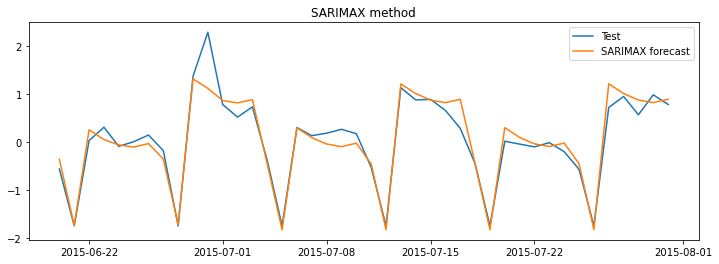

,Model,RMSE,MAPE,AIC
0,SARIMA,0.35,2.13,1517.863783
1,SARIMAX,0.26,1.43,457.093772


In [110]:
# Calculate rmse and mape
calculate_metrics(store3_test.Sales,store3_SARIMAX.predict(store3_start,store3_end,
                exog=store3_test[['Open', 'Promo', 'StateHoliday', 'SchoolHoliday', 'Promo2', 1, 2, 3, 4, 5, 6, 7]]),
                  Results_store3,'SARIMAX',store3_SARIMAX.aic)

We have an improved rmse and mape values but the weekely peaks are not captured well here.

#### 3.7 Build VARMAX model with exogenous variable

From the previously run adf test we know that both Sales and Customers time serieses are stationary and they move together. So let's build a VARMAX model this time

In [121]:
store3_VARMAX = sm.tsa.VARMAX(store3_train[['Sales', 'Customers']], order=(2,2),trend='n',
                              exog=store3_train[['Open', 'Promo', 'StateHoliday', 'SchoolHoliday', 'Promo2', 1, 2, 3, 4, 5, 6, 7]])
store3_VARMAX = store3_VARMAX.fit(maxiter=1000, disp=False)
print(store3_VARMAX.summary())


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/statespace/varmax.py:163: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  EstimationWarning)


                             Statespace Model Results                             
Dep. Variable:     ['Sales', 'Customers']   No. Observations:                  900
Model:                        VARMAX(2,2)   Log Likelihood                 530.835
Date:                    Mon, 05 Sep 2022   AIC                           -975.671
Time:                            14:46:09   BIC                           -769.168
Sample:                        01-01-2013   HQIC                          -896.785
                             - 06-19-2015                                         
Covariance Type:                      opg                                         
Ljung-Box (L1) (Q):             0.19, 0.32   Jarque-Bera (JB):      876.20, 1037.13
Prob(Q):                        0.66, 0.57   Prob(JB):                   0.00, 0.00
Heteroskedasticity (H):         1.27, 1.05   Skew:                      0.84, -0.09
Prob(H) (two-sided):            0.04, 0.66   Kurtosis:                   7.54, 8.26


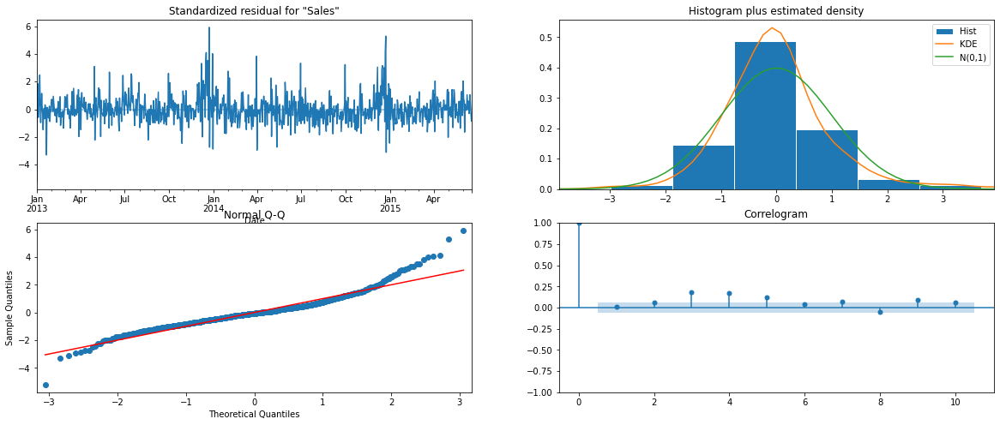

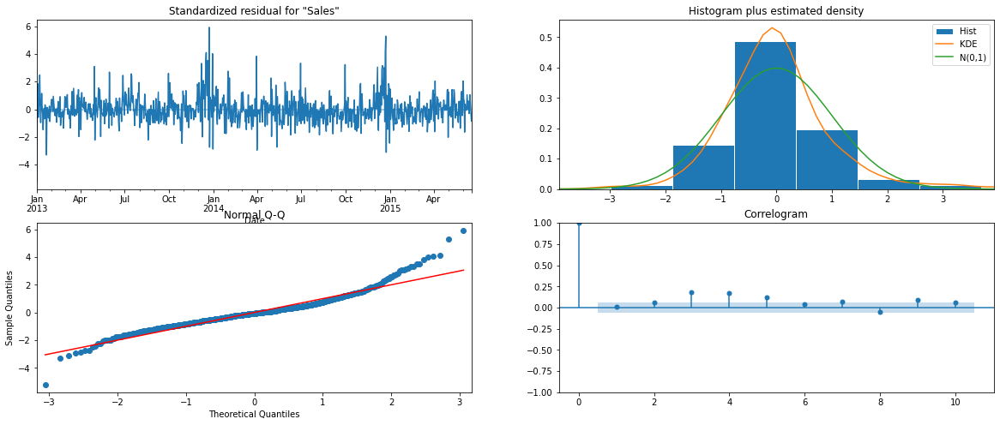

In [133]:
store3_VARMAX.plot_diagnostics()

Residuals are almost normally distributed

##### Check impluse response function


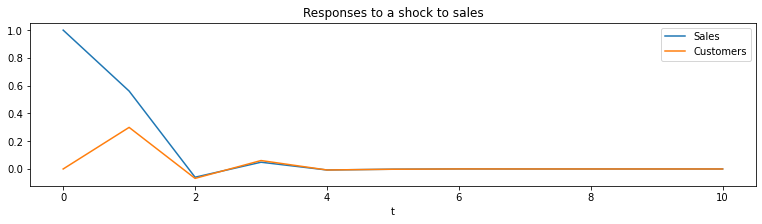

In [256]:
ax = store3_VARMAX.impulse_responses(10, orthogonalized=False).plot(figsize=(13,3))
ax.set(xlabel='t', title='Responses to a shock to sales');


As per the model after 4 lags the values of both sales and customers stabilises.


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/statespace/varmax.py:163: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  EstimationWarning)
/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/statespace/varmax.py:163: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  EstimationWarning)


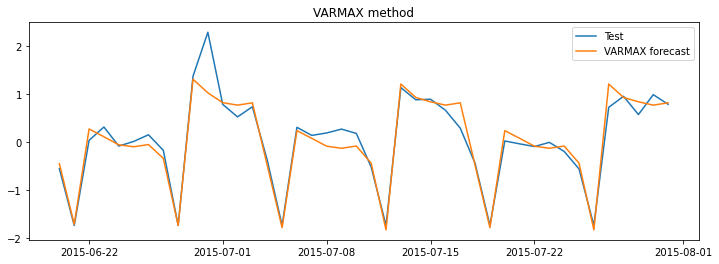

,Model,RMSE,MAPE,AIC
0,SARIMA,0.35,2.13,1517.863783
1,SARIMAX,0.26,1.43,457.093772
2,VARMAX,0.27,1.45,-975.670906


In [143]:
# Calculate rmse and mapre
calculate_metrics(store3_test.Sales,store3_VARMAX.predict(store3_start,store3_end,
                exog=store3_test[['Open', 'Promo', 'StateHoliday', 'SchoolHoliday', 'Promo2', 1, 2, 3, 4, 5, 6, 7]])['Sales'],
                  Results_store3,'VARMAX',store3_VARMAX.aic)

For store 3 the best results are given by the SARIMAX model. We can predict store 3 sales using store3_SARIMAX

## 4. Build model for store 8


##### 4.1 Analyse data 


In [145]:
store_8.head(1)

,DayOfWeek,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,Promo2,PromoInterval,CompetitionSince,SaleYear,SaleMonth
Date,,,,,,,,,,,,
2013-01-01,2,0,0,0,0,a,1,0,NaN,2014-10-01,2013,1


- Store 8 has no promotion 2. We will delete Promo2,PromoInterval columns
- A competiotion column can be created with 0/1 value with value 1 from 2014-10-01 and then delete CompetitionSince

In [146]:
# set frequency for the dataset
store_8.index.freq = store_8.index.inferred_freq
store_8.index

DatetimeIndex(['2013-01-01', '2013-01-02', '2013-01-03', '2013-01-04',
               '2013-01-05', '2013-01-06', '2013-01-07', '2013-01-08',
               '2013-01-09', '2013-01-10',
               ...
               '2015-07-22', '2015-07-23', '2015-07-24', '2015-07-25',
               '2015-07-26', '2015-07-27', '2015-07-28', '2015-07-29',
               '2015-07-30', '2015-07-31'],
              dtype='datetime64[ns]', name='Date', length=942, freq='D')

In [183]:
store_8['Competiotion'] = 0
store_8.loc[store_8.index>=store_8.CompetitionSince,'Competiotion'] =1

In [184]:
store_8['Competiotion'].value_counts()

0    638
1    304
Name: Competiotion, dtype: int64

In [185]:
store_8.describe(include='all')


,DayOfWeek,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,Promo2,PromoInterval,CompetitionSince,SaleYear,SaleMonth,Competiotion
count,942.000000,942.000000,942.000000,942.000000,942.000000,942,942.000000,942.0,0,942,942.000000,942.000000,942.000000
unique,NaN,NaN,NaN,NaN,NaN,4,NaN,NaN,0,1,NaN,NaN,NaN
top,NaN,NaN,NaN,NaN,NaN,0,NaN,NaN,NaN,2014-10-01 00:00:00,NaN,NaN,NaN
freq,NaN,NaN,NaN,NaN,NaN,918,NaN,NaN,NaN,942,NaN,NaN,NaN
first,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2014-10-01 00:00:00,NaN,NaN,NaN
last,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2014-10-01 00:00:00,NaN,NaN,NaN
mean,3.997877,4610.251592,547.799363,0.832272,0.382166,NaN,0.168790,0.0,NaN,NaN,2013.837580,5.961783,0.322718
std,1.998404,2696.883772,293.404732,0.373823,0.486175,NaN,0.374765,0.0,NaN,NaN,0.766009,3.350357,0.467764
min,1.000000,0.000000,0.000000,0.000000,0.000000,NaN,0.000000,0.0,NaN,NaN,2013.000000,1.000000,0.000000
25%,2.000000,2916.750000,374.250000,1.000000,0.000000,NaN,0.000000,0.0,NaN,NaN,2013.000000,3.000000,0.000000


In [187]:
# Remove PromoInterval,CompetitionSince columns from store_8 data
store_8.drop(labels=['Promo2','PromoInterval','CompetitionSince'],axis=1,inplace=True)
store_8.shape


(942, 10)

In [188]:
print(store_8.StateHoliday.value_counts())
# Check the sales by state holiday
store_8.groupby(by=['StateHoliday'])['Sales'].sum()


0    918
a     14
b      6
c      4
Name: StateHoliday, dtype: int64


StateHoliday
0    4342857
a          0
b          0
c          0
Name: Sales, dtype: int64

In [189]:
store_8.StateHoliday= store_8.StateHoliday.apply(lambda x : 0 if x=='0' else 1)

store_8.StateHoliday.value_counts()

0    918
1     24
Name: StateHoliday, dtype: int64

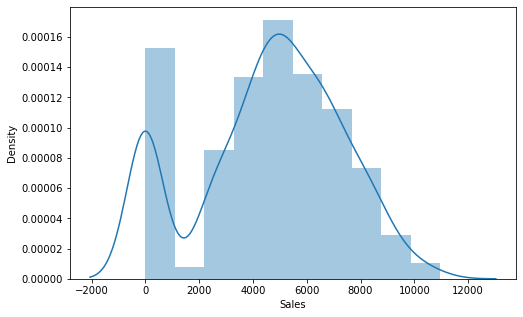

In [193]:
# Check the distribution of sales
plt.figure(figsize=(8,5))
sns.distplot(store_8.Sales,bins=10)
plt.show()

Looks like Sales has a right skewed distribution. Also lot of data points are having zero as sales value and that is a valid value as sales will be zero for holidays. Now let's check for outliers


<Figure size 576x360 with 0 Axes>

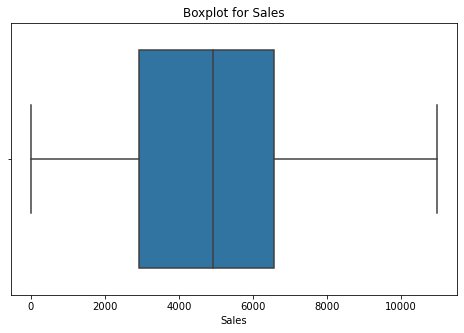

Quartile values for Sales
0.750     6558.000
0.800     6883.600
0.900     7963.800
0.990     9914.040
0.995    10451.080
0.999    10956.885
1.000    10971.000
Name: Sales, dtype: float64


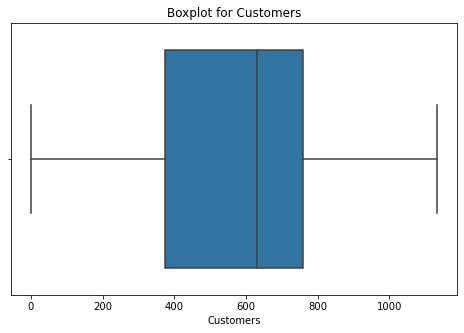

Quartile values for Customers
0.750     759.750
0.800     790.800
0.900     848.900
0.990    1002.770
0.995    1022.770
0.999    1083.127
1.000    1133.000
Name: Customers, dtype: float64


In [51]:
plt.figure(figsize=(8,5))
check_outliers(store_8[['Sales','Customers']])


There are no outliers

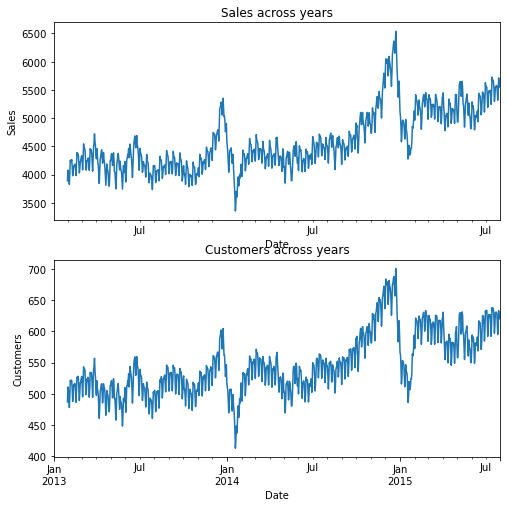

In [197]:
# Plot sales data using a rolling window
plt.figure(figsize=(8,8))
plt.subplot(2,1,1)
plt.title('Sales across years')
store_8.Sales.rolling(30).mean().plot()
plt.xticks([])
plt.ylabel('Sales')

plt.subplot(2,1,2)
plt.title('Customers across years')
store_8.Customers.rolling(30).mean().plot()
plt.xlabel('Date')
plt.ylabel('Customers')
plt.show()

Store 8 Sales and customers are moving together, Clearly both time series have trend

Text(0, 0.5, 'Sales')

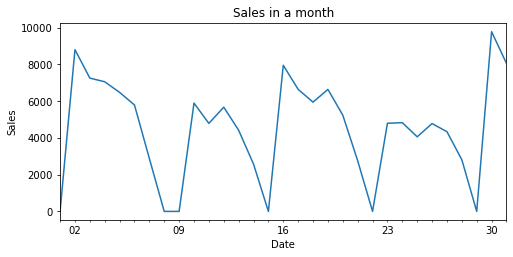

In [221]:
plt.figure(figsize=(8,8))
plt.subplot(2,1,1)
plt.title('Sales in a month')
store_8.Sales['2014-06-01':'2014-07-01'].plot()
plt.xticks([])
plt.ylabel('Sales')

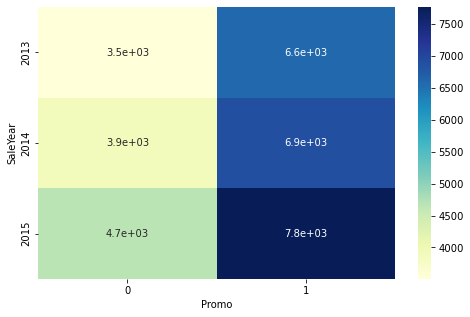

In [199]:
# Relation between sales and Promo
plt.figure(figsize=(8,5))
sns.heatmap(store_8.groupby(by=['SaleYear','Promo'])['Sales'].median().unstack(),cmap="YlGnBu",annot=True)
plt.show()


Clearly promotion has a high influence in the sales.

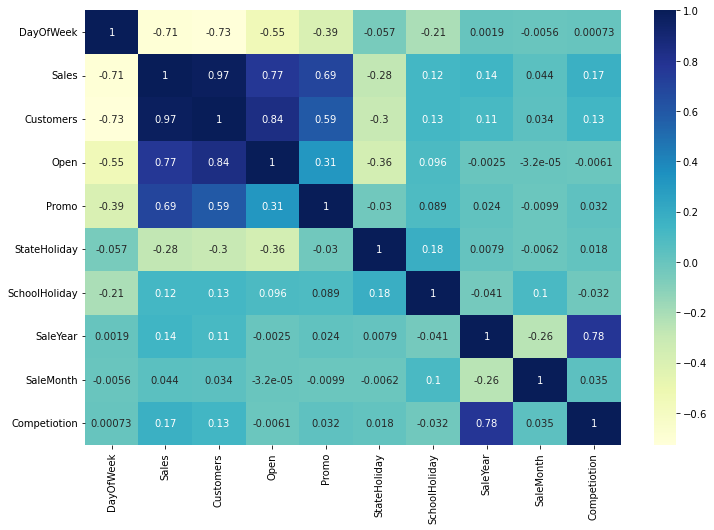

In [201]:
###### Check correlation between data points

store8_corr = store_8.corr()
plt.figure(figsize=(12,8))
sns.heatmap(store8_corr,annot=True,cmap='YlGnBu')
plt.show()

- Sales is highly correlated with Open,Customers,Promo
- Sales has a relation with SaleYear also which indicate a trend across the years.

In [203]:
# Drop SaleYear and SaleMonth columns
store_8.drop(['SaleYear','SaleMonth'],inplace=True,axis=1)

# Make DayOfWeek as a onehot encoded variable
store_8 = pd.concat([store_8.iloc[:,1:],pd.get_dummies(store_8.DayOfWeek)],axis=1)
store_8.shape


(942, 14)

##### 4.2 Split the data into train and test.


In [205]:
store8_train = store_8[:-42].copy()
print('train set shape:',store8_train.shape)
store8_test  = store_8[-42:].copy()
print('test set shape:',store8_test.shape)

train set shape: (900, 14)
test set shape: (42, 14)


In [206]:
# Standardize train data
scaler = StandardScaler()
store8_train[['Sales','Customers']] = scaler.fit_transform(store8_train[['Sales','Customers']])
print(store8_train.head())
store8_test[['Sales','Customers']] = scaler.transform(store8_test[['Sales','Customers']])
print(store8_test.head())

               Sales  Customers  Open  Promo  StateHoliday  SchoolHoliday  \
Date                                                                        
2013-01-01 -1.705264  -1.860670     0      0             1              1   
2013-01-02  0.316273   0.522844     1      0             0              1   
2013-01-03  0.101025   0.399912     1      0             0              1   
2013-01-04 -0.191070  -0.095231     1      0             0              1   
2013-01-05 -0.833456  -0.795260     1      0             0              0   

            Competiotion  1  2  3  4  5  6  7  
Date                                           
2013-01-01             0  0  1  0  0  0  0  0  
2013-01-02             0  0  0  1  0  0  0  0  
2013-01-03             0  0  0  0  1  0  0  0  
2013-01-04             0  0  0  0  0  1  0  0  
2013-01-05             0  0  0  0  0  0  1  0  
               Sales  Customers  Open  Promo  StateHoliday  SchoolHoliday  \
Date                                           

##### 4.3 Check stationarity of the series



In [207]:
# Check stationarity of sales series
adf_test(store8_train.Sales) # ADF test--> H0: Not stationary, H1: Is stationary if p<0.05 then reject H0 then series is stationary 
# Check stationarity of Customers series
adf_test(store8_train.Customers)



Sales: ADF test results:
ADF Statistic: -3.636664
p-value: 0.005098
Critical Values:
	1%: -3.438
	5%: -2.865
	10%: -2.569

Customers: ADF test results:
ADF Statistic: -3.846778
p-value: 0.002463
Critical Values:
	1%: -3.438
	5%: -2.865
	10%: -2.569


ADF test: As the p-value is < 0.05 for both sales and customers they are stationary.


##### 4.4 Autocorrelation function (ACF) and Partial autocorrelation function (PACF)
Let's plot ACF to find q value and PACF to know p value


-----ACF and PCF for Sales-------


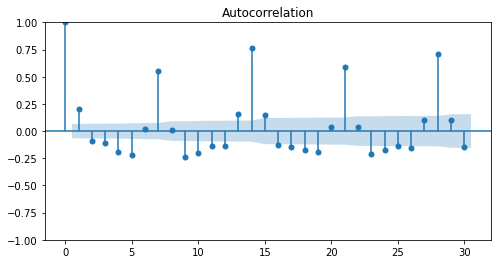

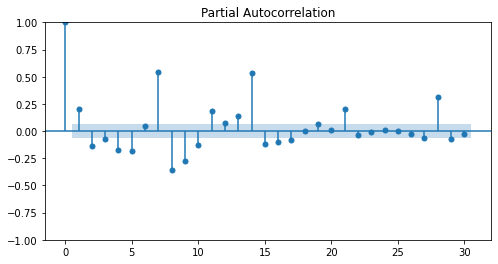

-----ACF and PCF for Customers-------


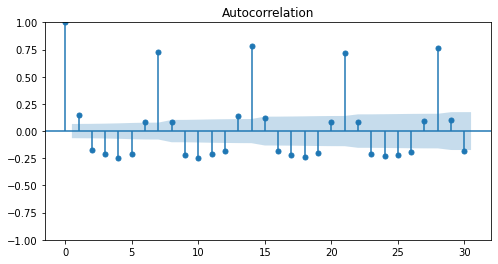

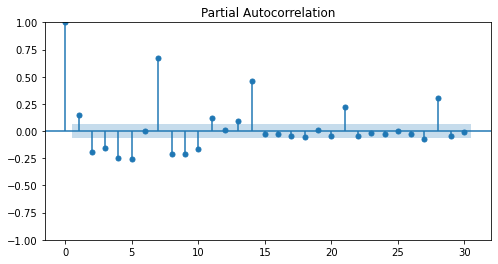

In [208]:

#Plot acf and pacf for store8 sales data
print('-----ACF and PCF for Sales-------')
plot_autocorrelation(store8_train.Sales,30)
print('-----ACF and PCF for Customers-------')
#Plot acf and pacf for customers  data
plot_autocorrelation(store8_train.Customers,30)

There is a weekely spike happening in the acf plot. The same is reflecting in pacf plot as well, so s can be taken as 7. Till p=q=5 lag and ma values are significant

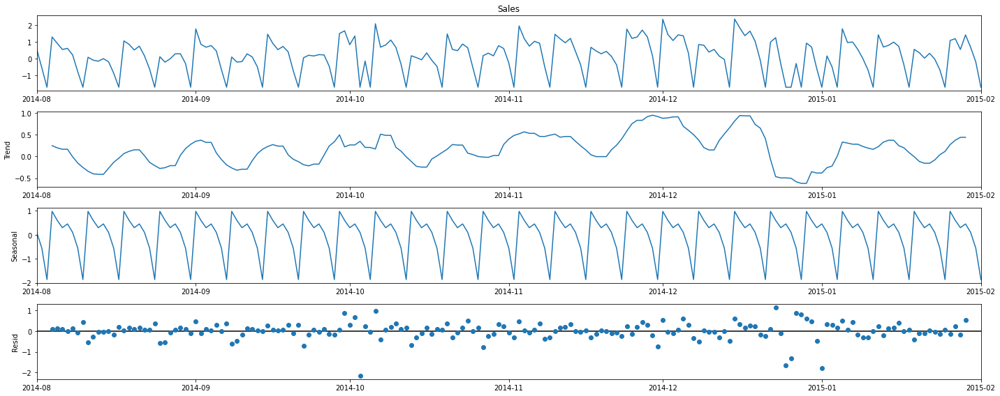

In [211]:
# Let's try to decompose the data to identify if there are any seasonal components
rcParams['figure.figsize'] = 20, 8
decomposition = sm.tsa.seasonal_decompose(store8_train.Sales['2014-08-01':'2015-02-01'], model='additive') # additive seasonal index
fig = decomposition.plot()
plt.show()


Data has a varying trend, but the values are higher during December.It has a weekely seasonal pattern.

In [213]:

# Create start and end indexes
store8_start = store8_test.index.min()
store8_end = store8_test.index.max()



#### 4.5 Build SARIMA model


As the acf and pacf plots are showing significant correlations for higher orders we will try few values for p and q and then go with the model with least AIC values.


In [214]:
# Create combinations for lag and ma orderes for both seasonal and non seasonal components
p = q = range(0, 6)
d = range(0, 1)
pdq = list(itertools.product(p, d, q))
p = q = range(0, 2)
d = range(0, 2)
seasonal_pdq = [(x[0], x[1], x[2], 7) for x in list(itertools.product(p, d, q))]

print('Examples of parameter combinations for Seasonal ARIMA...')
print('SARIMAX: {} x {}'.format(pdq[1], seasonal_pdq[1]))
print('SARIMAX: {} x {}'.format(pdq[1], seasonal_pdq[2]))
print('SARIMAX: {} x {}'.format(pdq[2], seasonal_pdq[3]))
print('SARIMAX: {} x {}'.format(pdq[2], seasonal_pdq[4]))

for param in pdq:
    for param_seasonal in seasonal_pdq:
        try:
            model = SARIMAX(store8_train.Sales,
                            order=param,
                            seasonal_order=param_seasonal)
    

            results = model.fit()

            print('ARIMA{}x{} - AIC:{}'.format(param, param_seasonal, results.aic))
        except:
            continue

Examples of parameter combinations for Seasonal ARIMA...
SARIMAX: (0, 0, 1) x (0, 0, 1, 7)
SARIMAX: (0, 0, 1) x (0, 1, 0, 7)
SARIMAX: (0, 0, 2) x (0, 1, 1, 7)
SARIMAX: (0, 0, 2) x (1, 0, 0, 7)
ARIMA(0, 0, 0)x(0, 0, 0, 7) - AIC:2556.0893597684108
ARIMA(0, 0, 0)x(0, 0, 1, 7) - AIC:2417.1860796141573
ARIMA(0, 0, 0)x(0, 1, 0, 7) - AIC:2412.319515818499
ARIMA(0, 0, 0)x(0, 1, 1, 7) - AIC:1594.777170289796
ARIMA(0, 0, 0)x(1, 0, 0, 7) - AIC:2217.2079111926428
ARIMA(0, 0, 0)x(1, 0, 1, 7) - AIC:1614.0524707637535
ARIMA(0, 0, 0)x(1, 1, 0, 7) - AIC:1701.2492836305275
ARIMA(0, 0, 0)x(1, 1, 1, 7) - AIC:1466.789450700294
ARIMA(0, 0, 1)x(0, 0, 0, 7) - AIC:2512.4166936174274
ARIMA(0, 0, 1)x(0, 0, 1, 7) - AIC:2346.9037039999803
ARIMA(0, 0, 1)x(0, 1, 0, 7) - AIC:2286.570483151034
ARIMA(0, 0, 1)x(0, 1, 1, 7) - AIC:1504.2873070086039
ARIMA(0, 0, 1)x(1, 0, 0, 7) - AIC:2114.1121090666193
ARIMA(0, 0, 1)x(1, 0, 1, 7) - AIC:1523.3089703173914
ARIMA(0, 0, 1)x(1, 1, 0, 7) - AIC:1662.3012088718758
ARIMA(0, 0, 1)x(

/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(0, 0, 4)x(0, 1, 0, 7) - AIC:2124.6301257465884
ARIMA(0, 0, 4)x(0, 1, 1, 7) - AIC:1420.856423008821
ARIMA(0, 0, 4)x(1, 0, 0, 7) - AIC:2040.3687478015331
ARIMA(0, 0, 4)x(1, 0, 1, 7) - AIC:1440.965083579852
ARIMA(0, 0, 4)x(1, 1, 0, 7) - AIC:1609.403323002542
ARIMA(0, 0, 4)x(1, 1, 1, 7) - AIC:1359.092736686412
ARIMA(0, 0, 5)x(0, 0, 0, 7) - AIC:2394.9442927060163
ARIMA(0, 0, 5)x(0, 0, 1, 7) - AIC:2275.136579608428


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(0, 0, 5)x(0, 1, 0, 7) - AIC:1888.2569130614302
ARIMA(0, 0, 5)x(0, 1, 1, 7) - AIC:1420.2903681608982
ARIMA(0, 0, 5)x(1, 0, 0, 7) - AIC:2030.2793197328156
ARIMA(0, 0, 5)x(1, 0, 1, 7) - AIC:1440.8701878901006
ARIMA(0, 0, 5)x(1, 1, 0, 7) - AIC:1610.9090551978104
ARIMA(0, 0, 5)x(1, 1, 1, 7) - AIC:1359.3915754371767
ARIMA(1, 0, 0)x(0, 0, 0, 7) - AIC:2521.3602828452413
ARIMA(1, 0, 0)x(0, 0, 1, 7) - AIC:2346.437859018818
ARIMA(1, 0, 0)x(0, 1, 0, 7) - AIC:2230.5866316148054
ARIMA(1, 0, 0)x(0, 1, 1, 7) - AIC:1467.2658661511755
ARIMA(1, 0, 0)x(1, 0, 0, 7) - AIC:2081.3420426091707
ARIMA(1, 0, 0)x(1, 0, 1, 7) - AIC:1486.756428732523
ARIMA(1, 0, 0)x(1, 1, 0, 7) - AIC:1646.6396131886304
ARIMA(1, 0, 0)x(1, 1, 1, 7) - AIC:1391.9401778515717
ARIMA(1, 0, 1)x(0, 0, 0, 7) - AIC:2494.5154863349744
ARIMA(1, 0, 1)x(0, 0, 1, 7) - AIC:2347.4967409064166
ARIMA(1, 0, 1)x(0, 1, 0, 7) - AIC:2213.478806013629
ARIMA(1, 0, 1)x(0, 1, 1, 7) - AIC:1448.3440690810207
ARIMA(1, 0, 1)x(1, 0, 0, 7) - AIC:2073.3742366821

/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(1, 0, 3)x(1, 0, 1, 7) - AIC:1490.127858150855
ARIMA(1, 0, 3)x(1, 1, 0, 7) - AIC:1609.2895504575517
ARIMA(1, 0, 3)x(1, 1, 1, 7) - AIC:1359.1988822506883
ARIMA(1, 0, 4)x(0, 0, 0, 7) - AIC:2419.530891572559
ARIMA(1, 0, 4)x(0, 0, 1, 7) - AIC:2284.7523309640374
ARIMA(1, 0, 4)x(0, 1, 0, 7) - AIC:2088.008594421247
ARIMA(1, 0, 4)x(0, 1, 1, 7) - AIC:1421.655216983952
ARIMA(1, 0, 4)x(1, 0, 0, 7) - AIC:2042.1005710021918
ARIMA(1, 0, 4)x(1, 0, 1, 7) - AIC:1441.9597423537189
ARIMA(1, 0, 4)x(1, 1, 0, 7) - AIC:1576.4329499574005
ARIMA(1, 0, 4)x(1, 1, 1, 7) - AIC:1361.0073616323841
ARIMA(1, 0, 5)x(0, 0, 0, 7) - AIC:2396.800549974064
ARIMA(1, 0, 5)x(0, 0, 1, 7) - AIC:2267.3826996358525


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(1, 0, 5)x(0, 1, 0, 7) - AIC:1978.5733164905091
ARIMA(1, 0, 5)x(0, 1, 1, 7) - AIC:1417.5255094491026
ARIMA(1, 0, 5)x(1, 0, 0, 7) - AIC:1983.006267845024


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(1, 0, 5)x(1, 0, 1, 7) - AIC:1436.8779821358853
ARIMA(1, 0, 5)x(1, 1, 0, 7) - AIC:1574.644176148824
ARIMA(1, 0, 5)x(1, 1, 1, 7) - AIC:1361.2122295185939
ARIMA(2, 0, 0)x(0, 0, 0, 7) - AIC:2506.6943463369685
ARIMA(2, 0, 0)x(0, 0, 1, 7) - AIC:2347.4870107101196
ARIMA(2, 0, 0)x(0, 1, 0, 7) - AIC:2202.8677808172524
ARIMA(2, 0, 0)x(0, 1, 1, 7) - AIC:1441.3198519206853
ARIMA(2, 0, 0)x(1, 0, 0, 7) - AIC:2069.1709278844055
ARIMA(2, 0, 0)x(1, 0, 1, 7) - AIC:1461.584221799319
ARIMA(2, 0, 0)x(1, 1, 0, 7) - AIC:1619.8651306934698
ARIMA(2, 0, 0)x(1, 1, 1, 7) - AIC:1372.7869587141731
ARIMA(2, 0, 1)x(0, 0, 0, 7) - AIC:2489.448070031009
ARIMA(2, 0, 1)x(0, 0, 1, 7) - AIC:2320.0684935773625
ARIMA(2, 0, 1)x(0, 1, 0, 7) - AIC:2204.863862447176
ARIMA(2, 0, 1)x(0, 1, 1, 7) - AIC:1442.85445571711
ARIMA(2, 0, 1)x(1, 0, 0, 7) - AIC:2071.170332180561
ARIMA(2, 0, 1)x(1, 0, 1, 7) - AIC:1463.145755425513
ARIMA(2, 0, 1)x(1, 1, 0, 7) - AIC:1620.4677204670418
ARIMA(2, 0, 1)x(1, 1, 1, 7) - AIC:1373.115571498436


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(2, 0, 2)x(0, 0, 0, 7) - AIC:2214.866105508978
ARIMA(2, 0, 2)x(0, 0, 1, 7) - AIC:2346.1865591226965
ARIMA(2, 0, 2)x(0, 1, 0, 7) - AIC:1962.472080871013
ARIMA(2, 0, 2)x(0, 1, 1, 7) - AIC:1341.161903457269
ARIMA(2, 0, 2)x(1, 0, 0, 7) - AIC:1871.355907417499
ARIMA(2, 0, 2)x(1, 0, 1, 7) - AIC:1361.186676603868
ARIMA(2, 0, 2)x(1, 1, 0, 7) - AIC:1584.929130504857
ARIMA(2, 0, 2)x(1, 1, 1, 7) - AIC:1332.6612701199924


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(2, 0, 3)x(0, 0, 0, 7) - AIC:2222.3323462510825


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(2, 0, 3)x(0, 0, 1, 7) - AIC:2199.9153938031423
ARIMA(2, 0, 3)x(0, 1, 0, 7) - AIC:1913.0733688323758
ARIMA(2, 0, 3)x(0, 1, 1, 7) - AIC:1421.6358249104887
ARIMA(2, 0, 3)x(1, 0, 0, 7) - AIC:2042.0964907707817


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(2, 0, 3)x(1, 0, 1, 7) - AIC:1441.9410973094396
ARIMA(2, 0, 3)x(1, 1, 0, 7) - AIC:1611.2048134014753
ARIMA(2, 0, 3)x(1, 1, 1, 7) - AIC:1356.454170179727
ARIMA(2, 0, 4)x(0, 0, 0, 7) - AIC:2367.378539897125


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(2, 0, 4)x(0, 0, 1, 7) - AIC:2085.722026641225
ARIMA(2, 0, 4)x(0, 1, 0, 7) - AIC:2062.3155034299234
ARIMA(2, 0, 4)x(0, 1, 1, 7) - AIC:1344.7278493618032


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(2, 0, 4)x(1, 0, 0, 7) - AIC:1983.896927592859


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(2, 0, 4)x(1, 0, 1, 7) - AIC:1449.9995763108182


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(2, 0, 4)x(1, 1, 0, 7) - AIC:1566.9625707390232
ARIMA(2, 0, 4)x(1, 1, 1, 7) - AIC:1361.5151270568624


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(2, 0, 5)x(0, 0, 0, 7) - AIC:2163.6829630734337


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(2, 0, 5)x(0, 0, 1, 7) - AIC:2094.614469357798
ARIMA(2, 0, 5)x(0, 1, 0, 7) - AIC:2046.7332009981694
ARIMA(2, 0, 5)x(0, 1, 1, 7) - AIC:1419.2622308538532


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(2, 0, 5)x(1, 0, 0, 7) - AIC:1867.4105582897182


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(2, 0, 5)x(1, 0, 1, 7) - AIC:1371.2152102736059
ARIMA(2, 0, 5)x(1, 1, 0, 7) - AIC:1576.9255871071177
ARIMA(2, 0, 5)x(1, 1, 1, 7) - AIC:1363.1448553440514
ARIMA(3, 0, 0)x(0, 0, 0, 7) - AIC:2504.5116867518823
ARIMA(3, 0, 0)x(0, 0, 1, 7) - AIC:2349.1436403531857
ARIMA(3, 0, 0)x(0, 1, 0, 7) - AIC:2204.848780395342
ARIMA(3, 0, 0)x(0, 1, 1, 7) - AIC:1441.7346289370828
ARIMA(3, 0, 0)x(1, 0, 0, 7) - AIC:2071.167697399694
ARIMA(3, 0, 0)x(1, 0, 1, 7) - AIC:1462.0780714443076
ARIMA(3, 0, 0)x(1, 1, 0, 7) - AIC:1618.3054453849418
ARIMA(3, 0, 0)x(1, 1, 1, 7) - AIC:1370.7218235871358
ARIMA(3, 0, 1)x(0, 0, 0, 7) - AIC:2489.9884097242207
ARIMA(3, 0, 1)x(0, 0, 1, 7) - AIC:2345.9555030434167
ARIMA(3, 0, 1)x(0, 1, 0, 7) - AIC:2198.7084091878864
ARIMA(3, 0, 1)x(0, 1, 1, 7) - AIC:1437.0690337288515
ARIMA(3, 0, 1)x(1, 0, 0, 7) - AIC:2066.6996110371274


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(3, 0, 1)x(1, 0, 1, 7) - AIC:1457.8205768030202
ARIMA(3, 0, 1)x(1, 1, 0, 7) - AIC:1616.6844340483965
ARIMA(3, 0, 1)x(1, 1, 1, 7) - AIC:1367.5307060591667
ARIMA(3, 0, 2)x(0, 0, 0, 7) - AIC:2474.254908059919
ARIMA(3, 0, 2)x(0, 0, 1, 7) - AIC:2322.6687344344655
ARIMA(3, 0, 2)x(0, 1, 0, 7) - AIC:1938.4754734578958
ARIMA(3, 0, 2)x(0, 1, 1, 7) - AIC:1342.8889310697693
ARIMA(3, 0, 2)x(1, 0, 0, 7) - AIC:1991.0944692459675


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(3, 0, 2)x(1, 0, 1, 7) - AIC:1441.7063923896728


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(3, 0, 2)x(1, 1, 0, 7) - AIC:1569.892008579903
ARIMA(3, 0, 2)x(1, 1, 1, 7) - AIC:1334.2269028511437


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(3, 0, 3)x(0, 0, 0, 7) - AIC:2219.3723782850243


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(3, 0, 3)x(0, 0, 1, 7) - AIC:2167.89209536455


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(3, 0, 3)x(0, 1, 0, 7) - AIC:1904.6134692300857


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(3, 0, 3)x(0, 1, 1, 7) - AIC:1451.8916377207283


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(3, 0, 3)x(1, 0, 0, 7) - AIC:1868.958596381882


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(3, 0, 3)x(1, 0, 1, 7) - AIC:1365.2209286679893
ARIMA(3, 0, 3)x(1, 1, 0, 7) - AIC:1604.8787151327351


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(3, 0, 3)x(1, 1, 1, 7) - AIC:1377.787426447952


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(3, 0, 4)x(0, 0, 0, 7) - AIC:2208.4777637325


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(3, 0, 4)x(0, 0, 1, 7) - AIC:2159.6011577597474


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(3, 0, 4)x(0, 1, 0, 7) - AIC:1916.5519745720592


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(3, 0, 4)x(0, 1, 1, 7) - AIC:1345.7232551762356


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(3, 0, 4)x(1, 0, 0, 7) - AIC:1852.2248524306497


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(3, 0, 4)x(1, 0, 1, 7) - AIC:1366.94724488878


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(3, 0, 4)x(1, 1, 0, 7) - AIC:1561.708831134201


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(3, 0, 4)x(1, 1, 1, 7) - AIC:1337.5175685703969


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(3, 0, 5)x(0, 0, 0, 7) - AIC:2210.357265226814


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(3, 0, 5)x(0, 0, 1, 7) - AIC:2163.544558262921


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(3, 0, 5)x(0, 1, 0, 7) - AIC:1689.6621761024944


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(3, 0, 5)x(0, 1, 1, 7) - AIC:1348.5888701467516


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(3, 0, 5)x(1, 0, 0, 7) - AIC:1855.1962440351626


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(3, 0, 5)x(1, 0, 1, 7) - AIC:1367.9282974309092


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(3, 0, 5)x(1, 1, 0, 7) - AIC:1562.1849101071166


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(3, 0, 5)x(1, 1, 1, 7) - AIC:1352.5755164406626
ARIMA(4, 0, 0)x(0, 0, 0, 7) - AIC:2479.539147850851
ARIMA(4, 0, 0)x(0, 0, 1, 7) - AIC:2318.8680938112293
ARIMA(4, 0, 0)x(0, 1, 0, 7) - AIC:2090.7376510392123
ARIMA(4, 0, 0)x(0, 1, 1, 7) - AIC:1406.2472964767019
ARIMA(4, 0, 0)x(1, 0, 0, 7) - AIC:1990.4857196413327
ARIMA(4, 0, 0)x(1, 0, 1, 7) - AIC:1426.3454260888038
ARIMA(4, 0, 0)x(1, 1, 0, 7) - AIC:1606.0668897905657
ARIMA(4, 0, 0)x(1, 1, 1, 7) - AIC:1363.7476487502367
ARIMA(4, 0, 1)x(0, 0, 0, 7) - AIC:2471.2807223929476
ARIMA(4, 0, 1)x(0, 0, 1, 7) - AIC:2284.300201647843
ARIMA(4, 0, 1)x(0, 1, 0, 7) - AIC:1915.9231622804057
ARIMA(4, 0, 1)x(0, 1, 1, 7) - AIC:1369.8672042561975
ARIMA(4, 0, 1)x(1, 0, 0, 7) - AIC:1846.8967375901814
ARIMA(4, 0, 1)x(1, 0, 1, 7) - AIC:1389.4542056362395
ARIMA(4, 0, 1)x(1, 1, 0, 7) - AIC:1562.54727257067
ARIMA(4, 0, 1)x(1, 1, 1, 7) - AIC:1354.1562542845118


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(4, 0, 2)x(0, 0, 0, 7) - AIC:2460.0624495813054
ARIMA(4, 0, 2)x(0, 0, 1, 7) - AIC:2255.822536730081
ARIMA(4, 0, 2)x(0, 1, 0, 7) - AIC:1911.5212964411137
ARIMA(4, 0, 2)x(0, 1, 1, 7) - AIC:1448.0577803183214
ARIMA(4, 0, 2)x(1, 0, 0, 7) - AIC:1841.9152490723627


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(4, 0, 2)x(1, 0, 1, 7) - AIC:1364.7501797605755
ARIMA(4, 0, 2)x(1, 1, 0, 7) - AIC:1562.8913632862582


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(4, 0, 2)x(1, 1, 1, 7) - AIC:1335.7853139300241


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(4, 0, 3)x(0, 0, 0, 7) - AIC:2220.44687483356


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(4, 0, 3)x(0, 0, 1, 7) - AIC:2160.6859823531195
ARIMA(4, 0, 3)x(0, 1, 0, 7) - AIC:1881.6587094426338


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(4, 0, 3)x(0, 1, 1, 7) - AIC:1344.9118564980972
ARIMA(4, 0, 3)x(1, 0, 0, 7) - AIC:1847.9685664802796


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(4, 0, 3)x(1, 0, 1, 7) - AIC:1367.6564743590193


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(4, 0, 3)x(1, 1, 0, 7) - AIC:1563.4816283383595


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(4, 0, 3)x(1, 1, 1, 7) - AIC:1348.873694675276


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(4, 0, 4)x(0, 0, 0, 7) - AIC:2172.7755101901776


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(4, 0, 4)x(0, 0, 1, 7) - AIC:2162.671065447921
ARIMA(4, 0, 4)x(0, 1, 0, 7) - AIC:1837.3297822694935


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(4, 0, 4)x(0, 1, 1, 7) - AIC:1316.6021356713275


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(4, 0, 4)x(1, 0, 0, 7) - AIC:1772.317727576129


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(4, 0, 4)x(1, 0, 1, 7) - AIC:1366.7313532166113


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(4, 0, 4)x(1, 1, 0, 7) - AIC:1576.101910737461


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(4, 0, 4)x(1, 1, 1, 7) - AIC:1318.3341208445222


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(4, 0, 5)x(0, 0, 0, 7) - AIC:1934.225335848254


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(4, 0, 5)x(0, 0, 1, 7) - AIC:1988.7878354205739


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(4, 0, 5)x(0, 1, 0, 7) - AIC:1634.4210293266844


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(4, 0, 5)x(0, 1, 1, 7) - AIC:1318.3652127269313


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(4, 0, 5)x(1, 0, 0, 7) - AIC:1822.2902316212073


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(4, 0, 5)x(1, 0, 1, 7) - AIC:1366.479376948484


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(4, 0, 5)x(1, 1, 0, 7) - AIC:1486.5638968173344


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(4, 0, 5)x(1, 1, 1, 7) - AIC:1321.0828265478804
ARIMA(5, 0, 0)x(0, 0, 0, 7) - AIC:2449.6099896722917
ARIMA(5, 0, 0)x(0, 0, 1, 7) - AIC:2298.1493787265927
ARIMA(5, 0, 0)x(0, 1, 0, 7) - AIC:2056.574967632913
ARIMA(5, 0, 0)x(0, 1, 1, 7) - AIC:1391.9883665759794
ARIMA(5, 0, 0)x(1, 0, 0, 7) - AIC:1962.2702642465033
ARIMA(5, 0, 0)x(1, 0, 1, 7) - AIC:1411.8896936107815
ARIMA(5, 0, 0)x(1, 1, 0, 7) - AIC:1599.212884991883
ARIMA(5, 0, 0)x(1, 1, 1, 7) - AIC:1358.3632772105766
ARIMA(5, 0, 1)x(0, 0, 0, 7) - AIC:2451.2858093580926
ARIMA(5, 0, 1)x(0, 0, 1, 7) - AIC:2299.9535605380106
ARIMA(5, 0, 1)x(0, 1, 0, 7) - AIC:1917.892916859831
ARIMA(5, 0, 1)x(0, 1, 1, 7) - AIC:1370.188231220137
ARIMA(5, 0, 1)x(1, 0, 0, 7) - AIC:1848.2238689611922
ARIMA(5, 0, 1)x(1, 0, 1, 7) - AIC:1389.8747244449705
ARIMA(5, 0, 1)x(1, 1, 0, 7) - AIC:1561.818421365054
ARIMA(5, 0, 1)x(1, 1, 1, 7) - AIC:1355.262502978455


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(5, 0, 2)x(0, 0, 0, 7) - AIC:2121.6283703177132


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(5, 0, 2)x(0, 0, 1, 7) - AIC:2077.4406690512255
ARIMA(5, 0, 2)x(0, 1, 0, 7) - AIC:1891.3112189916064
ARIMA(5, 0, 2)x(0, 1, 1, 7) - AIC:1370.0160850347756
ARIMA(5, 0, 2)x(1, 0, 0, 7) - AIC:1826.263774854152


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(5, 0, 2)x(1, 0, 1, 7) - AIC:1390.2812973368516


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(5, 0, 2)x(1, 1, 0, 7) - AIC:1562.5009577564842


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(5, 0, 2)x(1, 1, 1, 7) - AIC:1347.6536431219645


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(5, 0, 3)x(0, 0, 0, 7) - AIC:2103.6537131400764


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(5, 0, 3)x(0, 0, 1, 7) - AIC:2082.2534245023226
ARIMA(5, 0, 3)x(0, 1, 0, 7) - AIC:1713.1215598752563


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(5, 0, 3)x(0, 1, 1, 7) - AIC:1367.265722104149


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(5, 0, 3)x(1, 0, 0, 7) - AIC:1723.3021310793679


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(5, 0, 3)x(1, 0, 1, 7) - AIC:1387.0505492639945


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(5, 0, 3)x(1, 1, 0, 7) - AIC:1491.8143084288727


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(5, 0, 3)x(1, 1, 1, 7) - AIC:1339.6165321987296
ARIMA(5, 0, 4)x(0, 0, 0, 7) - AIC:2281.4195959632407


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(5, 0, 4)x(0, 0, 1, 7) - AIC:2133.6716458105093


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(5, 0, 4)x(0, 1, 0, 7) - AIC:1705.1978723239872


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(5, 0, 4)x(0, 1, 1, 7) - AIC:1318.427500767902


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(5, 0, 4)x(1, 0, 0, 7) - AIC:1721.4500119323225


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(5, 0, 4)x(1, 0, 1, 7) - AIC:1369.5139829061027


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(5, 0, 4)x(1, 1, 0, 7) - AIC:1490.8813608124885


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(5, 0, 4)x(1, 1, 1, 7) - AIC:1320.1394280013385


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(5, 0, 5)x(0, 0, 0, 7) - AIC:1925.7296958391917


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(5, 0, 5)x(0, 0, 1, 7) - AIC:1916.294511688839


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(5, 0, 5)x(0, 1, 0, 7) - AIC:1704.9001404689707


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(5, 0, 5)x(0, 1, 1, 7) - AIC:1320.2917571774747


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(5, 0, 5)x(1, 0, 0, 7) - AIC:1999.774347942399


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(5, 0, 5)x(1, 0, 1, 7) - AIC:1641.2179175218384


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(5, 0, 5)x(1, 1, 0, 7) - AIC:1475.5894447052751


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(5, 0, 5)x(1, 1, 1, 7) - AIC:1321.8726687747337


ARIMA(4, 0, 5)x(1, 1, 1, 7) has given a aic of 1321. Let's build the sarimax model

In [215]:
store8_SARIMA = SARIMAX(store8_train.Sales,
                                order=(4, 0, 5),
                                seasonal_order=(1, 1, 1, 7))
            

store8_SARIMA = store8_SARIMA.fit()
store8_SARIMA.summary()

/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


<class 'statsmodels.iolib.summary.Summary'>
"""
                                      SARIMAX Results                                      
===========================================================================================
Dep. Variable:                               Sales   No. Observations:                  900
Model:             SARIMAX(4, 0, 5)x(1, 1, [1], 7)   Log Likelihood                -648.541
Date:                             Mon, 05 Sep 2022   AIC                           1321.083
Time:                                     16:57:50   BIC                           1378.618
Sample:                                 01-01-2013   HQIC                          1343.070
                                      - 06-19-2015                                         
Covariance Type:                               opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.4578      0.047      9.834      0.000       0.367       0.549
ar.L2          0.3425      0.055      6.207      0.000       0.234       0.451
ar.L3          0.4291      0.057      7.550      0.000       0.318       0.541
ar.L4         -0.8772      0.036    -24.457      0.000      -0.947      -0.807
ma.L1         -0.2367      0.053     -4.508      0.000      -0.340      -0.134
ma.L2         -0.2649      0.070     -3.798      0.000      -0.402      -0.128
ma.L3         -0.3916      0.064     -6.140      0.000      -0.517      -0.267
ma.L4          0.6633      0.046     14.553      0.000       0.574       0.753
ma.L5          0.0238      0.040      0.589      0.556      -0.055       0.103
ar.S.L7       -0.0274      0.041     -0.674      0.500      -0.107       0.052
ma.S.L7       -0.9416      0.011    -84.514      0.000      -0.963      -0.920
sigma2         0.2460      0.007     36.775      0.000       0.233       0.259
===================================================================================
Ljung-Box (L1) (Q):                   0.06   Jarque-Bera (JB):              2989.04
Prob(Q):                              0.81   Prob(JB):                         0.00
Heteroskedasticity (H):               1.88   Skew:                            -1.69
Prob(H) (two-sided):                  0.00   Kurtosis:                        11.30
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

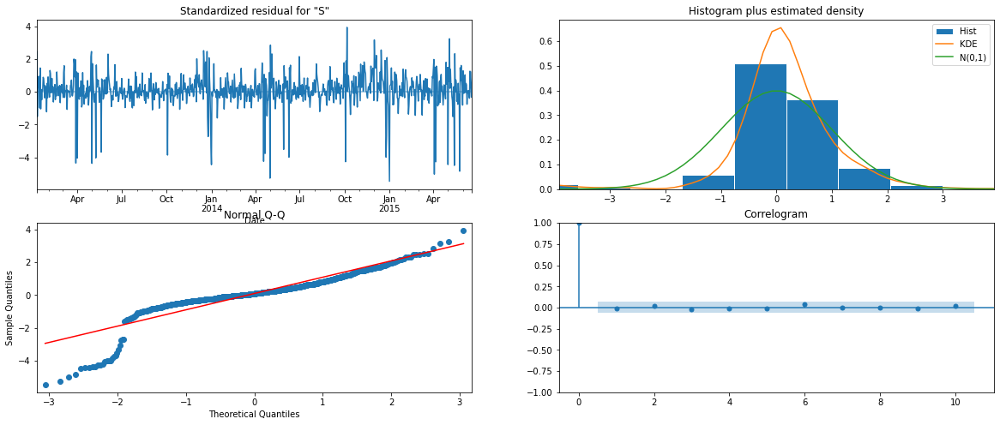

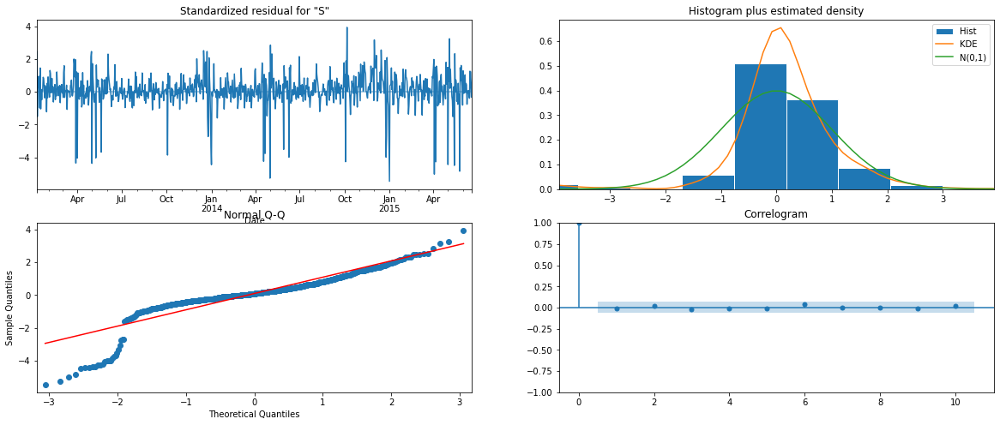

In [216]:
# Plot diagnostics
store8_SARIMA.plot_diagnostics()


According to the plots our model residuals are almost normally distributed also there is no significant correlation in the residuals. So our model is acceptable.


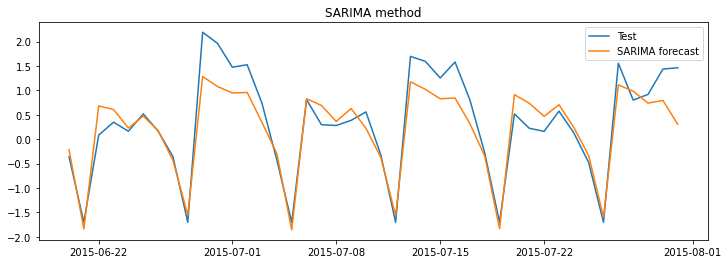

,Model,RMSE,MAPE,AIC
0,SARIMA,0.42,0.61,1321.082827


In [217]:
#Now let's calculate RMSE and MAPE score
# Create a results dataframe
Results_store8 = pd.DataFrame(columns=['Model', 'RMSE' ,'MAPE','AIC'])

calculate_metrics(store8_test.Sales,store8_SARIMA.predict(store8_start,store8_end),Results_store8,'SARIMA',store8_SARIMA.aic)


#### 4.6 Build SARIMAX model with exogenous variable


In [235]:
print(list(store8_train.columns))


['Sales', 'Customers', 'Open', 'Promo', 'StateHoliday', 'SchoolHoliday', 'Competiotion', 1, 2, 3, 4, 5, 6, 7]


In [236]:

store8_SARIMAX = SARIMAX(store8_train.Sales,
                                order=(4, 0, 5),
                                seasonal_order=(1, 1, 1, 7),
                         exog=store8_train[['Open', 'Promo', 'StateHoliday', 'SchoolHoliday', 'Competiotion', 1, 2, 3, 4, 5, 6, 7]])
            

store8_SARIMAX = store8_SARIMAX.fit()
store8_SARIMAX.summary()

/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


<class 'statsmodels.iolib.summary.Summary'>
"""
                                      SARIMAX Results                                      
===========================================================================================
Dep. Variable:                               Sales   No. Observations:                  900
Model:             SARIMAX(4, 0, 5)x(1, 1, [1], 7)   Log Likelihood                   0.808
Date:                             Mon, 05 Sep 2022   AIC                             46.384
Time:                                     17:58:40   BIC                            161.454
Sample:                                 01-01-2013   HQIC                            90.358
                                      - 06-19-2015                                         
Covariance Type:                               opg                                         
=================================================================================
                    coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------
Open              1.0989      0.017     63.847      0.000       1.065       1.133
Promo             0.8097      0.026     30.701      0.000       0.758       0.861
StateHoliday     -1.0999      0.017    -63.901      0.000      -1.134      -1.066
SchoolHoliday     0.0199      0.025      0.801      0.423      -0.029       0.069
Competiotion      0.1804      0.079      2.282      0.022       0.025       0.335
1              8.822e-09   4.37e-09      2.018      0.044    2.53e-10    1.74e-08
2             -9.942e-08   2.12e-09    -46.921      0.000   -1.04e-07   -9.53e-08
3             -1.069e-07   1.17e-09    -91.598      0.000   -1.09e-07   -1.05e-07
4              1.371e-08   4.61e-09      2.972      0.003    4.67e-09    2.27e-08
5             -7.823e-09    3.6e-09     -2.170      0.030   -1.49e-08   -7.58e-10
6              4.334e-08    3.8e-09     11.413      0.000    3.59e-08    5.08e-08
7              4.257e-08   4.87e-09      8.742      0.000     3.3e-08    5.21e-08
ar.L1             0.4124      0.114      3.626      0.000       0.189       0.635
ar.L2            -0.3202      0.158     -2.024      0.043      -0.630      -0.010
ar.L3            -0.2396      0.140     -1.713      0.087      -0.514       0.034
ar.L4             0.5914      0.116      5.093      0.000       0.364       0.819
ma.L1            -0.1946      0.114     -1.704      0.088      -0.418       0.029
ma.L2             0.4812      0.135      3.563      0.000       0.217       0.746
ma.L3             0.4493      0.125      3.604      0.000       0.205       0.694
ma.L4            -0.4486      0.106     -4.231      0.000      -0.656      -0.241
ma.L5             0.1800      0.039      4.643      0.000       0.104       0.256
ar.S.L7          -0.1937      0.046     -4.223      0.000      -0.284      -0.104
ma.S.L7          -0.8912      0.015    -58.816      0.000      -0.921      -0.862
sigma2            0.0575      0.002     24.905      0.000       0.053       0.062
===================================================================================
Ljung-Box (L1) (Q):                   0.00   Jarque-Bera (JB):                87.83
Prob(Q):                              0.99   Prob(JB):                         0.00
Heteroskedasticity (H):               1.77   Skew:                             0.22
Prob(H) (two-sided):                  0.00   Kurtosis:                         4.47
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
[2] Covariance matrix is singular or near-singular, with condition number 1.06e+20. Standard errors may be unstable.
"""

In [237]:
#ScoolHoliday seems to be insignificant here let's rebuild the model after removing this column
store8_SARIMAX1 = SARIMAX(store8_train.Sales,
                                order=(4, 0, 5),
                                seasonal_order=(1, 1, 1, 7),
                         exog=store8_train[['Open', 'Promo', 'StateHoliday', 'Competiotion', 1, 2, 3, 4, 5, 6, 7]])
            

store8_SARIMAX1 = store8_SARIMAX1.fit()
store8_SARIMAX1.summary()

/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


<class 'statsmodels.iolib.summary.Summary'>
"""
                                      SARIMAX Results                                      
===========================================================================================
Dep. Variable:                               Sales   No. Observations:                  900
Model:             SARIMAX(4, 0, 5)x(1, 1, [1], 7)   Log Likelihood                   0.421
Date:                             Mon, 05 Sep 2022   AIC                             45.157
Time:                                     18:00:34   BIC                            155.433
Sample:                                 01-01-2013   HQIC                            87.299
                                      - 06-19-2015                                         
Covariance Type:                               opg                                         
================================================================================
                   coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------
Open             1.0943   1154.416      0.001      0.999   -2261.519    2263.708
Promo            0.8068      0.026     31.567      0.000       0.757       0.857
StateHoliday    -1.0952   1154.416     -0.001      0.999   -2263.708    2261.518
Competiotion     0.1832      0.079      2.334      0.020       0.029       0.337
1             8.927e-09   1.59e+04   5.61e-13      1.000   -3.12e+04    3.12e+04
2            -9.564e-08   1.58e+04  -6.07e-12      1.000   -3.09e+04    3.09e+04
3            -1.052e-07   1.56e+04  -6.76e-12      1.000   -3.05e+04    3.05e+04
4             6.854e-09   1.59e+04   4.32e-13      1.000   -3.11e+04    3.11e+04
5            -1.128e-08   1.62e+04  -6.97e-13      1.000   -3.17e+04    3.17e+04
6             4.242e-08    1.6e+04   2.65e-12      1.000   -3.14e+04    3.14e+04
7             4.241e-08    1.6e+04   2.65e-12      1.000   -3.14e+04    3.14e+04
ar.L1            0.3998      0.113      3.536      0.000       0.178       0.621
ar.L2           -0.3074      0.153     -2.009      0.045      -0.607      -0.008
ar.L3           -0.2551      0.138     -1.846      0.065      -0.526       0.016
ar.L4            0.5961      0.112      5.315      0.000       0.376       0.816
ma.L1           -0.1854      0.113     -1.640      0.101      -0.407       0.036
ma.L2            0.4760      0.131      3.633      0.000       0.219       0.733
ma.L3            0.4600      0.125      3.686      0.000       0.215       0.705
ma.L4           -0.4469      0.103     -4.323      0.000      -0.649      -0.244
ma.L5            0.1812      0.038      4.797      0.000       0.107       0.255
ar.S.L7         -0.1947      0.045     -4.311      0.000      -0.283      -0.106
ma.S.L7         -0.8920      0.015    -59.871      0.000      -0.921      -0.863
sigma2           0.0575      0.002     25.045      0.000       0.053       0.062
===================================================================================
Ljung-Box (L1) (Q):                   0.00   Jarque-Bera (JB):                91.34
Prob(Q):                              0.97   Prob(JB):                         0.00
Heteroskedasticity (H):               1.78   Skew:                             0.24
Prob(H) (two-sided):                  0.00   Kurtosis:                         4.49
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
[2] Covariance matrix is singular or near-singular, with condition number 9.92e+18. Standard errors may be unstable.
"""

In [238]:
#Weekday seems to be insignificant here let's rebuild the model after removing these columns
store8_SARIMAX2 = SARIMAX(store8_train.Sales,
                                order=(4, 0, 5),
                                seasonal_order=(1, 1, 1, 7),
                         exog=store8_train[['Open', 'Promo', 'StateHoliday', 'Competiotion']])
            

store8_SARIMAX2 = store8_SARIMAX2.fit()
store8_SARIMAX2.summary()

/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


<class 'statsmodels.iolib.summary.Summary'>
"""
                                      SARIMAX Results                                      
===========================================================================================
Dep. Variable:                               Sales   No. Observations:                  900
Model:             SARIMAX(4, 0, 5)x(1, 1, [1], 7)   Log Likelihood                   0.433
Date:                             Mon, 05 Sep 2022   AIC                             31.134
Time:                                     18:02:37   BIC                            107.848
Sample:                                 01-01-2013   HQIC                            60.450
                                      - 06-19-2015                                         
Covariance Type:                               opg                                         
================================================================================
                   coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------
Open             1.0949      0.017     63.912      0.000       1.061       1.128
Promo            0.8054      0.026     31.562      0.000       0.755       0.855
StateHoliday    -1.0958      0.017    -63.963      0.000      -1.129      -1.062
Competiotion     0.1794      0.079      2.268      0.023       0.024       0.334
ar.L1            0.4031      0.112      3.608      0.000       0.184       0.622
ar.L2           -0.3126      0.152     -2.059      0.039      -0.610      -0.015
ar.L3           -0.2521      0.136     -1.849      0.064      -0.519       0.015
ar.L4            0.5895      0.111      5.289      0.000       0.371       0.808
ma.L1           -0.1851      0.112     -1.658      0.097      -0.404       0.034
ma.L2            0.4806      0.130      3.699      0.000       0.226       0.735
ma.L3            0.4606      0.122      3.760      0.000       0.221       0.701
ma.L4           -0.4402      0.103     -4.274      0.000      -0.642      -0.238
ma.L5            0.1845      0.038      4.846      0.000       0.110       0.259
ar.S.L7         -0.1910      0.046     -4.183      0.000      -0.281      -0.102
ma.S.L7         -0.8915      0.015    -59.657      0.000      -0.921      -0.862
sigma2           0.0575      0.002     25.069      0.000       0.053       0.062
===================================================================================
Ljung-Box (L1) (Q):                   0.00   Jarque-Bera (JB):                90.28
Prob(Q):                              0.96   Prob(JB):                         0.00
Heteroskedasticity (H):               1.78   Skew:                             0.24
Prob(H) (two-sided):                  0.00   Kurtosis:                         4.48
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
[2] Covariance matrix is singular or near-singular, with condition number 3.3e+17. Standard errors may be unstable.
"""

AIC has defenitely improved

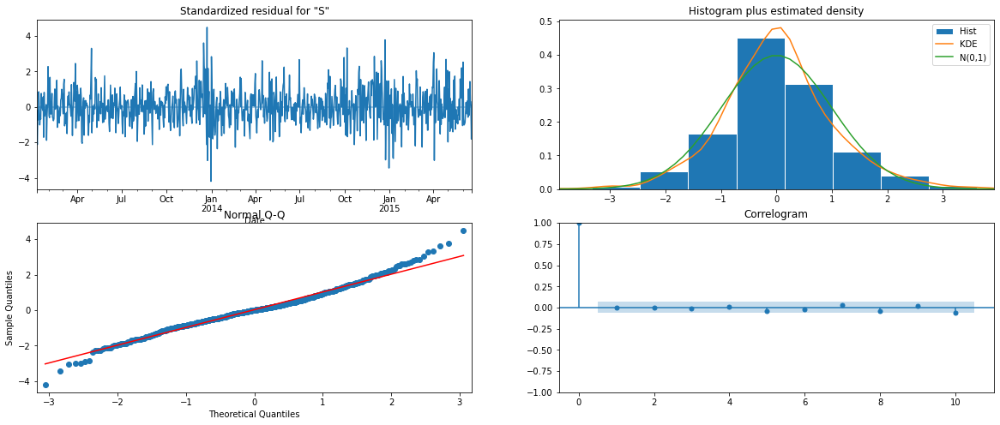

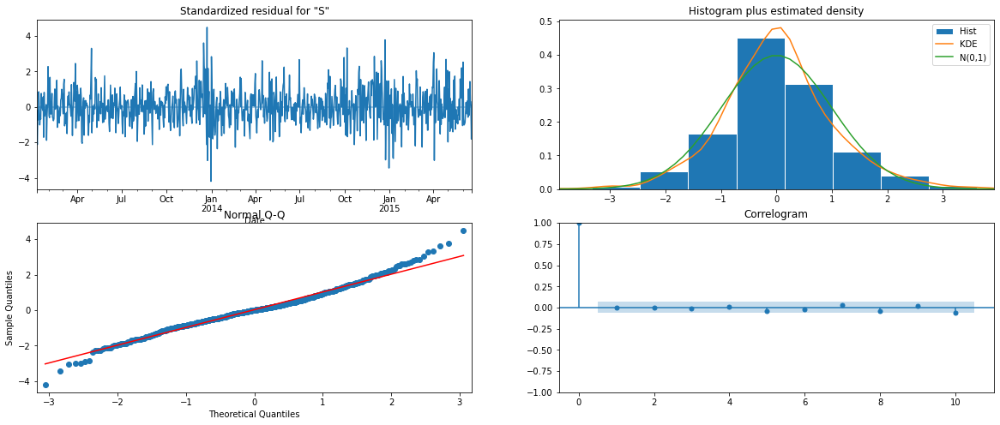

In [240]:

# Plot diagnostics
store8_SARIMAX2.plot_diagnostics()


Residuals are normaly distributed.


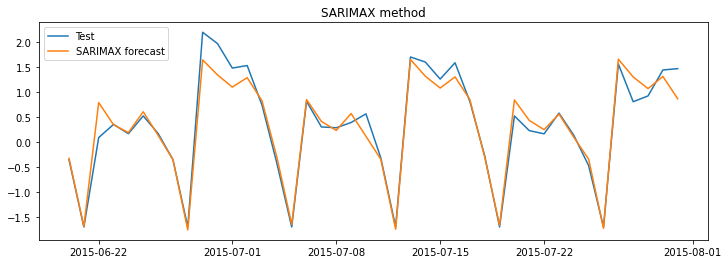

,Model,RMSE,MAPE,AIC
0,SARIMA,0.42,0.61,1321.082827
1,SARIMAX,0.25,0.41,31.134370


In [241]:
# Calculate rmse and mape
calculate_metrics(store8_test.Sales,store8_SARIMAX2.predict(store8_start,store8_end,
                exog=store8_test[['Open', 'Promo', 'StateHoliday','Competiotion']]),
                  Results_store8,'SARIMAX',store8_SARIMAX2.aic)


This SARIMAX is defenitely an improved model with better mape and rmse

#### 4.7 Build VARMAX model with exogenous variable


From the previously run adf test we know that both Sales and Customers time serieses are stationary and they move together. So let's build a VARMAX model this time


In [247]:
store8_VARMAX = sm.tsa.VARMAX(store8_train[['Sales', 'Customers']], order=(4,5),trend='n',
                              exog=store8_train[['Open', 'Promo', 'StateHoliday','Competiotion']])
store8_VARMAX = store8_VARMAX.fit(maxiter=1000, disp=False)
print(store8_VARMAX.summary())

/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/statespace/varmax.py:163: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  EstimationWarning)
/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


                             Statespace Model Results                             
Dep. Variable:     ['Sales', 'Customers']   No. Observations:                  900
Model:                        VARMAX(4,5)   Log Likelihood                 -29.725
Date:                    Mon, 05 Sep 2022   AIC                            153.449
Time:                            18:13:37   BIC                            379.162
Sample:                        01-01-2013   HQIC                           239.673
                             - 06-19-2015                                         
Covariance Type:                      opg                                         
Ljung-Box (L1) (Q):             5.74, 0.40   Jarque-Bera (JB):         43.67, 54.47
Prob(Q):                        0.02, 0.53   Prob(JB):                   0.00, 0.00
Heteroskedasticity (H):         1.08, 1.45   Skew:                       0.08, 0.19
Prob(H) (two-sided):            0.50, 0.00   Kurtosis:                   4.07, 4.15


In [258]:
# Try removing competition  and Open
store8_VARMAX1 = sm.tsa.VARMAX(store8_train[['Sales', 'Customers']], order=(4,5),trend='n',
                              exog=store8_train[['Open', 'Promo', 'StateHoliday']])
store8_VARMAX1 = store8_VARMAX1.fit(maxiter=1000, disp=False)
print(store8_VARMAX1.summary())

/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/statespace/varmax.py:163: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  EstimationWarning)
/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


                             Statespace Model Results                             
Dep. Variable:     ['Sales', 'Customers']   No. Observations:                  900
Model:                        VARMAX(4,5)   Log Likelihood                 -27.813
Date:                    Mon, 05 Sep 2022   AIC                            145.625
Time:                            18:27:09   BIC                            361.733
Sample:                        01-01-2013   HQIC                           228.180
                             - 06-19-2015                                         
Covariance Type:                      opg                                         
Ljung-Box (L1) (Q):             1.79, 1.07   Jarque-Bera (JB):         33.86, 75.61
Prob(Q):                        0.18, 0.30   Prob(JB):                   0.00, 0.00
Heteroskedasticity (H):         1.05, 1.51   Skew:                       0.17, 0.10
Prob(H) (two-sided):            0.64, 0.00   Kurtosis:                   3.89, 4.41


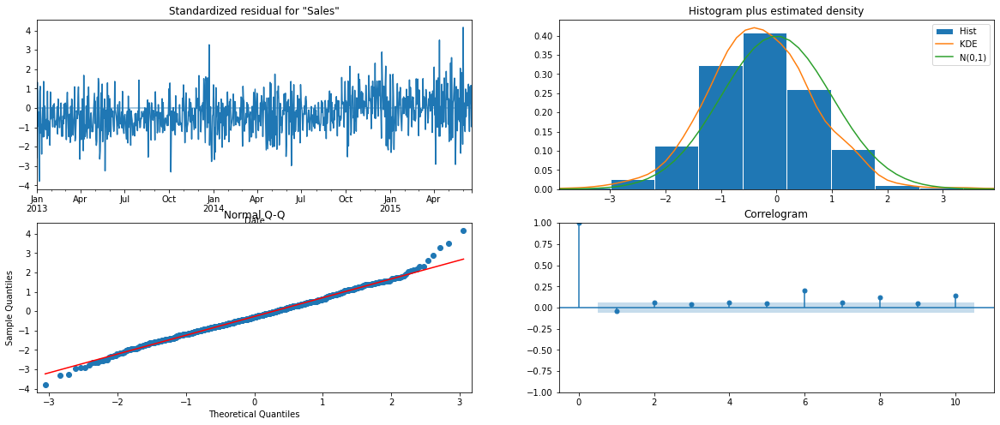

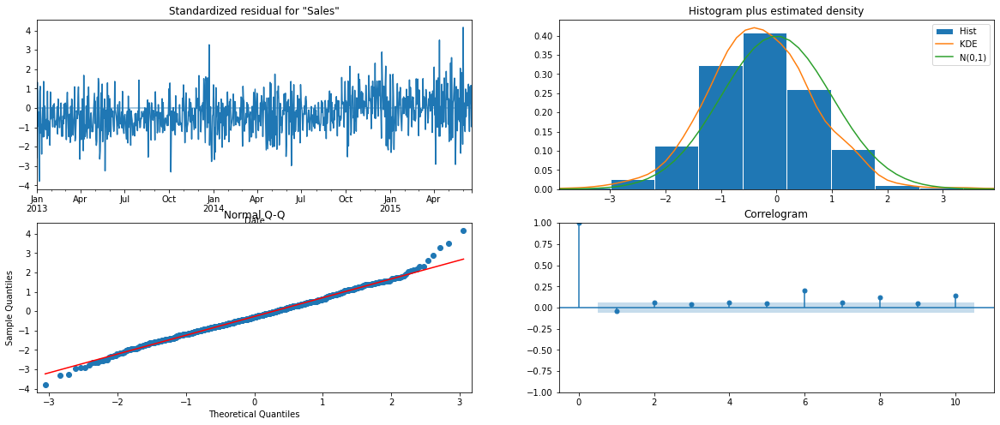

In [260]:
#Plot diagnostics
store8_VARMAX1.plot_diagnostics()


Residuals are almost normally distributed


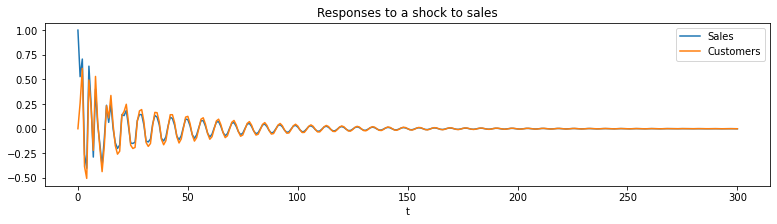

In [261]:
##### Check impluse response function


ax = store8_VARMAX1.impulse_responses(300, orthogonalized=False).plot(figsize=(13,3))
ax.set(xlabel='t', title='Responses to a shock to sales');



Looks like the values stablize only after nearly 150 days

/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/statespace/varmax.py:163: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  EstimationWarning)
/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/statespace/varmax.py:163: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  EstimationWarning)


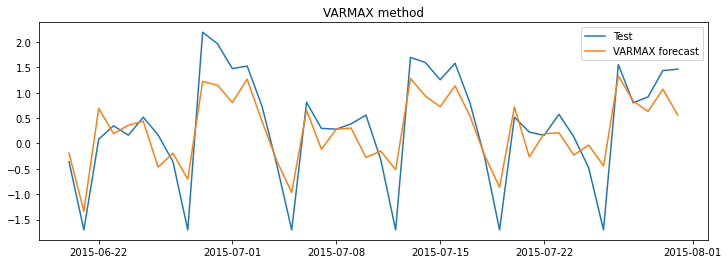

,Model,RMSE,MAPE,AIC
0,SARIMA,0.42,0.61,1321.082827
1,SARIMAX,0.25,0.41,31.134370
2,VARMAX,0.54,0.79,153.449194


In [257]:
# Calculate rmse and mapre
calculate_metrics(store8_test.Sales,store8_VARMAX.predict(store8_start,store8_end,
                exog=store8_test[['Open', 'Promo', 'StateHoliday', 'Competiotion']])['Sales'],
                  Results_store8,'VARMAX',store8_VARMAX.aic)



/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/statespace/varmax.py:163: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  EstimationWarning)
/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/statespace/varmax.py:163: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  EstimationWarning)


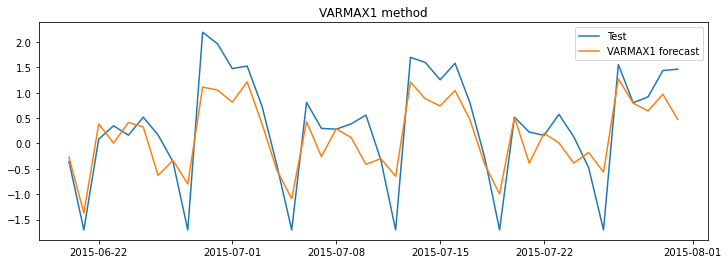

,Model,RMSE,MAPE,AIC
0,SARIMA,0.42,0.61,1321.082827
1,SARIMAX,0.25,0.41,31.134370
2,VARMAX,0.54,0.79,153.449194
3,VARMAX1,0.56,0.81,145.625239


In [262]:
# Calculate rmse and mapre
calculate_metrics(store8_test.Sales,store8_VARMAX1.predict(store8_start,store8_end,
                exog=store8_test[['Open', 'Promo', 'StateHoliday']])['Sales'],
                  Results_store8,'VARMAX1',store8_VARMAX1.aic)




For Store 8 the best results are given by the SARIMAX model.


## 5. Build model for store9

##### 5.1 Analyse data 



In [315]:
store_9.head(1)


,DayOfWeek,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,Promo2,PromoInterval,CompetitionSince,SaleYear,SaleMonth
Date,,,,,,,,,,,,
2013-01-01,2,0,0,0,0,a,1,0,NaN,2000-08-01,2013,1


In [316]:
# set frequency for the dataset
store_9.index.freq = store_9.index.inferred_freq
store_9.index

DatetimeIndex(['2013-01-01', '2013-01-02', '2013-01-03', '2013-01-04',
               '2013-01-05', '2013-01-06', '2013-01-07', '2013-01-08',
               '2013-01-09', '2013-01-10',
               ...
               '2015-07-22', '2015-07-23', '2015-07-24', '2015-07-25',
               '2015-07-26', '2015-07-27', '2015-07-28', '2015-07-29',
               '2015-07-30', '2015-07-31'],
              dtype='datetime64[ns]', name='Date', length=942, freq='D')

In [317]:
store_9.describe(include='all')


,DayOfWeek,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,Promo2,PromoInterval,CompetitionSince,SaleYear,SaleMonth
count,942.000000,942.000000,942.000000,942.000000,942.000000,942,942.000000,942.0,0,942,942.000000,942.000000
unique,NaN,NaN,NaN,NaN,NaN,4,NaN,NaN,0,1,NaN,NaN
top,NaN,NaN,NaN,NaN,NaN,0,NaN,NaN,NaN,2000-08-01 00:00:00,NaN,NaN
freq,NaN,NaN,NaN,NaN,NaN,913,NaN,NaN,NaN,942,NaN,NaN
first,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2000-08-01 00:00:00,NaN,NaN
last,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2000-08-01 00:00:00,NaN,NaN
mean,3.997877,5426.816348,479.487261,0.826964,0.382166,NaN,0.180467,0.0,NaN,NaN,2013.837580,5.961783
std,1.998404,2891.687966,238.656876,0.378479,0.486175,NaN,0.384780,0.0,NaN,NaN,0.766009,3.350357
min,1.000000,0.000000,0.000000,0.000000,0.000000,NaN,0.000000,0.0,NaN,NaN,2013.000000,1.000000
25%,2.000000,4765.500000,460.500000,1.000000,0.000000,NaN,0.000000,0.0,NaN,NaN,2013.000000,3.000000


In [318]:
# Remove PromoInterval,CompetitionSince columns from store_9 data
store_9.drop(labels=['Promo2','PromoInterval','CompetitionSince'],axis=1,inplace=True)

print(store_9.StateHoliday.value_counts())
# Check the sales by state holiday
store_9.groupby(by=['StateHoliday'])['Sales'].sum()



0    913
a     19
b      6
c      4
Name: StateHoliday, dtype: int64


StateHoliday
0    5112061
a          0
b          0
c          0
Name: Sales, dtype: int64

In [319]:
#Sales is zero whenever there is a state holiday. So it is better make the variables having only 2 levels,
#1 for  state holiday and 0 for non-holiday.

store_9.StateHoliday= store_9.StateHoliday.apply(lambda x : 0 if x=='0' else 1)

store_9.StateHoliday.value_counts()

0    913
1     29
Name: StateHoliday, dtype: int64

In [320]:
store_9.shape

(942, 9)

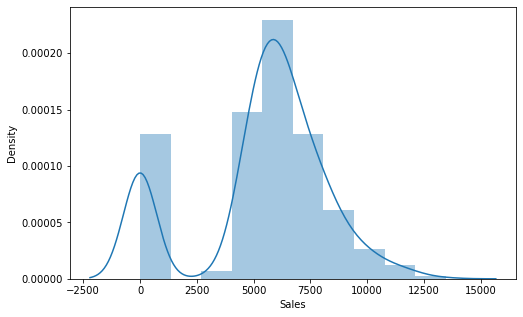

In [321]:
# Check the distribution of sales
plt.figure(figsize=(8,5))
sns.distplot(store_9.Sales,bins=10)
plt.show()

Looks like Sales has a right skewed distribution. Also lot of data points are having zero as sales value and that is a valid value as sales will be zero for holidays. Now let's check for outliers


##### CHECK FOR OUTLIERS

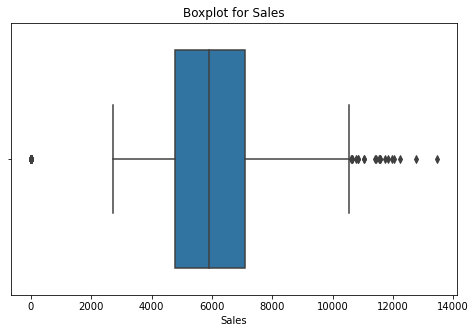

Quartile values for Sales
0.750     7086.750
0.800     7486.800
0.900     8483.400
0.990    11548.880
0.995    11868.595
0.999    12807.710
1.000    13457.000
Name: Sales, dtype: float64


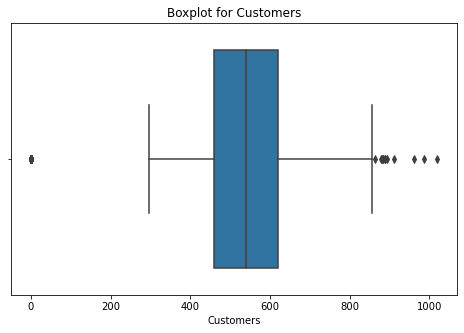

Quartile values for Customers
0.750     620.750
0.800     641.000
0.900     701.800
0.990     880.360
0.995     890.475
0.999     989.829
1.000    1019.000
Name: Customers, dtype: float64


In [52]:
check_outliers(store_9[['Sales','Customers']])


In [323]:
#For Values > 0.95th percentile value, we can do capping method to set them as 95th percentile value.
store_9.loc[store_9.Sales > store_9.Sales.quantile([0.95])[0.95],'Sales'] =  store_9.Sales.quantile([0.95])[0.95]
#For Values > 0.95th percentile value, we can do capping method to set them as 95th percentile value.
store_9.loc[store_9.Customers > store_9.Customers.quantile([0.95])[0.95],'Customers'] =  store_9.Customers.quantile([0.95])[0.95]



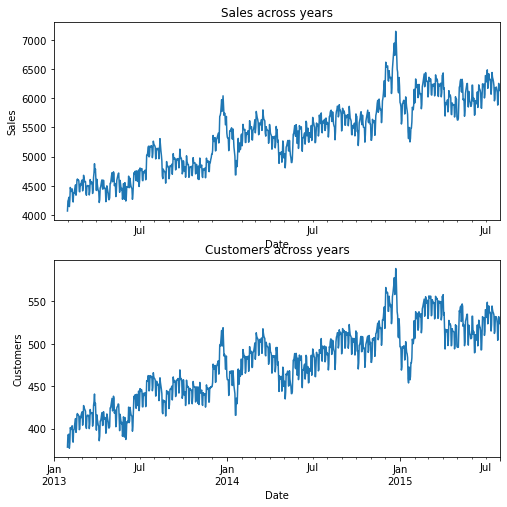

In [325]:
# Plot sales data using a rolling window
plt.figure(figsize=(8,8))
plt.subplot(2,1,1)
plt.title('Sales across years')
store_9.Sales.rolling(30).mean().plot()
plt.xticks([])
plt.ylabel('Sales')

plt.subplot(2,1,2)
plt.title('Customers across years')
store_9.Customers.rolling(30).mean().plot()
plt.xlabel('Date')
plt.ylabel('Customers')
plt.show()

We have two time series here, sales and customers. Sale value is directly proportional to number of customers.
Sales is peaking in December month. Plot shows the existance of trend.


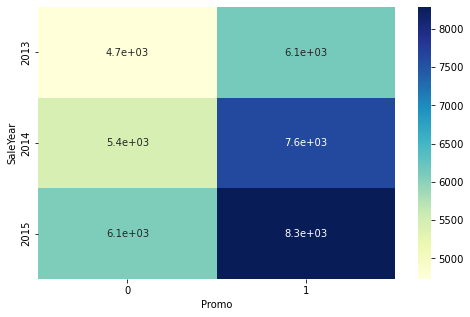

In [326]:
# Relation between sales and Promo
plt.figure(figsize=(8,5))
sns.heatmap(store_9.groupby(by=['SaleYear','Promo'])['Sales'].median().unstack(),cmap="YlGnBu",annot=True)
plt.show()

Promotion has a high influence in the sales.

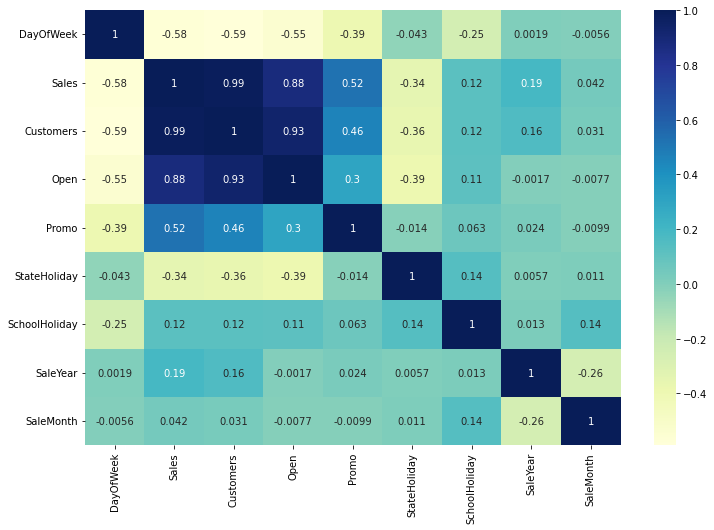

In [327]:
###### Check correlation between data points

store9_corr = store_9.corr()

plt.figure(figsize=(12,8))
sns.heatmap(store9_corr,annot=True,cmap='YlGnBu')
plt.show()

- Sales is having a high correlation with Customers,Open and Promo


##### Preprocess data



In [328]:

# Drop SaleYear and SaleMonth columns
store_9.drop(['SaleYear','SaleMonth'],inplace=True,axis=1)
print(store_9.head(1))
# Make DayOfWeek as a onehot encoded variable
store_9 = pd.concat([store_9.iloc[:,1:],pd.get_dummies(store_9.DayOfWeek)],axis=1)
store_9.shape

            DayOfWeek  Sales  Customers  Open  Promo  StateHoliday  \
Date                                                                 
2013-01-01          2    0.0          0     0      0             1   

            SchoolHoliday  
Date                       
2013-01-01              1  


(942, 13)

##### 5.2 Split the data into train and test.


In [329]:
store9_train = store_9[:-42].copy()
print('train set shape:',store9_train.shape)
store9_test  = store_9[-42:].copy()
print('test set shape:',store9_test.shape)


train set shape: (900, 13)
test set shape: (42, 13)


##### Standardize train data


In [330]:

# Standardize train data
scaler = StandardScaler()
store9_train[['Sales','Customers']] = scaler.fit_transform(store9_train[['Sales','Customers']])
print(store9_train.head())
store9_test[['Sales','Customers']] = scaler.transform(store9_test[['Sales','Customers']])
print(store9_test.head())


               Sales  Customers  Open  Promo  StateHoliday  SchoolHoliday  1  \
Date                                                                           
2013-01-01 -1.916771  -2.027507     0      0             1              1  0   
2013-01-02 -0.154913   0.030671     1      0             0              1  0   
2013-01-03 -0.263075  -0.089140     1      0             0              1  0   
2013-01-04 -0.192644   0.099134     1      0             0              1  0   
2013-01-05 -0.388126  -0.101977     1      0             0              0  0   

            2  3  4  5  6  7  
Date                          
2013-01-01  1  0  0  0  0  0  
2013-01-02  0  1  0  0  0  0  
2013-01-03  0  0  1  0  0  0  
2013-01-04  0  0  0  1  0  0  
2013-01-05  0  0  0  0  1  0  
               Sales  Customers  Open  Promo  StateHoliday  SchoolHoliday  1  \
Date                                                                           
2015-06-20  0.303609   0.266013     1      0             0    

##### 5.3 Check stationarity of the series



In [331]:

# Check stationarity of sales series
adf_test(store9_train.Sales) # ADF test--> H0: Not stationary, H1: Is stationary if p<0.05 then reject H0 then series is stationary 
# Check stationarity of Customers series
adf_test(store9_train.Customers)



Sales: ADF test results:
ADF Statistic: -2.983996
p-value: 0.036416
Critical Values:
	1%: -3.438
	5%: -2.865
	10%: -2.569

Customers: ADF test results:
ADF Statistic: -3.222198
p-value: 0.018735
Critical Values:
	1%: -3.438
	5%: -2.865
	10%: -2.569


ADF test: As the p-value is < 0.05 for both sales and customers they are stationary.



##### 5.4 Autocorrelation function (ACF) and Partial autocorrelation function (PACF)
Let's plot ACF to find q value and PACF to know p value


-----ACF and PCF for Sales-------


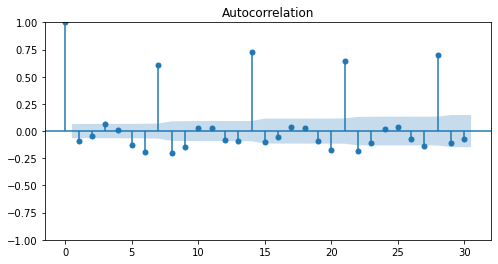

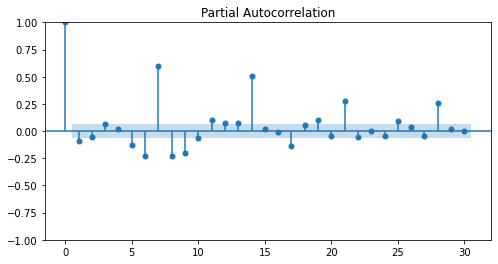

-----ACF and PCF for Customers-------


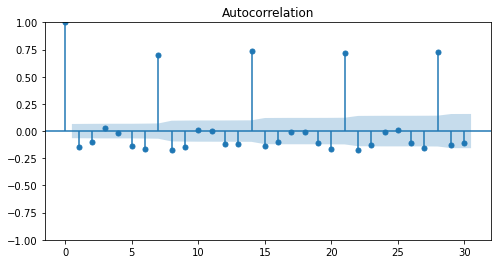

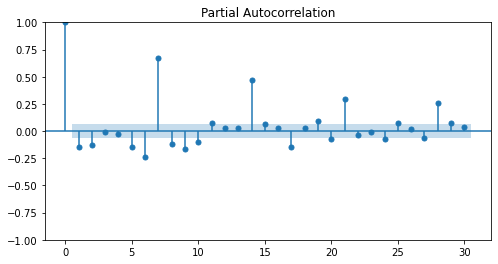

In [333]:
#Plot acf and pacf for store9 sales data
print('-----ACF and PCF for Sales-------')
plot_autocorrelation(store9_train.Sales,30)
print('-----ACF and PCF for Customers-------')
#Plot acf and pacf for customers  data
plot_autocorrelation(store9_train.Customers,30)


There is a weekely spike happening in the acf plot. The same is reflecting in pacf plot as well, so s can be taken as 7. Cannot find a significant correlation in both acf and pacf plots


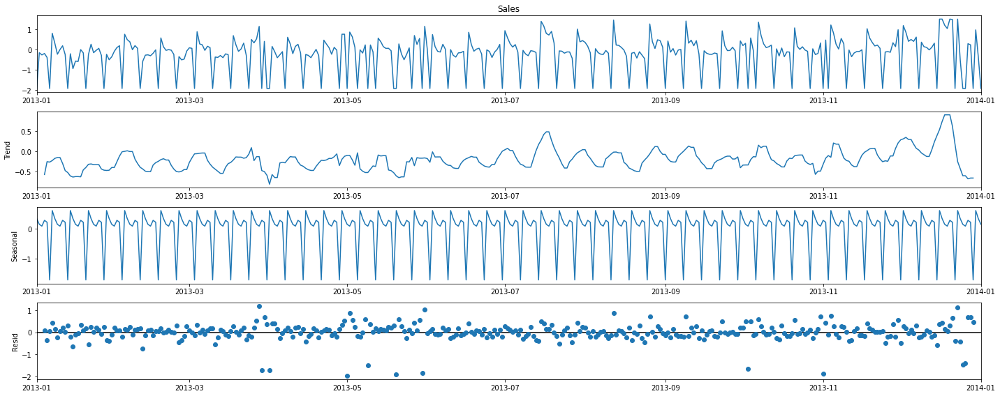

In [335]:
# Let's try to decompose the data to identify if there are any seasonal components
rcParams['figure.figsize'] = 20, 8
decomposition = sm.tsa.seasonal_decompose(store9_train.Sales[:'2014-01-01'], model='additive') # additive seasonal index
fig = decomposition.plot()
plt.show()


Clearly the series is random and the values are fluctuating throughout the year. The peaks come after 7 days.


In [336]:
# Create start and end indexes
store9_start = store9_test.index.min()
store9_end = store9_test.index.max()



#### 5.5 Build SARIMA model



In [338]:
#As the acf and pacf plots are showing significant correlations for higher orders we will try few values for p and q and then go with the model with least AIC values.

# Create combinations for lag and ma orderes for both seasonal and non seasonal components
p = q = range(0, 3)
d = range(0, 1)
pdq = list(itertools.product(p, d, q))
p = d = q = range(0, 2)
seasonal_pdq = [(x[0], x[1], x[2], 7) for x in list(itertools.product(p, d, q))]

print('Examples of parameter combinations for Seasonal ARIMA...')
print('SARIMAX: {} x {}'.format(pdq[1], seasonal_pdq[1]))
print('SARIMAX: {} x {}'.format(pdq[1], seasonal_pdq[2]))
print('SARIMAX: {} x {}'.format(pdq[2], seasonal_pdq[3]))
print('SARIMAX: {} x {}'.format(pdq[2], seasonal_pdq[4]))


Examples of parameter combinations for Seasonal ARIMA...
SARIMAX: (0, 0, 1) x (0, 0, 1, 7)
SARIMAX: (0, 0, 1) x (0, 1, 0, 7)
SARIMAX: (0, 0, 2) x (0, 1, 1, 7)
SARIMAX: (0, 0, 2) x (1, 0, 0, 7)


In [339]:
for param in pdq:
    for param_seasonal in seasonal_pdq:
        try:
            model = SARIMAX(store9_train.Sales,
                            order=param,
                            seasonal_order=param_seasonal)
    

            results = model.fit()

            print('ARIMA{}x{} - AIC:{}'.format(param, param_seasonal, results.aic))
        except:
            continue


ARIMA(0, 0, 0)x(0, 0, 0, 7) - AIC:2556.0893597684108
ARIMA(0, 0, 0)x(0, 0, 1, 7) - AIC:2372.247887745737
ARIMA(0, 0, 0)x(0, 1, 0, 7) - AIC:2312.0749085089506
ARIMA(0, 0, 0)x(0, 1, 1, 7) - AIC:1580.4508819315024
ARIMA(0, 0, 0)x(1, 0, 0, 7) - AIC:2142.626635253212
ARIMA(0, 0, 0)x(1, 0, 1, 7) - AIC:1599.5410667243875
ARIMA(0, 0, 0)x(1, 1, 0, 7) - AIC:1804.253415618769
ARIMA(0, 0, 0)x(1, 1, 1, 7) - AIC:1523.2888279788585
ARIMA(0, 0, 1)x(0, 0, 0, 7) - AIC:2550.1028407331514
ARIMA(0, 0, 1)x(0, 0, 1, 7) - AIC:2372.8979830801063
ARIMA(0, 0, 1)x(0, 1, 0, 7) - AIC:2266.331725796362
ARIMA(0, 0, 1)x(0, 1, 1, 7) - AIC:1559.3214024782242
ARIMA(0, 0, 1)x(1, 0, 0, 7) - AIC:2119.4371837951367
ARIMA(0, 0, 1)x(1, 0, 1, 7) - AIC:1578.80813837399
ARIMA(0, 0, 1)x(1, 1, 0, 7) - AIC:1802.3282816988844
ARIMA(0, 0, 1)x(1, 1, 1, 7) - AIC:1515.9970424759542
ARIMA(0, 0, 2)x(0, 0, 0, 7) - AIC:2551.197144359944
ARIMA(0, 0, 2)x(0, 0, 1, 7) - AIC:2372.206918658837
ARIMA(0, 0, 2)x(0, 1, 0, 7) - AIC:2216.66846227724
ARI

/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(2, 0, 2)x(0, 0, 0, 7) - AIC:2298.015132586731
ARIMA(2, 0, 2)x(0, 0, 1, 7) - AIC:2295.8256196312805
ARIMA(2, 0, 2)x(0, 1, 0, 7) - AIC:2010.839815600677
ARIMA(2, 0, 2)x(0, 1, 1, 7) - AIC:1466.6106660829319


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(2, 0, 2)x(1, 0, 0, 7) - AIC:1946.14050378181


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(2, 0, 2)x(1, 0, 1, 7) - AIC:1485.8842675499134


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(2, 0, 2)x(1, 1, 0, 7) - AIC:1697.5072599593304
ARIMA(2, 0, 2)x(1, 1, 1, 7) - AIC:1462.9819065461127


ARIMA(1, 0, 2)x(1, 1, 1, 7) - AIC:1500.8960354001583 is the least.


In [340]:
store9_SARIMA = SARIMAX(store9_train.Sales,
                                order=(1, 0, 2),
                                seasonal_order=(1, 1, 1, 7))
            
store9_SARIMA = store9_SARIMA.fit()
store9_SARIMA.summary()


<class 'statsmodels.iolib.summary.Summary'>
"""
                                      SARIMAX Results                                      
===========================================================================================
Dep. Variable:                               Sales   No. Observations:                  900
Model:             SARIMAX(1, 0, 2)x(1, 1, [1], 7)   Log Likelihood                -744.448
Date:                             Mon, 05 Sep 2022   AIC                           1500.896
Time:                                     23:22:37   BIC                           1529.664
Sample:                                 01-01-2013   HQIC                          1511.890
                                      - 06-19-2015                                         
Covariance Type:                               opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.4722      0.162      2.910      0.004       0.154       0.790
ma.L1         -0.3826      0.157     -2.434      0.015      -0.691      -0.075
ma.L2          0.1203      0.048      2.519      0.012       0.027       0.214
ar.S.L7       -0.2058      0.028     -7.453      0.000      -0.260      -0.152
ma.S.L7       -0.9175      0.015    -62.964      0.000      -0.946      -0.889
sigma2         0.3048      0.007     41.377      0.000       0.290       0.319
===================================================================================
Ljung-Box (L1) (Q):                   0.02   Jarque-Bera (JB):              3537.10
Prob(Q):                              0.90   Prob(JB):                         0.00
Heteroskedasticity (H):               1.81   Skew:                            -2.17
Prob(H) (two-sided):                  0.00   Kurtosis:                        11.73
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

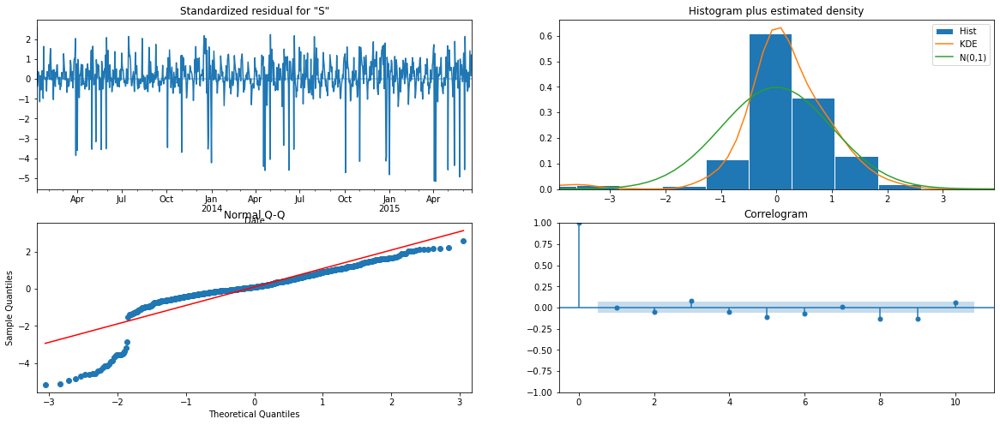

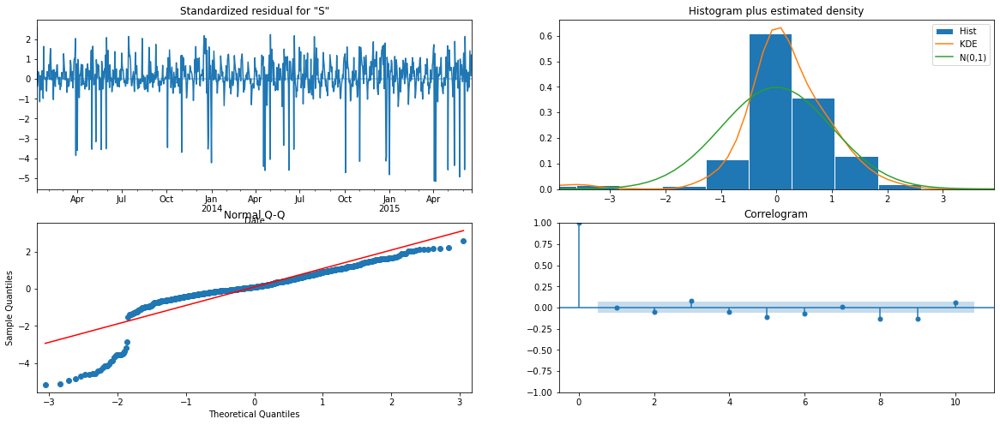

In [341]:
# Plot diagnostics
store9_SARIMA.plot_diagnostics()



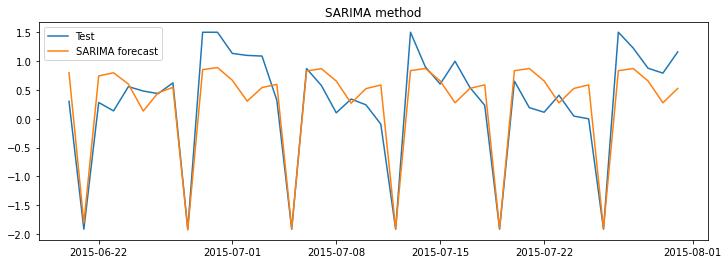

,Model,RMSE,MAPE,AIC
0,SARIMA,0.43,10.75,1500.896035


In [342]:
#Now let's calculate RMSE and MAPE score
# Create a results dataframe
Results_store9 = pd.DataFrame(columns=['Model', 'RMSE' ,'MAPE','AIC'])

calculate_metrics(store9_test.Sales,store9_SARIMA.predict(store9_start,store9_end),Results_store9,'SARIMA',store9_SARIMA.aic)



#### 5.6 Build SARIMAX model with exogenous variable


In [343]:
print(list(store9_train.columns))


['Sales', 'Customers', 'Open', 'Promo', 'StateHoliday', 'SchoolHoliday', 1, 2, 3, 4, 5, 6, 7]


In [344]:
store9_SARIMAX = SARIMAX(store9_train.Sales,
                                order=(1, 0, 2),
                                seasonal_order=(1, 1, 1, 7),
                         exog=store9_train[['Open', 'Promo', 'StateHoliday', 'SchoolHoliday',  1, 2, 3, 4, 5, 6, 7]])

store9_SARIMAX = store9_SARIMAX.fit()
store9_SARIMAX.summary()
          

<class 'statsmodels.iolib.summary.Summary'>
"""
                                      SARIMAX Results                                      
===========================================================================================
Dep. Variable:                               Sales   No. Observations:                  900
Model:             SARIMAX(1, 0, 2)x(1, 1, [1], 7)   Log Likelihood                 -62.727
Date:                             Mon, 05 Sep 2022   AIC                            159.454
Time:                                     23:25:19   BIC                            240.962
Sample:                                 01-01-2013   HQIC                           190.603
                                      - 06-19-2015                                         
Covariance Type:                               opg                                         
=================================================================================
                    coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------
Open              1.2136      0.015     81.295      0.000       1.184       1.243
Promo             0.6295      0.028     22.886      0.000       0.576       0.683
StateHoliday     -1.2140      0.015    -81.322      0.000      -1.243      -1.185
SchoolHoliday     0.0988      0.028      3.580      0.000       0.045       0.153
1             -1.076e-08   6.86e-11   -156.815      0.000   -1.09e-08   -1.06e-08
2             -6.795e-08   5.37e-10   -126.515      0.000    -6.9e-08   -6.69e-08
3             -2.064e-08   5.35e-10    -38.611      0.000   -2.17e-08   -1.96e-08
4             -3.241e-09   4.08e-10     -7.936      0.000   -4.04e-09   -2.44e-09
5              9.089e-09   3.85e-10     23.597      0.000    8.33e-09    9.84e-09
6              3.624e-08   3.64e-10     99.531      0.000    3.55e-08    3.69e-08
7              1.827e-08   3.49e-10     52.299      0.000    1.76e-08     1.9e-08
ar.L1             0.8411      0.039     21.620      0.000       0.765       0.917
ma.L1            -0.5861      0.050    -11.711      0.000      -0.684      -0.488
ma.L2             0.0103      0.033      0.311      0.756      -0.055       0.075
ar.S.L7          -0.1949      0.034     -5.816      0.000      -0.261      -0.129
ma.S.L7          -0.8791      0.017    -51.654      0.000      -0.912      -0.846
sigma2            0.0664      0.003     26.261      0.000       0.061       0.071
===================================================================================
Ljung-Box (L1) (Q):                   0.00   Jarque-Bera (JB):                52.73
Prob(Q):                              0.95   Prob(JB):                         0.00
Heteroskedasticity (H):               1.19   Skew:                             0.14
Prob(H) (two-sided):                  0.13   Kurtosis:                         4.15
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
[2] Covariance matrix is singular or near-singular, with condition number 6.01e+32. Standard errors may be unstable.
"""

In [345]:
store9_SARIMAX1 = SARIMAX(store9_train.Sales,
                                order=(1, 0, 1),
                                seasonal_order=(1, 1, 1, 7),
                         exog=store9_train[['Open', 'Promo', 'StateHoliday', 'SchoolHoliday',  1, 2, 3, 4, 5, 6, 7]])

store9_SARIMAX1 = store9_SARIMAX1.fit()
store9_SARIMAX1.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                     
=========================================================================================
Dep. Variable:                             Sales   No. Observations:                  900
Model:             SARIMAX(1, 0, 1)x(1, 1, 1, 7)   Log Likelihood                 -62.760
Date:                           Mon, 05 Sep 2022   AIC                            157.520
Time:                                   23:26:09   BIC                            234.233
Sample:                               01-01-2013   HQIC                           186.836
                                    - 06-19-2015                                         
Covariance Type:                             opg                                         
=================================================================================
                    coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------
Open              1.2148    518.026      0.002      0.998   -1014.098    1016.528
Promo             0.6298      0.027     23.076      0.000       0.576       0.683
StateHoliday     -1.2152    518.024     -0.002      0.998   -1016.523    1014.093
SchoolHoliday     0.0988      0.028      3.583      0.000       0.045       0.153
1             -7.677e-09   7376.387  -1.04e-12      1.000   -1.45e+04    1.45e+04
2             -6.041e-08   7271.055  -8.31e-12      1.000   -1.43e+04    1.43e+04
3             -1.826e-08   7317.307   -2.5e-12      1.000   -1.43e+04    1.43e+04
4             -3.008e-09   7349.035  -4.09e-13      1.000   -1.44e+04    1.44e+04
5              7.859e-09   7358.008   1.07e-12      1.000   -1.44e+04    1.44e+04
6              3.105e-08   7384.490    4.2e-12      1.000   -1.45e+04    1.45e+04
7              1.407e-08   7406.250    1.9e-12      1.000   -1.45e+04    1.45e+04
ar.L1             0.8464      0.031     27.139      0.000       0.785       0.908
ma.L1            -0.5865      0.048    -12.276      0.000      -0.680      -0.493
ar.S.L7          -0.1940      0.033     -5.801      0.000      -0.260      -0.128
ma.S.L7          -0.8797      0.017    -51.880      0.000      -0.913      -0.846
sigma2            0.0664      0.003     26.149      0.000       0.061       0.071
===================================================================================
Ljung-Box (L1) (Q):                   0.04   Jarque-Bera (JB):                53.15
Prob(Q):                              0.85   Prob(JB):                         0.00
Heteroskedasticity (H):               1.19   Skew:                             0.14
Prob(H) (two-sided):                  0.13   Kurtosis:                         4.16
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
[2] Covariance matrix is singular or near-singular, with condition number 3.21e+18. Standard errors may be unstable.
"""

In [346]:
store9_SARIMAX2 = SARIMAX(store9_train.Sales,
                                order=(1, 0, 1),
                                seasonal_order=(1, 1, 1, 7),
                         exog=store9_train[['Open', 'Promo', 'StateHoliday', 'SchoolHoliday']])

store9_SARIMAX2 = store9_SARIMAX2.fit()
store9_SARIMAX2.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                     
=========================================================================================
Dep. Variable:                             Sales   No. Observations:                  900
Model:             SARIMAX(1, 0, 1)x(1, 1, 1, 7)   Log Likelihood                 -62.760
Date:                           Mon, 05 Sep 2022   AIC                            143.520
Time:                                   23:27:16   BIC                            186.671
Sample:                               01-01-2013   HQIC                           160.010
                                    - 06-19-2015                                         
Covariance Type:                             opg                                         
=================================================================================
                    coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------
Open              1.2148      0.015     81.690      0.000       1.186       1.244
Promo             0.6298      0.027     23.126      0.000       0.576       0.683
StateHoliday     -1.2152      0.015    -81.715      0.000      -1.244      -1.186
SchoolHoliday     0.0988      0.027      3.613      0.000       0.045       0.152
ar.L1             0.8464      0.031     27.157      0.000       0.785       0.907
ma.L1            -0.5865      0.048    -12.287      0.000      -0.680      -0.493
ar.S.L7          -0.1940      0.033     -5.819      0.000      -0.259      -0.129
ma.S.L7          -0.8797      0.017    -52.175      0.000      -0.913      -0.847
sigma2            0.0664      0.003     26.408      0.000       0.062       0.071
===================================================================================
Ljung-Box (L1) (Q):                   0.04   Jarque-Bera (JB):                53.15
Prob(Q):                              0.85   Prob(JB):                         0.00
Heteroskedasticity (H):               1.19   Skew:                             0.14
Prob(H) (two-sided):                  0.13   Kurtosis:                         4.16
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
[2] Covariance matrix is singular or near-singular, with condition number 2.77e+16. Standard errors may be unstable.
"""

We have an improved model with lesser aic and almost all variables are significant here


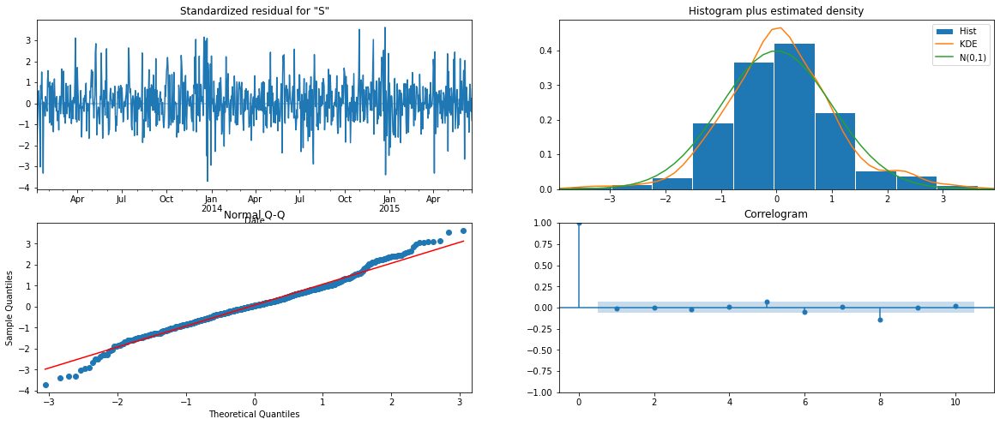

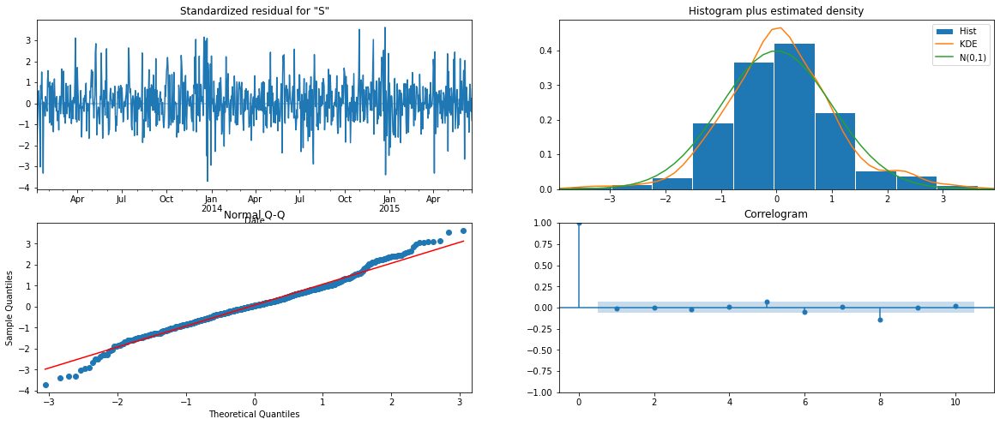

In [347]:
# Plot diagnostics
store9_SARIMAX2.plot_diagnostics()


Residuals are normaly distributed.


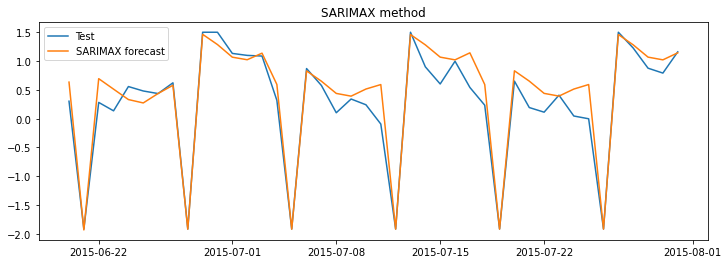

,Model,RMSE,MAPE,AIC
0,SARIMA,0.43,10.75,1500.896035
1,SARIMAX,0.28,10.56,143.520061


In [348]:
# Calculate rmse and mape
calculate_metrics(store9_test.Sales,store9_SARIMAX2.predict(store9_start,store9_end,
                exog=store9_test[['Open', 'Promo', 'StateHoliday', 'SchoolHoliday']]),
                  Results_store9,'SARIMAX',store9_SARIMAX2.aic)

We have an improved rmse and mape values but the weekely peeks are not captured well here.


#### 5.7 Build VARMAX model with exogenous variable

In [349]:
#From the previously run adf test we know that both Sales and Customers time serieses are stationary and they move together. So let's build a VARMAX model this time
store9_VARMAX = sm.tsa.VARMAX(store9_train[['Sales', 'Customers']], order=(1,1),trend='n',
                              exog=store9_train[['Open', 'Promo', 'StateHoliday', 'SchoolHoliday']])
store9_VARMAX = store9_VARMAX.fit(maxiter=1000, disp=False)
print(store9_VARMAX.summary())


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/statespace/varmax.py:163: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  EstimationWarning)


                             Statespace Model Results                             
Dep. Variable:     ['Sales', 'Customers']   No. Observations:                  900
Model:                        VARMAX(1,1)   Log Likelihood                -109.555
Date:                    Mon, 05 Sep 2022   AIC                            257.111
Time:                            23:32:00   BIC                            348.356
Sample:                        01-01-2013   HQIC                           291.967
                             - 06-19-2015                                         
Covariance Type:                      opg                                         
Ljung-Box (L1) (Q):          21.23, 114.95   Jarque-Bera (JB):          3.26, 19.24
Prob(Q):                        0.00, 0.00   Prob(JB):                   0.20, 0.00
Heteroskedasticity (H):         1.07, 1.64   Skew:                       0.11, 0.24
Prob(H) (two-sided):            0.56, 0.00   Kurtosis:                   3.20, 2.47


In [350]:
#Remove schoolHoliday as it is insignificant
store9_VARMAX1 = sm.tsa.VARMAX(store9_train[['Sales', 'Customers']], order=(1,1),trend='n',
                              exog=store9_train[['Open', 'Promo', 'StateHoliday']])
store9_VARMAX1 = store9_VARMAX1.fit(maxiter=1000, disp=False)
print(store9_VARMAX1.summary())

/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/statespace/varmax.py:163: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  EstimationWarning)


                             Statespace Model Results                             
Dep. Variable:     ['Sales', 'Customers']   No. Observations:                  900
Model:                        VARMAX(1,1)   Log Likelihood                -108.409
Date:                    Mon, 05 Sep 2022   AIC                            250.819
Time:                            23:34:05   BIC                            332.459
Sample:                        01-01-2013   HQIC                           282.006
                             - 06-19-2015                                         
Covariance Type:                      opg                                         
Ljung-Box (L1) (Q):          20.80, 150.19   Jarque-Bera (JB):           0.34, 5.69
Prob(Q):                        0.00, 0.00   Prob(JB):                   0.85, 0.06
Heteroskedasticity (H):         1.09, 2.08   Skew:                      0.02, -0.03
Prob(H) (two-sided):            0.45, 0.00   Kurtosis:                   3.09, 2.61


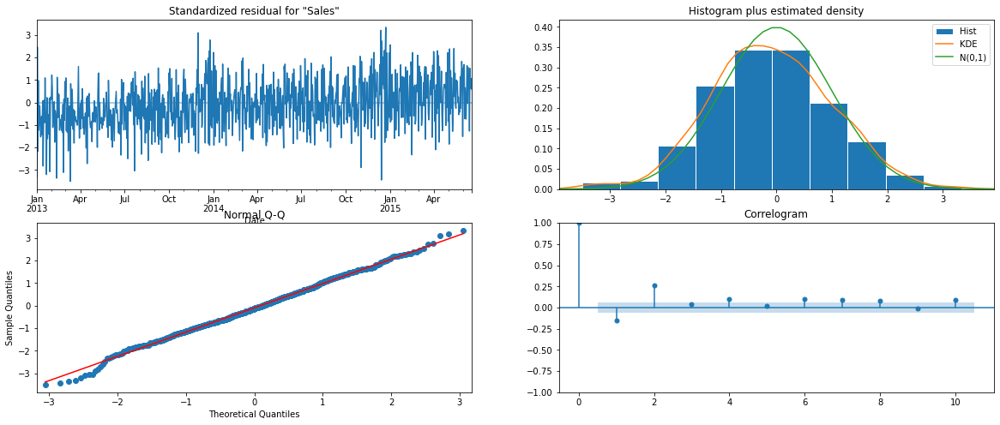

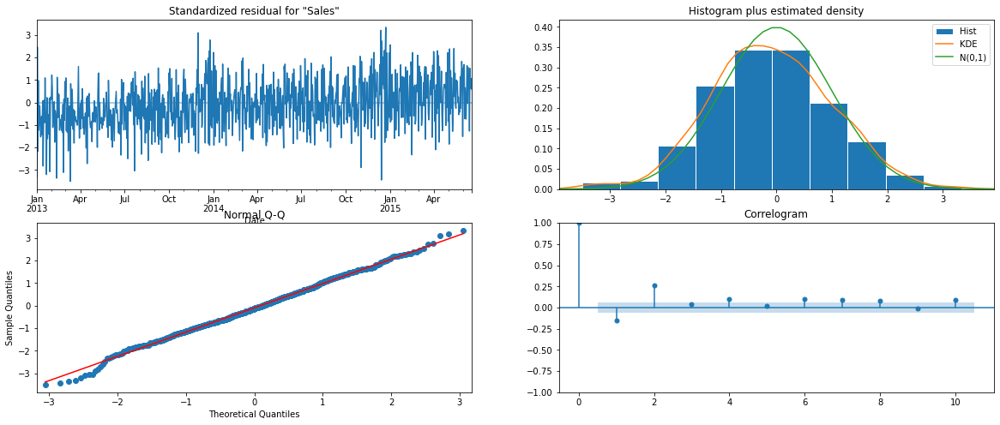

In [351]:
store9_VARMAX1.plot_diagnostics()


Residuals are almost normally distributed


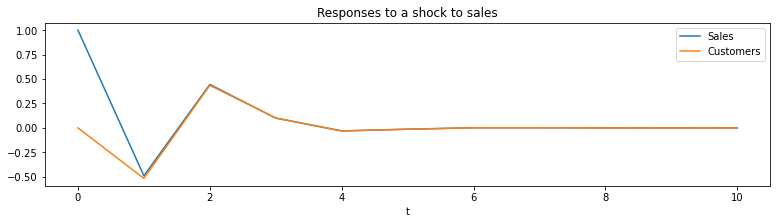

In [353]:
##### Check impluse response function


ax = store9_VARMAX1.impulse_responses(10, orthogonalized=False).plot(figsize=(13,3))
ax.set(xlabel='t', title='Responses to a shock to sales');


As per the model after 4 lags the values of both sales and customers stabilises.


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/statespace/varmax.py:163: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  EstimationWarning)
/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/statespace/varmax.py:163: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  EstimationWarning)


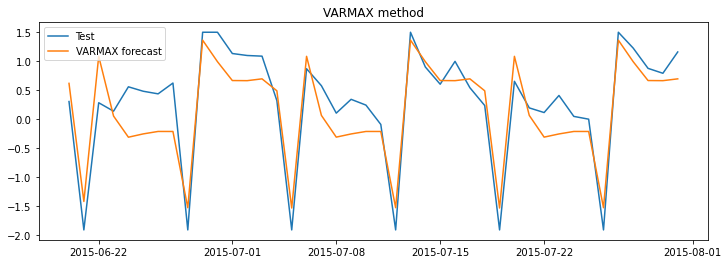

,Model,RMSE,MAPE,AIC
0,SARIMA,0.43,10.75,1500.896035
1,SARIMAX,0.28,10.56,143.520061
2,VARMAX,0.43,4.37,250.818524


In [354]:
# Calculate rmse and mapre
calculate_metrics(store9_test.Sales,store9_VARMAX1.predict(store9_start,store9_end,
                exog=store9_test[['Open', 'Promo', 'StateHoliday' ]])['Sales'],
                  Results_store9,'VARMAX',store9_VARMAX1.aic)

MAPE is the least for Sales predicted by VARMAX model. So we will go with the VARMAX model for store9


## 6. Build model for store13

##### 6.1 Analyse data 


In [422]:
store_13.head(1)

,DayOfWeek,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,Promo2,PromoInterval,CompetitionSince,SaleYear,SaleMonth
Date,,,,,,,,,,,,
2013-01-01,2,0,0,0,0,a,1,1,"Feb,May,Aug,Nov",NaT,2013,1



- store 13 has promotion running in Feb, MAy, Aug and Nov. We will recreate a Promo2 column with a value of 1 for Feb, MAy, Aug, Nov months and rest all values as zero.
- Competition columns can be deleted

In [423]:
store_13.Promo2 = store_13.SaleMonth.apply(lambda x: 1 if x in ([2,5,8,11]) else 0)
store_13.Promo2.value_counts()


0    520
1    238
Name: Promo2, dtype: int64

In [424]:
store_13.describe(include='all')


,DayOfWeek,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,Promo2,PromoInterval,CompetitionSince,SaleYear,SaleMonth
count,758.000000,758.000000,758.000000,758.000000,758.000000,758,758.000000,758.000000,758,0,758.000000,758.000000
unique,NaN,NaN,NaN,NaN,NaN,4,NaN,NaN,1,0,NaN,NaN
top,NaN,NaN,NaN,NaN,NaN,0,NaN,NaN,"Feb,May,Aug,Nov",NaN,NaN,NaN
freq,NaN,NaN,NaN,NaN,NaN,729,NaN,NaN,758,NaN,NaN,NaN
mean,4.001319,4124.773087,313.641161,0.819261,0.377309,NaN,0.163588,0.313984,NaN,NaN,2013.798153,5.104222
std,1.999009,2429.243956,167.602980,0.385056,0.485033,NaN,0.370146,0.464416,NaN,NaN,0.849366,3.077331
min,1.000000,0.000000,0.000000,0.000000,0.000000,NaN,0.000000,0.000000,NaN,NaN,2013.000000,1.000000
25%,2.000000,3135.250000,276.000000,1.000000,0.000000,NaN,0.000000,0.000000,NaN,NaN,2013.000000,3.000000
50%,4.000000,4261.500000,345.500000,1.000000,0.000000,NaN,0.000000,0.000000,NaN,NaN,2014.000000,5.000000
75%,6.000000,5784.250000,421.000000,1.000000,1.000000,NaN,0.000000,1.000000,NaN,NaN,2015.000000,7.000000


In [425]:
# Remove PromoInterval,CompetitionSince columns from store_13 data
store_13.drop(labels=['PromoInterval','CompetitionSince'],axis=1,inplace=True)
store_13.shape

(758, 10)

In [426]:
#set frequency for the dataset
store_13.index.freq = store_13.index.inferred_freq
store_13.index

DatetimeIndex(['2013-01-01', '2013-01-02', '2013-01-03', '2013-01-04',
               '2013-01-05', '2013-01-06', '2013-01-07', '2013-01-08',
               '2013-01-09', '2013-01-10',
               ...
               '2015-07-22', '2015-07-23', '2015-07-24', '2015-07-25',
               '2015-07-26', '2015-07-27', '2015-07-28', '2015-07-29',
               '2015-07-30', '2015-07-31'],
              dtype='datetime64[ns]', name='Date', length=758, freq=None)

Data frequency is not set. We have missing data here

In [427]:
print(pd.date_range('2013-01-01', '2015-07-31').difference(store_13.index))

DatetimeIndex(['2014-07-01', '2014-07-02', '2014-07-03', '2014-07-04',
               '2014-07-05', '2014-07-06', '2014-07-07', '2014-07-08',
               '2014-07-09', '2014-07-10',
               ...
               '2014-12-22', '2014-12-23', '2014-12-24', '2014-12-25',
               '2014-12-26', '2014-12-27', '2014-12-28', '2014-12-29',
               '2014-12-30', '2014-12-31'],
              dtype='datetime64[ns]', length=184, freq=None)


We have 6 months of missing data

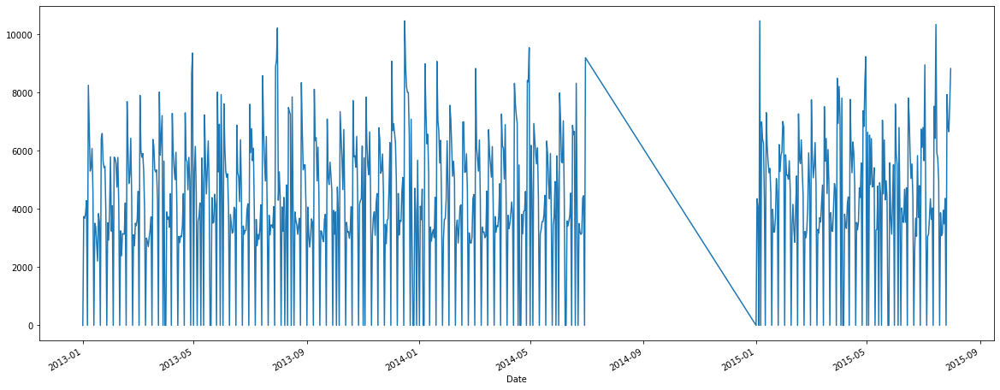

In [428]:
store_13.Sales.plot()
plt.show()

Let's use data from '2013-01-01' to '2014-06-30' for training and the last 42 days data(from '2015-07-31')  for testing.

In [429]:
print(store_13.StateHoliday.value_counts())
# Check the sales by state holiday
store_13.groupby(by=['StateHoliday'])['Sales'].sum()

0    729
a     21
b      6
c      2
Name: StateHoliday, dtype: int64


StateHoliday
0    3126578
a          0
b          0
c          0
Name: Sales, dtype: int64

Sales is zero whenever there is a state holiday. So it is better make the variables having only 2 levels,
1 for  state holiday and 0 for non-holiday.

In [430]:
store_13.StateHoliday= store_13.StateHoliday.apply(lambda x : 0 if x=='0' else 1)

store_13.StateHoliday.value_counts()

0    729
1     29
Name: StateHoliday, dtype: int64

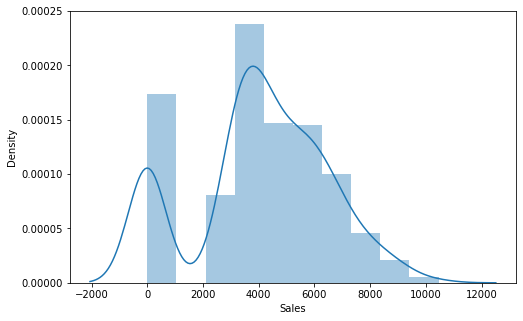

In [431]:
# Check the distribution of sales
plt.figure(figsize=(8,5))
sns.distplot(store_13.Sales['2013-01-01':'2014-07-01'],bins=10)
plt.show()




Looks like Sales has a right skewed distribution. Also lot of data points are having zero as sales value and that is a valid value as sales will be zero for holidays. Now let's check for outliers



###### Check for outliers


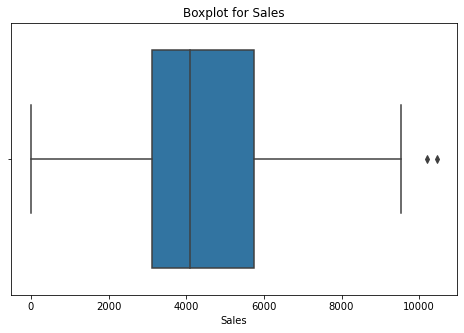

Quartile values for Sales
0.750     5742.500
0.800     6095.000
0.900     6987.500
0.990     9092.450
0.995     9404.775
0.999    10322.565
1.000    10455.000
Name: Sales, dtype: float64


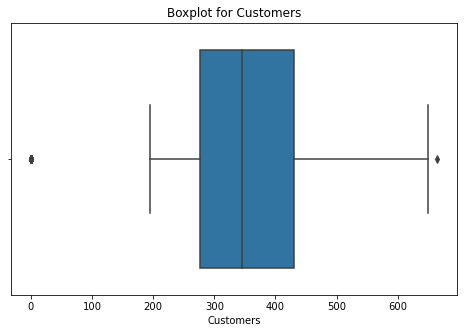

Quartile values for Customers
0.750    429.750
0.800    448.000
0.900    501.500
0.990    624.650
0.995    642.100
0.999    655.825
1.000    664.000
Name: Customers, dtype: float64


In [432]:
check_outliers(store_13[['Sales','Customers']]['2013-01-01':'2014-07-01'])


In [433]:
#For Values > 0.99th percentile value, we can do capping method to set them as 99th percentile value.
sales_cap = store_13.Sales['2013-01-01':'2014-07-01'].quantile(.99)
Customers_cap = store_13.Customers['2013-01-01':'2014-07-01'].quantile(.99)


store_13.loc[store_13.Sales > sales_cap,'Sales'] =  sales_cap
store_13.loc[store_13.Customers > Customers_cap,'Customers'] =  Customers_cap

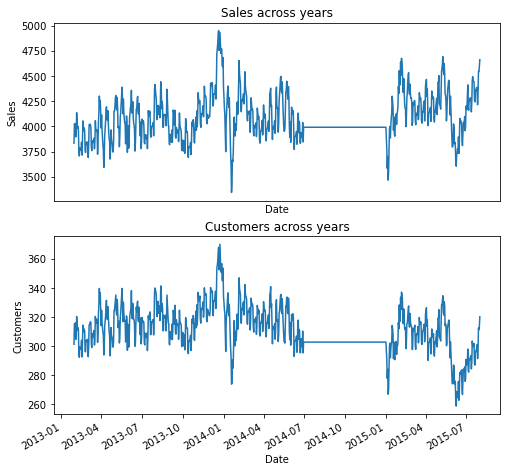

In [434]:
# Plot sales data using a rolling window
plt.figure(figsize=(8,8))
plt.subplot(2,1,1)
plt.title('Sales across years')
store_13.Sales.rolling(30).mean().plot()
plt.xticks([])
plt.ylabel('Sales')

plt.subplot(2,1,2)
plt.title('Customers across years')
store_13.Customers.rolling(30).mean().plot()
plt.xlabel('Date')
plt.ylabel('Customers')
plt.show()

We have two time series here, sales and customers. Sale value is directly proportional to number of customers.
Sales is peaking in December month.

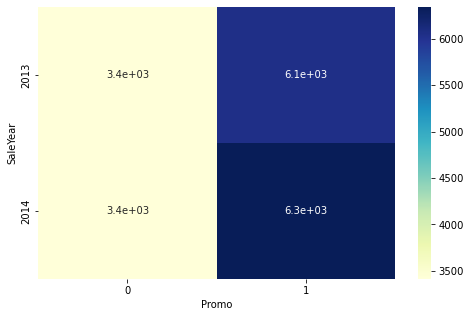

In [435]:
# Relation between sales and Promo
plt.figure(figsize=(8,5))
sns.heatmap(store_13['2013-01-01':'2014-07-01'].groupby(by=['SaleYear','Promo'])['Sales'].median().unstack(),cmap="YlGnBu",annot=True)
plt.show()


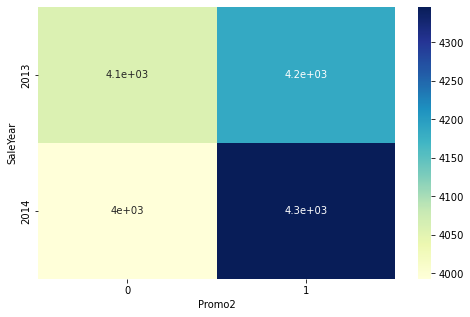

In [436]:
# Relation between sales and Promo2
plt.figure(figsize=(8,5))
sns.heatmap(store_13['2013-01-01':'2014-07-01'].groupby(by=['SaleYear','Promo2'])['Sales'].median().unstack(),cmap="YlGnBu",annot=True)
plt.show()

Promo and Promo2 has an influence on sales 

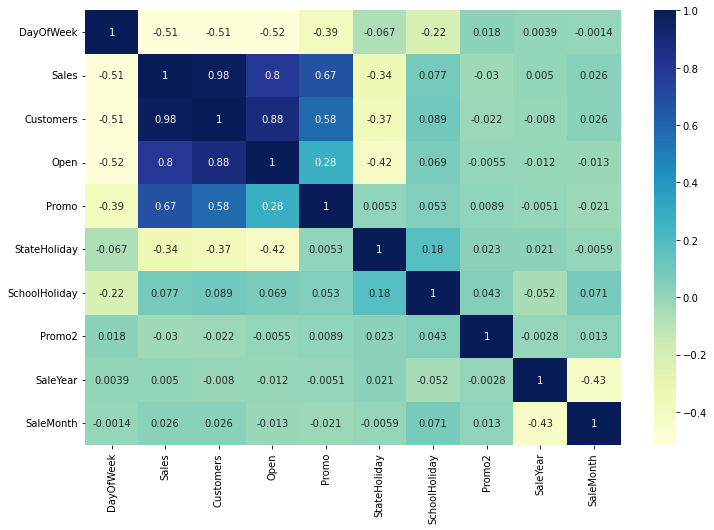

In [437]:

###### Check correlation between data points

store13_corr = store_13['2013-01-01':'2014-07-01'].corr()

plt.figure(figsize=(12,8))
sns.heatmap(store13_corr,annot=True,cmap='YlGnBu')
plt.show()


- Sales is having a high correlation with Customers,Open and Promo
`

##### Preprocess data


In [438]:
# Drop SaleYear and SaleMonth columns
store_13.drop(['SaleYear','SaleMonth'],inplace=True,axis=1)


In [439]:
store_13.head(1)

,DayOfWeek,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,Promo2
Date,,,,,,,,
2013-01-01,2,0.0,0.0,0,0,1,1,0


In [440]:
# Make DayOfWeek as a onehot encoded variable
store_13 = pd.concat([store_13.iloc[:,1:],pd.get_dummies(store_13.DayOfWeek)],axis=1)
store_13.shape

(758, 14)

##### 6.2 Split the data into train and test.


In [441]:
#['2013-01-01':'2014-07-01'] - Make this time range as test
# 42 days before 2015-07-31 as test
store13_train = store_13['2013-01-01':'2014-07-01'].copy()
print('train set shape:',store13_train.shape)
store13_test  = store_13[-42:].copy()
print('test set shape:',store13_test.shape)

train set shape: (546, 14)
test set shape: (42, 14)


##### Standardize  data


In [442]:
# Standardize train data
scaler = StandardScaler()
store13_train[['Sales','Customers']] = scaler.fit_transform(store13_train[['Sales','Customers']])
print(store13_train.head())
store13_test[['Sales','Customers']] = scaler.transform(store13_test[['Sales','Customers']])
print(store13_test.head())


               Sales  Customers  Open  Promo  StateHoliday  SchoolHoliday  \
Date                                                                        
2013-01-01 -1.691945  -1.862465     0      0             1              1   
2013-01-02 -0.134494   0.001433     1      0             0              1   
2013-01-03 -0.160750  -0.145562     1      0             0              1   
2013-01-04 -0.088233   0.136669     1      0             0              1   
2013-01-05  0.093893   0.160188     1      0             0              0   

            Promo2  1  2  3  4  5  6  7  
Date                                     
2013-01-01       0  0  1  0  0  0  0  0  
2013-01-02       0  0  0  1  0  0  0  0  
2013-01-03       0  0  0  0  1  0  0  0  
2013-01-04       0  0  0  0  0  1  0  0  
2013-01-05       0  0  0  0  0  0  1  0  
               Sales  Customers  Open  Promo  StateHoliday  SchoolHoliday  \
Date                                                                        
2015-06-20  

##### 6.3 Check stationarity of the series




In [443]:
# Check stationarity of sales series
adf_test(store13_train.Sales) # ADF test--> H0: Not stationary, H1: Is stationary if p<0.05 then reject H0 then series is stationary 
# Check stationarity of Customers series
adf_test(store13_train.Customers)




Sales: ADF test results:
ADF Statistic: -7.160619
p-value: 0.000000
Critical Values:
	1%: -3.443
	5%: -2.867
	10%: -2.570

Customers: ADF test results:
ADF Statistic: -7.110452
p-value: 0.000000
Critical Values:
	1%: -3.443
	5%: -2.867
	10%: -2.570


ADF test: As the p-value is < 0.05 for both sales and customers they are stationary.


##### 6.4 Autocorrelation function (ACF) and Partial autocorrelation function (PACF)
Let's plot ACF to find q value and PACF to know p value


-----ACF and PCF for Sales-------


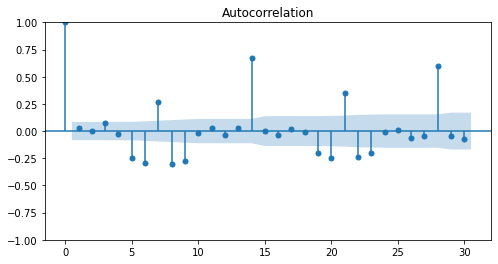

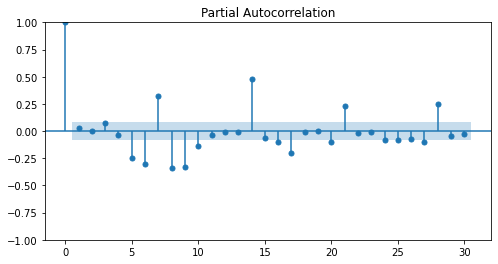

-----ACF and PCF for Customers-------


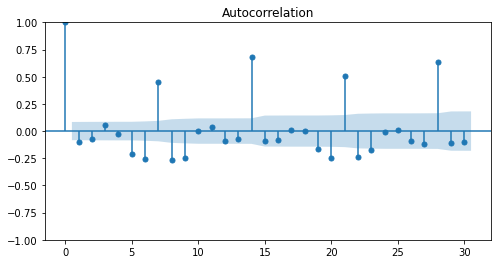

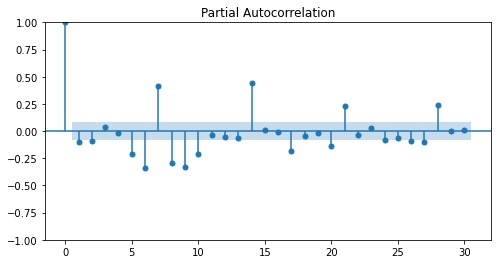

In [456]:

#Plot acf and pacf for store13 sales data
print('-----ACF and PCF for Sales-------')
plot_autocorrelation(store13_train.Sales,30)
print('-----ACF and PCF for Customers-------')
#Plot acf and pacf for customers  data
plot_autocorrelation(store13_train.Customers,30)

There is a weekely spike happening in the acf plot. The same is reflecting in pacf plot as well, so s can be taken as 7.


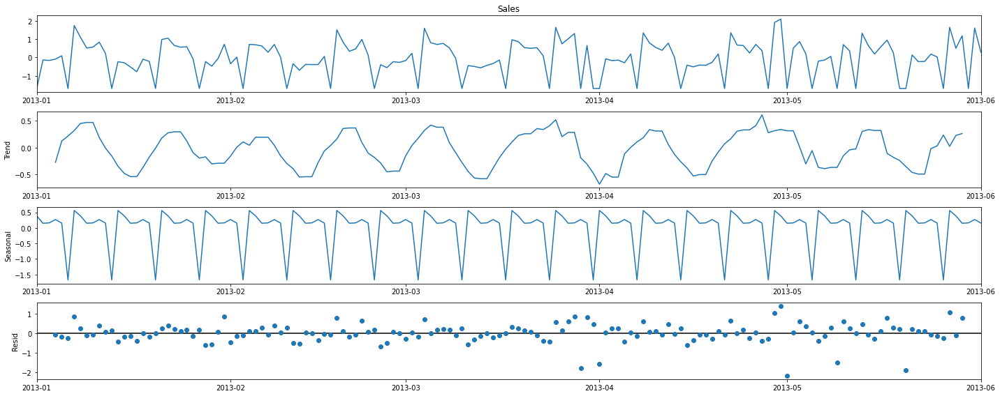

In [446]:
# Let's try to decompose the data to identify if there are any seasonal components
rcParams['figure.figsize'] = 20, 8
decomposition = sm.tsa.seasonal_decompose(store13_train.Sales[:'2013-06-01'], model='additive') # additive seasonal index
fig = decomposition.plot()
plt.show()


Clearly the series is random and the values are fluctuating throughout the year. The peaks come after 7 days.


In [447]:

# Create start and end indexes
store13_start = store13_test.index.min()
store13_end = store13_test.index.max()


#### 6.5 Build SARIMA model


In [454]:
store13_train.index.freq = store13_train.index.inferred_freq
store13_test.index.freq = store13_test.index.inferred_freq

In [457]:
#As the acf and pacf plots are showing significant correlations for higher orders we will try few values for p and q and then go with the model with least AIC values.

# Create combinations for lag and ma orderes for both seasonal and non seasonal components
p = q = range(0, 4)
d = range(0, 1)
pdq = list(itertools.product(p, d, q))
p = q = range(0, 2)
d = range(0, 2)
seasonal_pdq = [(x[0], x[1], x[2], 7) for x in list(itertools.product(p, d, q))]

print('Examples of parameter combinations for Seasonal ARIMA...')
print('SARIMAX: {} x {}'.format(pdq[1], seasonal_pdq[1]))
print('SARIMAX: {} x {}'.format(pdq[1], seasonal_pdq[2]))
print('SARIMAX: {} x {}'.format(pdq[2], seasonal_pdq[3]))
print('SARIMAX: {} x {}'.format(pdq[2], seasonal_pdq[4]))


Examples of parameter combinations for Seasonal ARIMA...
SARIMAX: (0, 0, 1) x (0, 0, 1, 7)
SARIMAX: (0, 0, 1) x (0, 1, 0, 7)
SARIMAX: (0, 0, 2) x (0, 1, 1, 7)
SARIMAX: (0, 0, 2) x (1, 0, 0, 7)


In [458]:
for param in pdq:
    for param_seasonal in seasonal_pdq:
        try:
            model = SARIMAX(store13_train.Sales,
                            order=param,
                            seasonal_order=param_seasonal)
    

            results = model.fit()

            print('SARIMA{} x {}  - AIC:{}'.format(param, param_seasonal, results.aic))
        except:
            continue


SARIMA(0, 0, 0) x (0, 0, 0, 7)  - AIC:1551.4808782595028
SARIMA(0, 0, 0) x (0, 0, 1, 7)  - AIC:1536.2398038662072
SARIMA(0, 0, 0) x (0, 1, 0, 7)  - AIC:1736.073741631139
SARIMA(0, 0, 0) x (0, 1, 1, 7)  - AIC:1185.6006672999374
SARIMA(0, 0, 0) x (1, 0, 0, 7)  - AIC:1513.4266961947142


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


SARIMA(0, 0, 0) x (1, 0, 1, 7)  - AIC:1202.7865374905928
SARIMA(0, 0, 0) x (1, 1, 0, 7)  - AIC:1212.5749167988924
SARIMA(0, 0, 0) x (1, 1, 1, 7)  - AIC:1038.8084901314369
SARIMA(0, 0, 1) x (0, 0, 0, 7)  - AIC:1552.984569348292
SARIMA(0, 0, 1) x (0, 0, 1, 7)  - AIC:1531.5959304261014
SARIMA(0, 0, 1) x (0, 1, 0, 7)  - AIC:1659.7702579888078
SARIMA(0, 0, 1) x (0, 1, 1, 7)  - AIC:1143.8179208523602
SARIMA(0, 0, 1) x (1, 0, 0, 7)  - AIC:1490.6046245705604


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


SARIMA(0, 0, 1) x (1, 0, 1, 7)  - AIC:1162.0181913587153
SARIMA(0, 0, 1) x (1, 1, 0, 7)  - AIC:1208.7889961234705
SARIMA(0, 0, 1) x (1, 1, 1, 7)  - AIC:1035.6052785873505
SARIMA(0, 0, 2) x (0, 0, 0, 7)  - AIC:1554.9841610339815
SARIMA(0, 0, 2) x (0, 0, 1, 7)  - AIC:1530.8570419776413
SARIMA(0, 0, 2) x (0, 1, 0, 7)  - AIC:1582.8185424247854
SARIMA(0, 0, 2) x (0, 1, 1, 7)  - AIC:1109.589621870202
SARIMA(0, 0, 2) x (1, 0, 0, 7)  - AIC:1471.736720195975
SARIMA(0, 0, 2) x (1, 0, 1, 7)  - AIC:1129.0814040517798
SARIMA(0, 0, 2) x (1, 1, 0, 7)  - AIC:1193.3295977245316
SARIMA(0, 0, 2) x (1, 1, 1, 7)  - AIC:1027.1076744884667
SARIMA(0, 0, 3) x (0, 0, 0, 7)  - AIC:1546.4821731165412
SARIMA(0, 0, 3) x (0, 0, 1, 7)  - AIC:1511.295809501444
SARIMA(0, 0, 3) x (0, 1, 0, 7)  - AIC:1573.7028664955453
SARIMA(0, 0, 3) x (0, 1, 1, 7)  - AIC:1094.2335609579104
SARIMA(0, 0, 3) x (1, 0, 0, 7)  - AIC:1453.2965796663104


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


SARIMA(0, 0, 3) x (1, 0, 1, 7)  - AIC:1113.407170621454
SARIMA(0, 0, 3) x (1, 1, 0, 7)  - AIC:1184.0882492065402
SARIMA(0, 0, 3) x (1, 1, 1, 7)  - AIC:1014.9790498920228
SARIMA(1, 0, 0) x (0, 0, 0, 7)  - AIC:1552.9835815023812
SARIMA(1, 0, 0) x (0, 0, 1, 7)  - AIC:1530.364848285476
SARIMA(1, 0, 0) x (0, 1, 0, 7)  - AIC:1612.9428966738124
SARIMA(1, 0, 0) x (0, 1, 1, 7)  - AIC:1122.6551640098048
SARIMA(1, 0, 0) x (1, 0, 0, 7)  - AIC:1476.9638236767073


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


SARIMA(1, 0, 0) x (1, 0, 1, 7)  - AIC:1141.623635288197
SARIMA(1, 0, 0) x (1, 1, 0, 7)  - AIC:1206.6517821817333
SARIMA(1, 0, 0) x (1, 1, 1, 7)  - AIC:1033.8260120299578
SARIMA(1, 0, 1) x (0, 0, 0, 7)  - AIC:1554.8952398877636
SARIMA(1, 0, 1) x (0, 0, 1, 7)  - AIC:1529.5594637492763
SARIMA(1, 0, 1) x (0, 1, 0, 7)  - AIC:1602.2168638235203
SARIMA(1, 0, 1) x (0, 1, 1, 7)  - AIC:1111.579039069291
SARIMA(1, 0, 1) x (1, 0, 0, 7)  - AIC:1468.9559947006396
SARIMA(1, 0, 1) x (1, 0, 1, 7)  - AIC:1130.6796747805672
SARIMA(1, 0, 1) x (1, 1, 0, 7)  - AIC:1198.9096080064521
SARIMA(1, 0, 1) x (1, 1, 1, 7)  - AIC:1028.3082695235694
SARIMA(1, 0, 2) x (0, 0, 0, 7)  - AIC:1533.2411584980498
SARIMA(1, 0, 2) x (0, 0, 1, 7)  - AIC:1508.7432531428049
SARIMA(1, 0, 2) x (0, 1, 0, 7)  - AIC:1574.2098040283624
SARIMA(1, 0, 2) x (0, 1, 1, 7)  - AIC:1094.1651206145698
SARIMA(1, 0, 2) x (1, 0, 0, 7)  - AIC:1463.9634274858033


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


SARIMA(1, 0, 2) x (1, 0, 1, 7)  - AIC:1160.006293289681
SARIMA(1, 0, 2) x (1, 1, 0, 7)  - AIC:1187.284234245769
SARIMA(1, 0, 2) x (1, 1, 1, 7)  - AIC:1021.6619845303771
SARIMA(1, 0, 3) x (0, 0, 0, 7)  - AIC:1543.5478965602244
SARIMA(1, 0, 3) x (0, 0, 1, 7)  - AIC:1513.2614034851067
SARIMA(1, 0, 3) x (0, 1, 0, 7)  - AIC:1575.6609095342815
SARIMA(1, 0, 3) x (0, 1, 1, 7)  - AIC:1091.476797548365
SARIMA(1, 0, 3) x (1, 0, 0, 7)  - AIC:1446.9605542075044


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


SARIMA(1, 0, 3) x (1, 0, 1, 7)  - AIC:1110.501163723501
SARIMA(1, 0, 3) x (1, 1, 0, 7)  - AIC:1186.0134507384582
SARIMA(1, 0, 3) x (1, 1, 1, 7)  - AIC:1016.8562347966264
SARIMA(2, 0, 0) x (0, 0, 0, 7)  - AIC:1554.9792685536434
SARIMA(2, 0, 0) x (0, 0, 1, 7)  - AIC:1528.7412068776578
SARIMA(2, 0, 0) x (0, 1, 0, 7)  - AIC:1590.0885196403517
SARIMA(2, 0, 0) x (0, 1, 1, 7)  - AIC:1101.3298122849046
SARIMA(2, 0, 0) x (1, 0, 0, 7)  - AIC:1461.7526333476264


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


SARIMA(2, 0, 0) x (1, 0, 1, 7)  - AIC:1120.6225406788546
SARIMA(2, 0, 0) x (1, 1, 0, 7)  - AIC:1191.7572441454242
SARIMA(2, 0, 0) x (1, 1, 1, 7)  - AIC:1024.108396890299
SARIMA(2, 0, 1) x (0, 0, 0, 7)  - AIC:1556.8765343072873
SARIMA(2, 0, 1) x (0, 0, 1, 7)  - AIC:1530.1944453054737
SARIMA(2, 0, 1) x (0, 1, 0, 7)  - AIC:1579.351748647321
SARIMA(2, 0, 1) x (0, 1, 1, 7)  - AIC:1103.2091303623013
SARIMA(2, 0, 1) x (1, 0, 0, 7)  - AIC:1463.6707295956037


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


SARIMA(2, 0, 1) x (1, 0, 1, 7)  - AIC:1122.5442711305445
SARIMA(2, 0, 1) x (1, 1, 0, 7)  - AIC:1192.062355911864
SARIMA(2, 0, 1) x (1, 1, 1, 7)  - AIC:1024.9661207583083
SARIMA(2, 0, 2) x (0, 0, 0, 7)  - AIC:1520.3563743755485
SARIMA(2, 0, 2) x (0, 0, 1, 7)  - AIC:1493.963188156479
SARIMA(2, 0, 2) x (0, 1, 0, 7)  - AIC:1409.6587511354471
SARIMA(2, 0, 2) x (0, 1, 1, 7)  - AIC:987.0797305470135
SARIMA(2, 0, 2) x (1, 0, 0, 7)  - AIC:1303.7148803166458


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


SARIMA(2, 0, 2) x (1, 0, 1, 7)  - AIC:1014.9068447569898
SARIMA(2, 0, 2) x (1, 1, 0, 7)  - AIC:1151.2854449119416
SARIMA(2, 0, 2) x (1, 1, 1, 7)  - AIC:970.7856191859447


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


SARIMA(2, 0, 3) x (0, 0, 0, 7)  - AIC:1419.9498151989822


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


SARIMA(2, 0, 3) x (0, 0, 1, 7)  - AIC:1418.5888217657114
SARIMA(2, 0, 3) x (0, 1, 0, 7)  - AIC:1577.8872784327502
SARIMA(2, 0, 3) x (0, 1, 1, 7)  - AIC:975.1406251475248


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


SARIMA(2, 0, 3) x (1, 0, 0, 7)  - AIC:1267.8812160712246


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


SARIMA(2, 0, 3) x (1, 0, 1, 7)  - AIC:993.5927787123491
SARIMA(2, 0, 3) x (1, 1, 0, 7)  - AIC:1187.956498591849


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


SARIMA(2, 0, 3) x (1, 1, 1, 7)  - AIC:1010.0977021399017
SARIMA(3, 0, 0) x (0, 0, 0, 7)  - AIC:1553.9690856626146
SARIMA(3, 0, 0) x (0, 0, 1, 7)  - AIC:1528.4190532823268
SARIMA(3, 0, 0) x (0, 1, 0, 7)  - AIC:1583.1301923973192
SARIMA(3, 0, 0) x (0, 1, 1, 7)  - AIC:1102.9804241939405
SARIMA(3, 0, 0) x (1, 0, 0, 7)  - AIC:1463.4803455720469


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


SARIMA(3, 0, 0) x (1, 0, 1, 7)  - AIC:1122.3639016213724
SARIMA(3, 0, 0) x (1, 1, 0, 7)  - AIC:1189.3042339416916
SARIMA(3, 0, 0) x (1, 1, 1, 7)  - AIC:1023.1723333592727
SARIMA(3, 0, 1) x (0, 0, 0, 7)  - AIC:1555.878308035472
SARIMA(3, 0, 1) x (0, 0, 1, 7)  - AIC:1529.9194116767776
SARIMA(3, 0, 1) x (0, 1, 0, 7)  - AIC:1403.753502616098
SARIMA(3, 0, 1) x (0, 1, 1, 7)  - AIC:1041.7888917444834
SARIMA(3, 0, 1) x (1, 0, 0, 7)  - AIC:1465.5698786508678


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


SARIMA(3, 0, 1) x (1, 0, 1, 7)  - AIC:1123.3927107859458
SARIMA(3, 0, 1) x (1, 1, 0, 7)  - AIC:1188.9752774565613
SARIMA(3, 0, 1) x (1, 1, 1, 7)  - AIC:1020.9230678002959
SARIMA(3, 0, 2) x (0, 0, 0, 7)  - AIC:1420.4144362332336


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


SARIMA(3, 0, 2) x (0, 0, 1, 7)  - AIC:1414.1811374641059


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


SARIMA(3, 0, 2) x (0, 1, 0, 7)  - AIC:1484.0230640182947
SARIMA(3, 0, 2) x (0, 1, 1, 7)  - AIC:977.3690700715633


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


SARIMA(3, 0, 2) x (1, 0, 0, 7)  - AIC:1283.0512612486891


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


SARIMA(3, 0, 2) x (1, 0, 1, 7)  - AIC:996.0820286261965


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


SARIMA(3, 0, 2) x (1, 1, 0, 7)  - AIC:1160.0067027108735


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


SARIMA(3, 0, 2) x (1, 1, 1, 7)  - AIC:1008.3951188923
SARIMA(3, 0, 3) x (0, 0, 0, 7)  - AIC:1513.0017141117646
SARIMA(3, 0, 3) x (0, 0, 1, 7)  - AIC:1495.3384639941696


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


SARIMA(3, 0, 3) x (0, 1, 0, 7)  - AIC:1485.9535071221028


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


SARIMA(3, 0, 3) x (0, 1, 1, 7)  - AIC:984.1600474623303
SARIMA(3, 0, 3) x (1, 0, 0, 7)  - AIC:1290.5798107798614


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


SARIMA(3, 0, 3) x (1, 0, 1, 7)  - AIC:1007.6867653297547


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


SARIMA(3, 0, 3) x (1, 1, 0, 7)  - AIC:1165.4128203917335
SARIMA(3, 0, 3) x (1, 1, 1, 7)  - AIC:1010.2831751266973


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


We will try with SARIMA(2, 0, 2) x (1, 1, 1, 7) that gives least aic score

In [470]:
store13_SARIMA = SARIMAX(store13_train.Sales,
                                order=(2, 0, 2),
                                seasonal_order=(1, 1, 1, 7))
            
store13_SARIMA = store13_SARIMA.fit(maxiter=1000)
store13_SARIMA.summary()


<class 'statsmodels.iolib.summary.Summary'>
"""
                                      SARIMAX Results                                      
===========================================================================================
Dep. Variable:                               Sales   No. Observations:                  546
Model:             SARIMAX(2, 0, 2)x(1, 1, [1], 7)   Log Likelihood                -478.393
Date:                             Tue, 06 Sep 2022   AIC                            970.786
Time:                                     12:20:46   BIC                           1000.814
Sample:                                 01-01-2013   HQIC                           982.530
                                      - 06-30-2014                                         
Covariance Type:                               opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          1.7600      0.016    111.408      0.000       1.729       1.791
ar.L2         -0.9597      0.016    -60.762      0.000      -0.991      -0.929
ma.L1         -1.6066      0.025    -63.891      0.000      -1.656      -1.557
ma.L2          0.8235      0.026     31.848      0.000       0.773       0.874
ar.S.L7       -0.1982      0.038     -5.167      0.000      -0.273      -0.123
ma.S.L7       -0.9911      0.054    -18.206      0.000      -1.098      -0.884
sigma2         0.3259      0.020     16.422      0.000       0.287       0.365
===================================================================================
Ljung-Box (L1) (Q):                   5.02   Jarque-Bera (JB):               785.72
Prob(Q):                              0.03   Prob(JB):                         0.00
Heteroskedasticity (H):               1.10   Skew:                            -1.11
Prob(H) (two-sided):                  0.52   Kurtosis:                         8.49
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

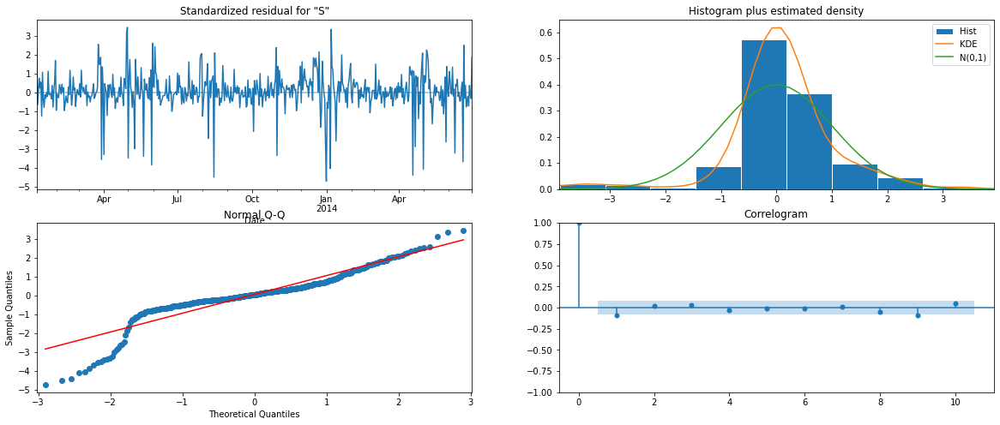

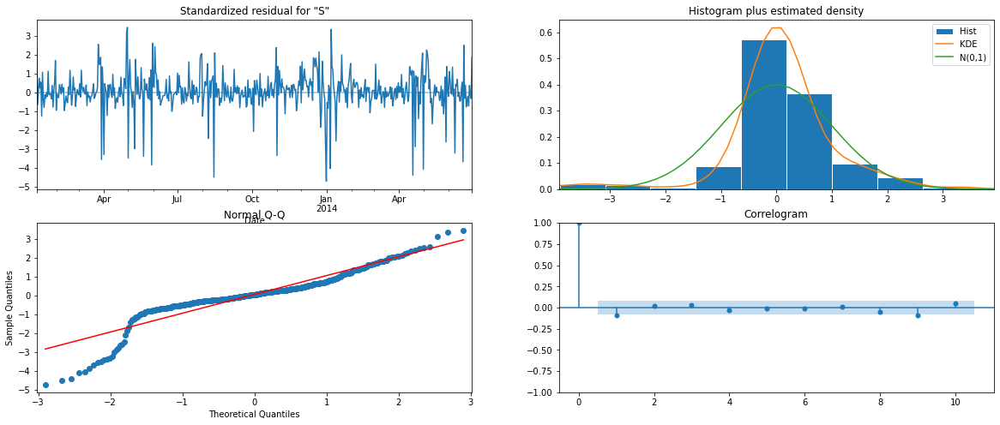

In [471]:
# All variables looks significant
# Plot diagnostics
store13_SARIMA.plot_diagnostics()


According to the plots our model residuals are almost normally distributed also there is no significant correlation in the residuals. So our model is acceptable.


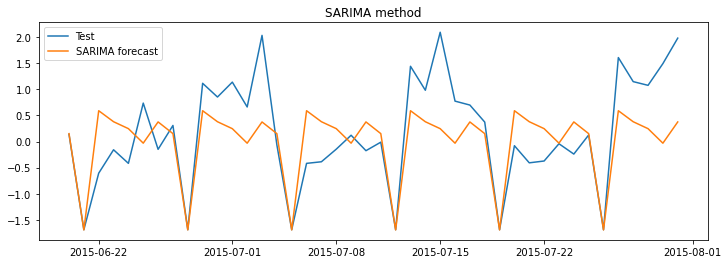

,Model,RMSE,MAPE,AIC
0,SARIMA,0.76,1.61,970.785619


In [472]:

#Now let's calculate RMSE and MAPE score
# Create a results dataframe
Results_store13 = pd.DataFrame(columns=['Model', 'RMSE' ,'MAPE','AIC'])

calculate_metrics(store13_test.Sales,store13_SARIMA.predict(store13_start,store13_end),Results_store13,'SARIMA',store13_SARIMA.aic)



SARIMA is not able to capture peaks coming in a week. Let's try SARIMAX model

#### 6.6 Build SARIMAX model with exogenous variable


In [516]:
print(list(store13_train.columns))


['Sales', 'Customers', 'Open', 'Promo', 'StateHoliday', 'SchoolHoliday', 'Promo2', 1, 2, 3, 4, 5, 6, 7]


In [521]:
store13_SARIMAX = SARIMAX(store13_train.Sales,
                                order=(1, 0, 1),
                                seasonal_order=(1, 1, 1, 7),
                         exog=store13_train[['Open', 'Promo', 'StateHoliday', 'SchoolHoliday', 'Promo2', 1, 2, 3, 4, 5, 6, 7]])
            

store13_SARIMAX = store13_SARIMAX.fit(max_iter=1000)
store13_SARIMAX.summary()


<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                     
=========================================================================================
Dep. Variable:                             Sales   No. Observations:                  546
Model:             SARIMAX(1, 0, 1)x(1, 1, 1, 7)   Log Likelihood                -144.582
Date:                           Tue, 06 Sep 2022   AIC                            323.163
Time:                                   13:23:20   BIC                            396.088
Sample:                               01-01-2013   HQIC                           351.686
                                    - 06-30-2014                                         
Covariance Type:                             opg                                         
=================================================================================
                    coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------
Open              1.7953      0.257      6.992      0.000       1.292       2.299
Promo             1.1518      0.041     28.149      0.000       1.072       1.232
StateHoliday     -0.3321      0.257     -1.291      0.197      -0.836       0.172
SchoolHoliday     0.1523      0.042      3.637      0.000       0.070       0.234
Promo2           -0.1345      0.049     -2.752      0.006      -0.230      -0.039
1             -2.217e-07   5.04e+04   -4.4e-12      1.000   -9.88e+04    9.88e+04
2             -2.886e-07   5.08e+04  -5.68e-12      1.000   -9.96e+04    9.96e+04
3             -2.491e-08   4.97e+04  -5.01e-13      1.000   -9.75e+04    9.75e+04
4             -3.506e-08   4.93e+04  -7.11e-13      1.000   -9.67e+04    9.67e+04
5               4.37e-08   4.91e+04    8.9e-13      1.000   -9.62e+04    9.62e+04
6              7.063e-08    4.9e+04   1.44e-12      1.000    -9.6e+04     9.6e+04
7             -1.729e-07   4.89e+04  -3.54e-12      1.000   -9.59e+04    9.59e+04
ar.L1             0.7544      0.067     11.278      0.000       0.623       0.886
ma.L1            -0.4983      0.079     -6.341      0.000      -0.652      -0.344
ar.S.L7          -0.1388      0.045     -3.108      0.002      -0.226      -0.051
ma.S.L7          -0.9586      0.020    -47.522      0.000      -0.998      -0.919
sigma2            0.0966      0.005     20.656      0.000       0.087       0.106
===================================================================================
Ljung-Box (L1) (Q):                   0.12   Jarque-Bera (JB):               115.76
Prob(Q):                              0.73   Prob(JB):                         0.00
Heteroskedasticity (H):               1.14   Skew:                             0.70
Prob(H) (two-sided):                  0.37   Kurtosis:                         4.78
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
[2] Covariance matrix is singular or near-singular, with condition number 3.33e+17. Standard errors may be unstable.
"""

In [522]:
# Removing 1,2,3,4,5,6,7 as it's insignificant here
store13_SARIMAX1 = SARIMAX(store13_train.Sales,
                                order=(1, 0, 1),
                                seasonal_order=(1, 1, 1, 7),
                         exog=store13_train[['Open', 'Promo', 'StateHoliday', 'SchoolHoliday', 'Promo2']])
            

store13_SARIMAX1 = store13_SARIMAX1.fit(max_iter=1000)
store13_SARIMAX1.summary()


<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                     
=========================================================================================
Dep. Variable:                             Sales   No. Observations:                  546
Model:             SARIMAX(1, 0, 1)x(1, 1, 1, 7)   Log Likelihood                -144.582
Date:                           Tue, 06 Sep 2022   AIC                            309.163
Time:                                   13:24:40   BIC                            352.060
Sample:                               01-01-2013   HQIC                           325.942
                                    - 06-30-2014                                         
Covariance Type:                             opg                                         
=================================================================================
                    coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------
Open              1.7952      0.255      7.031      0.000       1.295       2.296
Promo             1.1518      0.041     28.301      0.000       1.072       1.232
StateHoliday     -0.3322      0.256     -1.299      0.194      -0.834       0.169
SchoolHoliday     0.1524      0.042      3.645      0.000       0.070       0.234
Promo2           -0.1345      0.049     -2.761      0.006      -0.230      -0.039
ar.L1             0.7543      0.067     11.276      0.000       0.623       0.885
ma.L1            -0.4982      0.079     -6.343      0.000      -0.652      -0.344
ar.S.L7          -0.1388      0.045     -3.107      0.002      -0.226      -0.051
ma.S.L7          -0.9586      0.020    -47.521      0.000      -0.998      -0.919
sigma2            0.0966      0.005     21.224      0.000       0.088       0.106
===================================================================================
Ljung-Box (L1) (Q):                   0.12   Jarque-Bera (JB):               115.77
Prob(Q):                              0.73   Prob(JB):                         0.00
Heteroskedasticity (H):               1.14   Skew:                             0.70
Prob(H) (two-sided):                  0.37   Kurtosis:                         4.78
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

In [538]:
# Removing StateHoliday as it's insignificant here
store13_SARIMAX2 = SARIMAX(store13_train.Sales,
                                order=(1, 0, 1),
                                seasonal_order=(1, 1, 1, 7),
                         exog=pd.DataFrame(store13_train[['Open', 'Promo', 'SchoolHoliday', 'Promo2']]))
            

store13_SARIMAX2 = store13_SARIMAX2.fit(max_iter=1000)
store13_SARIMAX2.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                     
=========================================================================================
Dep. Variable:                             Sales   No. Observations:                  546
Model:             SARIMAX(1, 0, 1)x(1, 1, 1, 7)   Log Likelihood                -145.729
Date:                           Tue, 06 Sep 2022   AIC                            309.459
Time:                                   13:39:27   BIC                            348.066
Sample:                               01-01-2013   HQIC                           324.559
                                    - 06-30-2014                                         
Covariance Type:                             opg                                         
=================================================================================
                    coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------
Open              2.1024      0.038     54.853      0.000       2.027       2.178
Promo             1.1494      0.040     28.423      0.000       1.070       1.229
SchoolHoliday     0.1529      0.041      3.693      0.000       0.072       0.234
Promo2           -0.1378      0.049     -2.787      0.005      -0.235      -0.041
ar.L1             0.7854      0.061     12.786      0.000       0.665       0.906
ma.L1            -0.5420      0.073     -7.440      0.000      -0.685      -0.399
ar.S.L7          -0.1551      0.042     -3.658      0.000      -0.238      -0.072
ma.S.L7          -0.9615      0.020    -47.331      0.000      -1.001      -0.922
sigma2            0.0969      0.005     21.059      0.000       0.088       0.106
===================================================================================
Ljung-Box (L1) (Q):                   0.20   Jarque-Bera (JB):               110.32
Prob(Q):                              0.65   Prob(JB):                         0.00
Heteroskedasticity (H):               1.15   Skew:                             0.67
Prob(H) (two-sided):                  0.36   Kurtosis:                         4.77
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

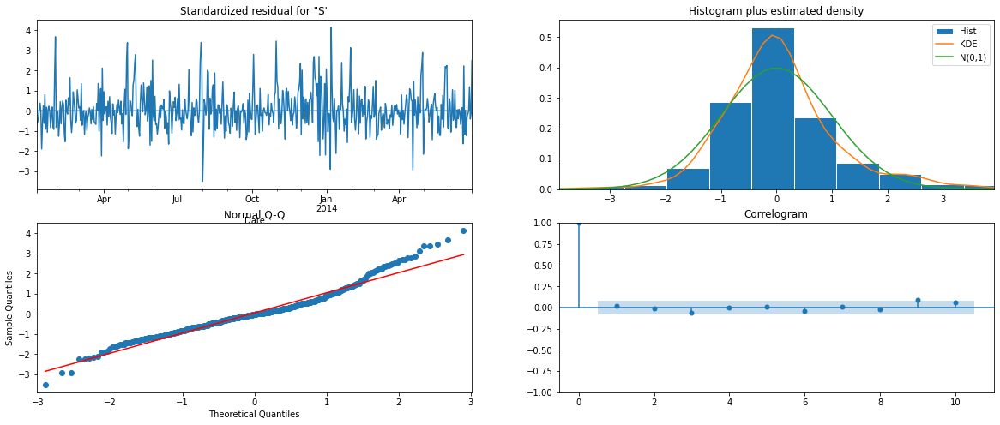

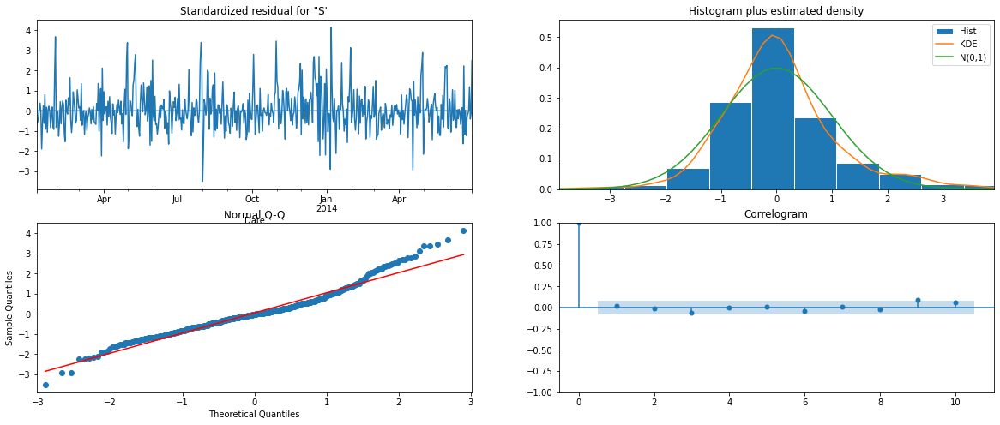

In [574]:
# Plot diagnostics
store13_SARIMAX2.plot_diagnostics()


Residuals are normaly distributed.


 To make prediction we will create a dataframe with exogenous variables with date starting from 2014-07-01 to
 2015-07-31 with values for null values populated as zeroes and the rest taken from test data.

In [572]:

temp = pd.DataFrame(index=pd.date_range('2013-01-01', '2015-07-31').difference(store_13.index),columns=['Open', 'Promo', 'SchoolHoliday', 'Promo2']).fillna(0) 
st13_temp = store_13['2015-01-01':'2015-06-19'][['Open', 'Promo', 'SchoolHoliday', 'Promo2']]
st13_test_temp = store13_test[['Open', 'Promo', 'SchoolHoliday', 'Promo2']]
store13_test_temp = pd.concat([temp,st13_temp,st13_test_temp],axis=0)


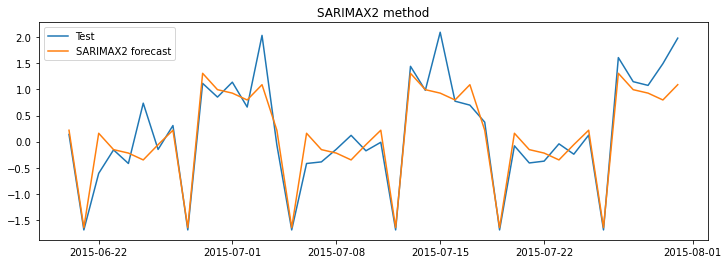

,Model,RMSE,MAPE,AIC
0,SARIMA,0.76,1.61,970.785619
1,SARIMAX2,0.40,1.26,309.458591


In [575]:
calculate_metrics(store13_test.Sales,store13_SARIMAX2.predict(store13_start,store13_end,exog=store13_test_temp)
,Results_store13,'SARIMAX2',store13_SARIMAX2.aic)

The forecast is not perfect but we got a better aic and mape scores

#### 6.7 Build VARMAX model with exogenous variable


In [576]:
#From the previously run adf test we know that both Sales and Customers
#time serieses are stationary and they move together. So let's build a VARMAX model this time
store13_VARMAX = sm.tsa.VARMAX(store13_train[['Sales', 'Customers']], order=(2,2),trend='n',
                              exog=store13_train[['Open', 'Promo', 'SchoolHoliday', 'Promo2']])
store13_VARMAX = store13_VARMAX.fit(maxiter=1000, disp=False)
print(store13_VARMAX.summary())


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/statespace/varmax.py:163: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  EstimationWarning)


                             Statespace Model Results                             
Dep. Variable:     ['Sales', 'Customers']   No. Observations:                  546
Model:                        VARMAX(2,2)   Log Likelihood                 -78.414
Date:                    Tue, 06 Sep 2022   AIC                            210.828
Time:                            15:00:10   BIC                            326.998
Sample:                        01-01-2013   HQIC                           256.240
                             - 06-30-2014                                         
Covariance Type:                      opg                                         
Ljung-Box (L1) (Q):             0.01, 7.26   Jarque-Bera (JB):         11.79, 10.88
Prob(Q):                        0.91, 0.01   Prob(JB):                   0.00, 0.00
Heteroskedasticity (H):         1.00, 1.27   Skew:                     -0.16, -0.04
Prob(H) (two-sided):            0.99, 0.11   Kurtosis:                   3.65, 3.69


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


In [577]:
#Remove SchoolHoliday ans see aic score
store13_VARMAX1 = sm.tsa.VARMAX(store13_train[['Sales', 'Customers']], order=(2,2),trend='n',
                              exog=store13_train[['Open', 'Promo', 'Promo2']])
store13_VARMAX1 = store13_VARMAX1.fit(maxiter=1000, disp=False)
print(store13_VARMAX1.summary())

/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/statespace/varmax.py:163: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  EstimationWarning)


                             Statespace Model Results                             
Dep. Variable:     ['Sales', 'Customers']   No. Observations:                  546
Model:                        VARMAX(2,2)   Log Likelihood                 -74.276
Date:                    Tue, 06 Sep 2022   AIC                            198.552
Time:                            15:01:51   BIC                            306.118
Sample:                        01-01-2013   HQIC                           240.600
                             - 06-30-2014                                         
Covariance Type:                      opg                                         
Ljung-Box (L1) (Q):             0.16, 2.33   Jarque-Bera (JB):         18.21, 10.57
Prob(Q):                        0.69, 0.13   Prob(JB):                   0.00, 0.01
Heteroskedasticity (H):         1.02, 1.24   Skew:                     -0.20, -0.01
Prob(H) (two-sided):            0.91, 0.15   Kurtosis:                   3.80, 3.68


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


AIC has improved

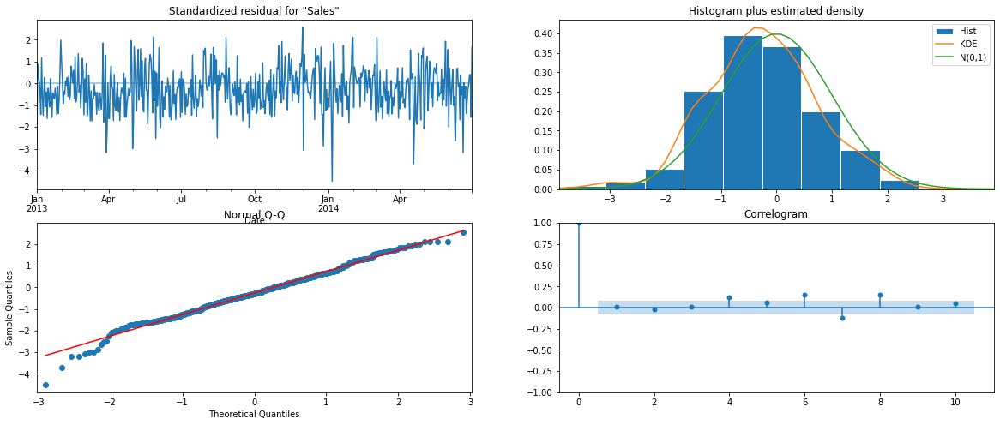

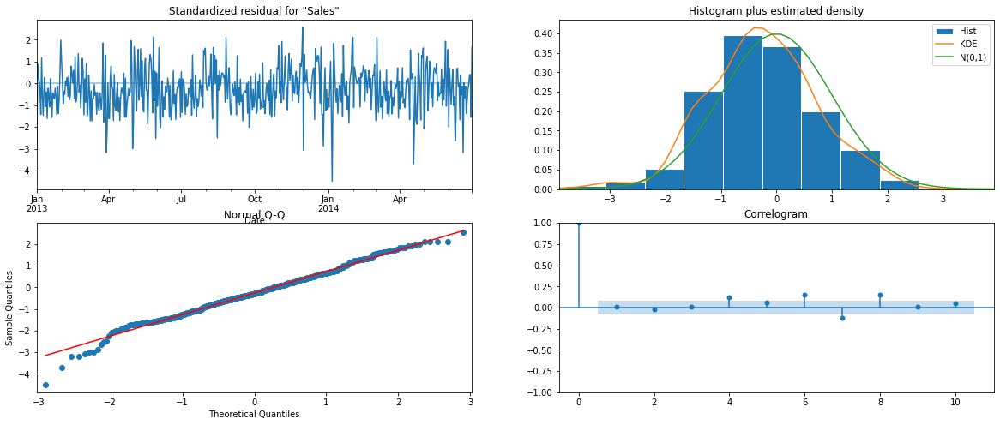

In [578]:
store13_VARMAX.plot_diagnostics()


Residuals are normally distributed


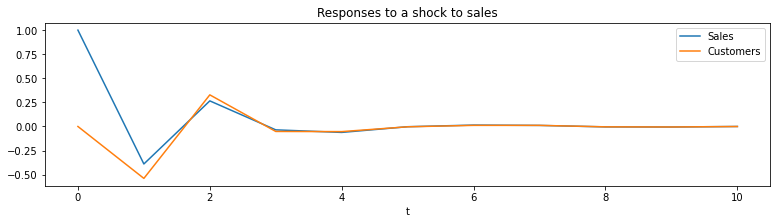

In [579]:
##### Check impluse response function

ax = store13_VARMAX1.impulse_responses(10, orthogonalized=False).plot(figsize=(13,3))
ax.set(xlabel='t', title='Responses to a shock to sales');


As per the model after 4 lags the values of both sales and customers stabilises.


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/statespace/varmax.py:163: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  EstimationWarning)
/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/statespace/varmax.py:163: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  EstimationWarning)


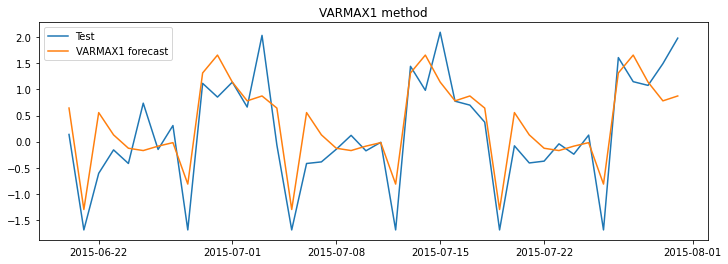

,Model,RMSE,MAPE,AIC
0,SARIMA,0.76,1.61,970.785619
1,SARIMAX2,0.40,1.26,309.458591
2,VARMAX1,0.57,1.24,198.552209


In [582]:

# Calculate rmse and mapre
calculate_metrics(store13_test.Sales,store13_VARMAX1.predict(store13_start,store13_end,
                exog=store13_test_temp[['Open', 'Promo', 'Promo2']])['Sales'],
                  Results_store13,'VARMAX1',store13_VARMAX1.aic)



For store 13 the best results are given by the VARMAX model with mape value of 1.24.

## 7. Build model for store25

##### 7.1 Analyse data 


In [587]:
store_25.head(1)


,DayOfWeek,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,Promo2,PromoInterval,CompetitionSince,SaleYear,SaleMonth
Date,,,,,,,,,,,,
2013-01-01,2,0,0,0,0,a,1,0,NaN,2003-04-01,2013,1


In [588]:

# set frequency for the dataset
store_25.index.freq = store_25.index.inferred_freq
store_25.index


DatetimeIndex(['2013-01-01', '2013-01-02', '2013-01-03', '2013-01-04',
               '2013-01-05', '2013-01-06', '2013-01-07', '2013-01-08',
               '2013-01-09', '2013-01-10',
               ...
               '2015-07-22', '2015-07-23', '2015-07-24', '2015-07-25',
               '2015-07-26', '2015-07-27', '2015-07-28', '2015-07-29',
               '2015-07-30', '2015-07-31'],
              dtype='datetime64[ns]', name='Date', length=942, freq='D')

In [589]:
store_25.describe(include='all')


,DayOfWeek,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,Promo2,PromoInterval,CompetitionSince,SaleYear,SaleMonth
count,942.000000,942.000000,942.000000,942.000000,942.000000,942,942.000000,942.0,0,942,942.000000,942.000000
unique,NaN,NaN,NaN,NaN,NaN,4,NaN,NaN,0,1,NaN,NaN
top,NaN,NaN,NaN,NaN,NaN,0,NaN,NaN,NaN,2003-04-01 00:00:00,NaN,NaN
freq,NaN,NaN,NaN,NaN,NaN,913,NaN,NaN,NaN,942,NaN,NaN
first,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2003-04-01 00:00:00,NaN,NaN
last,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2003-04-01 00:00:00,NaN,NaN
mean,3.997877,8892.311040,1250.288747,0.798301,0.382166,NaN,0.180467,0.0,NaN,NaN,2013.837580,5.961783
std,1.998404,5151.671996,686.376385,0.401481,0.486175,NaN,0.384780,0.0,NaN,NaN,0.766009,3.350357
min,1.000000,0.000000,0.000000,0.000000,0.000000,NaN,0.000000,0.0,NaN,NaN,2013.000000,1.000000
25%,2.000000,7858.750000,1182.000000,1.000000,0.000000,NaN,0.000000,0.0,NaN,NaN,2013.000000,3.000000


In [590]:
 
# Remove PromoInterval,CompetitionSince,Promo2 columns from store_25 data as they have unique values
store_25.drop(labels=['Promo2','PromoInterval','CompetitionSince'],axis=1,inplace=True)
store_25.shape


(942, 9)

In [591]:
print(store_25.StateHoliday.value_counts())
# Check the sales by state holiday
store_25.groupby(by=['StateHoliday'])['Sales'].sum()


0    913
a     19
b      6
c      4
Name: StateHoliday, dtype: int64


StateHoliday
0    8376557
a          0
b          0
c          0
Name: Sales, dtype: int64

In [592]:
#Sales is zero whenever there is a state holiday. So it is better make the variables having only 2 levels,
#1 for  state holiday and 0 for non-holiday.

store_25.StateHoliday= store_25.StateHoliday.apply(lambda x : 0 if x=='0' else 1)

store_25.StateHoliday.value_counts()

0    913
1     29
Name: StateHoliday, dtype: int64

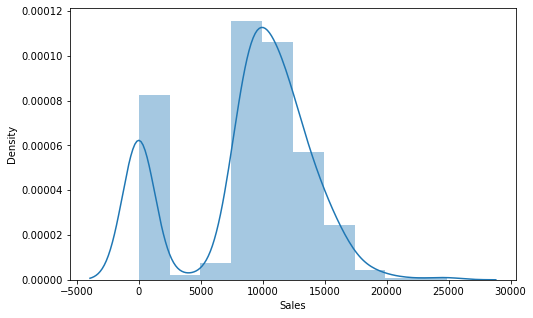

In [593]:
# Check the distribution of sales
plt.figure(figsize=(8,5))
sns.distplot(store_25.Sales,bins=10)
plt.show()


Plot looks decently normally distributed

###### Check for outliers


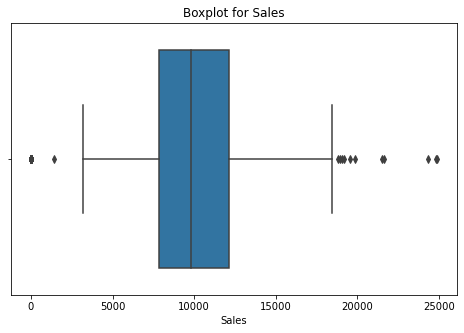

Quartile values for Sales
0.750    12125.250
0.800    12709.200
0.900    14422.600
0.990    18924.800
0.995    20352.080
0.999    24835.891
1.000    24882.000
Name: Sales, dtype: float64


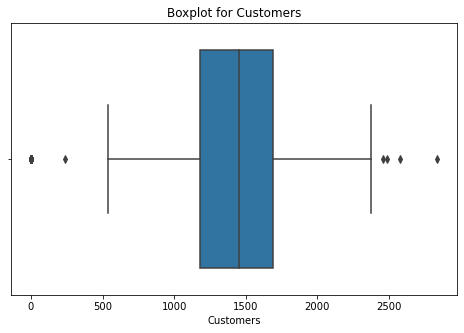

Quartile values for Customers
0.750    1692.000
0.800    1746.000
0.900    1907.900
0.990    2299.000
0.995    2376.000
0.999    2591.281
1.000    2835.000
Name: Customers, dtype: float64


In [594]:
check_outliers(store_25[['Sales','Customers']])


In [595]:
#For Values > 0.99th percentile value, we can do capping method to set them as 99th percentile value.
sales_cap = store_25.Sales.quantile(.99)
Customers_cap = store_25.Customers.quantile(.99)


store_25.loc[store_25.Sales > sales_cap,'Sales'] =  sales_cap
store_25.loc[store_25.Customers > Customers_cap,'Customers'] =  Customers_cap

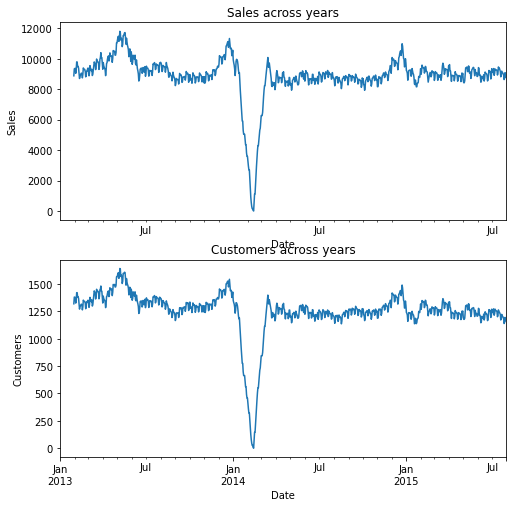

In [597]:

# Plot sales data using a rolling window
plt.figure(figsize=(8,8))
plt.subplot(2,1,1)
plt.title('Sales across years')
store_25.Sales.rolling(30).mean().plot()
plt.xticks([])
plt.ylabel('Sales')

plt.subplot(2,1,2)
plt.title('Customers across years')
store_25.Customers.rolling(30).mean().plot()
plt.xlabel('Date')
plt.ylabel('Customers')
plt.show()

Sales and number of customers have been considerably decreased during 2014 Feb month.
We have two time series here, sales and customers. Sale value is directly proportional to number of customers.
Sales is peaking in December month.


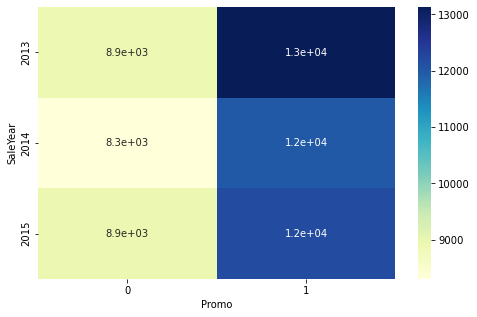

In [611]:
# Relation between sales and Promo
plt.figure(figsize=(8,5))
sns.heatmap(store_25.groupby(by=['SaleYear','Promo'])['Sales'].median().unstack(),cmap="YlGnBu",annot=True)
plt.show()


Clearly promotion has a high influence in the sales.


###### Check correlation between data points


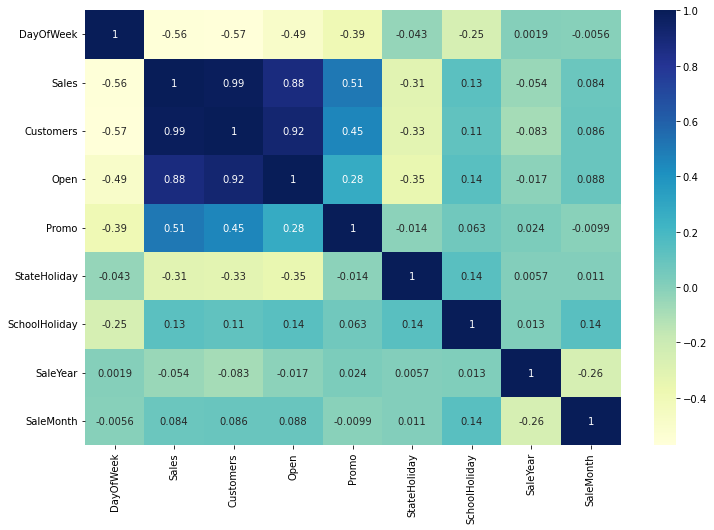

In [612]:
store25_corr = store_25.corr()

plt.figure(figsize=(12,8))
sns.heatmap(store25_corr,annot=True,cmap='YlGnBu')
plt.show()


- Sales is having a high correlation with Customers,Open and Promo


In [613]:
# Drop SaleYear and SaleMonth columns
store_25.drop(['SaleYear','SaleMonth'],inplace=True,axis=1)


In [614]:
# Make DayOfWeek as a onehot encoded variable
store_25 = pd.concat([store_25.iloc[:,1:],pd.get_dummies(store_25.DayOfWeek)],axis=1)
store_25.shape

(942, 13)

##### 7.2 Split the data into train and test.
As we need a daily forecast for 6 weeks, we will take last 42 days data as test set and the rest as train set.



In [615]:
store25_train = store_25[:-42].copy()
print('train set shape:',store25_train.shape)
store25_test  = store_25[-42:].copy()
print('test set shape:',store25_test.shape)



train set shape: (900, 13)
test set shape: (42, 13)


In [616]:
# Standardize train data
scaler = StandardScaler()
store25_train[['Sales','Customers']] = scaler.fit_transform(store25_train[['Sales','Customers']])
print(store25_train.head())
store25_test[['Sales','Customers']] = scaler.transform(store25_test[['Sales','Customers']])
print(store25_test.head())


               Sales  Customers  Open  Promo  StateHoliday  SchoolHoliday  1  \
Date                                                                           
2013-01-01 -1.729383  -1.814428     0      0             1              1  0   
2013-01-02  0.600809   0.646159     1      0             0              1  0   
2013-01-03  0.301341   0.485308     1      0             0              1  0   
2013-01-04  0.168678   0.388218     1      0             0              1  0   
2013-01-05  0.023919   0.186792     1      0             0              0  0   

            2  3  4  5  6  7  
Date                          
2013-01-01  1  0  0  0  0  0  
2013-01-02  0  1  0  0  0  0  
2013-01-03  0  0  1  0  0  0  
2013-01-04  0  0  0  1  0  0  
2013-01-05  0  0  0  0  1  0  
               Sales  Customers  Open  Promo  StateHoliday  SchoolHoliday  1  \
Date                                                                           
2015-06-20 -0.155567  -0.121868     1      0             0    

##### 7.3 Check stationarity of the series


In [617]:
# Check stationarity of sales series
adf_test(store25_train.Sales) # ADF test--> H0: Not stationary, H1: Is stationary if p<0.05 then reject H0 then series is stationary 
# Check stationarity of Customers series
adf_test(store25_train.Customers)




Sales: ADF test results:
ADF Statistic: -4.394475
p-value: 0.000304
Critical Values:
	1%: -3.438
	5%: -2.865
	10%: -2.569

Customers: ADF test results:
ADF Statistic: -3.911149
p-value: 0.001954
Critical Values:
	1%: -3.438
	5%: -2.865
	10%: -2.569


ADF test: As the p-value is < 0.05 for both sales and customers they are stationary.


##### 7.4 Autocorrelation function (ACF) and Partial autocorrelation function (PACF)



-----ACF and PCF for Sales-------


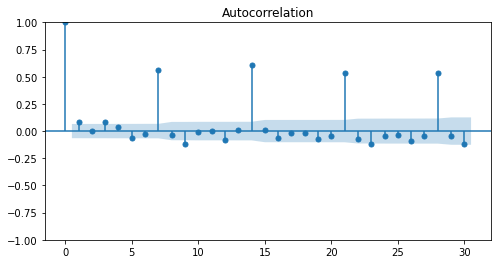

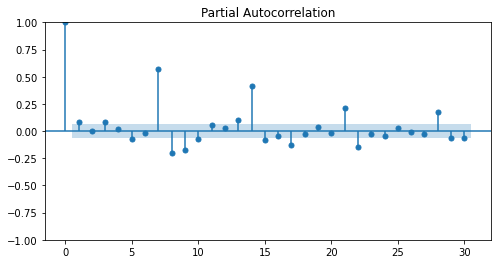

-----ACF and PCF for Customers-------


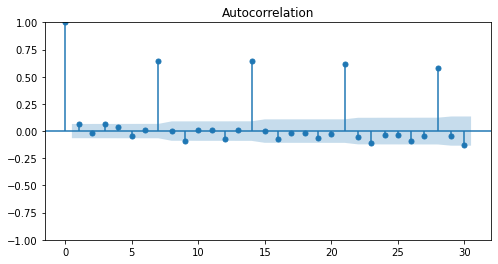

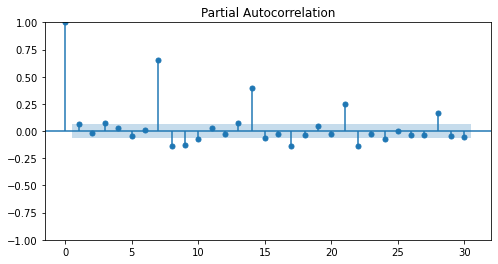

In [618]:


#Let's plot ACF to find q value and PACF to know p value

#Plot acf and pacf for store25 sales data
print('-----ACF and PCF for Sales-------')
plot_autocorrelation(store25_train.Sales,30)
print('-----ACF and PCF for Customers-------')
#Plot acf and pacf for customers  data
plot_autocorrelation(store25_train.Customers,30)



There is a weekely spike happening in the acf plot. The same is reflecting in pacf plot as well, so s can be taken as 7. There is no significant lag and ma order


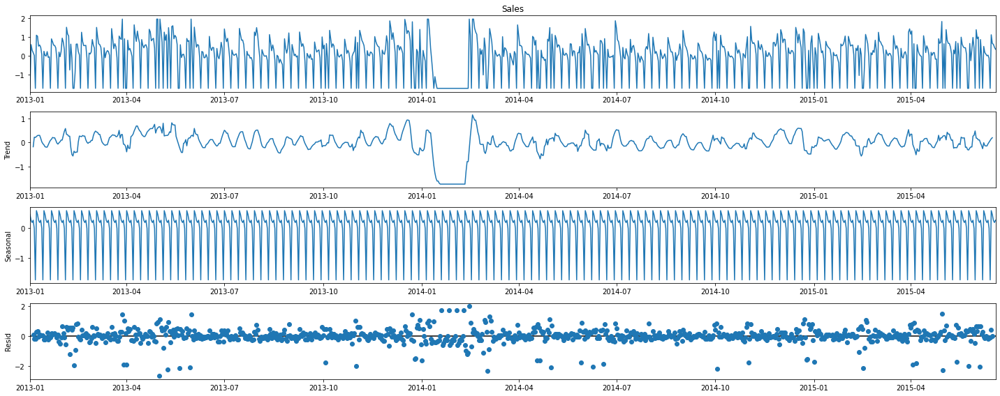

In [619]:
# Let's try to decompose the data to identify if there are any seasonal components

rcParams['figure.figsize'] = 20, 8
decomposition = sm.tsa.seasonal_decompose(store25_train.Sales, model='additive') # additive seasonal index
fig = decomposition.plot()
plt.show()

Dip in sales during 2014-Feb looks unusual and it has not repeated for other years. 
Clearly the series is random and the values are fluctuating throughout the year. The peaks come after 7 days.


In [622]:
##### Create start and end indexes
store25_start = store25_test.index.min()
store25_end = store25_test.index.max()


#### 7.5 Build SARIMA model


In [624]:
# Create combinations for lag and ma orderes for both seasonal and non seasonal components
p = q = range(0, 3)
d = range(0, 1)
pdq = list(itertools.product(p, d, q))
p = q = range(0, 2)
d = range(0, 2)
seasonal_pdq = [(x[0], x[1], x[2], 7) for x in list(itertools.product(p, d, q))]

print('Examples of parameter combinations for Seasonal ARIMA...')
print('SARIMAX: {} x {}'.format(pdq[1], seasonal_pdq[1]))
print('SARIMAX: {} x {}'.format(pdq[1], seasonal_pdq[2]))
print('SARIMAX: {} x {}'.format(pdq[2], seasonal_pdq[3]))
print('SARIMAX: {} x {}'.format(pdq[2], seasonal_pdq[4]))


Examples of parameter combinations for Seasonal ARIMA...
SARIMAX: (0, 0, 1) x (0, 0, 1, 7)
SARIMAX: (0, 0, 1) x (0, 1, 0, 7)
SARIMAX: (0, 0, 2) x (0, 1, 1, 7)
SARIMAX: (0, 0, 2) x (1, 0, 0, 7)


In [625]:
for param in pdq:
    for param_seasonal in seasonal_pdq:
        try:
            model = SARIMAX(store25_train.Sales,
                            order=param,
                            seasonal_order=param_seasonal)
    

            results = model.fit()

            print('ARIMA{} x {} - AIC:{}'.format(param, param_seasonal, results.aic))
        except:
            continue

ARIMA(0, 0, 0) x (0, 0, 0, 7) - AIC:2556.089359768411
ARIMA(0, 0, 0) x (0, 0, 1, 7) - AIC:2384.370587071484
ARIMA(0, 0, 0) x (0, 1, 0, 7) - AIC:2416.5038000633294
ARIMA(0, 0, 0) x (0, 1, 1, 7) - AIC:1910.1660739700812
ARIMA(0, 0, 0) x (1, 0, 0, 7) - AIC:2217.737141453559
ARIMA(0, 0, 0) x (1, 0, 1, 7) - AIC:1927.685331072937
ARIMA(0, 0, 0) x (1, 1, 0, 7) - AIC:2083.1793663066564
ARIMA(0, 0, 0) x (1, 1, 1, 7) - AIC:1907.7834799887419
ARIMA(0, 0, 1) x (0, 0, 0, 7) - AIC:2551.0379721890095
ARIMA(0, 0, 1) x (0, 0, 1, 7) - AIC:2365.689868423223
ARIMA(0, 0, 1) x (0, 1, 0, 7) - AIC:2366.3391187319316
ARIMA(0, 0, 1) x (0, 1, 1, 7) - AIC:1836.3296238982343
ARIMA(0, 0, 1) x (1, 0, 0, 7) - AIC:2182.8246991630504


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(0, 0, 1) x (1, 0, 1, 7) - AIC:1854.4907937548146
ARIMA(0, 0, 1) x (1, 1, 0, 7) - AIC:2049.186811084817
ARIMA(0, 0, 1) x (1, 1, 1, 7) - AIC:1835.5472117413901
ARIMA(0, 0, 2) x (0, 0, 0, 7) - AIC:2552.9603742895533
ARIMA(0, 0, 2) x (0, 0, 1, 7) - AIC:2364.855737802798
ARIMA(0, 0, 2) x (0, 1, 0, 7) - AIC:2335.242257700099
ARIMA(0, 0, 2) x (0, 1, 1, 7) - AIC:1811.2377830248377
ARIMA(0, 0, 2) x (1, 0, 0, 7) - AIC:2168.328991035207


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(0, 0, 2) x (1, 0, 1, 7) - AIC:1829.839072892686
ARIMA(0, 0, 2) x (1, 1, 0, 7) - AIC:2029.3502517891466
ARIMA(0, 0, 2) x (1, 1, 1, 7) - AIC:1809.974544517449
ARIMA(1, 0, 0) x (0, 0, 0, 7) - AIC:2551.1349763988383
ARIMA(1, 0, 0) x (0, 0, 1, 7) - AIC:2363.136033949818
ARIMA(1, 0, 0) x (0, 1, 0, 7) - AIC:2347.2346548835094
ARIMA(1, 0, 0) x (0, 1, 1, 7) - AIC:1805.093978088391
ARIMA(1, 0, 0) x (1, 0, 0, 7) - AIC:2172.400419086389
ARIMA(1, 0, 0) x (1, 0, 1, 7) - AIC:1823.8422277661
ARIMA(1, 0, 0) x (1, 1, 0, 7) - AIC:2036.8150534096292
ARIMA(1, 0, 0) x (1, 1, 1, 7) - AIC:1805.5729739556389
ARIMA(1, 0, 1) x (0, 0, 0, 7) - AIC:2529.0200207537073
ARIMA(1, 0, 1) x (0, 0, 1, 7) - AIC:2360.216064543541
ARIMA(1, 0, 1) x (0, 1, 0, 7) - AIC:2328.4328621881486
ARIMA(1, 0, 1) x (0, 1, 1, 7) - AIC:1751.161964462311
ARIMA(1, 0, 1) x (1, 0, 0, 7) - AIC:2159.4747389743234


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(1, 0, 1) x (1, 0, 1, 7) - AIC:1770.654417455975
ARIMA(1, 0, 1) x (1, 1, 0, 7) - AIC:2006.7425439201704
ARIMA(1, 0, 1) x (1, 1, 1, 7) - AIC:1752.3417028462316
ARIMA(1, 0, 2) x (0, 0, 0, 7) - AIC:2531.002111018579
ARIMA(1, 0, 2) x (0, 0, 1, 7) - AIC:2361.9224093926673
ARIMA(1, 0, 2) x (0, 1, 0, 7) - AIC:2317.859767632235
ARIMA(1, 0, 2) x (0, 1, 1, 7) - AIC:1751.5424151572129
ARIMA(1, 0, 2) x (1, 0, 0, 7) - AIC:2154.9793635003753


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(1, 0, 2) x (1, 0, 1, 7) - AIC:1770.9903010222797
ARIMA(1, 0, 2) x (1, 1, 0, 7) - AIC:1999.2542579342771
ARIMA(1, 0, 2) x (1, 1, 1, 7) - AIC:1753.3407120227278
ARIMA(2, 0, 0) x (0, 0, 0, 7) - AIC:2553.122485672392
ARIMA(2, 0, 0) x (0, 0, 1, 7) - AIC:2361.7922432928854
ARIMA(2, 0, 0) x (0, 1, 0, 7) - AIC:2322.0060218899016
ARIMA(2, 0, 0) x (0, 1, 1, 7) - AIC:1770.5147248804628
ARIMA(2, 0, 0) x (1, 0, 0, 7) - AIC:2157.6244586901507


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(2, 0, 0) x (1, 0, 1, 7) - AIC:1789.6993454597725
ARIMA(2, 0, 0) x (1, 1, 0, 7) - AIC:2010.5470114085529
ARIMA(2, 0, 0) x (1, 1, 1, 7) - AIC:1771.638241540033
ARIMA(2, 0, 1) x (0, 0, 0, 7) - AIC:2530.99810996367
ARIMA(2, 0, 1) x (0, 0, 1, 7) - AIC:2362.03462747016
ARIMA(2, 0, 1) x (0, 1, 0, 7) - AIC:2322.5801565177107
ARIMA(2, 0, 1) x (0, 1, 1, 7) - AIC:1752.0143187280783
ARIMA(2, 0, 1) x (1, 0, 0, 7) - AIC:2157.525414839233


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(2, 0, 1) x (1, 0, 1, 7) - AIC:1771.4995560372702
ARIMA(2, 0, 1) x (1, 1, 0, 7) - AIC:2002.467526792523
ARIMA(2, 0, 1) x (1, 1, 1, 7) - AIC:1753.648063454475
ARIMA(2, 0, 2) x (0, 0, 0, 7) - AIC:2516.158673545136
ARIMA(2, 0, 2) x (0, 0, 1, 7) - AIC:2361.535668236458
ARIMA(2, 0, 2) x (0, 1, 0, 7) - AIC:2217.9723676323656
ARIMA(2, 0, 2) x (0, 1, 1, 7) - AIC:1751.1456917269081
ARIMA(2, 0, 2) x (1, 0, 0, 7) - AIC:2081.8663655820365


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(2, 0, 2) x (1, 0, 1, 7) - AIC:1770.6881966177434
ARIMA(2, 0, 2) x (1, 1, 0, 7) - AIC:1951.6448129189107
ARIMA(2, 0, 2) x (1, 1, 1, 7) - AIC:1751.4538457332544


ARIMA(2, 0, 2) x (0, 1, 1, 7) - AIC:1751.1456917269081 gives least aic


In [626]:
store25_SARIMA = SARIMAX(store25_train.Sales,
                                order=(2, 0, 2),
                                seasonal_order=(0, 1, 1, 7))
            

store25_SARIMA = store25_SARIMA.fit()
store25_SARIMA.summary()


<class 'statsmodels.iolib.summary.Summary'>
"""
                                      SARIMAX Results                                      
===========================================================================================
Dep. Variable:                               Sales   No. Observations:                  900
Model:             SARIMAX(2, 0, 2)x(0, 1, [1], 7)   Log Likelihood                -869.573
Date:                             Tue, 06 Sep 2022   AIC                           1751.146
Time:                                     15:41:06   BIC                           1779.913
Sample:                                 01-01-2013   HQIC                          1762.139
                                      - 06-19-2015                                         
Covariance Type:                               opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          1.2644      0.252      5.025      0.000       0.771       1.758
ar.L2         -0.4287      0.200     -2.146      0.032      -0.820      -0.037
ma.L1         -1.0456      0.249     -4.192      0.000      -1.534      -0.557
ma.L2          0.3994      0.133      3.007      0.003       0.139       0.660
ma.S.L7       -0.9992      0.213     -4.699      0.000      -1.416      -0.582
sigma2         0.3951      0.079      4.996      0.000       0.240       0.550
===================================================================================
Ljung-Box (L1) (Q):                   0.07   Jarque-Bera (JB):              1172.91
Prob(Q):                              0.80   Prob(JB):                         0.00
Heteroskedasticity (H):               0.94   Skew:                            -1.31
Prob(H) (two-sided):                  0.59   Kurtosis:                         7.96
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

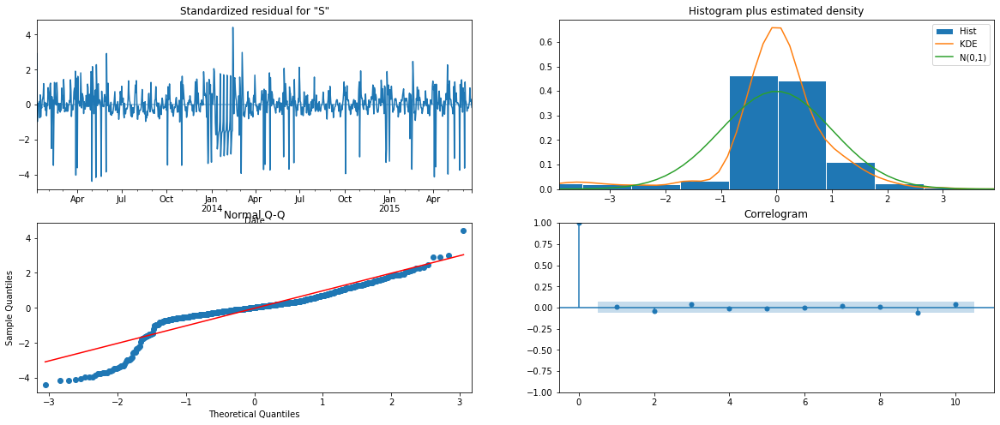

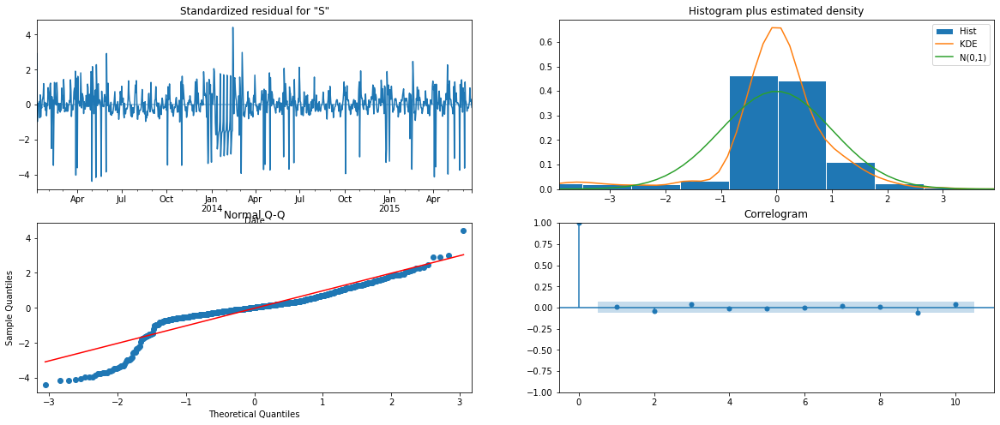

In [627]:
# Plot diagnostics
store25_SARIMA.plot_diagnostics()


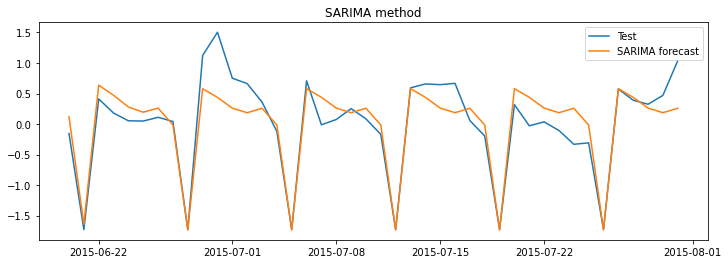

,Model,RMSE,MAPE,AIC
0,SARIMA,0.33,2.32,1751.145692


In [631]:
#Now let's calculate RMSE and MAPE score
# Create a results dataframe
Results_store25 = pd.DataFrame(columns=['Model', 'RMSE' ,'MAPE','AIC'])

calculate_metrics(store25_test.Sales,store25_SARIMA.predict(store25_start,store25_end),Results_store25,'SARIMA',store25_SARIMA.aic)


Certain peaks are not captured by this seasonal model. Let's try adding exogenous variables and see the performance

#### 7.6 Build SARIMAX model with exogenous variable

In [632]:
print(list(store25_train.columns))


['Sales', 'Customers', 'Open', 'Promo', 'StateHoliday', 'SchoolHoliday', 1, 2, 3, 4, 5, 6, 7]


In [637]:

store25_SARIMAX = SARIMAX(store25_train.Sales,
                                order=(2, 0, 2),
                                seasonal_order=(0, 1, 1, 7),
                         exog=store25_train[['Open', 'Promo', 'StateHoliday', 'SchoolHoliday', 1, 2, 3, 4, 5, 6, 7]])
            

store25_SARIMAX = store25_SARIMAX.fit(max_iter=2000)
store25_SARIMAX.summary()

/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


<class 'statsmodels.iolib.summary.Summary'>
"""
                                      SARIMAX Results                                      
===========================================================================================
Dep. Variable:                               Sales   No. Observations:                  900
Model:             SARIMAX(2, 0, 2)x(0, 1, [1], 7)   Log Likelihood                -307.282
Date:                             Tue, 06 Sep 2022   AIC                            648.565
Time:                                     15:47:20   BIC                            730.073
Sample:                                 01-01-2013   HQIC                           679.713
                                      - 06-19-2015                                         
Covariance Type:                               opg                                         
=================================================================================
                    coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------
Open              2.0525      0.055     37.172      0.000       1.944       2.161
Promo             0.5467      0.034     15.918      0.000       0.479       0.614
StateHoliday     -0.3705      0.082     -4.520      0.000      -0.531      -0.210
SchoolHoliday     0.0730      0.045      1.613      0.107      -0.016       0.162
1              1.135e-07   1.46e-10    776.473      0.000    1.13e-07    1.14e-07
2             -3.088e-07   9.65e-10   -319.909      0.000   -3.11e-07   -3.07e-07
3             -3.215e-07   2.42e-10  -1328.251      0.000   -3.22e-07   -3.21e-07
4              2.508e-08   1.32e-09     18.999      0.000    2.25e-08    2.77e-08
5              1.346e-07   5.61e-10    239.779      0.000    1.33e-07    1.36e-07
6              1.402e-07   1.03e-10   1356.303      0.000     1.4e-07     1.4e-07
7              1.147e-07   1.08e-10   1064.743      0.000    1.14e-07    1.15e-07
ar.L1             0.0328      0.122      0.270      0.788      -0.206       0.271
ar.L2             0.6306      0.075      8.400      0.000       0.483       0.778
ma.L1             0.2987      0.121      2.465      0.014       0.061       0.536
ma.L2            -0.4601      0.051     -8.964      0.000      -0.561      -0.360
ma.S.L7          -0.9935      0.027    -37.118      0.000      -1.046      -0.941
sigma2            0.1129      0.004     27.912      0.000       0.105       0.121
===================================================================================
Ljung-Box (L1) (Q):                   0.00   Jarque-Bera (JB):              2097.99
Prob(Q):                              0.97   Prob(JB):                         0.00
Heteroskedasticity (H):               0.79   Skew:                             0.40
Prob(H) (two-sided):                  0.05   Kurtosis:                        10.47
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
[2] Covariance matrix is singular or near-singular, with condition number 9.48e+29. Standard errors may be unstable.
"""

In [642]:
#Remove schoolholiday and check
store25_SARIMAX1 = SARIMAX(store25_train.Sales,
                                order=(2, 0, 2),
                                seasonal_order=(0, 1, 1, 7),
                         exog=store25_train[['Open', 'Promo', 'StateHoliday', 1, 2, 3, 4, 5, 6, 7]])
            

store25_SARIMAX1 = store25_SARIMAX1.fit(max_iter=2000)
store25_SARIMAX1.summary()

/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


<class 'statsmodels.iolib.summary.Summary'>
"""
                                      SARIMAX Results                                      
===========================================================================================
Dep. Variable:                               Sales   No. Observations:                  900
Model:             SARIMAX(2, 0, 2)x(0, 1, [1], 7)   Log Likelihood                -308.494
Date:                             Tue, 06 Sep 2022   AIC                            648.987
Time:                                     15:51:04   BIC                            725.701
Sample:                                 01-01-2013   HQIC                           678.303
                                      - 06-19-2015                                         
Covariance Type:                               opg                                         
================================================================================
                   coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------
Open             2.0677      0.055     37.347      0.000       1.959       2.176
Promo            0.5392      0.033     16.103      0.000       0.474       0.605
StateHoliday    -0.3461      0.081     -4.274      0.000      -0.505      -0.187
1             2.105e-07   1.34e-10   1572.078      0.000     2.1e-07    2.11e-07
2            -4.758e-07   1.06e-09   -449.720      0.000   -4.78e-07   -4.74e-07
3            -5.001e-07    1.9e-10  -2627.239      0.000   -5.01e-07      -5e-07
4            -2.798e-08   1.45e-09    -19.357      0.000   -3.08e-08   -2.51e-08
5             1.402e-07   6.91e-10    202.869      0.000    1.39e-07    1.42e-07
6             2.174e-07   6.05e-11   3594.993      0.000    2.17e-07    2.18e-07
7             1.993e-07    1.4e-10   1424.374      0.000    1.99e-07       2e-07
ar.L1            0.0321      0.126      0.254      0.799      -0.215       0.279
ar.L2            0.6201      0.076      8.162      0.000       0.471       0.769
ma.L1            0.2999      0.126      2.381      0.017       0.053       0.547
ma.L2           -0.4517      0.052     -8.705      0.000      -0.553      -0.350
ma.S.L7         -0.9958      0.039    -25.491      0.000      -1.072      -0.919
sigma2           0.1129      0.005     22.047      0.000       0.103       0.123
===================================================================================
Ljung-Box (L1) (Q):                   0.00   Jarque-Bera (JB):              2087.09
Prob(Q):                              0.96   Prob(JB):                         0.00
Heteroskedasticity (H):               0.81   Skew:                             0.40
Prob(H) (two-sided):                  0.07   Kurtosis:                        10.45
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
[2] Covariance matrix is singular or near-singular, with condition number 1.32e+29. Standard errors may be unstable.
"""

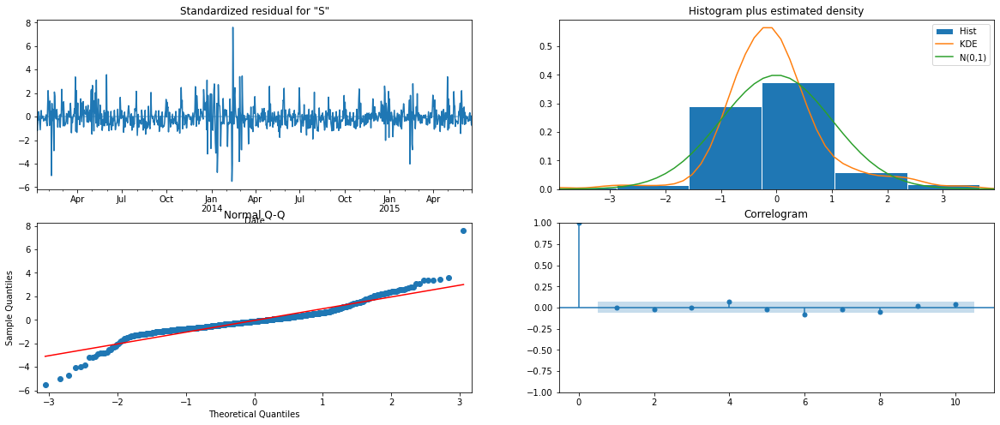

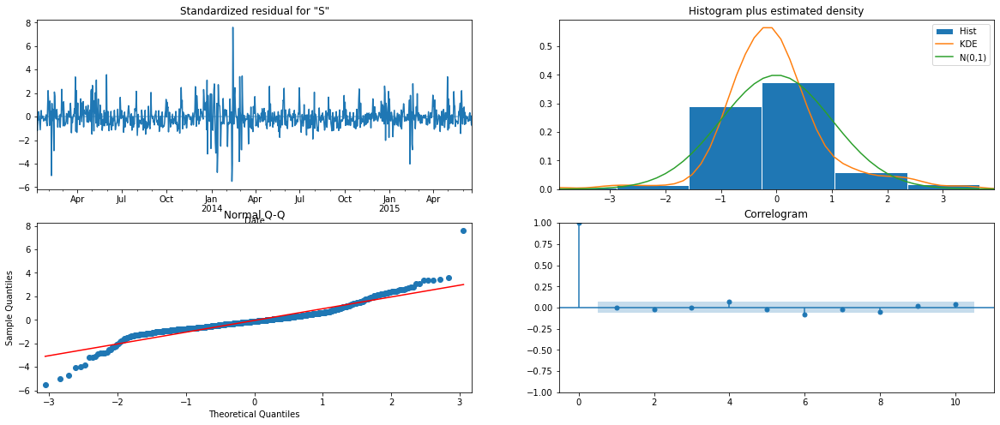

In [643]:
#Plot diagnostics
store25_SARIMAX1.plot_diagnostics()

Residuals are normaly distributed.


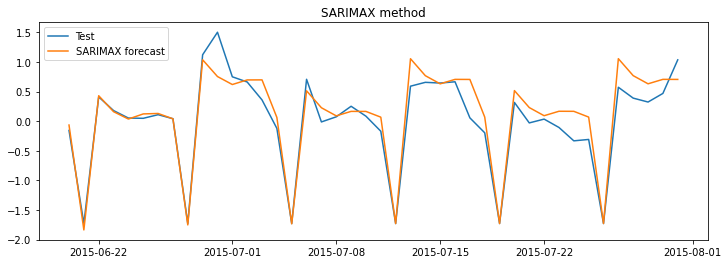

,Model,RMSE,MAPE,AIC
0,SARIMA,0.33,2.32,1751.145692
1,SARIMAX,0.26,1.50,648.987291


In [644]:
# Calculate rmse and mape
calculate_metrics(store25_test.Sales,store25_SARIMAX1.predict(store25_start,store25_end,
                exog=store25_test[['Open', 'Promo', 'StateHoliday', 1, 2, 3, 4, 5, 6, 7]]),
                  Results_store25,'SARIMAX',store25_SARIMAX1.aic)

SARIMAX has given a better prediction here than SARIMA

#### 7.7 Build VARMAX model with exogenous variable


From the previously run adf test we know that both Sales and Customers time serieses are stationary and they move together. So let's build a VARMAX model this time


In [647]:
store25_VARMAX = sm.tsa.VARMAX(store25_train[['Sales', 'Customers']], order=(2,2),trend='n',
                              exog=store25_train[['Open', 'Promo', 'StateHoliday', 1, 2, 3, 4, 5, 6, 7]])
store25_VARMAX = store25_VARMAX.fit(maxiter=1000, disp=False)
print(store25_VARMAX.summary())



/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/statespace/varmax.py:163: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  EstimationWarning)
/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


                             Statespace Model Results                             
Dep. Variable:     ['Sales', 'Customers']   No. Observations:                  900
Model:                        VARMAX(2,2)   Log Likelihood                 558.283
Date:                    Tue, 06 Sep 2022   AIC                          -1038.566
Time:                            15:56:17   BIC                           -851.273
Sample:                        01-01-2013   HQIC                          -967.019
                             - 06-19-2015                                         
Covariance Type:                      opg                                         
Ljung-Box (L1) (Q):             0.07, 0.01   Jarque-Bera (JB):      1540.26, 521.76
Prob(Q):                        0.79, 0.91   Prob(JB):                   0.00, 0.00
Heteroskedasticity (H):         0.73, 0.79   Skew:                      0.04, -0.94
Prob(H) (two-sided):            0.01, 0.04   Kurtosis:                   9.41, 6.22


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/statespace/varmax.py:163: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  EstimationWarning)
/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/statespace/varmax.py:163: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  EstimationWarning)


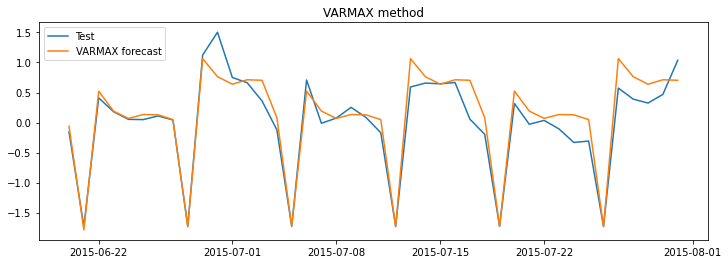

,Model,RMSE,MAPE,AIC
0,SARIMA,0.33,2.32,1751.145692
1,SARIMAX,0.26,1.50,648.987291
2,VARMAX,0.26,1.37,-1038.566084


In [650]:
# Calculate rmse and mapre
calculate_metrics(store25_test.Sales,store25_VARMAX.predict(store25_start,store25_end,
                exog=store25_test[['Open', 'Promo', 'StateHoliday', 1, 2, 3, 4, 5, 6, 7]])['Sales'],
                  Results_store25,'VARMAX',store25_VARMAX.aic)


In [648]:
store25_VARMAX1 = sm.tsa.VARMAX(store25_train[['Sales', 'Customers']], order=(1,1),trend='n',
                              exog=store25_train[['Open', 'Promo', 'StateHoliday', 1, 2, 3, 4, 5, 6, 7]])
store25_VARMAX1 = store25_VARMAX1.fit(maxiter=1000, disp=False)
print(store25_VARMAX1.summary())

/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/statespace/varmax.py:163: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  EstimationWarning)


                             Statespace Model Results                             
Dep. Variable:     ['Sales', 'Customers']   No. Observations:                  900
Model:                        VARMAX(1,1)   Log Likelihood                 529.202
Date:                    Tue, 06 Sep 2022   AIC                           -996.405
Time:                            15:57:48   BIC                           -847.530
Sample:                        01-01-2013   HQIC                          -939.534
                             - 06-19-2015                                         
Covariance Type:                      opg                                         
Ljung-Box (L1) (Q):             0.72, 0.50   Jarque-Bera (JB):      1336.91, 626.30
Prob(Q):                        0.40, 0.48   Prob(JB):                   0.00, 0.00
Heteroskedasticity (H):         0.70, 0.78   Skew:                     -0.08, -1.04
Prob(H) (two-sided):            0.00, 0.03   Kurtosis:                   8.97, 6.52


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/statespace/varmax.py:163: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  EstimationWarning)
/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/statespace/varmax.py:163: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  EstimationWarning)


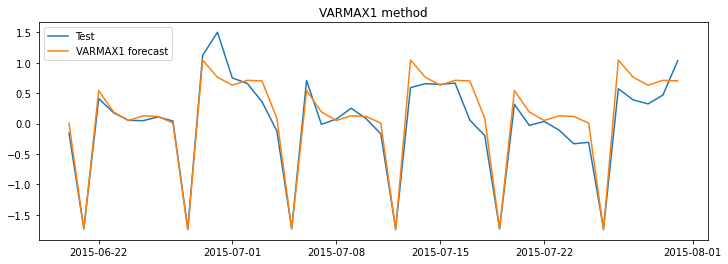

,Model,RMSE,MAPE,AIC
0,SARIMA,0.33,2.32,1751.145692
1,SARIMAX,0.26,1.50,648.987291
2,VARMAX,0.26,1.37,-1038.566084
3,VARMAX1,0.25,1.37,-996.404633


In [651]:
# Calculate rmse and mapre
calculate_metrics(store25_test.Sales,store25_VARMAX1.predict(store25_start,store25_end,
                exog=store25_test[['Open', 'Promo', 'StateHoliday', 1, 2, 3, 4, 5, 6, 7]])['Sales'],
                  Results_store25,'VARMAX1',store25_VARMAX1.aic)

VARMAX(2,2) has given us the better results with good aic and mape score.

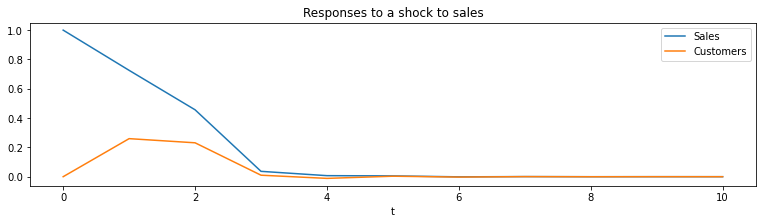

In [653]:
#### Check impluse response function


ax = store25_VARMAX.impulse_responses(10, orthogonalized=False).plot(figsize=(13,3))
ax.set(xlabel='t', title='Responses to a shock to sales');


As per the model, after 5 lags the values of both sales and customers stabilises.


## 8. Build model for store29

##### 8.1 Analyse data 


In [655]:
store_29.head(1)


,DayOfWeek,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,Promo2,PromoInterval,CompetitionSince,SaleYear,SaleMonth
Date,,,,,,,,,,,,
2013-01-01,2,0,0,0,0,a,1,0,NaN,NaT,2013,1


In [656]:
# set frequency for the dataset
store_29.index.freq = store_29.index.inferred_freq
store_29.index

DatetimeIndex(['2013-01-01', '2013-01-02', '2013-01-03', '2013-01-04',
               '2013-01-05', '2013-01-06', '2013-01-07', '2013-01-08',
               '2013-01-09', '2013-01-10',
               ...
               '2015-07-22', '2015-07-23', '2015-07-24', '2015-07-25',
               '2015-07-26', '2015-07-27', '2015-07-28', '2015-07-29',
               '2015-07-30', '2015-07-31'],
              dtype='datetime64[ns]', name='Date', length=942, freq='D')

In [657]:
store_29.describe(include='all')

,DayOfWeek,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,Promo2,PromoInterval,CompetitionSince,SaleYear,SaleMonth
count,942.000000,942.000000,942.000000,942.000000,942.000000,942,942.000000,942.0,0,0,942.000000,942.000000
unique,NaN,NaN,NaN,NaN,NaN,4,NaN,NaN,0,0,NaN,NaN
top,NaN,NaN,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN
freq,NaN,NaN,NaN,NaN,NaN,913,NaN,NaN,NaN,NaN,NaN,NaN
mean,3.997877,6090.403397,540.587049,0.826964,0.382166,NaN,0.180467,0.0,NaN,NaN,2013.837580,5.961783
std,1.998404,3433.366553,277.347395,0.378479,0.486175,NaN,0.384780,0.0,NaN,NaN,0.766009,3.350357
min,1.000000,0.000000,0.000000,0.000000,0.000000,NaN,0.000000,0.0,NaN,NaN,2013.000000,1.000000
25%,2.000000,4972.500000,498.500000,1.000000,0.000000,NaN,0.000000,0.0,NaN,NaN,2013.000000,3.000000
50%,4.000000,6361.500000,598.000000,1.000000,0.000000,NaN,0.000000,0.0,NaN,NaN,2014.000000,6.000000
75%,6.000000,8072.000000,703.000000,1.000000,1.000000,NaN,0.000000,0.0,NaN,NaN,2014.000000,9.000000


In [658]:

# Remove PromoInterval,CompetitionSince columns from store_29 data
store_29.drop(labels=['Promo2','PromoInterval','CompetitionSince'],axis=1,inplace=True)
store_29.shape

(942, 9)

In [659]:

print(store_29.StateHoliday.value_counts())
# Check the sales by state holiday
store_29.groupby(by=['StateHoliday'])['Sales'].sum()


0    913
a     19
b      6
c      4
Name: StateHoliday, dtype: int64


StateHoliday
0    5737160
a          0
b          0
c          0
Name: Sales, dtype: int64

In [660]:
#Sales is zero whenever there is a state holiday. So it is better make the variables having only 2 levels,
#1 for  state holiday and 0 for non-holiday.

store_29.StateHoliday= store_29.StateHoliday.apply(lambda x : 0 if x=='0' else 1)

store_29.StateHoliday.value_counts()


0    913
1     29
Name: StateHoliday, dtype: int64

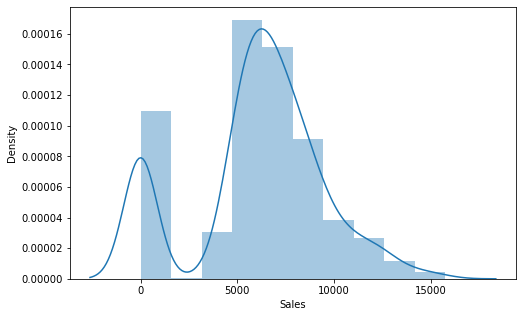

In [661]:
# Check the distribution of sales
plt.figure(figsize=(8,5))
sns.distplot(store_29.Sales,bins=10)
plt.show()


Sales is normally distributed

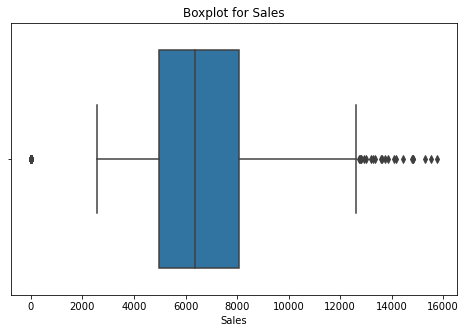

Quartile values for Sales
0.750     8072.000
0.800     8517.400
0.900    10014.400
0.990    13808.260
0.995    14795.505
0.999    15543.452
1.000    15758.000
Name: Sales, dtype: float64


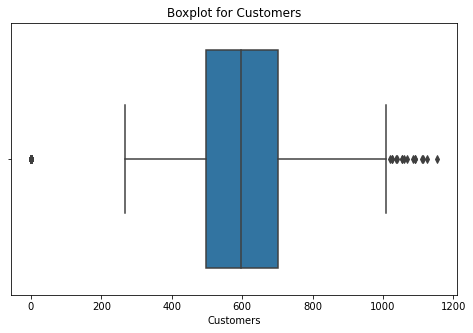

Quartile values for Customers
0.750     703.000
0.800     728.800
0.900     822.800
0.990    1054.590
0.995    1091.295
0.999    1126.652
1.000    1153.000
Name: Customers, dtype: float64


In [662]:
###### Check for outliers



check_outliers(store_29[['Sales','Customers']])

In [663]:
#For Values > 0.99th percentile value, we can do capping method to set them as 99th percentile value.
sales_cap = store_29.Sales.quantile(.99)
Customers_cap = store_29.Customers.quantile(.99)


store_29.loc[store_29.Sales > sales_cap,'Sales'] =  sales_cap
store_29.loc[store_29.Customers > Customers_cap,'Customers'] =  Customers_cap


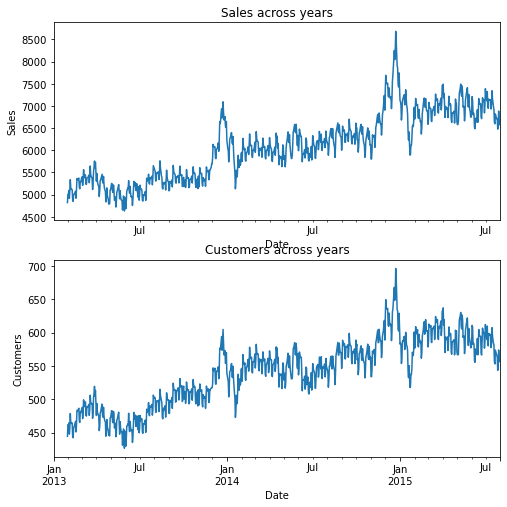

In [665]:
# Plot sales data using a rolling window
plt.figure(figsize=(8,8))
plt.subplot(2,1,1)
plt.title('Sales across years')
store_29.Sales.rolling(30).mean().plot()
plt.xticks([])
plt.ylabel('Sales')

plt.subplot(2,1,2)
plt.title('Customers across years')
store_29.Customers.rolling(30).mean().plot()
plt.xlabel('Date')
plt.ylabel('Customers')
plt.show()


We have two time series here, sales and customers. Sale value is directly proportional to number of customers.
Sales is peaking in December month.

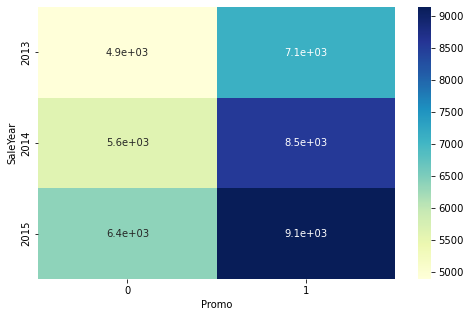

In [666]:
# Relation between sales and Promo
plt.figure(figsize=(8,5))
sns.heatmap(store_29.groupby(by=['SaleYear','Promo'])['Sales'].median().unstack(),cmap="YlGnBu",annot=True)
plt.show()


Clearly promotion has a high influence in the sales.


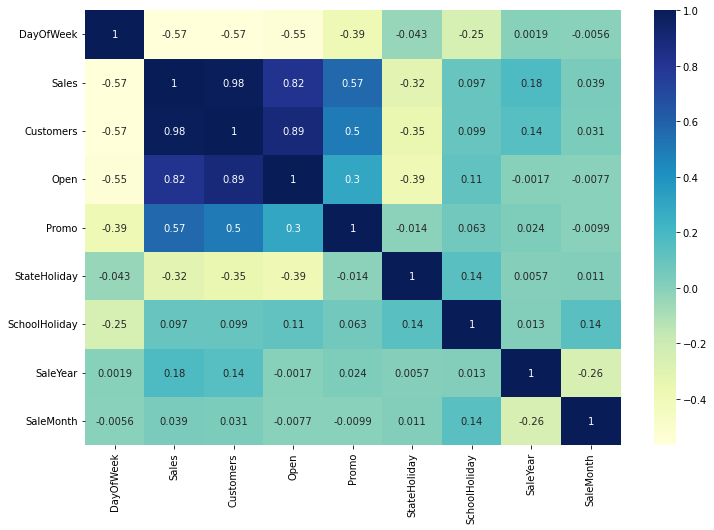

In [667]:
###### Check correlation between data points

store29_corr = store_29.corr()

plt.figure(figsize=(12,8))
sns.heatmap(store29_corr,annot=True,cmap='YlGnBu')
plt.show()


- Sales is having a high correlation with Customers,Open and Promo

In [668]:
##### Preprocess data


# Drop SaleYear and SaleMonth columns
store_29.drop(['SaleYear','SaleMonth'],inplace=True,axis=1)

# Make DayOfWeek as a onehot encoded variable
store_29 = pd.concat([store_29.iloc[:,1:],pd.get_dummies(store_29.DayOfWeek)],axis=1)
store_29.shape


(942, 13)

##### 8.2 Split the data into train and test.
As we need a daily forecast for 6 weeks, we will take last 42 days data as test set and the rest as train set.



In [669]:
store29_train = store_29[:-42].copy()
print('train set shape:',store29_train.shape)
store29_test  = store_29[-42:].copy()
print('test set shape:',store29_test.shape)



train set shape: (900, 13)
test set shape: (42, 13)


##### Standardize train data


In [670]:
# Standardize train data
scaler = StandardScaler()
store29_train[['Sales','Customers']] = scaler.fit_transform(store29_train[['Sales','Customers']])
print(store29_train.head())
store29_test[['Sales','Customers']] = scaler.transform(store29_test[['Sales','Customers']])
print(store29_test.head())


               Sales  Customers  Open  Promo  StateHoliday  SchoolHoliday  1  \
Date                                                                           
2013-01-01 -1.773803  -1.943239     0      0             1              1  0   
2013-01-02 -0.229304   0.039421     1      0             0              1  0   
2013-01-03 -0.438892  -0.299433     1      0             0              1  0   
2013-01-04 -0.187680  -0.122796     1      0             0              1  0   
2013-01-05 -0.142831  -0.007442     1      0             0              0  0   

            2  3  4  5  6  7  
Date                          
2013-01-01  1  0  0  0  0  0  
2013-01-02  0  1  0  0  0  0  
2013-01-03  0  0  1  0  0  0  
2013-01-04  0  0  0  1  0  0  
2013-01-05  0  0  0  0  1  0  
               Sales  Customers  Open  Promo  StateHoliday  SchoolHoliday  1  \
Date                                                                           
2015-06-20  0.605528   0.727945     1      0             0    

##### 8.3 Check stationarity of the series


In [671]:
# Check stationarity of sales series
adf_test(store29_train.Sales) # ADF test--> H0: Not stationary, H1: Is stationary if p<0.05 then reject H0 then series is stationary 
# Check stationarity of Customers series
adf_test(store29_train.Customers)




Sales: ADF test results:
ADF Statistic: -3.173510
p-value: 0.021570
Critical Values:
	1%: -3.438
	5%: -2.865
	10%: -2.569

Customers: ADF test results:
ADF Statistic: -3.343301
p-value: 0.013050
Critical Values:
	1%: -3.438
	5%: -2.865
	10%: -2.569


ADF test: As the p-value is < 0.05 for both sales and customers they are stationary.


##### 8.4 Autocorrelation function (ACF) and Partial autocorrelation function (PACF)
Let's plot ACF to find q value and PACF to know p value


-----ACF and PCF for Sales-------


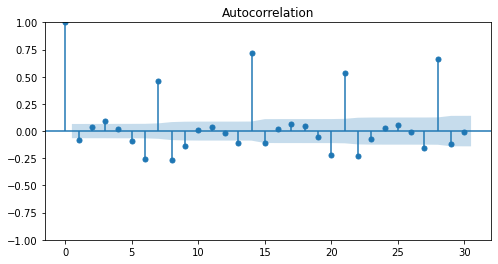

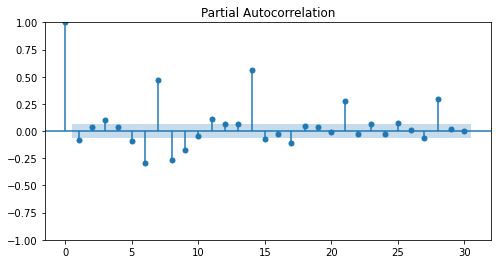

-----ACF and PCF for Customers-------


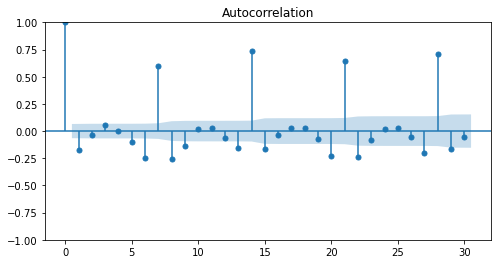

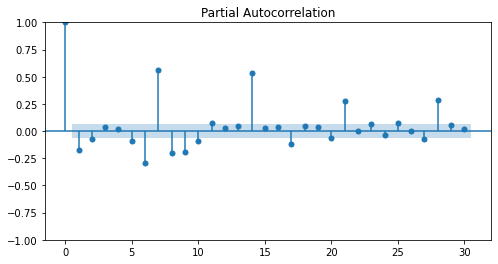

In [672]:
#Plot acf and pacf for store29 sales data
print('-----ACF and PCF for Sales-------')
plot_autocorrelation(store29_train.Sales,30)
print('-----ACF and PCF for Customers-------')
#Plot acf and pacf for customers  data
plot_autocorrelation(store29_train.Customers,30)


There is a weekely spike happening in the acf plot. The same is reflecting in pacf plot as well, so s can be taken as 7.


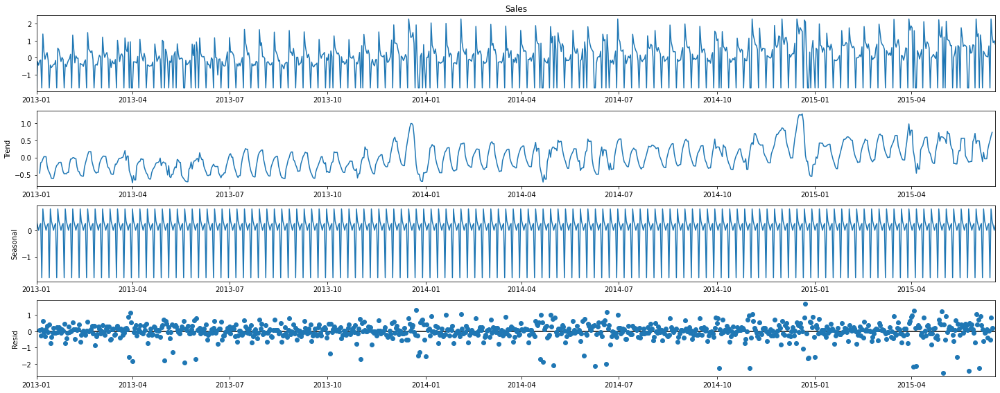

In [673]:
# Let's try to decompose the data to identify if there are any seasonal components
rcParams['figure.figsize'] = 20, 8
decomposition = sm.tsa.seasonal_decompose(store29_train.Sales, model='additive') # additive seasonal index
fig = decomposition.plot()
plt.show()

Clearly the series is random and the values are fluctuating throughout the year. The peaks come after 7 days.


In [674]:
# Create start and end indexes
store29_start = store29_test.index.min()
store29_end = store29_test.index.max()

#### 8.5 Build SARIMA model


As the acf and pacf plots are showing significant correlations for higher orders we will try few values for p and q and then go with the model with least AIC values.


In [675]:

# Create combinations for lag and ma orderes for both seasonal and non seasonal components
p = q = range(0, 3)
d = range(0, 1)
pdq = list(itertools.product(p, d, q))
p = q = range(0, 2)
d = range(0, 2)
seasonal_pdq = [(x[0], x[1], x[2], 7) for x in list(itertools.product(p, d, q))]

print('Examples of parameter combinations for Seasonal ARIMA...')
print('SARIMAX: {} x {}'.format(pdq[1], seasonal_pdq[1]))
print('SARIMAX: {} x {}'.format(pdq[1], seasonal_pdq[2]))
print('SARIMAX: {} x {}'.format(pdq[2], seasonal_pdq[3]))
print('SARIMAX: {} x {}'.format(pdq[2], seasonal_pdq[4]))

Examples of parameter combinations for Seasonal ARIMA...
SARIMAX: (0, 0, 1) x (0, 0, 1, 7)
SARIMAX: (0, 0, 1) x (0, 1, 0, 7)
SARIMAX: (0, 0, 2) x (0, 1, 1, 7)
SARIMAX: (0, 0, 2) x (1, 0, 0, 7)


In [676]:
for param in pdq:
    for param_seasonal in seasonal_pdq:
        try:
            model = SARIMAX(store29_train.Sales,
                            order=param,
                            seasonal_order=param_seasonal)
    

            results = model.fit()

            print('ARIMA{} x {} - AIC:{}'.format(param, param_seasonal, results.aic))
        except:
            continue


ARIMA(0, 0, 0) x (0, 0, 0, 7) - AIC:2556.0893597684108
ARIMA(0, 0, 0) x (0, 0, 1, 7) - AIC:2463.2616736435907
ARIMA(0, 0, 0) x (0, 1, 0, 7) - AIC:2589.2073325475594
ARIMA(0, 0, 0) x (0, 1, 1, 7) - AIC:1750.0859683754113
ARIMA(0, 0, 0) x (1, 0, 0, 7) - AIC:2338.119846785189
ARIMA(0, 0, 0) x (1, 0, 1, 7) - AIC:1768.535278657734
ARIMA(0, 0, 0) x (1, 1, 0, 7) - AIC:1884.8125904402752
ARIMA(0, 0, 0) x (1, 1, 1, 7) - AIC:1590.215434348375
ARIMA(0, 0, 1) x (0, 0, 0, 7) - AIC:2553.007693181242
ARIMA(0, 0, 1) x (0, 0, 1, 7) - AIC:2464.107064519953
ARIMA(0, 0, 1) x (0, 1, 0, 7) - AIC:2512.150409133734
ARIMA(0, 0, 1) x (0, 1, 1, 7) - AIC:1702.1161312786867
ARIMA(0, 0, 1) x (1, 0, 0, 7) - AIC:2310.3693822481073
ARIMA(0, 0, 1) x (1, 0, 1, 7) - AIC:1721.5727123063743
ARIMA(0, 0, 1) x (1, 1, 0, 7) - AIC:1870.6763864453728
ARIMA(0, 0, 1) x (1, 1, 1, 7) - AIC:1575.326174865422
ARIMA(0, 0, 2) x (0, 0, 0, 7) - AIC:2552.2883272933914
ARIMA(0, 0, 2) x (0, 0, 1, 7) - AIC:2456.532602882483
ARIMA(0, 0, 2) x (

/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(2, 0, 2) x (0, 1, 0, 7) - AIC:2210.9332299416183
ARIMA(2, 0, 2) x (0, 1, 1, 7) - AIC:1548.463189038564
ARIMA(2, 0, 2) x (1, 0, 0, 7) - AIC:2098.5807275973007


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(2, 0, 2) x (1, 0, 1, 7) - AIC:1567.1985016128456


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(2, 0, 2) x (1, 1, 0, 7) - AIC:1765.4667947128519
ARIMA(2, 0, 2) x (1, 1, 1, 7) - AIC:1512.1506590304534


ARIMA(2, 0, 2) x (1, 1, 1, 7) - AIC:1512.1506590304534 is the least


In [677]:
store29_SARIMA = SARIMAX(store29_train.Sales,
                                order=(2, 0, 2),
                                seasonal_order=(1, 1, 1, 7))
            

store29_SARIMA = store29_SARIMA.fit()
store29_SARIMA.summary()


<class 'statsmodels.iolib.summary.Summary'>
"""
                                      SARIMAX Results                                      
===========================================================================================
Dep. Variable:                               Sales   No. Observations:                  900
Model:             SARIMAX(2, 0, 2)x(1, 1, [1], 7)   Log Likelihood                -749.075
Date:                             Tue, 06 Sep 2022   AIC                           1512.151
Time:                                     16:19:35   BIC                           1545.713
Sample:                                 01-01-2013   HQIC                          1524.976
                                      - 06-19-2015                                         
Covariance Type:                               opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          1.7254      0.025     70.291      0.000       1.677       1.774
ar.L2         -0.9314      0.024    -38.820      0.000      -0.978      -0.884
ma.L1         -1.5989      0.029    -55.834      0.000      -1.655      -1.543
ma.L2          0.8460      0.029     29.317      0.000       0.789       0.903
ar.S.L7       -0.2318      0.036     -6.380      0.000      -0.303      -0.161
ma.S.L7       -0.9148      0.013    -69.151      0.000      -0.941      -0.889
sigma2         0.3074      0.009     35.976      0.000       0.291       0.324
===================================================================================
Ljung-Box (L1) (Q):                   1.13   Jarque-Bera (JB):              1828.69
Prob(Q):                              0.29   Prob(JB):                         0.00
Heteroskedasticity (H):               2.20   Skew:                            -1.48
Prob(H) (two-sided):                  0.00   Kurtosis:                         9.36
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

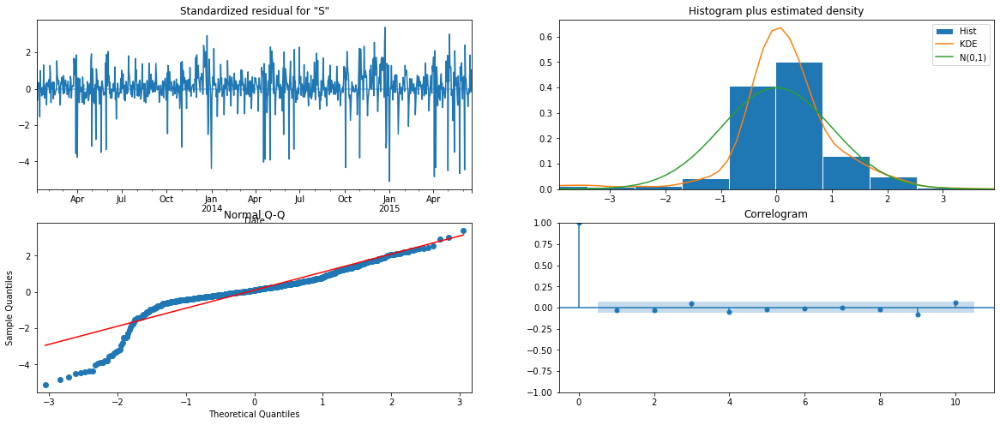

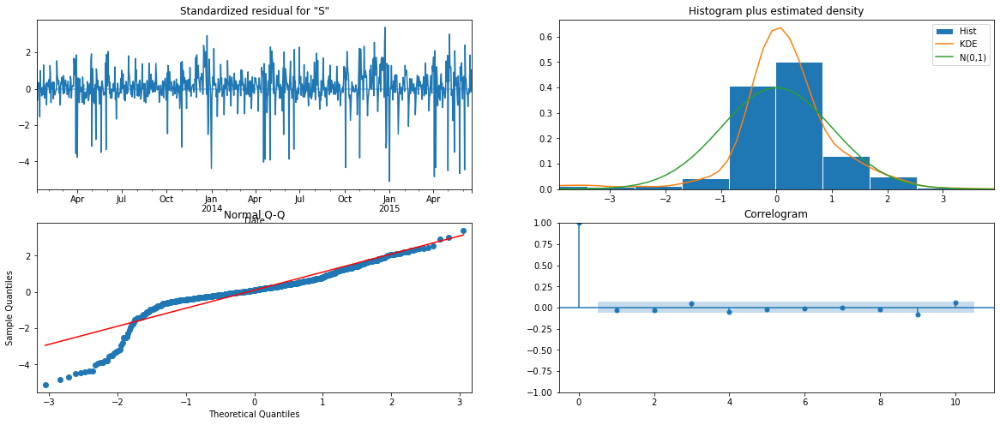

In [678]:
# Plot diagnostics
store29_SARIMA.plot_diagnostics()


According to the plots our model residuals are almost normally distributed also there is no significant correlation in the residuals. So our model is acceptable.


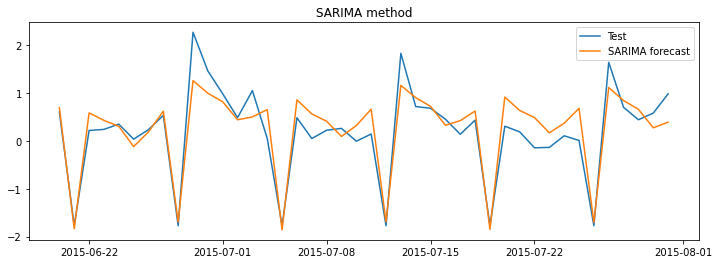

,Model,RMSE,MAPE,AIC
0,SARIMA,0.38,4.31,1512.150659


In [679]:
#Now let's calculate RMSE and MAPE score
# Create a results dataframe
Results_store29 = pd.DataFrame(columns=['Model', 'RMSE' ,'MAPE','AIC'])

calculate_metrics(store29_test.Sales,store29_SARIMA.predict(store29_start,store29_end),Results_store29,'SARIMA',store29_SARIMA.aic)



#### 8.6 Build SARIMAX model with exogenous variable


In [680]:
print(list(store29_train.columns))


['Sales', 'Customers', 'Open', 'Promo', 'StateHoliday', 'SchoolHoliday', 1, 2, 3, 4, 5, 6, 7]


In [688]:
store29_SARIMAX = SARIMAX(store29_train.Sales,
                                order=(2, 0, 2),
                                seasonal_order=(1, 1, 1, 7),
                         exog=store29_train[['Open', 'Promo', 'StateHoliday', 'SchoolHoliday', 1, 2, 3, 4, 5, 6, 7]])
            

store29_SARIMAX = store29_SARIMAX.fit(max_iter=1000)
store29_SARIMAX.summary()


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


<class 'statsmodels.iolib.summary.Summary'>
"""
                                      SARIMAX Results                                      
===========================================================================================
Dep. Variable:                               Sales   No. Observations:                  900
Model:             SARIMAX(2, 0, 2)x(1, 1, [1], 7)   Log Likelihood                -216.696
Date:                             Tue, 06 Sep 2022   AIC                            469.392
Time:                                     16:27:56   BIC                            555.695
Sample:                                 01-01-2013   HQIC                           502.373
                                      - 06-19-2015                                         
Covariance Type:                               opg                                         
=================================================================================
                    coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------
Open              1.1013      0.018     59.878      0.000       1.065       1.137
Promo             0.8541      0.034     24.956      0.000       0.787       0.921
StateHoliday     -1.1036      0.018    -60.001      0.000      -1.140      -1.068
SchoolHoliday     0.1071      0.032      3.365      0.001       0.045       0.169
1             -3.235e-07   3.83e-10   -843.982      0.000   -3.24e-07   -3.23e-07
2             -5.403e-07   1.89e-10  -2857.588      0.000   -5.41e-07    -5.4e-07
3             -1.522e-07   1.78e-10   -853.302      0.000   -1.53e-07   -1.52e-07
4               7.52e-08   1.67e-10    449.252      0.000    7.49e-08    7.55e-08
5             -4.265e-08   2.34e-10   -182.097      0.000   -4.31e-08   -4.22e-08
6              1.902e-07   2.57e-10    738.976      0.000     1.9e-07    1.91e-07
7               1.03e-07   2.74e-10    376.552      0.000    1.02e-07    1.04e-07
ar.L1             0.0290      0.074      0.393      0.694      -0.116       0.174
ar.L2             0.7918      0.064     12.415      0.000       0.667       0.917
ma.L1             0.2422      0.077      3.140      0.002       0.091       0.393
ma.L2            -0.6257      0.051    -12.329      0.000      -0.725      -0.526
ar.S.L7          -0.3687      0.032    -11.482      0.000      -0.432      -0.306
ma.S.L7          -0.8917      0.015    -59.160      0.000      -0.921      -0.862
sigma2            0.0936      0.003     27.995      0.000       0.087       0.100
===================================================================================
Ljung-Box (L1) (Q):                   0.94   Jarque-Bera (JB):               263.54
Prob(Q):                              0.33   Prob(JB):                         0.00
Heteroskedasticity (H):               1.68   Skew:                             0.54
Prob(H) (two-sided):                  0.00   Kurtosis:                         5.43
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
[2] Covariance matrix is singular or near-singular, with condition number 6.61e+32. Standard errors may be unstable.
"""

We have an improved model with lesser aic and almost all variables are significant here


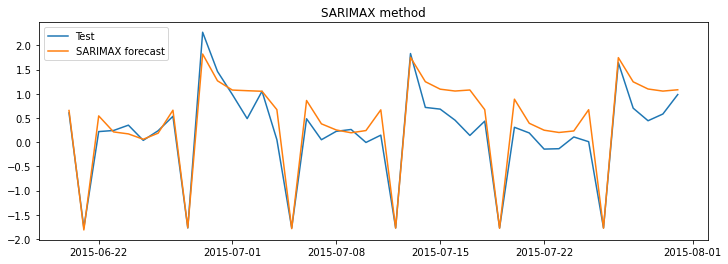

,Model,RMSE,MAPE,AIC
0,SARIMA,0.38,4.31,1512.150659
1,SARIMAX,0.36,3.84,469.392259


In [682]:
# Calculate rmse and mape
calculate_metrics(store29_test.Sales,store29_SARIMAX.predict(store29_start,store29_end,
                exog=store29_test[['Open', 'Promo', 'StateHoliday', 'SchoolHoliday', 1, 2, 3, 4, 5, 6, 7]]),
                  Results_store29,'SARIMAX',store29_SARIMAX.aic)


We have an improved rmse and mape values but the weekely peeks are not captured well here.


#### 8.7 Build VARMAX model with exogenous variable

From the previously run adf test we know that both Sales and Customers time serieses are stationary and they move together. So let's build a VARMAX model this time


In [687]:
store29_VARMAX = sm.tsa.VARMAX(store29_train[['Sales', 'Customers']], order=(2,2),trend='n',
                              exog=store29_train[['Open', 'Promo', 'StateHoliday', 'SchoolHoliday', 1, 2, 3, 4, 5, 6, 7]])
store29_VARMAX = store29_VARMAX.fit(maxiter=1000, disp=False)
print(store29_VARMAX.summary())


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/statespace/varmax.py:163: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  EstimationWarning)
/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


                             Statespace Model Results                             
Dep. Variable:     ['Sales', 'Customers']   No. Observations:                  900
Model:                        VARMAX(2,2)   Log Likelihood                 616.743
Date:                    Tue, 06 Sep 2022   AIC                          -1151.486
Time:                            16:27:50   BIC                           -954.588
Sample:                        01-01-2013   HQIC                         -1076.270
                             - 06-19-2015                                         
Covariance Type:                      opg                                         
Ljung-Box (L1) (Q):             1.19, 0.13   Jarque-Bera (JB):       203.58, 550.60
Prob(Q):                        0.28, 0.72   Prob(JB):                   0.00, 0.00
Heteroskedasticity (H):         1.36, 1.02   Skew:                      0.50, -0.45
Prob(H) (two-sided):            0.01, 0.89   Kurtosis:                   5.11, 6.72


aic reduced to -1151.486


In [689]:
# Remove ''SchoolHoliday' and try
store29_VARMAX1 = sm.tsa.VARMAX(store29_train[['Sales', 'Customers']], order=(2,2),trend='n',
                              exog=store29_train[['Open', 'Promo', 'StateHoliday', 1, 2, 3, 4, 5, 6, 7]])
store29_VARMAX1 = store29_VARMAX1.fit(maxiter=1000, disp=False)
print(store29_VARMAX1.summary())


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/statespace/varmax.py:163: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  EstimationWarning)
/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


                             Statespace Model Results                             
Dep. Variable:     ['Sales', 'Customers']   No. Observations:                  900
Model:                        VARMAX(2,2)   Log Likelihood                 615.471
Date:                    Tue, 06 Sep 2022   AIC                          -1152.942
Time:                            16:31:26   BIC                           -965.649
Sample:                        01-01-2013   HQIC                         -1081.395
                             - 06-19-2015                                         
Covariance Type:                      opg                                         
Ljung-Box (L1) (Q):             1.22, 0.09   Jarque-Bera (JB):       219.75, 500.97
Prob(Q):                        0.27, 0.77   Prob(JB):                   0.00, 0.00
Heteroskedasticity (H):         1.36, 1.01   Skew:                      0.52, -0.43
Prob(H) (two-sided):            0.01, 0.96   Kurtosis:                   5.19, 6.55


In [690]:
#Let's remove weekdays columns 1, 2, 3, 4, 5, 6, 7 as they are insignificant and check the model
store29_VARMAX2 = sm.tsa.VARMAX(store29_train[['Sales', 'Customers']], order=(2,2),trend='n',
                              exog=store29_train[['Open', 'Promo', 'StateHoliday']])
store29_VARMAX2 = store29_VARMAX2.fit(maxiter=1000, disp=False)
print(store29_VARMAX2.summary())

/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/statespace/varmax.py:163: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  EstimationWarning)
/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


                             Statespace Model Results                             
Dep. Variable:     ['Sales', 'Customers']   No. Observations:                  900
Model:                        VARMAX(2,2)   Log Likelihood                -281.313
Date:                    Tue, 06 Sep 2022   AIC                            612.625
Time:                            16:35:14   BIC                            732.685
Sample:                        01-01-2013   HQIC                           658.489
                             - 06-19-2015                                         
Covariance Type:                      opg                                         
Ljung-Box (L1) (Q):           12.62, 15.50   Jarque-Bera (JB):           0.31, 4.97
Prob(Q):                        0.00, 0.00   Prob(JB):                   0.86, 0.08
Heteroskedasticity (H):         1.02, 1.58   Skew:                      0.04, -0.18
Prob(H) (two-sided):            0.87, 0.00   Kurtosis:                   2.94, 3.05


AIC has increased, but will chek the performance of models

/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/statespace/varmax.py:163: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  EstimationWarning)
/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/statespace/varmax.py:163: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  EstimationWarning)


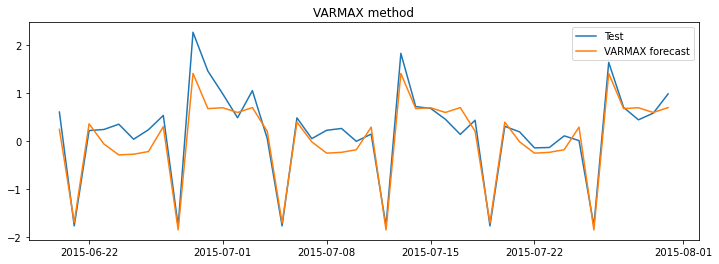

,Model,RMSE,MAPE,AIC
0,SARIMA,0.38,4.31,1512.150659
1,SARIMAX,0.36,3.84,469.392259
2,VARMAX,0.32,2.32,-1151.486254


In [694]:
# Calculate rmse and mapre
calculate_metrics(store29_test.Sales,store29_VARMAX.predict(store29_start,store29_end,
                exog=store29_test[['Open', 'Promo', 'StateHoliday', 'SchoolHoliday', 1, 2, 3, 4, 5, 6, 7]])['Sales'],
                  Results_store29,'VARMAX',store29_VARMAX.aic)


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/statespace/varmax.py:163: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  EstimationWarning)
/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/statespace/varmax.py:163: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  EstimationWarning)


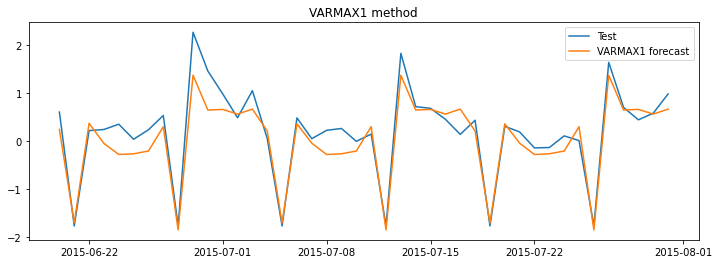

,Model,RMSE,MAPE,AIC
0,SARIMA,0.38,4.31,1512.150659
1,SARIMAX,0.36,3.84,469.392259
2,VARMAX,0.32,2.32,-1151.486254
3,VARMAX1,0.33,2.48,-1152.942347


In [696]:
# Calculate rmse and mapre
calculate_metrics(store29_test.Sales,store29_VARMAX1.predict(store29_start,store29_end,
                exog=store29_test[['Open', 'Promo', 'StateHoliday', 1, 2, 3, 4, 5, 6, 7]])['Sales'],
                  Results_store29,'VARMAX1',store29_VARMAX1.aic)


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/statespace/varmax.py:163: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  EstimationWarning)
/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/statespace/varmax.py:163: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  EstimationWarning)


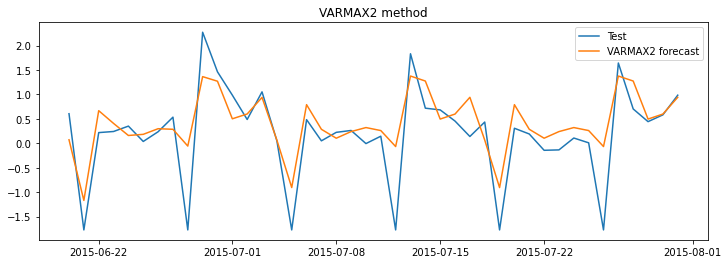

,Model,RMSE,MAPE,AIC
0,SARIMA,0.38,4.31,1512.150659
1,SARIMAX,0.36,3.84,469.392259
2,VARMAX,0.32,2.32,-1151.486254
3,VARMAX1,0.33,2.48,-1152.942347
4,VARMAX2,0.60,2.87,612.625055


In [697]:
# Calculate rmse and mapre
calculate_metrics(store29_test.Sales,store29_VARMAX2.predict(store29_start,store29_end,
                exog=store29_test[['Open', 'Promo', 'StateHoliday']])['Sales'],
                  Results_store29,'VARMAX2',store29_VARMAX2.aic)


For store 29 VARMAX model gives the best mape and aic score

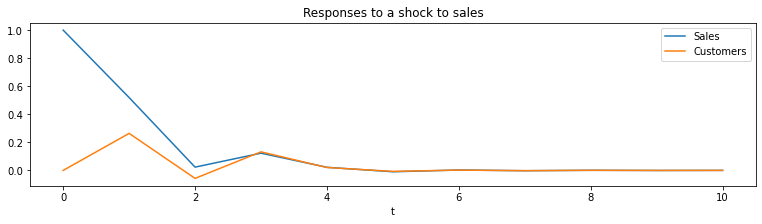

In [698]:

##### Check impluse response function


ax = store29_VARMAX.impulse_responses(10, orthogonalized=False).plot(figsize=(13,3))
ax.set(xlabel='t', title='Responses to a shock to sales');



As per the model, after 4 lags the values of both sales and customers stabilises.


## 9. Build model for store31

##### 9.1 Analyse data 


In [699]:
store_31.head(1)


,DayOfWeek,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,Promo2,PromoInterval,CompetitionSince,SaleYear,SaleMonth
Date,,,,,,,,,,,,
2013-01-01,2,0,0,0,0,a,1,0,NaN,2012-07-01,2013,1


In [700]:
# set frequency for the dataset
store_31.index.freq = store_31.index.inferred_freq
store_31.index


DatetimeIndex(['2013-01-01', '2013-01-02', '2013-01-03', '2013-01-04',
               '2013-01-05', '2013-01-06', '2013-01-07', '2013-01-08',
               '2013-01-09', '2013-01-10',
               ...
               '2015-07-22', '2015-07-23', '2015-07-24', '2015-07-25',
               '2015-07-26', '2015-07-27', '2015-07-28', '2015-07-29',
               '2015-07-30', '2015-07-31'],
              dtype='datetime64[ns]', name='Date', length=942, freq='D')

In [701]:
store_31.describe(include='all')

,DayOfWeek,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,Promo2,PromoInterval,CompetitionSince,SaleYear,SaleMonth
count,942.000000,942.000000,942.000000,942.000000,942.000000,942,942.000000,942.0,0,942,942.000000,942.000000
unique,NaN,NaN,NaN,NaN,NaN,4,NaN,NaN,0,1,NaN,NaN
top,NaN,NaN,NaN,NaN,NaN,0,NaN,NaN,NaN,2012-07-01 00:00:00,NaN,NaN
freq,NaN,NaN,NaN,NaN,NaN,918,NaN,NaN,NaN,942,NaN,NaN
first,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2012-07-01 00:00:00,NaN,NaN
last,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2012-07-01 00:00:00,NaN,NaN
mean,3.997877,4879.132696,487.753715,0.832272,0.382166,NaN,0.168790,0.0,NaN,NaN,2013.837580,5.961783
std,1.998404,2506.671454,234.178009,0.373823,0.486175,NaN,0.374765,0.0,NaN,NaN,0.766009,3.350357
min,1.000000,0.000000,0.000000,0.000000,0.000000,NaN,0.000000,0.0,NaN,NaN,2013.000000,1.000000
25%,2.000000,4370.250000,485.000000,1.000000,0.000000,NaN,0.000000,0.0,NaN,NaN,2013.000000,3.000000


In [702]:
# Remove PromoInterval,CompetitionSince columns from store_31 data
store_31.drop(labels=['Promo2','PromoInterval','CompetitionSince'],axis=1,inplace=True)
store_31.StateHoliday= store_31.StateHoliday.apply(lambda x : 0 if x=='0' else 1)
store_31.head(1)

,DayOfWeek,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,SaleYear,SaleMonth
Date,,,,,,,,,
2013-01-01,2,0,0,0,0,1,1,2013,1


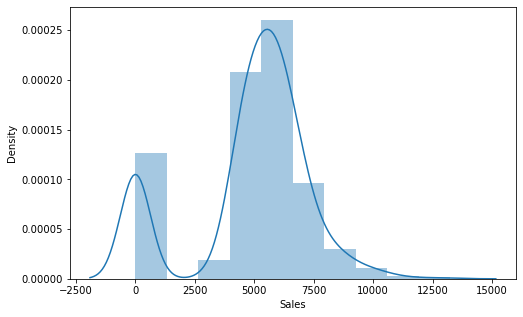

In [703]:
# Check the distribution of sales
plt.figure(figsize=(8,5))
sns.distplot(store_31.Sales,bins=10)
plt.show()

Data looks normally distributed

###### Check for outliers


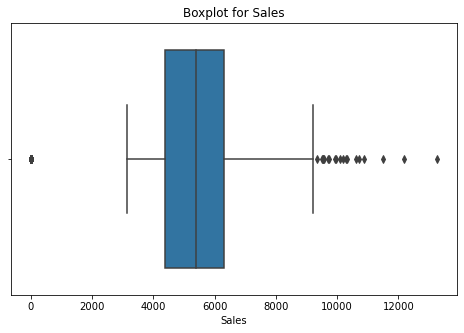

Quartile values for Sales
0.750     6316.000
0.800     6551.400
0.900     7277.800
0.990    10030.550
0.995    10643.925
0.999    12254.540
1.000    13252.000
Name: Sales, dtype: float64


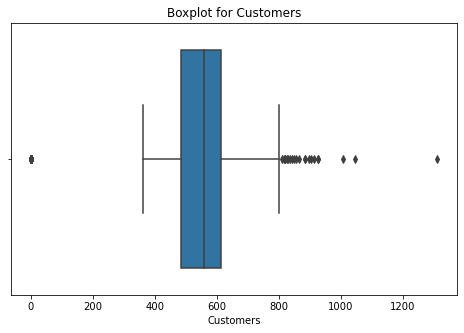

Quartile values for Customers
0.750     614.000
0.800     632.000
0.900     675.000
0.990     877.210
0.995     918.245
0.999    1060.635
1.000    1310.000
Name: Customers, dtype: float64


In [704]:
check_outliers(store_31[['Sales','Customers']])


In [705]:
#For Values > 0.99th percentile value, we can do capping method to set them as 99th percentile value.
sales_cap = store_31.Sales.quantile(.99)
Customers_cap = store_31.Customers.quantile(.99)


store_31.loc[store_31.Sales > sales_cap,'Sales'] =  sales_cap
store_31.loc[store_31.Customers > Customers_cap,'Customers'] =  Customers_cap


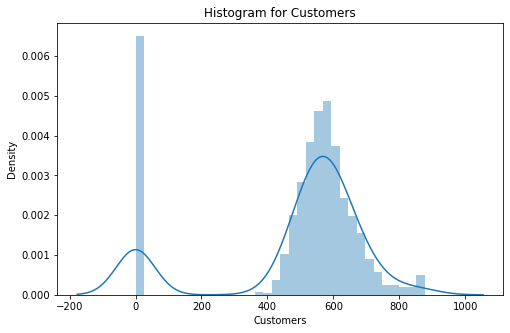

In [706]:
#  plot the distribution after removing outliers
plt.figure(figsize=(8,5))
sns.distplot(store_31.Customers)
plt.title('Histogram for Customers')
plt.show()

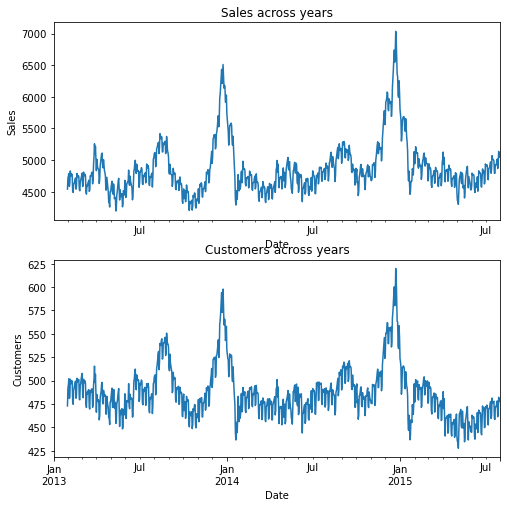

In [707]:
# Plot sales data using a rolling window
plt.figure(figsize=(8,8))
plt.subplot(2,1,1)
plt.title('Sales across years')
store_31.Sales.rolling(30).mean().plot()
plt.xticks([])
plt.ylabel('Sales')

plt.subplot(2,1,2)
plt.title('Customers across years')
store_31.Customers.rolling(30).mean().plot()
plt.xlabel('Date')
plt.ylabel('Customers')
plt.show()

We have two time series here, sales and customers. Sale value is directly proportional to number of customers.
Sales is peaking in December month.

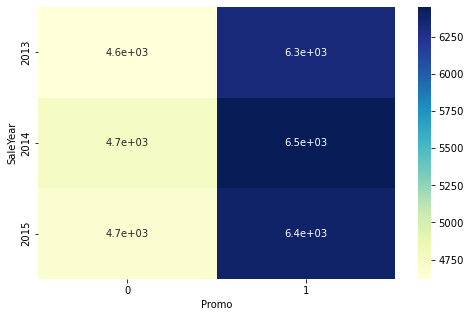

In [709]:
# Relation between sales and Promo
plt.figure(figsize=(8,5))
sns.heatmap(store_31.groupby(by=['SaleYear','Promo'])['Sales'].median().unstack(),cmap="YlGnBu",annot=True)
plt.show()

Clearly promotion has a high influence in the sales.


###### Check correlation between data points


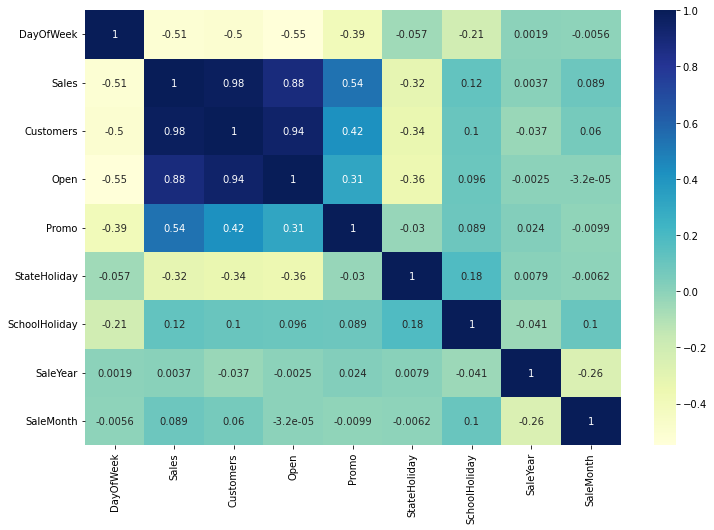

In [710]:
store31_corr = store_31.corr()

plt.figure(figsize=(12,8))
sns.heatmap(store31_corr,annot=True,cmap='YlGnBu')
plt.show()

- Sales is having a high correlation with Customers,Open and Promo


In [711]:
##### Preprocess data

# Drop SaleYear and SaleMonth columns
store_31.drop(['SaleYear','SaleMonth'],inplace=True,axis=1)

# Make DayOfWeek as a onehot encoded variable
store_31 = pd.concat([store_31.iloc[:,1:],pd.get_dummies(store_31.DayOfWeek)],axis=1)
store_31.shape


(942, 13)

##### 9.2 Split the data into train and test.
As we need a daily forecast for 6 weeks, we will take last 42 days data as test set and the rest as train set.


In [713]:
store31_train = store_31[:-42].copy()
print('train set shape:',store31_train.shape)
store31_test  = store_31[-42:].copy()
print('test set shape:',store31_test.shape)



train set shape: (900, 13)
test set shape: (42, 13)


In [714]:
# Standardize train data
scaler = StandardScaler()
store31_train[['Sales','Customers']] = scaler.fit_transform(store31_train[['Sales','Customers']])
print(store31_train.head())
store31_test[['Sales','Customers']] = scaler.transform(store31_test[['Sales','Customers']])
print(store31_test.head())


               Sales  Customers  Open  Promo  StateHoliday  SchoolHoliday  1  \
Date                                                                           
2013-01-01 -1.953987  -2.091007     0      0             1              1  0   
2013-01-02  0.102796   0.340557     1      0             0              1  0   
2013-01-03  0.303977   0.387730     1      0             0              1  0   
2013-01-04  0.511583   0.623596     1      0             0              1  0   
2013-01-05  0.297552   0.585000     1      0             0              0  0   

            2  3  4  5  6  7  
Date                          
2013-01-01  1  0  0  0  0  0  
2013-01-02  0  1  0  0  0  0  
2013-01-03  0  0  1  0  0  0  
2013-01-04  0  0  0  1  0  0  
2013-01-05  0  0  0  0  1  0  
               Sales  Customers  Open  Promo  StateHoliday  SchoolHoliday  1  \
Date                                                                           
2015-06-20  0.066656   0.173306     1      0             0    

##### 9.3 Check stationarity of the series


In [715]:
# Check stationarity of sales series
adf_test(store31_train.Sales) # ADF test--> H0: Not stationary, H1: Is stationary if p<0.05 then reject H0 then series is stationary 
# Check stationarity of Customers series
adf_test(store31_train.Customers)




Sales: ADF test results:
ADF Statistic: -4.799740
p-value: 0.000054
Critical Values:
	1%: -3.438
	5%: -2.865
	10%: -2.569

Customers: ADF test results:
ADF Statistic: -5.109016
p-value: 0.000013
Critical Values:
	1%: -3.438
	5%: -2.865
	10%: -2.569


ADF test: As the p-value is < 0.05 for both sales and customers they are stationary.



##### 9.4 Autocorrelation function (ACF) and Partial autocorrelation function (PACF)
Let's plot ACF to find q value and PACF to know p value


-----ACF and PCF for Sales-------


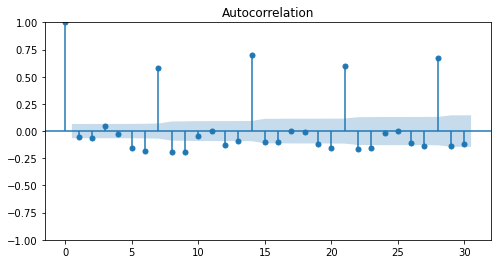

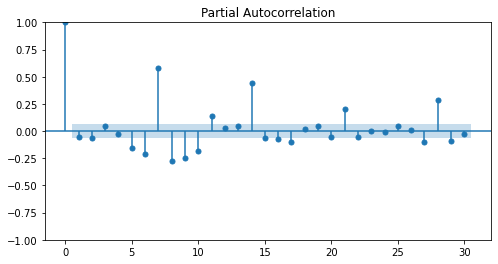

-----ACF and PCF for Customers-------


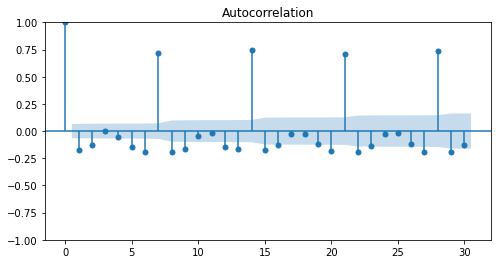

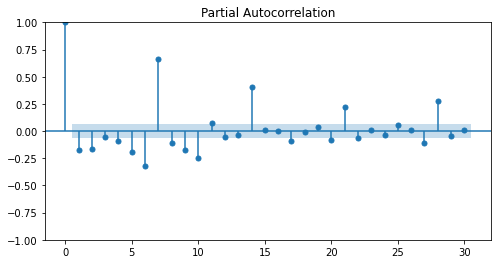

In [716]:
#Plot acf and pacf for store31 sales data
print('-----ACF and PCF for Sales-------')
plot_autocorrelation(store31_train.Sales,30)
print('-----ACF and PCF for Customers-------')
#Plot acf and pacf for customers  data
plot_autocorrelation(store31_train.Customers,30)


There is a weekely spike happening in the acf plot. The same is reflecting in pacf plot as well, so s can be taken as 7.


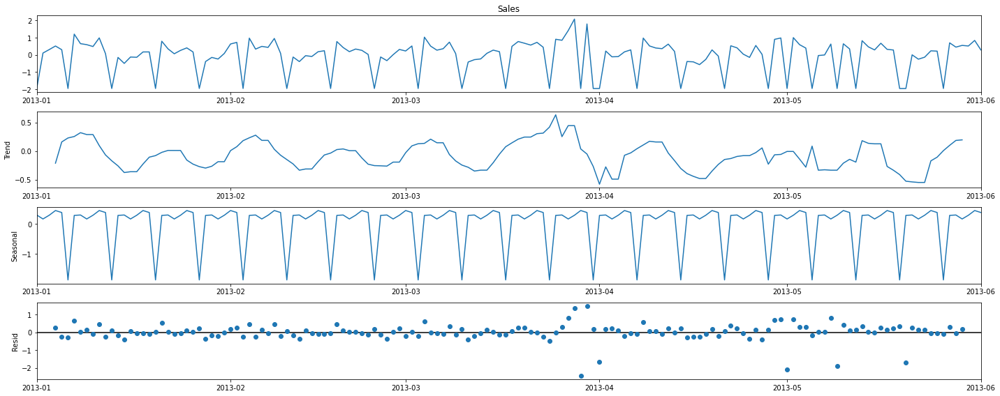

In [717]:
# Let's try to decompose the data to identify if there are any seasonal components

rcParams['figure.figsize'] = 20, 8
decomposition = sm.tsa.seasonal_decompose(store31_train.Sales[:'2013-06-01'], model='additive') # additive seasonal index
fig = decomposition.plot()
plt.show()


Clearly the series is random and the values are fluctuating throughout the year. The peaks come after 7 days.


In [718]:
# Create start and end indexes
store31_start = store31_test.index.min()
store31_end = store31_test.index.max()


#### 9.5 Build SARIMA model


As the acf and pacf plots are showing significant correlations for higher orders we will try few values for p and q and then go with the model with least AIC values.


In [719]:
# Create combinations for lag and ma orderes for both seasonal and non seasonal components
p = q = range(0, 7)
d = range(0, 1)
pdq = list(itertools.product(p, d, q))
p = q = range(0, 2)
d = range(0, 2)
seasonal_pdq = [(x[0], x[1], x[2], 7) for x in list(itertools.product(p, d, q))]

print('Examples of parameter combinations for Seasonal ARIMA...')
print('SARIMAX: {} x {}'.format(pdq[1], seasonal_pdq[1]))
print('SARIMAX: {} x {}'.format(pdq[1], seasonal_pdq[2]))
print('SARIMAX: {} x {}'.format(pdq[2], seasonal_pdq[3]))
print('SARIMAX: {} x {}'.format(pdq[2], seasonal_pdq[4]))

Examples of parameter combinations for Seasonal ARIMA...
SARIMAX: (0, 0, 1) x (0, 0, 1, 7)
SARIMAX: (0, 0, 1) x (0, 1, 0, 7)
SARIMAX: (0, 0, 2) x (0, 1, 1, 7)
SARIMAX: (0, 0, 2) x (1, 0, 0, 7)


In [720]:
for param in pdq:
    for param_seasonal in seasonal_pdq:
        try:
            model = SARIMAX(store31_train.Sales,
                            order=param,
                            seasonal_order=param_seasonal)
    

            results = model.fit()

            print('ARIMA{} x {}  - AIC:{}'.format(param, param_seasonal, results.aic))
        except:
            continue


ARIMA(0, 0, 0) x (0, 0, 0, 7)  - AIC:2556.0893597684108
ARIMA(0, 0, 0) x (0, 0, 1, 7)  - AIC:2387.206022833437
ARIMA(0, 0, 0) x (0, 1, 0, 7)  - AIC:2365.9246084641836
ARIMA(0, 0, 0) x (0, 1, 1, 7)  - AIC:1658.4311341686566
ARIMA(0, 0, 0) x (1, 0, 0, 7)  - AIC:2181.9926068385103
ARIMA(0, 0, 0) x (1, 0, 1, 7)  - AIC:1677.2142485185605
ARIMA(0, 0, 0) x (1, 1, 0, 7)  - AIC:1882.013437954929
ARIMA(0, 0, 0) x (1, 1, 1, 7)  - AIC:1637.0327359760786
ARIMA(0, 0, 1) x (0, 0, 0, 7)  - AIC:2554.6327114282667
ARIMA(0, 0, 1) x (0, 0, 1, 7)  - AIC:2385.2007285672485
ARIMA(0, 0, 1) x (0, 1, 0, 7)  - AIC:2299.657299592799
ARIMA(0, 0, 1) x (0, 1, 1, 7)  - AIC:1610.617274221571
ARIMA(0, 0, 1) x (1, 0, 0, 7)  - AIC:2146.6696289399924
ARIMA(0, 0, 1) x (1, 0, 1, 7)  - AIC:1630.275154847968
ARIMA(0, 0, 1) x (1, 1, 0, 7)  - AIC:1863.0111890847286
ARIMA(0, 0, 1) x (1, 1, 1, 7)  - AIC:1595.8221143935593
ARIMA(0, 0, 2) x (0, 0, 0, 7)  - AIC:2553.3314644913103
ARIMA(0, 0, 2) x (0, 0, 1, 7)  - AIC:2385.66714043660

/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(0, 0, 4) x (0, 1, 0, 7)  - AIC:2154.4586917393144
ARIMA(0, 0, 4) x (0, 1, 1, 7)  - AIC:1540.1861158386073
ARIMA(0, 0, 4) x (1, 0, 0, 7)  - AIC:2070.9281644322036
ARIMA(0, 0, 4) x (1, 0, 1, 7)  - AIC:1560.2099363050015
ARIMA(0, 0, 4) x (1, 1, 0, 7)  - AIC:1802.9125736832461
ARIMA(0, 0, 4) x (1, 1, 1, 7)  - AIC:1532.0189673316358
ARIMA(0, 0, 5) x (0, 0, 0, 7)  - AIC:2434.6442486574306
ARIMA(0, 0, 5) x (0, 0, 1, 7)  - AIC:2322.6985920144407


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(0, 0, 5) x (0, 1, 0, 7)  - AIC:1972.4957399474347
ARIMA(0, 0, 5) x (0, 1, 1, 7)  - AIC:1541.9641967735183


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(0, 0, 5) x (1, 0, 0, 7)  - AIC:2007.8585611519904
ARIMA(0, 0, 5) x (1, 0, 1, 7)  - AIC:1562.0203772504326
ARIMA(0, 0, 5) x (1, 1, 0, 7)  - AIC:1803.2999369934353
ARIMA(0, 0, 5) x (1, 1, 1, 7)  - AIC:1533.806077539901
ARIMA(0, 0, 6) x (0, 0, 0, 7)  - AIC:2402.4224532765415
ARIMA(0, 0, 6) x (0, 0, 1, 7)  - AIC:2270.9612969921363


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(0, 0, 6) x (0, 1, 0, 7)  - AIC:1898.9865214054562
ARIMA(0, 0, 6) x (0, 1, 1, 7)  - AIC:1541.9765979653525
ARIMA(0, 0, 6) x (1, 0, 0, 7)  - AIC:2081.2711153620407
ARIMA(0, 0, 6) x (1, 0, 1, 7)  - AIC:1562.2452619350627
ARIMA(0, 0, 6) x (1, 1, 0, 7)  - AIC:1804.1496398139172
ARIMA(0, 0, 6) x (1, 1, 1, 7)  - AIC:1535.5628573627341
ARIMA(1, 0, 0) x (0, 0, 0, 7)  - AIC:2555.0520626046828
ARIMA(1, 0, 0) x (0, 0, 1, 7)  - AIC:2384.8096780464216
ARIMA(1, 0, 0) x (0, 1, 0, 7)  - AIC:2271.7245240044404
ARIMA(1, 0, 0) x (0, 1, 1, 7)  - AIC:1594.0098549412712
ARIMA(1, 0, 0) x (1, 0, 0, 7)  - AIC:2132.9186461656527
ARIMA(1, 0, 0) x (1, 0, 1, 7)  - AIC:1614.0786289409268
ARIMA(1, 0, 0) x (1, 1, 0, 7)  - AIC:1855.2801825815566
ARIMA(1, 0, 0) x (1, 1, 1, 7)  - AIC:1582.15558972768
ARIMA(1, 0, 1) x (0, 0, 0, 7)  - AIC:2552.799803467216
ARIMA(1, 0, 1) x (0, 0, 1, 7)  - AIC:2384.4405193898547
ARIMA(1, 0, 1) x (0, 1, 0, 7)  - AIC:2247.8874555749226
ARIMA(1, 0, 1) x (0, 1, 1, 7)  - AIC:1570.545765851

/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(1, 0, 3) x (1, 0, 1, 7)  - AIC:1560.1071001609803
ARIMA(1, 0, 3) x (1, 1, 0, 7)  - AIC:1814.013249689091


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(1, 0, 3) x (1, 1, 1, 7)  - AIC:1533.1120264301044
ARIMA(1, 0, 4) x (0, 0, 0, 7)  - AIC:2436.794790013554
ARIMA(1, 0, 4) x (0, 0, 1, 7)  - AIC:2306.857898431656


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(1, 0, 4) x (0, 1, 0, 7)  - AIC:2102.7941320208483
ARIMA(1, 0, 4) x (0, 1, 1, 7)  - AIC:1541.9600720145613
ARIMA(1, 0, 4) x (1, 0, 0, 7)  - AIC:2068.13987012522


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(1, 0, 4) x (1, 0, 1, 7)  - AIC:1562.0027903854707


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(1, 0, 4) x (1, 1, 0, 7)  - AIC:1771.033235921228


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(1, 0, 4) x (1, 1, 1, 7)  - AIC:1533.9984900701597
ARIMA(1, 0, 5) x (0, 0, 0, 7)  - AIC:2436.6230180884754
ARIMA(1, 0, 5) x (0, 0, 1, 7)  - AIC:2307.6056972735014


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(1, 0, 5) x (0, 1, 0, 7)  - AIC:1964.6564283072698
ARIMA(1, 0, 5) x (0, 1, 1, 7)  - AIC:1543.0420462502798


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(1, 0, 5) x (1, 0, 0, 7)  - AIC:1999.0709608635227


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(1, 0, 5) x (1, 0, 1, 7)  - AIC:1563.898578604893
ARIMA(1, 0, 5) x (1, 1, 0, 7)  - AIC:1805.1112114652205
ARIMA(1, 0, 5) x (1, 1, 1, 7)  - AIC:1535.8754389963694
ARIMA(1, 0, 6) x (0, 0, 0, 7)  - AIC:2344.1884466378497
ARIMA(1, 0, 6) x (0, 0, 1, 7)  - AIC:2265.1727905941834


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(1, 0, 6) x (0, 1, 0, 7)  - AIC:1863.319470319921
ARIMA(1, 0, 6) x (0, 1, 1, 7)  - AIC:1543.3001957089352


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(1, 0, 6) x (1, 0, 0, 7)  - AIC:1784.5327481825866


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(1, 0, 6) x (1, 0, 1, 7)  - AIC:1565.8544997379545
ARIMA(1, 0, 6) x (1, 1, 0, 7)  - AIC:1764.5943650077138
ARIMA(1, 0, 6) x (1, 1, 1, 7)  - AIC:1537.2538690069025
ARIMA(2, 0, 0) x (0, 0, 0, 7)  - AIC:2553.220055423881
ARIMA(2, 0, 0) x (0, 0, 1, 7)  - AIC:2384.573759873684
ARIMA(2, 0, 0) x (0, 1, 0, 7)  - AIC:2235.340411034059
ARIMA(2, 0, 0) x (0, 1, 1, 7)  - AIC:1569.2276568317916
ARIMA(2, 0, 0) x (1, 0, 0, 7)  - AIC:2107.5862918204357
ARIMA(2, 0, 0) x (1, 0, 1, 7)  - AIC:1589.5615774563814
ARIMA(2, 0, 0) x (1, 1, 0, 7)  - AIC:1825.989951809654
ARIMA(2, 0, 0) x (1, 1, 1, 7)  - AIC:1560.0646126792162
ARIMA(2, 0, 1) x (0, 0, 0, 7)  - AIC:2509.0504761906077
ARIMA(2, 0, 1) x (0, 0, 1, 7)  - AIC:2376.313148857179
ARIMA(2, 0, 1) x (0, 1, 0, 7)  - AIC:2235.610717261171
ARIMA(2, 0, 1) x (0, 1, 1, 7)  - AIC:1565.9179043299873
ARIMA(2, 0, 1) x (1, 0, 0, 7)  - AIC:2107.182516182868
ARIMA(2, 0, 1) x (1, 0, 1, 7)  - AIC:1586.254562905312
ARIMA(2, 0, 1) x (1, 1, 0, 7)  - AIC:1822.9415391164266


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(2, 0, 2) x (0, 0, 0, 7)  - AIC:2302.6507596196334


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(2, 0, 2) x (0, 0, 1, 7)  - AIC:2299.4237076407035
ARIMA(2, 0, 2) x (0, 1, 0, 7)  - AIC:2015.2901737874818
ARIMA(2, 0, 2) x (0, 1, 1, 7)  - AIC:1517.7531268146397
ARIMA(2, 0, 2) x (1, 0, 0, 7)  - AIC:1966.1091687194494


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(2, 0, 2) x (1, 0, 1, 7)  - AIC:1537.1988107981958


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(2, 0, 2) x (1, 1, 0, 7)  - AIC:1751.454331360022


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(2, 0, 2) x (1, 1, 1, 7)  - AIC:1519.6203307545543
ARIMA(2, 0, 3) x (0, 0, 0, 7)  - AIC:2300.956126507021


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(2, 0, 3) x (0, 0, 1, 7)  - AIC:2261.682855233052
ARIMA(2, 0, 3) x (0, 1, 0, 7)  - AIC:2010.200430036115
ARIMA(2, 0, 3) x (0, 1, 1, 7)  - AIC:1519.7329589724995


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(2, 0, 3) x (1, 0, 0, 7)  - AIC:1930.8736376659824


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(2, 0, 3) x (1, 0, 1, 7)  - AIC:1539.2350753478959
ARIMA(2, 0, 3) x (1, 1, 0, 7)  - AIC:1772.5736073056225


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(2, 0, 3) x (1, 1, 1, 7)  - AIC:1521.532027069916
ARIMA(2, 0, 4) x (0, 0, 0, 7)  - AIC:2424.7478571681904


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(2, 0, 4) x (0, 0, 1, 7)  - AIC:2104.1334664626165
ARIMA(2, 0, 4) x (0, 1, 0, 7)  - AIC:2127.227047944613
ARIMA(2, 0, 4) x (0, 1, 1, 7)  - AIC:1522.718566326164


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(2, 0, 4) x (1, 0, 0, 7)  - AIC:2018.7464040207738


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(2, 0, 4) x (1, 0, 1, 7)  - AIC:1564.3669491167554
ARIMA(2, 0, 4) x (1, 1, 0, 7)  - AIC:1769.648117485722
ARIMA(2, 0, 4) x (1, 1, 1, 7)  - AIC:1535.8938078727879


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(2, 0, 5) x (0, 0, 0, 7)  - AIC:2177.273808165154


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(2, 0, 5) x (0, 0, 1, 7)  - AIC:2107.550137478616


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(2, 0, 5) x (0, 1, 0, 7)  - AIC:1994.9832651841957
ARIMA(2, 0, 5) x (0, 1, 1, 7)  - AIC:1545.1238588190336


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(2, 0, 5) x (1, 0, 0, 7)  - AIC:1947.558944790077


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(2, 0, 5) x (1, 0, 1, 7)  - AIC:1565.293834465121
ARIMA(2, 0, 5) x (1, 1, 0, 7)  - AIC:1771.1681575473174
ARIMA(2, 0, 5) x (1, 1, 1, 7)  - AIC:1537.8191387872307


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(2, 0, 6) x (0, 0, 0, 7)  - AIC:2162.5195899714618


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(2, 0, 6) x (0, 0, 1, 7)  - AIC:2105.4691424819575


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(2, 0, 6) x (0, 1, 0, 7)  - AIC:1803.4740282200455


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(2, 0, 6) x (0, 1, 1, 7)  - AIC:1510.5146121163232


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(2, 0, 6) x (1, 0, 0, 7)  - AIC:1810.851323225117


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(2, 0, 6) x (1, 0, 1, 7)  - AIC:1568.510417146097
ARIMA(2, 0, 6) x (1, 1, 0, 7)  - AIC:1771.6637189742187


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(2, 0, 6) x (1, 1, 1, 7)  - AIC:1533.1949953921958
ARIMA(3, 0, 0) x (0, 0, 0, 7)  - AIC:2553.6302088311413
ARIMA(3, 0, 0) x (0, 0, 1, 7)  - AIC:2378.0435841296735
ARIMA(3, 0, 0) x (0, 1, 0, 7)  - AIC:2230.134917858203
ARIMA(3, 0, 0) x (0, 1, 1, 7)  - AIC:1555.5395310394924
ARIMA(3, 0, 0) x (1, 0, 0, 7)  - AIC:2099.8933095772954
ARIMA(3, 0, 0) x (1, 0, 1, 7)  - AIC:1575.8242665827581
ARIMA(3, 0, 0) x (1, 1, 0, 7)  - AIC:1814.0423503354396
ARIMA(3, 0, 0) x (1, 1, 1, 7)  - AIC:1543.7238026745358
ARIMA(3, 0, 1) x (0, 0, 0, 7)  - AIC:2555.521713664478
ARIMA(3, 0, 1) x (0, 0, 1, 7)  - AIC:2362.446763200126
ARIMA(3, 0, 1) x (0, 1, 0, 7)  - AIC:2213.6121358253295
ARIMA(3, 0, 1) x (0, 1, 1, 7)  - AIC:1550.476160786402
ARIMA(3, 0, 1) x (1, 0, 0, 7)  - AIC:2087.6805826434866
ARIMA(3, 0, 1) x (1, 0, 1, 7)  - AIC:1570.7788779298496
ARIMA(3, 0, 1) x (1, 1, 0, 7)  - AIC:1808.8017084491503
ARIMA(3, 0, 1) x (1, 1, 1, 7)  - AIC:1541.8911136317206


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(3, 0, 2) x (0, 0, 0, 7)  - AIC:2305.1376699365323


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(3, 0, 2) x (0, 0, 1, 7)  - AIC:2208.3348683066624


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(3, 0, 2) x (0, 1, 0, 7)  - AIC:2078.9893663699245
ARIMA(3, 0, 2) x (0, 1, 1, 7)  - AIC:1544.4241765079046
ARIMA(3, 0, 2) x (1, 0, 0, 7)  - AIC:2048.6590398534


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(3, 0, 2) x (1, 0, 1, 7)  - AIC:1564.9193971599016
ARIMA(3, 0, 2) x (1, 1, 0, 7)  - AIC:1802.2955802401254
ARIMA(3, 0, 2) x (1, 1, 1, 7)  - AIC:1527.822912540084


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(3, 0, 3) x (0, 0, 0, 7)  - AIC:2367.2983682148197
ARIMA(3, 0, 3) x (0, 0, 1, 7)  - AIC:2305.969777686318


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(3, 0, 3) x (0, 1, 0, 7)  - AIC:1924.046139847972


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(3, 0, 3) x (0, 1, 1, 7)  - AIC:1517.9931521828187


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(3, 0, 3) x (1, 0, 0, 7)  - AIC:1967.8465409285604


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(3, 0, 3) x (1, 0, 1, 7)  - AIC:1564.1404971982388


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(3, 0, 3) x (1, 1, 0, 7)  - AIC:1731.8005236245413


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(3, 0, 3) x (1, 1, 1, 7)  - AIC:1518.107871643058


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(3, 0, 4) x (0, 0, 0, 7)  - AIC:2314.3124373260384


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(3, 0, 4) x (0, 0, 1, 7)  - AIC:2217.730195629177


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(3, 0, 4) x (0, 1, 0, 7)  - AIC:1933.1392321871579


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(3, 0, 4) x (0, 1, 1, 7)  - AIC:1519.9936616328773
ARIMA(3, 0, 4) x (1, 0, 0, 7)  - AIC:2038.776483317817


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(3, 0, 4) x (1, 0, 1, 7)  - AIC:1566.8487656494524


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(3, 0, 4) x (1, 1, 0, 7)  - AIC:1767.1883629099623


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(3, 0, 4) x (1, 1, 1, 7)  - AIC:1531.8456246217238
ARIMA(3, 0, 5) x (0, 0, 0, 7)  - AIC:2402.8609549106527


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(3, 0, 5) x (0, 0, 1, 7)  - AIC:2093.7758654192685


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(3, 0, 5) x (0, 1, 0, 7)  - AIC:1833.1268232313334


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(3, 0, 5) x (0, 1, 1, 7)  - AIC:1515.3798714242205


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(3, 0, 5) x (1, 0, 0, 7)  - AIC:1938.2842706731917


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(3, 0, 5) x (1, 0, 1, 7)  - AIC:1563.5924079407553


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(3, 0, 5) x (1, 1, 0, 7)  - AIC:1766.4438172922473


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(3, 0, 5) x (1, 1, 1, 7)  - AIC:1532.2534000624025


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(3, 0, 6) x (0, 0, 0, 7)  - AIC:2136.026157249264


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(3, 0, 6) x (0, 0, 1, 7)  - AIC:2068.816904465617


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(3, 0, 6) x (0, 1, 0, 7)  - AIC:1798.1513355417715


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(3, 0, 6) x (0, 1, 1, 7)  - AIC:1514.6328409718035


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(3, 0, 6) x (1, 0, 0, 7)  - AIC:1720.334557470359
ARIMA(3, 0, 6) x (1, 0, 1, 7)  - AIC:1570.3050361765959


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(3, 0, 6) x (1, 1, 0, 7)  - AIC:1699.2412594227826


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(3, 0, 6) x (1, 1, 1, 7)  - AIC:1529.4276565265884
ARIMA(4, 0, 0) x (0, 0, 0, 7)  - AIC:2554.862963053227
ARIMA(4, 0, 0) x (0, 0, 1, 7)  - AIC:2371.676437265983
ARIMA(4, 0, 0) x (0, 1, 0, 7)  - AIC:2142.3586161395106
ARIMA(4, 0, 0) x (0, 1, 1, 7)  - AIC:1540.2991612117085
ARIMA(4, 0, 0) x (1, 0, 0, 7)  - AIC:2043.0464484178972
ARIMA(4, 0, 0) x (1, 0, 1, 7)  - AIC:1560.5292674854995
ARIMA(4, 0, 0) x (1, 1, 0, 7)  - AIC:1797.8067927013142
ARIMA(4, 0, 0) x (1, 1, 1, 7)  - AIC:1537.171425275845
ARIMA(4, 0, 1) x (0, 0, 0, 7)  - AIC:2549.767322496972
ARIMA(4, 0, 1) x (0, 0, 1, 7)  - AIC:2306.933172554258
ARIMA(4, 0, 1) x (0, 1, 0, 7)  - AIC:2002.1890593296487
ARIMA(4, 0, 1) x (0, 1, 1, 7)  - AIC:1526.092192945759
ARIMA(4, 0, 1) x (1, 0, 0, 7)  - AIC:1915.15086028161
ARIMA(4, 0, 1) x (1, 0, 1, 7)  - AIC:1545.5947188955624
ARIMA(4, 0, 1) x (1, 1, 0, 7)  - AIC:1761.0166459133497
ARIMA(4, 0, 1) x (1, 1, 1, 7)  - AIC:1527.917741274574


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(4, 0, 2) x (0, 0, 0, 7)  - AIC:2511.380951881014
ARIMA(4, 0, 2) x (0, 0, 1, 7)  - AIC:2275.4031978915627
ARIMA(4, 0, 2) x (0, 1, 0, 7)  - AIC:2004.0973980827946


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(4, 0, 2) x (0, 1, 1, 7)  - AIC:1521.7345491223232
ARIMA(4, 0, 2) x (1, 0, 0, 7)  - AIC:1914.4016342360837


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(4, 0, 2) x (1, 0, 1, 7)  - AIC:1542.123541245006
ARIMA(4, 0, 2) x (1, 1, 0, 7)  - AIC:1764.7594867511464


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(4, 0, 2) x (1, 1, 1, 7)  - AIC:1545.7360208683833


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(4, 0, 3) x (0, 0, 0, 7)  - AIC:2344.4972586950958


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(4, 0, 3) x (0, 0, 1, 7)  - AIC:2290.7829464006527
ARIMA(4, 0, 3) x (0, 1, 0, 7)  - AIC:1994.874577851977


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(4, 0, 3) x (0, 1, 1, 7)  - AIC:1519.8303205276234


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(4, 0, 3) x (1, 0, 0, 7)  - AIC:1912.7469203931007


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(4, 0, 3) x (1, 0, 1, 7)  - AIC:1542.1841705150991


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(4, 0, 3) x (1, 1, 0, 7)  - AIC:1762.6566855658818


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(4, 0, 3) x (1, 1, 1, 7)  - AIC:1531.5768662929572


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(4, 0, 4) x (0, 0, 0, 7)  - AIC:2308.10320818972


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(4, 0, 4) x (0, 0, 1, 7)  - AIC:2202.7486846170086
ARIMA(4, 0, 4) x (0, 1, 0, 7)  - AIC:1952.0829013762368


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(4, 0, 4) x (0, 1, 1, 7)  - AIC:1510.2613899337093


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(4, 0, 4) x (1, 0, 0, 7)  - AIC:1955.3545204323634


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(4, 0, 4) x (1, 0, 1, 7)  - AIC:1569.3788242474072


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(4, 0, 4) x (1, 1, 0, 7)  - AIC:1757.1608863362796


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(4, 0, 4) x (1, 1, 1, 7)  - AIC:1505.1123569874355


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(4, 0, 5) x (0, 0, 0, 7)  - AIC:2359.063655531275


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(4, 0, 5) x (0, 0, 1, 7)  - AIC:2219.653467791385


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(4, 0, 5) x (0, 1, 0, 7)  - AIC:1781.414752233292


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(4, 0, 5) x (0, 1, 1, 7)  - AIC:1512.2710911042923


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(4, 0, 5) x (1, 0, 0, 7)  - AIC:1902.0473218887937


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(4, 0, 5) x (1, 0, 1, 7)  - AIC:1541.9229314766687


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(4, 0, 5) x (1, 1, 0, 7)  - AIC:1677.8694101472843


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(4, 0, 5) x (1, 1, 1, 7)  - AIC:1507.6628615398786


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(4, 0, 6) x (0, 0, 0, 7)  - AIC:2136.270119825845


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(4, 0, 6) x (0, 0, 1, 7)  - AIC:2082.4788876376365


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(4, 0, 6) x (0, 1, 0, 7)  - AIC:1910.947033641583


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(4, 0, 6) x (0, 1, 1, 7)  - AIC:1508.2142254099726


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(4, 0, 6) x (1, 0, 0, 7)  - AIC:1728.2761072814515


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(4, 0, 6) x (1, 0, 1, 7)  - AIC:1541.2510414483336


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(4, 0, 6) x (1, 1, 0, 7)  - AIC:1678.694506894673


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(4, 0, 6) x (1, 1, 1, 7)  - AIC:1503.942605042008
ARIMA(5, 0, 0) x (0, 0, 0, 7)  - AIC:2534.4660352606365
ARIMA(5, 0, 0) x (0, 0, 1, 7)  - AIC:2344.530278261491
ARIMA(5, 0, 0) x (0, 1, 0, 7)  - AIC:2120.26429158309
ARIMA(5, 0, 0) x (0, 1, 1, 7)  - AIC:1533.106029921383
ARIMA(5, 0, 0) x (1, 0, 0, 7)  - AIC:2019.089077348317
ARIMA(5, 0, 0) x (1, 0, 1, 7)  - AIC:1552.9516022682142
ARIMA(5, 0, 0) x (1, 1, 0, 7)  - AIC:1793.0597559919775
ARIMA(5, 0, 0) x (1, 1, 1, 7)  - AIC:1532.0181527249451
ARIMA(5, 0, 1) x (0, 0, 0, 7)  - AIC:2530.959354183692
ARIMA(5, 0, 1) x (0, 0, 1, 7)  - AIC:2296.558425485847
ARIMA(5, 0, 1) x (0, 1, 0, 7)  - AIC:2004.1512492599613
ARIMA(5, 0, 1) x (0, 1, 1, 7)  - AIC:1527.1983853874071
ARIMA(5, 0, 1) x (1, 0, 0, 7)  - AIC:1916.5322592885645


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(5, 0, 1) x (1, 0, 1, 7)  - AIC:1546.6439125477405
ARIMA(5, 0, 1) x (1, 1, 0, 7)  - AIC:1762.2258632902442
ARIMA(5, 0, 1) x (1, 1, 1, 7)  - AIC:1529.0461844831152


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(5, 0, 2) x (0, 0, 0, 7)  - AIC:2231.816724990318


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(5, 0, 2) x (0, 0, 1, 7)  - AIC:2158.7755463347985
ARIMA(5, 0, 2) x (0, 1, 0, 7)  - AIC:1989.0301587044298
ARIMA(5, 0, 2) x (0, 1, 1, 7)  - AIC:1529.409608828554
ARIMA(5, 0, 2) x (1, 0, 0, 7)  - AIC:1907.5427347834661


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(5, 0, 2) x (1, 0, 1, 7)  - AIC:1549.7260829597053
ARIMA(5, 0, 2) x (1, 1, 0, 7)  - AIC:1764.9661429132248
ARIMA(5, 0, 2) x (1, 1, 1, 7)  - AIC:1531.3346180869057


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(5, 0, 3) x (0, 0, 0, 7)  - AIC:2222.3185102065963


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(5, 0, 3) x (0, 0, 1, 7)  - AIC:2115.8477738363163


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(5, 0, 3) x (0, 1, 0, 7)  - AIC:1845.6490129191598


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(5, 0, 3) x (0, 1, 1, 7)  - AIC:1525.555369010661
ARIMA(5, 0, 3) x (1, 0, 0, 7)  - AIC:1849.9562672247084


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(5, 0, 3) x (1, 0, 1, 7)  - AIC:1545.4346115919207


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(5, 0, 3) x (1, 1, 0, 7)  - AIC:1687.573966658241


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(5, 0, 3) x (1, 1, 1, 7)  - AIC:1527.383932975582


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(5, 0, 4) x (0, 0, 0, 7)  - AIC:2351.397950927352


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(5, 0, 4) x (0, 0, 1, 7)  - AIC:2211.0997996770975


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(5, 0, 4) x (0, 1, 0, 7)  - AIC:1813.714342019991


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(5, 0, 4) x (0, 1, 1, 7)  - AIC:1512.0052479636083


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(5, 0, 4) x (1, 0, 0, 7)  - AIC:1841.0486943217797


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(5, 0, 4) x (1, 0, 1, 7)  - AIC:1543.8908286273675


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(5, 0, 4) x (1, 1, 0, 7)  - AIC:1682.9118132934925


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(5, 0, 4) x (1, 1, 1, 7)  - AIC:1506.1329710456962


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(5, 0, 5) x (0, 0, 0, 7)  - AIC:2107.219475581496


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(5, 0, 5) x (0, 0, 1, 7)  - AIC:2089.122000109607


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(5, 0, 5) x (0, 1, 0, 7)  - AIC:1746.7973569237438


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(5, 0, 5) x (0, 1, 1, 7)  - AIC:1514.086092619253


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(5, 0, 5) x (1, 0, 0, 7)  - AIC:1842.0258307611755


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(5, 0, 5) x (1, 0, 1, 7)  - AIC:1550.4061530488166


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(5, 0, 5) x (1, 1, 0, 7)  - AIC:1645.1005499278233


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(5, 0, 5) x (1, 1, 1, 7)  - AIC:1506.4850561432504


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(5, 0, 6) x (0, 0, 0, 7)  - AIC:2112.4392092421394


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(5, 0, 6) x (0, 0, 1, 7)  - AIC:2082.791034487491


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(5, 0, 6) x (0, 1, 0, 7)  - AIC:1854.087833107122


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(5, 0, 6) x (0, 1, 1, 7)  - AIC:1510.0306834702815


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(5, 0, 6) x (1, 0, 0, 7)  - AIC:1722.8217938203627


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(5, 0, 6) x (1, 0, 1, 7)  - AIC:1582.8354819610204


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(5, 0, 6) x (1, 1, 0, 7)  - AIC:1671.1006169581733


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(5, 0, 6) x (1, 1, 1, 7)  - AIC:1505.7809602153914
ARIMA(6, 0, 0) x (0, 0, 0, 7)  - AIC:2494.117767057526
ARIMA(6, 0, 0) x (0, 0, 1, 7)  - AIC:2301.6237172000237
ARIMA(6, 0, 0) x (0, 1, 0, 7)  - AIC:2104.068895674461
ARIMA(6, 0, 0) x (0, 1, 1, 7)  - AIC:1531.1358328634003
ARIMA(6, 0, 0) x (1, 0, 0, 7)  - AIC:1996.628179358822
ARIMA(6, 0, 0) x (1, 0, 1, 7)  - AIC:1550.7366367471523
ARIMA(6, 0, 0) x (1, 1, 0, 7)  - AIC:1791.7195953030987
ARIMA(6, 0, 0) x (1, 1, 1, 7)  - AIC:1531.3652618234564
ARIMA(6, 0, 1) x (0, 0, 0, 7)  - AIC:2290.364426823484
ARIMA(6, 0, 1) x (0, 0, 1, 7)  - AIC:2239.601797069118
ARIMA(6, 0, 1) x (0, 1, 0, 7)  - AIC:1994.4694597524333
ARIMA(6, 0, 1) x (0, 1, 1, 7)  - AIC:1528.3681928349404
ARIMA(6, 0, 1) x (1, 0, 0, 7)  - AIC:1907.2629701734213


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(6, 0, 1) x (1, 0, 1, 7)  - AIC:1556.3379287885032
ARIMA(6, 0, 1) x (1, 1, 0, 7)  - AIC:1764.1408626987304
ARIMA(6, 0, 1) x (1, 1, 1, 7)  - AIC:1530.363096443758
ARIMA(6, 0, 2) x (0, 0, 0, 7)  - AIC:2194.6053633235674
ARIMA(6, 0, 2) x (0, 0, 1, 7)  - AIC:2191.569779799453
ARIMA(6, 0, 2) x (0, 1, 0, 7)  - AIC:1982.5993123940693


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(6, 0, 2) x (0, 1, 1, 7)  - AIC:1520.2306415594455
ARIMA(6, 0, 2) x (1, 0, 0, 7)  - AIC:1908.0828731782021


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(6, 0, 2) x (1, 0, 1, 7)  - AIC:1550.5185502265354
ARIMA(6, 0, 2) x (1, 1, 0, 7)  - AIC:1764.5661251522974
ARIMA(6, 0, 2) x (1, 1, 1, 7)  - AIC:1533.0453411033527


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(6, 0, 3) x (0, 0, 0, 7)  - AIC:1985.2085101970724


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(6, 0, 3) x (0, 0, 1, 7)  - AIC:2105.432697945893


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(6, 0, 3) x (0, 1, 0, 7)  - AIC:1849.3690807453509


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(6, 0, 3) x (0, 1, 1, 7)  - AIC:1531.4199475675136


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(6, 0, 3) x (1, 0, 0, 7)  - AIC:1863.381294310774


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(6, 0, 3) x (1, 0, 1, 7)  - AIC:1547.5464608380494


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(6, 0, 3) x (1, 1, 0, 7)  - AIC:1680.496005446593


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(6, 0, 3) x (1, 1, 1, 7)  - AIC:1531.8006937283365


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(6, 0, 4) x (0, 0, 0, 7)  - AIC:1980.0409029658904


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(6, 0, 4) x (0, 0, 1, 7)  - AIC:1982.5981834693778


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(6, 0, 4) x (0, 1, 0, 7)  - AIC:1829.5284551471966


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(6, 0, 4) x (0, 1, 1, 7)  - AIC:1509.3320656081828


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(6, 0, 4) x (1, 0, 0, 7)  - AIC:1980.3356743811014


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(6, 0, 4) x (1, 0, 1, 7)  - AIC:1636.0493352463816


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(6, 0, 4) x (1, 1, 0, 7)  - AIC:1685.1681888827936


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(6, 0, 4) x (1, 1, 1, 7)  - AIC:1504.1360292765507


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(6, 0, 5) x (0, 0, 0, 7)  - AIC:1898.9741541534363


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(6, 0, 5) x (0, 0, 1, 7)  - AIC:1895.4438522816681


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(6, 0, 5) x (0, 1, 0, 7)  - AIC:1830.3093758077675


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(6, 0, 5) x (0, 1, 1, 7)  - AIC:1511.0021360445749


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(6, 0, 5) x (1, 0, 0, 7)  - AIC:1942.0949291041438


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(6, 0, 5) x (1, 0, 1, 7)  - AIC:1543.0404604925957


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(6, 0, 5) x (1, 1, 0, 7)  - AIC:1662.7966401961694


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(6, 0, 5) x (1, 1, 1, 7)  - AIC:1506.179540873646


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(6, 0, 6) x (0, 0, 0, 7)  - AIC:1734.1451211999079


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(6, 0, 6) x (0, 0, 1, 7)  - AIC:1922.5292976849553


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(6, 0, 6) x (0, 1, 0, 7)  - AIC:1769.1249470811463


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(6, 0, 6) x (0, 1, 1, 7)  - AIC:1507.1405970689998


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(6, 0, 6) x (1, 0, 0, 7)  - AIC:1915.2497343056266


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(6, 0, 6) x (1, 0, 1, 7)  - AIC:1541.307952902383


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(6, 0, 6) x (1, 1, 0, 7)  - AIC:1667.7041813880344


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA(6, 0, 6) x (1, 1, 1, 7)  - AIC:1507.4348285115193


 We will select ARIMA(2, 0, 2) x (0, 1, 1, 7) that gave the best aic and convergence

In [722]:
store31_SARIMA = SARIMAX(store31_train.Sales,
                                order=(2, 0, 2),
                                seasonal_order=(0, 1, 1, 7))
            

store31_SARIMA = store31_SARIMA.fit()
store31_SARIMA.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                      SARIMAX Results                                      
===========================================================================================
Dep. Variable:                               Sales   No. Observations:                  900
Model:             SARIMAX(2, 0, 2)x(0, 1, [1], 7)   Log Likelihood                -752.877
Date:                             Tue, 06 Sep 2022   AIC                           1517.753
Time:                                     17:13:09   BIC                           1546.521
Sample:                                 01-01-2013   HQIC                          1528.747
                                      - 06-19-2015                                         
Covariance Type:                               opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          1.6948      0.028     61.360      0.000       1.641       1.749
ar.L2         -0.8959      0.024    -37.589      0.000      -0.943      -0.849
ma.L1         -1.5293      0.034    -45.094      0.000      -1.596      -1.463
ma.L2          0.7903      0.029     27.606      0.000       0.734       0.846
ma.S.L7       -0.9812      0.011    -87.790      0.000      -1.003      -0.959
sigma2         0.3076      0.007     42.596      0.000       0.293       0.322
===================================================================================
Ljung-Box (L1) (Q):                   0.08   Jarque-Bera (JB):              3218.60
Prob(Q):                              0.78   Prob(JB):                         0.00
Heteroskedasticity (H):               1.64   Skew:                            -1.65
Prob(H) (two-sided):                  0.00   Kurtosis:                        11.70
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

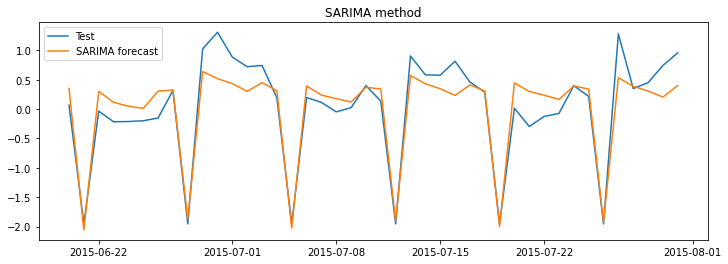

,Model,RMSE,MAPE,AIC
0,SARIMA,0.33,1.88,1517.753127


In [723]:
#Now let's calculate RMSE and MAPE score
# Create a results dataframe
Results_store31 = pd.DataFrame(columns=['Model', 'RMSE' ,'MAPE','AIC'])

calculate_metrics(store31_test.Sales,store31_SARIMA.predict(store31_start,store31_end),Results_store31,'SARIMA',store31_SARIMA.aic)


Weekely peaks are not explained by this model

#### 9.6 Build SARIMAX model with exogenous variable


In [725]:


print(list(store31_train.columns))


['Sales', 'Customers', 'Open', 'Promo', 'StateHoliday', 'SchoolHoliday', 1, 2, 3, 4, 5, 6, 7]


In [726]:

store31_SARIMAX = SARIMAX(store31_train.Sales,
                                order=(2, 0, 2),
                                seasonal_order=(0, 1, 1, 7),
                         exog=store31_train[['Open', 'Promo', 'StateHoliday', 'SchoolHoliday', 1, 2, 3, 4, 5, 6, 7]])
            

store31_SARIMAX = store31_SARIMAX.fit()
store31_SARIMAX.summary()


<class 'statsmodels.iolib.summary.Summary'>
"""
                                      SARIMAX Results                                      
===========================================================================================
Dep. Variable:                               Sales   No. Observations:                  900
Model:             SARIMAX(2, 0, 2)x(0, 1, [1], 7)   Log Likelihood                -206.728
Date:                             Tue, 06 Sep 2022   AIC                            447.457
Time:                                     17:15:59   BIC                            528.965
Sample:                                 01-01-2013   HQIC                           478.605
                                      - 06-19-2015                                         
Covariance Type:                               opg                                         
=================================================================================
                    coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------
Open              1.2719      0.021     60.865      0.000       1.231       1.313
Promo             0.6592      0.030     21.721      0.000       0.600       0.719
StateHoliday     -1.2742      0.021    -60.979      0.000      -1.315      -1.233
SchoolHoliday     0.1361      0.033      4.103      0.000       0.071       0.201
1             -1.177e-07   3.41e-09    -34.466      0.000   -1.24e-07   -1.11e-07
2              -3.55e-07   1.88e-09   -189.098      0.000   -3.59e-07   -3.51e-07
3              1.698e-08   1.12e-09     15.159      0.000    1.48e-08    1.92e-08
4             -6.868e-08   2.24e-10   -306.259      0.000   -6.91e-08   -6.82e-08
5             -3.887e-08   1.26e-09    -30.813      0.000   -4.13e-08   -3.64e-08
6              1.412e-07   2.65e-09     53.235      0.000    1.36e-07    1.46e-07
7              1.966e-07   2.37e-09     82.769      0.000    1.92e-07    2.01e-07
ar.L1             0.6293      0.227      2.774      0.006       0.185       1.074
ar.L2             0.1873      0.206      0.908      0.364      -0.217       0.592
ma.L1            -0.3685      0.225     -1.639      0.101      -0.809       0.072
ma.L2             0.0091      0.145      0.063      0.950      -0.275       0.293
ma.S.L7          -0.9923      0.020    -50.825      0.000      -1.031      -0.954
sigma2            0.0901      0.003     29.382      0.000       0.084       0.096
===================================================================================
Ljung-Box (L1) (Q):                   0.00   Jarque-Bera (JB):               324.41
Prob(Q):                              0.99   Prob(JB):                         0.00
Heteroskedasticity (H):               1.63   Skew:                             0.46
Prob(H) (two-sided):                  0.00   Kurtosis:                         5.80
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
[2] Covariance matrix is singular or near-singular, with condition number 5.8e+32. Standard errors may be unstable.
"""

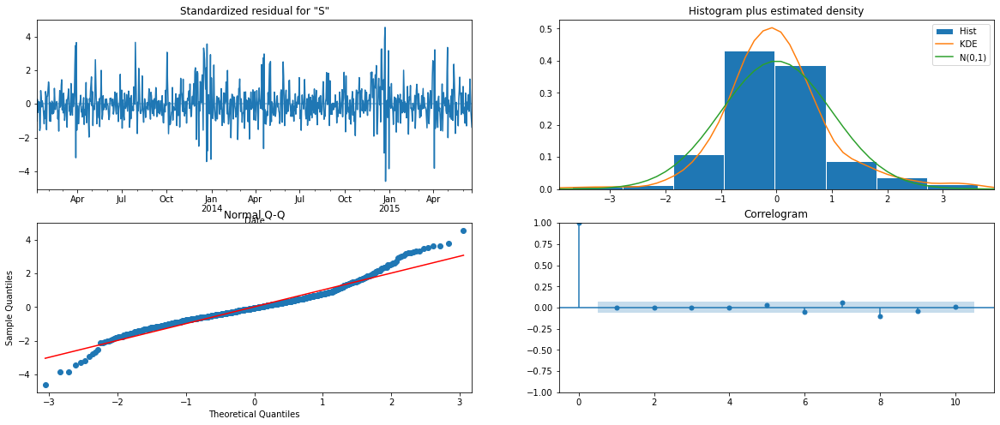

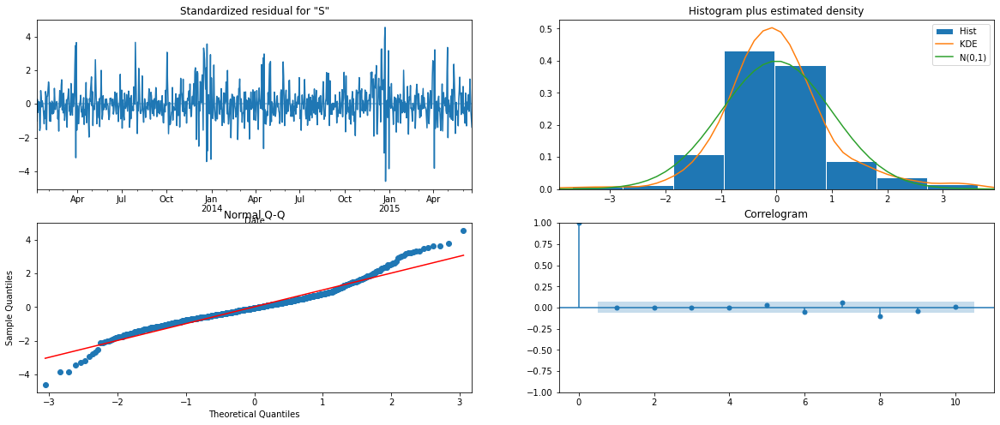

In [727]:
# Aic has improved
# Plot diagnostics
store31_SARIMAX.plot_diagnostics()


Residuals are normaly distributed.


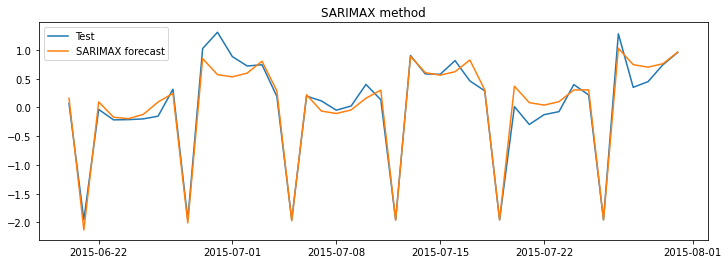

,Model,RMSE,MAPE,AIC
0,SARIMA,0.33,1.88,1517.753127
1,SARIMAX,0.21,1.20,447.456900


In [728]:
# Calculate rmse and mape
calculate_metrics(store31_test.Sales,store31_SARIMAX.predict(store31_start,store31_end,
                exog=store31_test[['Open', 'Promo', 'StateHoliday', 'SchoolHoliday', 1, 2, 3, 4, 5, 6, 7]]),
                  Results_store31,'SARIMAX',store31_SARIMAX.aic)


#### 9.7 Build VARMAX model with exogenous variable


In [729]:
#From the previously run adf test we know that both Sales and Customers time serieses are stationary and they move together. So let's build a VARMAX model this time
store31_VARMAX = sm.tsa.VARMAX(store31_train[['Sales', 'Customers']], order=(2,2),trend='n',
                              exog=store31_train[['Open', 'Promo', 'StateHoliday', 'SchoolHoliday', 1, 2, 3, 4, 5, 6, 7]])
store31_VARMAX = store31_VARMAX.fit(maxiter=1000, disp=False)
print(store31_VARMAX.summary())



/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/statespace/varmax.py:163: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  EstimationWarning)
/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


                             Statespace Model Results                             
Dep. Variable:     ['Sales', 'Customers']   No. Observations:                  900
Model:                        VARMAX(2,2)   Log Likelihood                 574.295
Date:                    Tue, 06 Sep 2022   AIC                          -1066.590
Time:                            17:19:11   BIC                           -869.692
Sample:                        01-01-2013   HQIC                          -991.374
                             - 06-19-2015                                         
Covariance Type:                      opg                                         
Ljung-Box (L1) (Q):             0.58, 0.08   Jarque-Bera (JB):      865.87, 1089.75
Prob(Q):                        0.45, 0.78   Prob(JB):                   0.00, 0.00
Heteroskedasticity (H):         1.57, 0.74   Skew:                      0.78, -0.34
Prob(H) (two-sided):            0.00, 0.01   Kurtosis:                   7.55, 8.35


In [730]:
#Remove weekday 6 and run 
store31_VARMAX1 = sm.tsa.VARMAX(store31_train[['Sales', 'Customers']], order=(2,2),trend='n',
                              exog=store31_train[['Open', 'Promo', 'StateHoliday', 'SchoolHoliday', 1, 2, 3, 4, 5, 7]])
store31_VARMAX1 = store31_VARMAX1.fit(maxiter=1000, disp=False)
print(store31_VARMAX1.summary())


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/statespace/varmax.py:163: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  EstimationWarning)
/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


                             Statespace Model Results                             
Dep. Variable:     ['Sales', 'Customers']   No. Observations:                  900
Model:                        VARMAX(2,2)   Log Likelihood                 574.302
Date:                    Tue, 06 Sep 2022   AIC                          -1070.604
Time:                            17:21:45   BIC                           -883.311
Sample:                        01-01-2013   HQIC                          -999.057
                             - 06-19-2015                                         
Covariance Type:                      opg                                         
Ljung-Box (L1) (Q):             0.52, 0.08   Jarque-Bera (JB):      869.35, 1093.93
Prob(Q):                        0.47, 0.78   Prob(JB):                   0.00, 0.00
Heteroskedasticity (H):         1.57, 0.74   Skew:                      0.78, -0.34
Prob(H) (two-sided):            0.00, 0.01   Kurtosis:                   7.56, 8.36


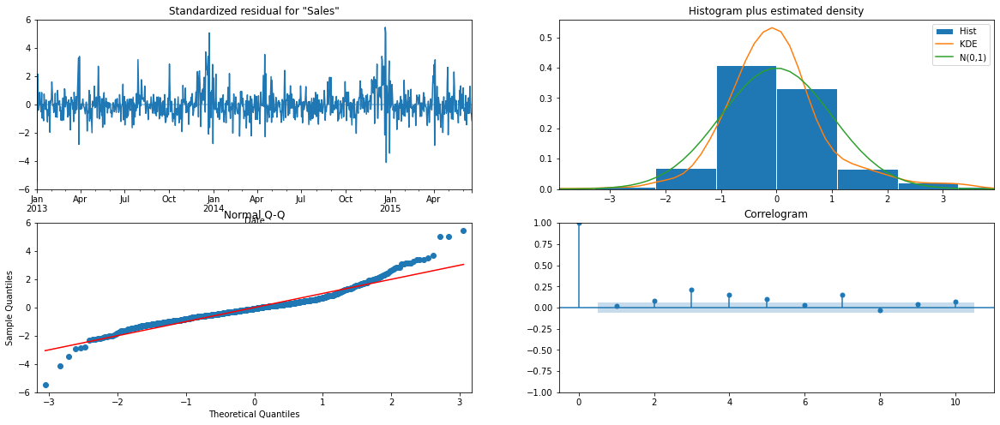

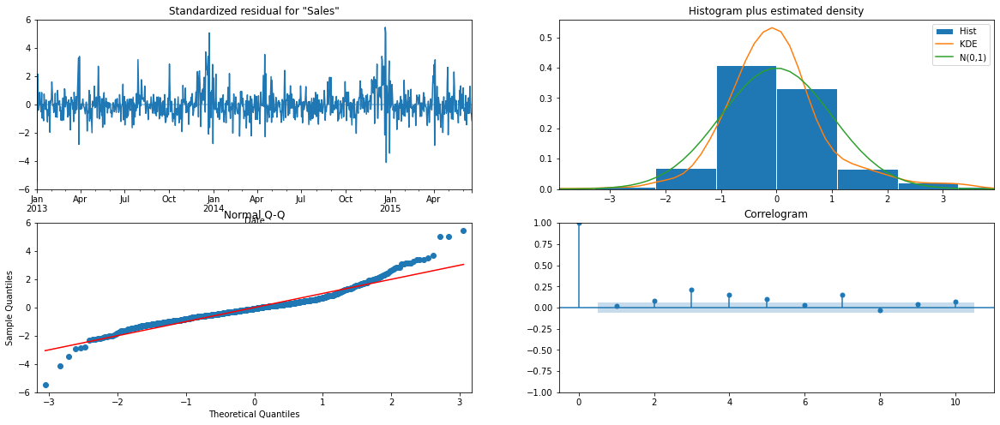

In [731]:
#AIC has improved
store31_VARMAX1.plot_diagnostics()


Residuals has normal distribution

/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/statespace/varmax.py:163: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  EstimationWarning)
/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/statespace/varmax.py:163: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  EstimationWarning)


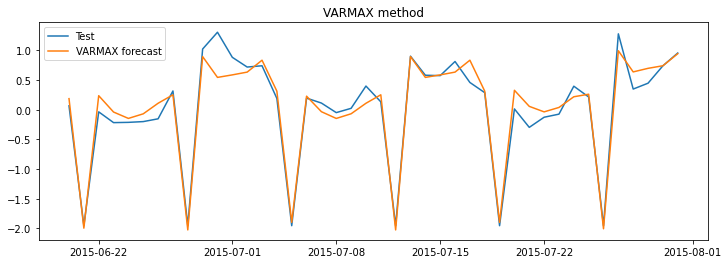

,Model,RMSE,MAPE,AIC
0,SARIMA,0.33,1.88,1517.753127
1,SARIMAX,0.21,1.20,447.456900
2,VARMAX,0.21,1.26,-1066.590211


In [732]:
# Calculate rmse and mapre for varmax model
calculate_metrics(store31_test.Sales,store31_VARMAX.predict(store31_start,store31_end,
                exog=store31_test[['Open', 'Promo', 'StateHoliday', 'SchoolHoliday', 1, 2, 3, 4, 5,6, 7]])['Sales'],
                  Results_store31,'VARMAX',store31_VARMAX.aic)

/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/statespace/varmax.py:163: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  EstimationWarning)
/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/statespace/varmax.py:163: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  EstimationWarning)


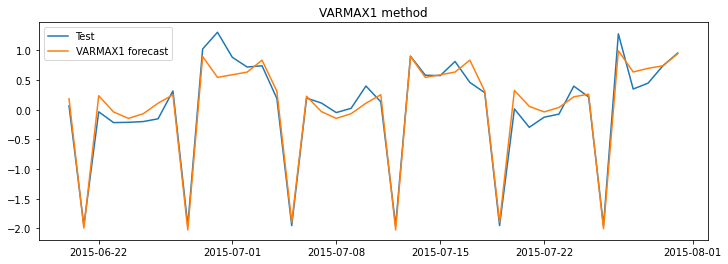

,Model,RMSE,MAPE,AIC
0,SARIMA,0.33,1.88,1517.753127
1,SARIMAX,0.21,1.20,447.456900
2,VARMAX,0.21,1.26,-1066.590211
3,VARMAX1,0.21,1.25,-1070.603942


In [733]:

# Calculate rmse and mapre for varmax1 model
calculate_metrics(store31_test.Sales,store31_VARMAX1.predict(store31_start,store31_end,
                exog=store31_test[['Open', 'Promo', 'StateHoliday', 'SchoolHoliday', 1, 2, 3, 4, 5, 7]])['Sales'],
                  Results_store31,'VARMAX1',store31_VARMAX1.aic)

VARMAX1 gives the best result for store 31

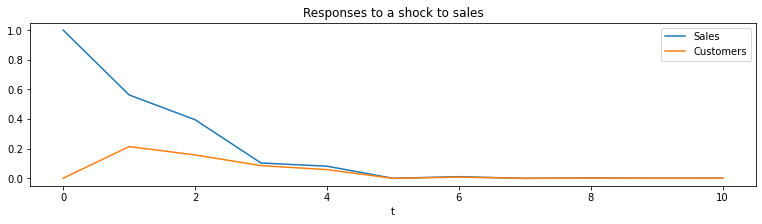

In [734]:
##### Check impluse response function


ax = store31_VARMAX1.impulse_responses(10, orthogonalized=False).plot(figsize=(13,3))
ax.set(xlabel='t', title='Responses to a shock to sales');



As per the model, after 5 lags the values of both sales and customers stabilises.


## 10. Build model for store46

##### 10.1 Analyse data 


In [735]:

store_46.head(1)


,DayOfWeek,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,Promo2,PromoInterval,CompetitionSince,SaleYear,SaleMonth
Date,,,,,,,,,,,,
2013-01-01,2,0,0,0,0,a,1,1,"Jan,Apr,Jul,Oct",2005-09-01,2013,1


- store 46 has promotion running in Jan, Apr, Jul and Oct. We will recreate a Promo2 column with a value of 1 in Jan, Apr, Jul and Oct months and rest all values as zero.
- Competition columns can be deleted as its already present from the beginning


In [737]:
store_46.Promo2 = store_46.SaleMonth.apply(lambda x: 1 if x in ([1,4,7,10]) else 0)
store_46.Promo2.value_counts()



0    482
1    276
Name: Promo2, dtype: int64

In [738]:
# set frequency for the dataset
store_46.index.freq = store_46.index.inferred_freq
store_46.index

DatetimeIndex(['2013-01-01', '2013-01-02', '2013-01-03', '2013-01-04',
               '2013-01-05', '2013-01-06', '2013-01-07', '2013-01-08',
               '2013-01-09', '2013-01-10',
               ...
               '2015-07-22', '2015-07-23', '2015-07-24', '2015-07-25',
               '2015-07-26', '2015-07-27', '2015-07-28', '2015-07-29',
               '2015-07-30', '2015-07-31'],
              dtype='datetime64[ns]', name='Date', length=758, freq=None)

In [739]:
#Data frequency is not set. We have missing data here

print(pd.date_range('2013-01-01', '2015-07-31').difference(store_46.index))


DatetimeIndex(['2014-07-01', '2014-07-02', '2014-07-03', '2014-07-04',
               '2014-07-05', '2014-07-06', '2014-07-07', '2014-07-08',
               '2014-07-09', '2014-07-10',
               ...
               '2014-12-22', '2014-12-23', '2014-12-24', '2014-12-25',
               '2014-12-26', '2014-12-27', '2014-12-28', '2014-12-29',
               '2014-12-30', '2014-12-31'],
              dtype='datetime64[ns]', length=184, freq=None)


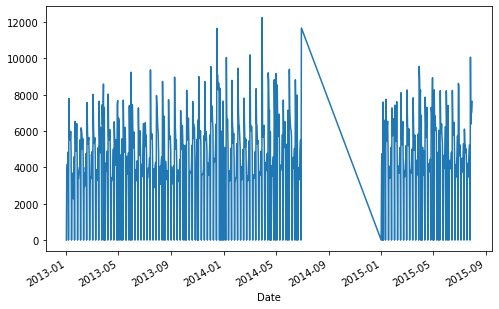

In [741]:
#We have 6 months of missing data
plt.figure(figsize=(8,5))
store_46.Sales.plot()
plt.show()


Let's use data from '2013-01-01' to '2014-06-30' for training and the last 42 days data(from '2015-07-31')  for testing.

In [742]:
#Sales is zero whenever there is a state holiday. So it is better make the variables having only 2 levels,
#1 for  state holiday and 0 for non-holiday.
store_46.StateHoliday= store_46.StateHoliday.apply(lambda x : 0 if x=='0' else 1)

store_46.StateHoliday.value_counts()


0    729
1     29
Name: StateHoliday, dtype: int64

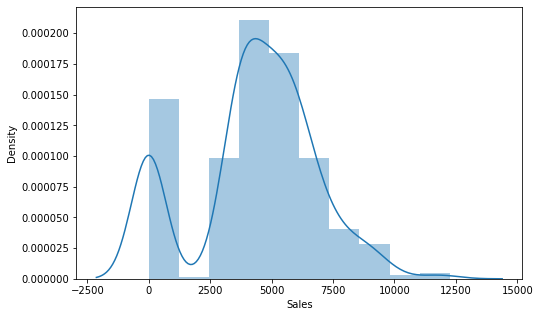

In [743]:
# Check the distribution of sales
plt.figure(figsize=(8,5))
sns.distplot(store_46.Sales['2013-01-01':'2014-07-01'],bins=10)
plt.show()


Looks like Sales has a right skewed distribution. Also lot of data points are having zero as sales value and that is a valid value as sales will be zero for holidays. Now let's check for outliers


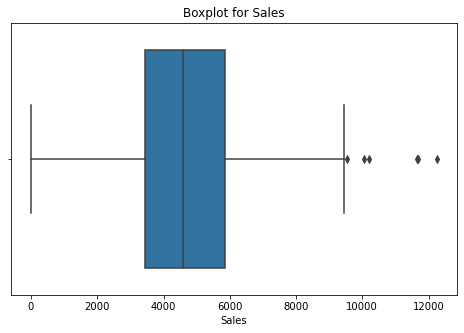

Quartile values for Sales
0.750     5869.750
0.800     6202.000
0.900     7169.000
0.990     9508.750
0.995    10595.675
0.999    11935.535
1.000    12250.000
Name: Sales, dtype: float64


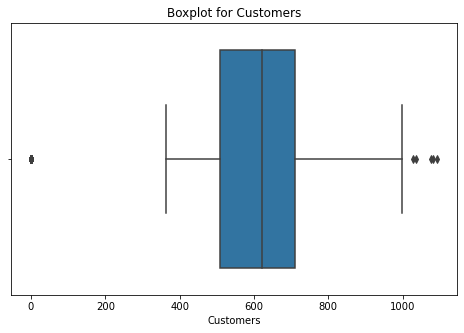

Quartile values for Customers
0.750     710.750
0.800     727.000
0.900     812.000
0.990     997.100
0.995    1046.275
0.999    1086.550
1.000    1092.000
Name: Customers, dtype: float64


In [744]:
###### Check for outliers
check_outliers(store_46[['Sales','Customers']]['2013-01-01':'2014-07-01'])


In [745]:
#For Values > 0.99th percentile value, we can do capping method to set them as 99th percentile value.
sales_cap = store_46.Sales['2013-01-01':'2014-07-01'].quantile(.99)
Customers_cap = store_46.Customers['2013-01-01':'2014-07-01'].quantile(.99)


store_46.loc[store_46.Sales > sales_cap,'Sales'] =  sales_cap
store_46.loc[store_46.Customers > Customers_cap,'Customers'] =  Customers_cap


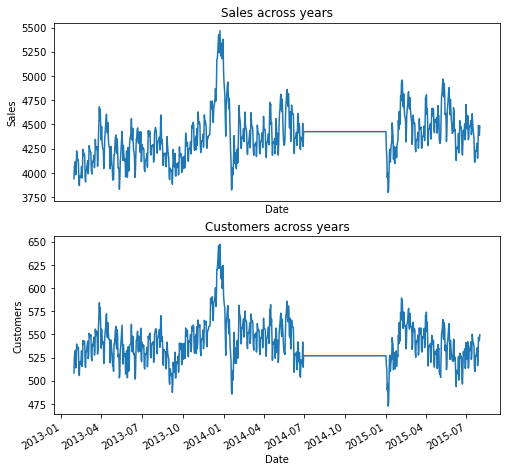

In [746]:
# Plot sales data using a rolling window
plt.figure(figsize=(8,8))
plt.subplot(2,1,1)
plt.title('Sales across years')
store_46.Sales.rolling(30).mean().plot()
plt.xticks([])
plt.ylabel('Sales')

plt.subplot(2,1,2)
plt.title('Customers across years')
store_46.Customers.rolling(30).mean().plot()
plt.xlabel('Date')
plt.ylabel('Customers')
plt.show()

We have two time series here, sales and customers. Sale value is directly proportional to number of customers.
Sales is peaking in 2014-December month.

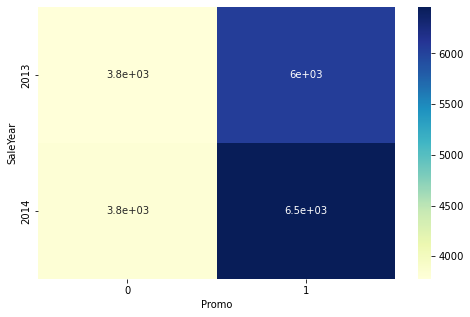

In [747]:
# Relation between sales and Promo
plt.figure(figsize=(8,5))
sns.heatmap(store_46['2013-01-01':'2014-07-01'].groupby(by=['SaleYear','Promo'])['Sales'].median().unstack(),cmap="YlGnBu",annot=True)
plt.show()



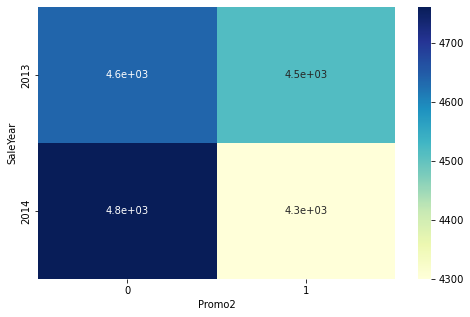

In [748]:
# Relation between sales and Promo2
plt.figure(figsize=(8,5))
sns.heatmap(store_46['2013-01-01':'2014-07-01'].groupby(by=['SaleYear','Promo2'])['Sales'].median().unstack(),cmap="YlGnBu",annot=True)
plt.show()

Looks like Promo has a positive effect and Promo2 have a negative effect on the sales

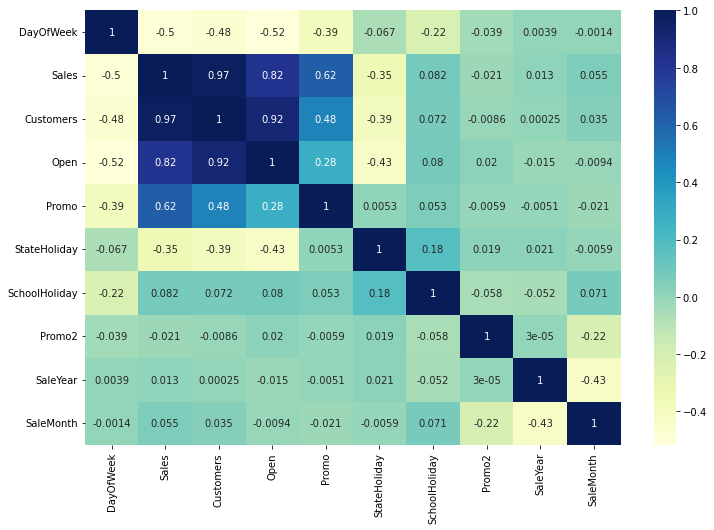

In [749]:
###### Check correlation between data points

store46_corr = store_46['2013-01-01':'2014-07-01'].corr()

plt.figure(figsize=(12,8))
sns.heatmap(store46_corr,annot=True,cmap='YlGnBu')
plt.show()


- Sales is having a high correlation with Customers,Open and Promo


In [750]:
##### Preprocess data


# Drop SaleYear and SaleMonth columns
store_46.drop(['PromoInterval','CompetitionSince','SaleYear','SaleMonth'],inplace=True,axis=1)

# Make DayOfWeek as a onehot encoded variable
store_46 = pd.concat([store_46.iloc[:,1:],pd.get_dummies(store_46.DayOfWeek)],axis=1)
store_46.shape


(758, 16)

##### 10.2 Split the data into train and test.


In [756]:
#['2013-01-01':'2014-07-01'] - Make this time range as test
# 42 days before 2015-07-31 as test
store46_train = store_46['2013-01-01':'2014-07-01'].copy()
print('train set shape:',store46_train.shape)
store46_test  = store_46[-42:].copy()
print('test set shape:',store46_test.shape)


train set shape: (546, 14)
test set shape: (42, 14)


##### Standardize  data


In [757]:
# Standardize train data
scaler = StandardScaler()
store46_train[['Sales','Customers']] = scaler.fit_transform(store46_train[['Sales','Customers']])
print(store46_train.head())
store46_test[['Sales','Customers']] = scaler.transform(store46_test[['Sales','Customers']])
print(store46_test.head())

               Sales  Customers  Open  Promo  StateHoliday  SchoolHoliday  \
Date                                                                        
2013-01-01 -1.754313  -1.958364     0      0             1              1   
2013-01-02 -0.127432   0.142778     1      0             0              1   
2013-01-03 -0.062211   0.038082     1      0             0              1   
2013-01-04 -0.083277   0.095845     1      0             0              1   
2013-01-05  0.209611   0.391882     1      0             0              0   

            Promo2  1  2  3  4  5  6  7  
Date                                     
2013-01-01       1  0  1  0  0  0  0  0  
2013-01-02       1  0  0  1  0  0  0  0  
2013-01-03       1  0  0  0  1  0  0  0  
2013-01-04       1  0  0  0  0  1  0  0  
2013-01-05       1  0  0  0  0  0  1  0  
               Sales  Customers  Open  Promo  StateHoliday  SchoolHoliday  \
Date                                                                        
2015-06-20  


##### 10.3 Check stationarity of the series



In [758]:
# Check stationarity of sales series
adf_test(store46_train.Sales) # ADF test--> H0: Not stationary, H1: Is stationary if p<0.05 then reject H0 then series is stationary 
# Check stationarity of Customers series
adf_test(store46_train.Customers)



Sales: ADF test results:
ADF Statistic: -6.050221
p-value: 0.000000
Critical Values:
	1%: -3.443
	5%: -2.867
	10%: -2.570

Customers: ADF test results:
ADF Statistic: -6.159066
p-value: 0.000000
Critical Values:
	1%: -3.443
	5%: -2.867
	10%: -2.570


ADF test: As the p-value is < 0.05 for both sales and customers they are stationary.


##### 10.4 Autocorrelation function (ACF) and Partial autocorrelation function (PACF)
Let's plot ACF to find q value and PACF to know p value



-----ACF and PCF for Sales-------


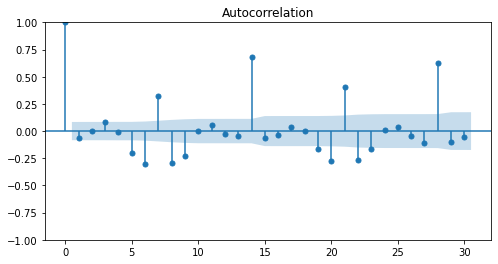

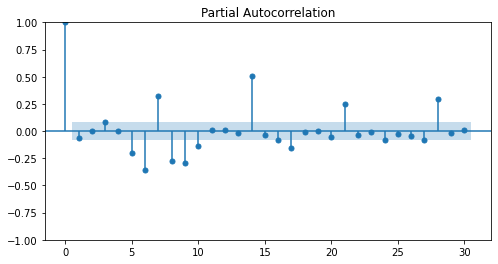

-----ACF and PCF for Customers-------


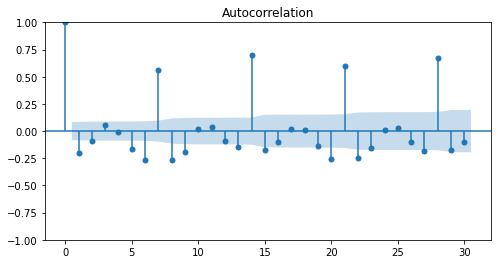

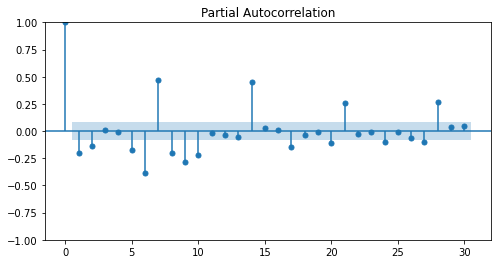

In [759]:
#Plot acf and pacf for store46 sales data
print('-----ACF and PCF for Sales-------')
plot_autocorrelation(store46_train.Sales,30)
print('-----ACF and PCF for Customers-------')
#Plot acf and pacf for customers  data
plot_autocorrelation(store46_train.Customers,30)

There is a weekely spike happening in the acf plot. The same is reflecting in pacf plot as well, so s can be taken as 7.


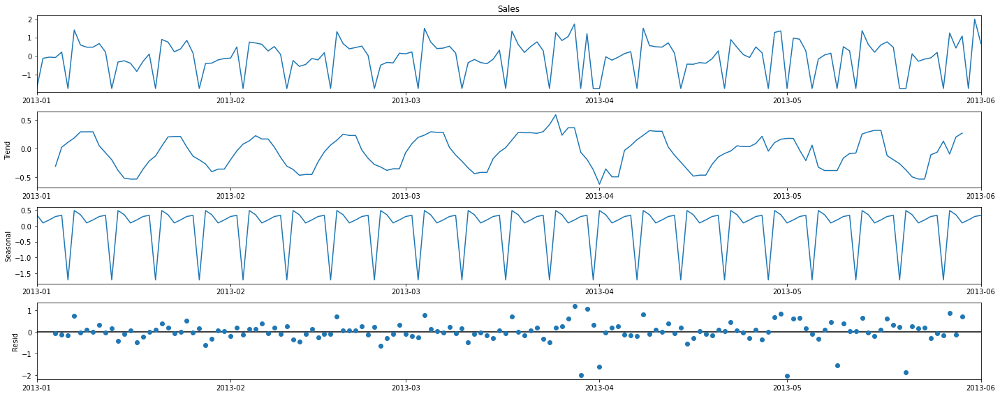

In [760]:
# Let's try to decompose the data to identify if there are any seasonal components
rcParams['figure.figsize'] = 20, 8
decomposition = sm.tsa.seasonal_decompose(store46_train.Sales[:'2013-06-01'], model='additive') # additive seasonal index
fig = decomposition.plot()
plt.show()

Clearly the series is random and the values are fluctuating throughout the year. The peaks come after 7 days.


In [761]:
# Create start and end indexes
store46_start = store46_test.index.min()
store46_end = store46_test.index.max()


#### 10.5 Build SARIMA model


In [762]:
store46_train.index.freq = store46_train.index.inferred_freq
store46_test.index.freq = store46_test.index.inferred_freq


In [763]:
#As the acf and pacf plots are showing significant correlations for higher orders we will try few values for p and q and then go with the model with least AIC values.

# Create combinations for lag and ma orderes for both seasonal and non seasonal components
p = q = range(0, 3)
d = range(0, 1)
pdq = list(itertools.product(p, d, q))
p = q = range(0, 2)
d = range(0, 2)
seasonal_pdq = [(x[0], x[1], x[2], 7) for x in list(itertools.product(p, d, q))]

print('Examples of parameter combinations for Seasonal ARIMA...')
print('SARIMAX: {} x {}'.format(pdq[1], seasonal_pdq[1]))
print('SARIMAX: {} x {}'.format(pdq[1], seasonal_pdq[2]))
print('SARIMAX: {} x {}'.format(pdq[2], seasonal_pdq[3]))
print('SARIMAX: {} x {}'.format(pdq[2], seasonal_pdq[4]))



Examples of parameter combinations for Seasonal ARIMA...
SARIMAX: (0, 0, 1) x (0, 0, 1, 7)
SARIMAX: (0, 0, 1) x (0, 1, 0, 7)
SARIMAX: (0, 0, 2) x (0, 1, 1, 7)
SARIMAX: (0, 0, 2) x (1, 0, 0, 7)


In [764]:
for param in pdq:
    for param_seasonal in seasonal_pdq:
        try:
            model = SARIMAX(store46_train.Sales,
                            order=param,
                            seasonal_order=param_seasonal)
    

            results = model.fit()

            print('SARIMA{} x {}  - AIC:{}'.format(param, param_seasonal, results.aic))
        except:
            continue


SARIMA(0, 0, 0) x (0, 0, 0, 7)  - AIC:1551.4808782595023
SARIMA(0, 0, 0) x (0, 0, 1, 7)  - AIC:1526.3954013993755
SARIMA(0, 0, 0) x (0, 1, 0, 7)  - AIC:1687.3650706150795
SARIMA(0, 0, 0) x (0, 1, 1, 7)  - AIC:1148.058567967032
SARIMA(0, 0, 0) x (1, 0, 0, 7)  - AIC:1490.918288141632
SARIMA(0, 0, 0) x (1, 0, 1, 7)  - AIC:1165.673270787263
SARIMA(0, 0, 0) x (1, 1, 0, 7)  - AIC:1202.0126325199503
SARIMA(0, 0, 0) x (1, 1, 1, 7)  - AIC:1018.9409570007559
SARIMA(0, 0, 1) x (0, 0, 0, 7)  - AIC:1551.1924615749272
SARIMA(0, 0, 1) x (0, 0, 1, 7)  - AIC:1527.9741934129324
SARIMA(0, 0, 1) x (0, 1, 0, 7)  - AIC:1638.5082018485284
SARIMA(0, 0, 1) x (0, 1, 1, 7)  - AIC:1124.7002984039923
SARIMA(0, 0, 1) x (1, 0, 0, 7)  - AIC:1481.0948322537192
SARIMA(0, 0, 1) x (1, 0, 1, 7)  - AIC:1143.2516610057278
SARIMA(0, 0, 1) x (1, 1, 0, 7)  - AIC:1202.8283718472312
SARIMA(0, 0, 1) x (1, 1, 1, 7)  - AIC:1019.2610704370682
SARIMA(0, 0, 2) x (0, 0, 0, 7)  - AIC:1553.0921657390775
SARIMA(0, 0, 2) x (0, 0, 1, 7)  - 

/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


SARIMA(0, 0, 2) x (1, 0, 1, 7)  - AIC:1114.334979464536
SARIMA(0, 0, 2) x (1, 1, 0, 7)  - AIC:1189.8442232165262
SARIMA(0, 0, 2) x (1, 1, 1, 7)  - AIC:1008.6613568462182
SARIMA(1, 0, 0) x (0, 0, 0, 7)  - AIC:1551.1682244394217
SARIMA(1, 0, 0) x (0, 0, 1, 7)  - AIC:1527.8980421901015
SARIMA(1, 0, 0) x (0, 1, 0, 7)  - AIC:1611.2906739354976
SARIMA(1, 0, 0) x (0, 1, 1, 7)  - AIC:1113.0290031251736
SARIMA(1, 0, 0) x (1, 0, 0, 7)  - AIC:1475.068862880719
SARIMA(1, 0, 0) x (1, 0, 1, 7)  - AIC:1132.146325297638
SARIMA(1, 0, 0) x (1, 1, 0, 7)  - AIC:1202.4319302501303
SARIMA(1, 0, 0) x (1, 1, 1, 7)  - AIC:1018.6636452958426
SARIMA(1, 0, 1) x (0, 0, 0, 7)  - AIC:1553.1675084451017
SARIMA(1, 0, 1) x (0, 0, 1, 7)  - AIC:1528.3826419175543
SARIMA(1, 0, 1) x (0, 1, 0, 7)  - AIC:1599.0127243479624
SARIMA(1, 0, 1) x (0, 1, 1, 7)  - AIC:1101.0385789768218
SARIMA(1, 0, 1) x (1, 0, 0, 7)  - AIC:1467.0987794903374


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


SARIMA(1, 0, 1) x (1, 0, 1, 7)  - AIC:1120.3301485562488
SARIMA(1, 0, 1) x (1, 1, 0, 7)  - AIC:1198.5318108348417
SARIMA(1, 0, 1) x (1, 1, 1, 7)  - AIC:1012.7155088526574
SARIMA(1, 0, 2) x (0, 0, 0, 7)  - AIC:1554.6192767039906
SARIMA(1, 0, 2) x (0, 0, 1, 7)  - AIC:1524.2425980668204
SARIMA(1, 0, 2) x (0, 1, 0, 7)  - AIC:1573.9949577946727
SARIMA(1, 0, 2) x (0, 1, 1, 7)  - AIC:1082.045080950701
SARIMA(1, 0, 2) x (1, 0, 0, 7)  - AIC:1451.6625745037081


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


SARIMA(1, 0, 2) x (1, 0, 1, 7)  - AIC:1101.475467990153
SARIMA(1, 0, 2) x (1, 1, 0, 7)  - AIC:1186.5332342315287
SARIMA(1, 0, 2) x (1, 1, 1, 7)  - AIC:1001.8443654030202
SARIMA(2, 0, 0) x (0, 0, 0, 7)  - AIC:1553.1656413540468
SARIMA(2, 0, 0) x (0, 0, 1, 7)  - AIC:1526.4309528962187
SARIMA(2, 0, 0) x (0, 1, 0, 7)  - AIC:1585.598118651631
SARIMA(2, 0, 0) x (0, 1, 1, 7)  - AIC:1089.2732070641357
SARIMA(2, 0, 0) x (1, 0, 0, 7)  - AIC:1458.5903985670118
SARIMA(2, 0, 0) x (1, 0, 1, 7)  - AIC:1108.7181269781204
SARIMA(2, 0, 0) x (1, 1, 0, 7)  - AIC:1190.504813018755
SARIMA(2, 0, 0) x (1, 1, 1, 7)  - AIC:1006.796642673887
SARIMA(2, 0, 1) x (0, 0, 0, 7)  - AIC:1555.1680516189383
SARIMA(2, 0, 1) x (0, 0, 1, 7)  - AIC:1527.3468689359574
SARIMA(2, 0, 1) x (0, 1, 0, 7)  - AIC:1587.0737080186623
SARIMA(2, 0, 1) x (0, 1, 1, 7)  - AIC:1091.1581431609286
SARIMA(2, 0, 1) x (1, 0, 0, 7)  - AIC:1460.4448271528147


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


SARIMA(2, 0, 1) x (1, 0, 1, 7)  - AIC:1110.5841342830265
SARIMA(2, 0, 1) x (1, 1, 0, 7)  - AIC:1190.677288532301
SARIMA(2, 0, 1) x (1, 1, 1, 7)  - AIC:1006.036323249545


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


SARIMA(2, 0, 2) x (0, 0, 0, 7)  - AIC:1415.0427849256607
SARIMA(2, 0, 2) x (0, 0, 1, 7)  - AIC:1492.1804199403962
SARIMA(2, 0, 2) x (0, 1, 0, 7)  - AIC:1408.6338631796534
SARIMA(2, 0, 2) x (0, 1, 1, 7)  - AIC:993.1203302464249
SARIMA(2, 0, 2) x (1, 0, 0, 7)  - AIC:1320.7040563763685


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


SARIMA(2, 0, 2) x (1, 0, 1, 7)  - AIC:1011.9465477789072


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


SARIMA(2, 0, 2) x (1, 1, 0, 7)  - AIC:1130.177499841118
SARIMA(2, 0, 2) x (1, 1, 1, 7)  - AIC:969.414934848848


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


We will try SARIMA(2, 0, 2) x (0, 1, 1, 7) and SARIMA(2, 0, 2) x (1, 1, 1, 7) 

In [765]:
store46_SARIMA = SARIMAX(store46_train.Sales,
                                order=(2, 0, 2),
                                seasonal_order=(0, 1, 1, 7))
            
store46_SARIMA = store46_SARIMA.fit(maxiter=1000)
store46_SARIMA.summary()


<class 'statsmodels.iolib.summary.Summary'>
"""
                                      SARIMAX Results                                      
===========================================================================================
Dep. Variable:                               Sales   No. Observations:                  546
Model:             SARIMAX(2, 0, 2)x(0, 1, [1], 7)   Log Likelihood                -490.560
Date:                             Tue, 06 Sep 2022   AIC                            993.120
Time:                                     17:47:55   BIC                           1018.859
Sample:                                 01-01-2013   HQIC                          1003.187
                                      - 06-30-2014                                         
Covariance Type:                               opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          1.7617      0.014    124.426      0.000       1.734       1.789
ar.L2         -0.9635      0.014    -69.496      0.000      -0.991      -0.936
ma.L1         -1.5995      0.027    -59.594      0.000      -1.652      -1.547
ma.L2          0.8171      0.027     30.359      0.000       0.764       0.870
ma.S.L7       -0.9930      0.051    -19.514      0.000      -1.093      -0.893
sigma2         0.3423      0.021     16.515      0.000       0.302       0.383
===================================================================================
Ljung-Box (L1) (Q):                  12.39   Jarque-Bera (JB):               706.88
Prob(Q):                              0.00   Prob(JB):                         0.00
Heteroskedasticity (H):               1.25   Skew:                            -1.00
Prob(H) (two-sided):                  0.14   Kurtosis:                         8.24
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

In [766]:
store46_SARIMA1 = SARIMAX(store46_train.Sales,
                                order=(2, 0, 2),
                                seasonal_order=(1, 1, 1, 7))
            
store46_SARIMA1 = store46_SARIMA1.fit(maxiter=1000)
store46_SARIMA1.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                      SARIMAX Results                                      
===========================================================================================
Dep. Variable:                               Sales   No. Observations:                  546
Model:             SARIMAX(2, 0, 2)x(1, 1, [1], 7)   Log Likelihood                -477.689
Date:                             Tue, 06 Sep 2022   AIC                            969.379
Time:                                     17:48:21   BIC                            999.407
Sample:                                 01-01-2013   HQIC                           981.124
                                      - 06-30-2014                                         
Covariance Type:                               opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          1.7520      0.020     88.110      0.000       1.713       1.791
ar.L2         -0.9568      0.020    -48.919      0.000      -0.995      -0.918
ma.L1         -1.6237      0.028    -56.979      0.000      -1.680      -1.568
ma.L2          0.8485      0.028     30.151      0.000       0.793       0.904
ar.S.L7       -0.2404      0.038     -6.347      0.000      -0.315      -0.166
ma.S.L7       -0.9601      0.016    -61.011      0.000      -0.991      -0.929
sigma2         0.3301      0.013     26.340      0.000       0.305       0.355
===================================================================================
Ljung-Box (L1) (Q):                   7.53   Jarque-Bera (JB):               790.47
Prob(Q):                              0.01   Prob(JB):                         0.00
Heteroskedasticity (H):               1.23   Skew:                            -1.07
Prob(H) (two-sided):                  0.17   Kurtosis:                         8.53
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

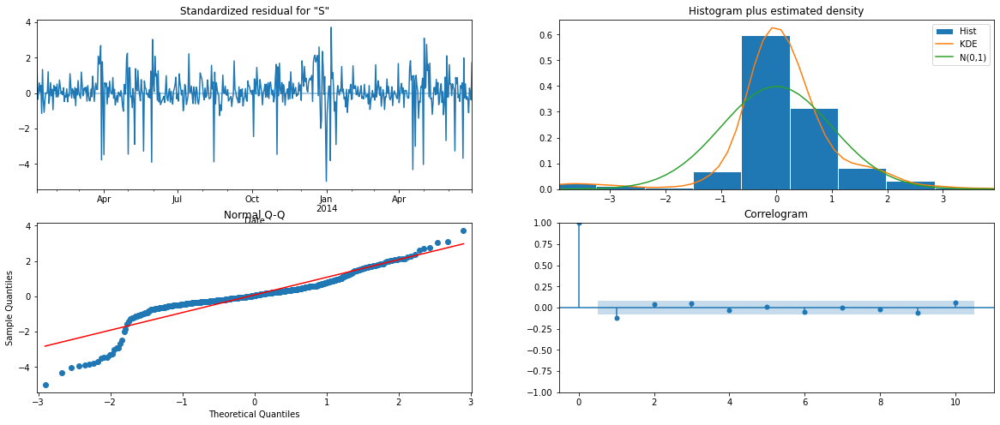

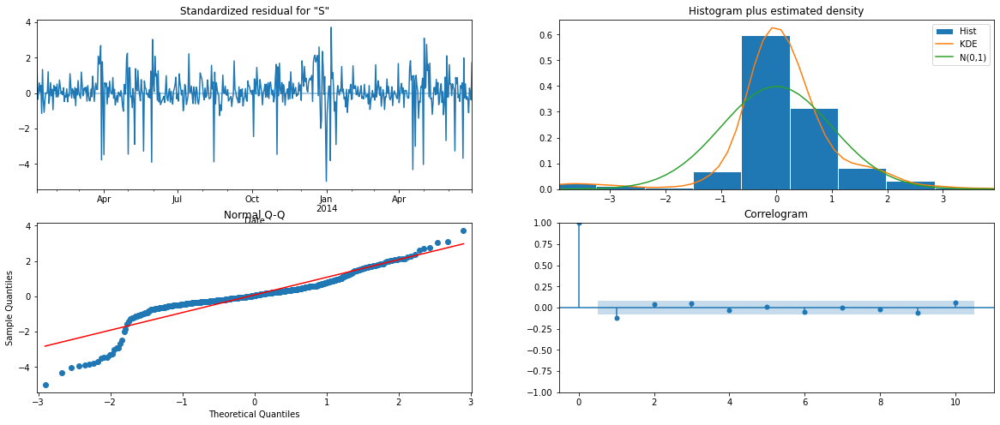

In [767]:
# store46_SARIMA1 gives better aic
# All variables looks significant
# Plot diagnostics
store46_SARIMA1.plot_diagnostics()


According to the plots our model residuals are almost normally distributed also there is no significant correlation in the residuals. So our model is acceptable.


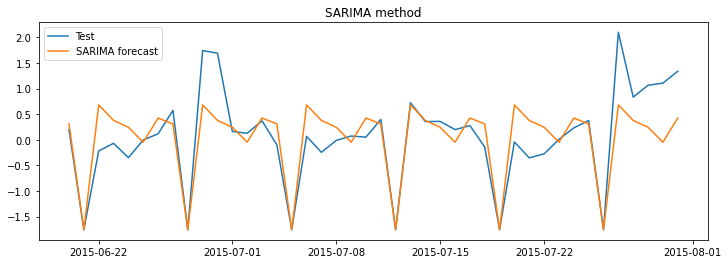

,Model,RMSE,MAPE,AIC
0,SARIMA,0.54,2.66,969.378709


In [768]:
#Now let's calculate RMSE and MAPE score
# Create a results dataframe
Results_store46 = pd.DataFrame(columns=['Model', 'RMSE' ,'MAPE','AIC'])

calculate_metrics(store46_test.Sales,store46_SARIMA1.predict(store46_start,store46_end),Results_store46,'SARIMA',store46_SARIMA1.aic)



SARIMA is not able to capture peaks coming in a week. Let's try SARIMAX model


#### 10.6 Build SARIMAX model with exogenous variable



In [769]:
print(list(store46_train.columns))


['Sales', 'Customers', 'Open', 'Promo', 'StateHoliday', 'SchoolHoliday', 'Promo2', 1, 2, 3, 4, 5, 6, 7]


In [770]:
store46_SARIMAX = SARIMAX(store46_train.Sales,
                                order=(2, 0, 2),
                                seasonal_order=(1, 1, 1, 7),
                         exog=store46_train[['Open', 'Promo', 'StateHoliday', 'SchoolHoliday', 'Promo2', 1, 2, 3, 4, 5, 6, 7]])
            

store46_SARIMAX = store46_SARIMAX.fit(max_iter=1000)
store46_SARIMAX.summary()


<class 'statsmodels.iolib.summary.Summary'>
"""
                                      SARIMAX Results                                      
===========================================================================================
Dep. Variable:                               Sales   No. Observations:                  546
Model:             SARIMAX(2, 0, 2)x(1, 1, [1], 7)   Log Likelihood                -129.499
Date:                             Tue, 06 Sep 2022   AIC                            296.997
Time:                                     17:51:16   BIC                            378.502
Sample:                                 01-01-2013   HQIC                           328.876
                                      - 06-30-2014                                         
Covariance Type:                               opg                                         
=================================================================================
                    coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------
Open              2.2131      1.065      2.078      0.038       0.126       4.300
Promo             1.0325      0.040     25.935      0.000       0.954       1.111
StateHoliday     -0.0098      1.063     -0.009      0.993      -2.093       2.073
SchoolHoliday     0.1616      0.039      4.093      0.000       0.084       0.239
Promo2           -0.0362      0.050     -0.719      0.472      -0.135       0.062
1             -1.436e-07   2.13e-06     -0.068      0.946   -4.31e-06    4.02e-06
2             -2.976e-07   1.78e-06     -0.167      0.867   -3.78e-06    3.19e-06
3             -5.222e-08   1.76e-06     -0.030      0.976    -3.5e-06    3.39e-06
4             -6.436e-08   1.77e-06     -0.036      0.971   -3.54e-06    3.41e-06
5              4.934e-08   1.68e-06      0.029      0.977   -3.24e-06    3.34e-06
6               6.62e-08   1.65e-06      0.040      0.968   -3.16e-06    3.29e-06
7              7.489e-08   1.51e-06      0.050      0.961   -2.89e-06    3.04e-06
ar.L1             0.3548      0.385      0.921      0.357      -0.401       1.110
ar.L2             0.4823      0.352      1.369      0.171      -0.208       1.173
ma.L1            -0.1811      0.395     -0.459      0.646      -0.955       0.592
ma.L2            -0.2876      0.285     -1.008      0.314      -0.847       0.272
ar.S.L7          -0.2769      0.043     -6.480      0.000      -0.361      -0.193
ma.S.L7          -0.9264      0.018    -50.514      0.000      -0.962      -0.890
sigma2            0.0918      0.005     20.247      0.000       0.083       0.101
===================================================================================
Ljung-Box (L1) (Q):                   0.15   Jarque-Bera (JB):                92.59
Prob(Q):                              0.70   Prob(JB):                         0.00
Heteroskedasticity (H):               1.31   Skew:                             0.70
Prob(H) (two-sided):                  0.07   Kurtosis:                         4.46
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
[2] Covariance matrix is singular or near-singular, with condition number 1.43e+25. Standard errors may be unstable.
"""

In [771]:
# Removing 1,2,3,4,5,6,7 as it's insignificant here
store46_SARIMAX1 = SARIMAX(store46_train.Sales,
                                order=(2, 0, 2),
                                seasonal_order=(1, 1, 1, 7),
                         exog=store46_train[['Open', 'Promo', 'StateHoliday', 'SchoolHoliday', 'Promo2']])
            

store46_SARIMAX1 = store46_SARIMAX1.fit(max_iter=1000)
store46_SARIMAX1.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                      SARIMAX Results                                      
===========================================================================================
Dep. Variable:                               Sales   No. Observations:                  546
Model:             SARIMAX(2, 0, 2)x(1, 1, [1], 7)   Log Likelihood                -129.499
Date:                             Tue, 06 Sep 2022   AIC                            282.997
Time:                                     17:52:12   BIC                            334.474
Sample:                                 01-01-2013   HQIC                           303.131
                                      - 06-30-2014                                         
Covariance Type:                               opg                                         
=================================================================================
                    coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------
Open              2.2126      1.065      2.078      0.038       0.126       4.299
Promo             1.0325      0.040     25.933      0.000       0.954       1.111
StateHoliday     -0.0103      1.062     -0.010      0.992      -2.093       2.072
SchoolHoliday     0.1616      0.039      4.093      0.000       0.084       0.239
Promo2           -0.0362      0.050     -0.719      0.472      -0.135       0.062
ar.L1             0.3547      0.385      0.921      0.357      -0.400       1.110
ar.L2             0.4824      0.352      1.370      0.171      -0.208       1.173
ma.L1            -0.1811      0.395     -0.459      0.646      -0.954       0.592
ma.L2            -0.2876      0.285     -1.008      0.313      -0.847       0.272
ar.S.L7          -0.2768      0.043     -6.479      0.000      -0.361      -0.193
ma.S.L7          -0.9264      0.018    -50.513      0.000      -0.962      -0.890
sigma2            0.0918      0.005     20.247      0.000       0.083       0.101
===================================================================================
Ljung-Box (L1) (Q):                   0.15   Jarque-Bera (JB):                92.60
Prob(Q):                              0.70   Prob(JB):                         0.00
Heteroskedasticity (H):               1.31   Skew:                             0.70
Prob(H) (two-sided):                  0.07   Kurtosis:                         4.46
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

In [772]:
# Removing StateHoliday as it's insignificant here
store46_SARIMAX2 = SARIMAX(store46_train.Sales,
                                order=(2, 0, 2),
                                seasonal_order=(1, 1, 1, 7),
                         exog=pd.DataFrame(store46_train[['Open', 'Promo', 'SchoolHoliday', 'Promo2']]))
            

store46_SARIMAX2 = store46_SARIMAX2.fit(max_iter=1000)
store46_SARIMAX2.summary()


<class 'statsmodels.iolib.summary.Summary'>
"""
                                      SARIMAX Results                                      
===========================================================================================
Dep. Variable:                               Sales   No. Observations:                  546
Model:             SARIMAX(2, 0, 2)x(1, 1, [1], 7)   Log Likelihood                -129.499
Date:                             Tue, 06 Sep 2022   AIC                            280.999
Time:                                     17:52:57   BIC                            328.186
Sample:                                 01-01-2013   HQIC                           299.455
                                      - 06-30-2014                                         
Covariance Type:                               opg                                         
=================================================================================
                    coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------
Open              2.2230      0.043     52.296      0.000       2.140       2.306
Promo             1.0325      0.040     25.940      0.000       0.954       1.111
SchoolHoliday     0.1617      0.039      4.094      0.000       0.084       0.239
Promo2           -0.0363      0.050     -0.721      0.471      -0.135       0.062
ar.L1             0.3547      0.385      0.922      0.357      -0.399       1.109
ar.L2             0.4824      0.352      1.371      0.170      -0.207       1.172
ma.L1            -0.1811      0.394     -0.460      0.646      -0.953       0.591
ma.L2            -0.2875      0.285     -1.009      0.313      -0.846       0.271
ar.S.L7          -0.2769      0.043     -6.479      0.000      -0.361      -0.193
ma.S.L7          -0.9265      0.018    -50.565      0.000      -0.962      -0.891
sigma2            0.0918      0.005     20.307      0.000       0.083       0.101
===================================================================================
Ljung-Box (L1) (Q):                   0.15   Jarque-Bera (JB):                92.51
Prob(Q):                              0.70   Prob(JB):                         0.00
Heteroskedasticity (H):               1.31   Skew:                             0.70
Prob(H) (two-sided):                  0.07   Kurtosis:                         4.46
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

In [773]:
# Removing 'Promo2' as it's insignificant here
store46_SARIMAX3 = SARIMAX(store46_train.Sales,
                                order=(2, 0, 2),
                                seasonal_order=(1, 1, 1, 7),
                         exog=pd.DataFrame(store46_train[['Open', 'Promo', 'SchoolHoliday']]))
            

store46_SARIMAX3 = store46_SARIMAX3.fit(max_iter=1000)
store46_SARIMAX3.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                      SARIMAX Results                                      
===========================================================================================
Dep. Variable:                               Sales   No. Observations:                  546
Model:             SARIMAX(2, 0, 2)x(1, 1, [1], 7)   Log Likelihood                -129.747
Date:                             Tue, 06 Sep 2022   AIC                            279.494
Time:                                     17:53:55   BIC                            322.392
Sample:                                 01-01-2013   HQIC                           296.273
                                      - 06-30-2014                                         
Covariance Type:                               opg                                         
=================================================================================
                    coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------
Open              2.2245      0.043     52.288      0.000       2.141       2.308
Promo             1.0345      0.040     25.853      0.000       0.956       1.113
SchoolHoliday     0.1622      0.040      4.098      0.000       0.085       0.240
ar.L1             0.3525      0.382      0.923      0.356      -0.396       1.101
ar.L2             0.4752      0.347      1.368      0.171      -0.206       1.156
ma.L1            -0.1736      0.391     -0.444      0.657      -0.940       0.593
ma.L2            -0.2783      0.279     -0.997      0.319      -0.826       0.269
ar.S.L7          -0.2746      0.043     -6.429      0.000      -0.358      -0.191
ma.S.L7          -0.9256      0.018    -51.261      0.000      -0.961      -0.890
sigma2            0.0919      0.004     20.443      0.000       0.083       0.101
===================================================================================
Ljung-Box (L1) (Q):                   0.12   Jarque-Bera (JB):                93.54
Prob(Q):                              0.73   Prob(JB):                         0.00
Heteroskedasticity (H):               1.31   Skew:                             0.70
Prob(H) (two-sided):                  0.07   Kurtosis:                         4.48
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

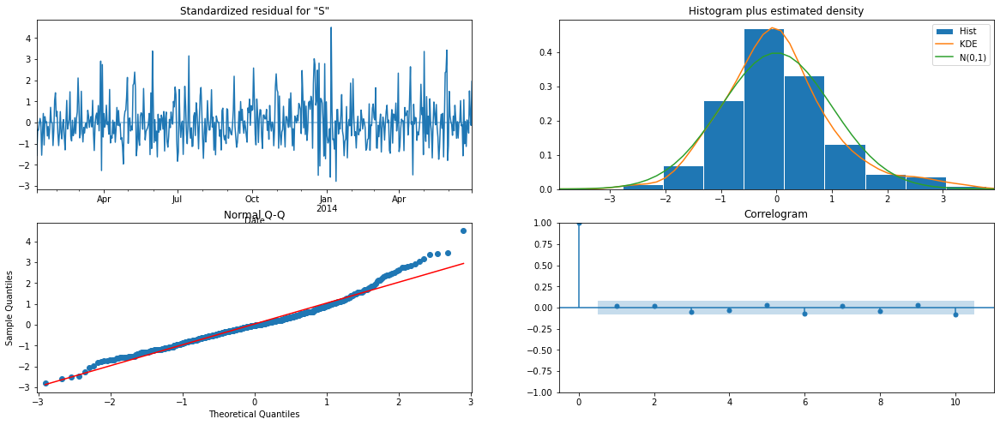

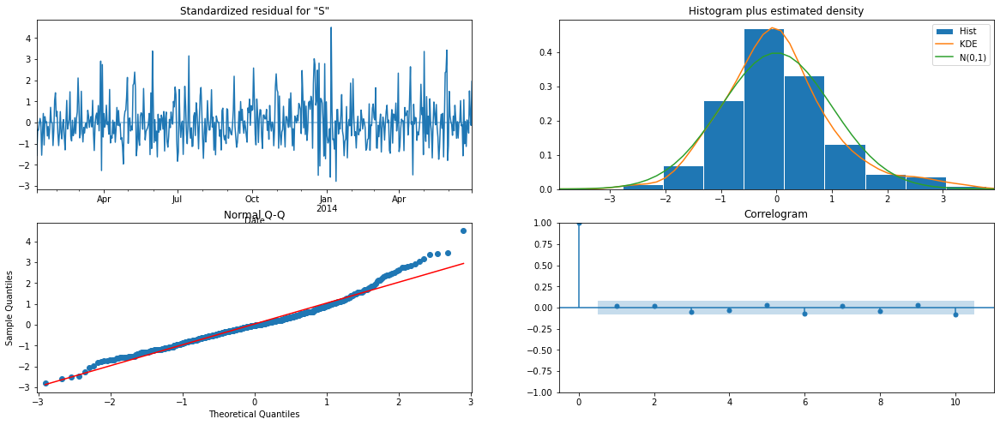

In [774]:
# Plot diagnostics
store46_Z.plot_diagnostics()


- Error terms are normally distributed and there is no significant correlation as per correlogram. Our Model is significant.
- SARIMAX3 GIVES BETTER AIC

In [775]:
# To make prediction we will create a dataframe with exogenous variables with date starting from 2014-07-01 to
# 2015-07-31 with values for null values populated as zeroes and the rest taken from test data
temp_46 = pd.DataFrame(index=pd.date_range('2013-01-01', '2015-07-31').difference(store_46.index),columns=['Open', 'Promo', 'SchoolHoliday']).fillna(0) 
st46_temp = store_46['2015-01-01':'2015-06-19'][['Open', 'Promo', 'SchoolHoliday']]
st46_test_temp = store46_test[['Open', 'Promo', 'SchoolHoliday']]
store46_test_temp = pd.concat([temp_46,st46_temp,st46_test_temp],axis=0)



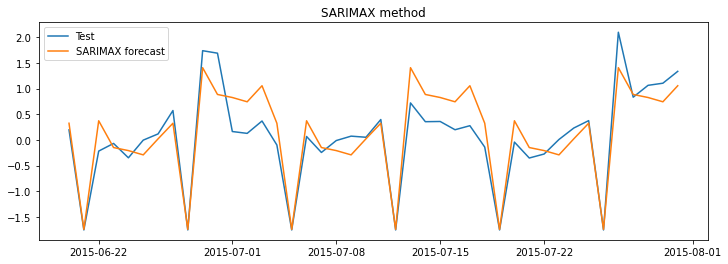

,Model,RMSE,MAPE,AIC
0,SARIMA,0.54,2.66,969.378709
1,SARIMAX,0.39,4.11,279.494376


In [776]:
calculate_metrics(store46_test.Sales,store46_SARIMAX3.predict(store46_start,store46_end,exog=store46_test_temp)
,Results_store46,'SARIMAX',store46_SARIMAX3.aic)


SARIMAX gives better aic and rmse but our mape has reduced.

#### 10.7 Build VARMAX model with exogenous variable



In [778]:

#From the previously run adf test we know that both Sales and Customers
#time serieses are stationary and they move together. So let's build a VARMAX model this time
store46_VARMAX = sm.tsa.VARMAX(store46_train[['Sales', 'Customers']], order=(2,2),trend='n',
                              exog=store46_train[['Open', 'Promo', 'StateHoliday', 'SchoolHoliday', 'Promo2', 1, 2, 3, 4, 5, 6, 7]])
store46_VARMAX = store46_VARMAX.fit(maxiter=1000, disp=False)
print(store46_VARMAX.summary())



/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/statespace/varmax.py:163: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  EstimationWarning)
/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


                             Statespace Model Results                             
Dep. Variable:     ['Sales', 'Customers']   No. Observations:                  546
Model:                        VARMAX(2,2)   Log Likelihood                 432.836
Date:                    Tue, 06 Sep 2022   AIC                           -779.672
Time:                            18:03:07   BIC                           -594.659
Sample:                        01-01-2013   HQIC                          -707.349
                             - 06-30-2014                                         
Covariance Type:                      opg                                         
Ljung-Box (L1) (Q):             0.03, 0.19   Jarque-Bera (JB):      179.10, 1796.42
Prob(Q):                        0.86, 0.66   Prob(JB):                   0.00, 0.00
Heteroskedasticity (H):         0.99, 0.83   Skew:                      0.55, -0.74
Prob(H) (two-sided):            0.94, 0.21   Kurtosis:                  5.58, 11.76


In [779]:
# REMOVE STATEHOLIDAY AND TRY
store46_VARMAX1 = sm.tsa.VARMAX(store46_train[['Sales', 'Customers']], order=(2,2),trend='n',
                              exog=store46_train[['Open', 'Promo', 'SchoolHoliday', 'Promo2', 1, 2, 3, 4, 5, 6, 7]])
store46_VARMAX1 = store46_VARMAX1.fit(maxiter=1000, disp=False)
print(store46_VARMAX1.summary())

/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/statespace/varmax.py:163: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  EstimationWarning)
/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


                             Statespace Model Results                             
Dep. Variable:     ['Sales', 'Customers']   No. Observations:                  546
Model:                        VARMAX(2,2)   Log Likelihood                 433.972
Date:                    Tue, 06 Sep 2022   AIC                           -785.944
Time:                            18:05:21   BIC                           -609.537
Sample:                        01-01-2013   HQIC                          -716.985
                             - 06-30-2014                                         
Covariance Type:                      opg                                         
Ljung-Box (L1) (Q):             0.00, 0.10   Jarque-Bera (JB):      182.02, 1985.00
Prob(Q):                        0.96, 0.75   Prob(JB):                   0.00, 0.00
Heteroskedasticity (H):         1.00, 0.82   Skew:                      0.56, -0.76
Prob(H) (two-sided):            0.99, 0.18   Kurtosis:                  5.60, 12.22


In [780]:
# REMOVE PROMO2 AND TRY
store46_VARMAX2 = sm.tsa.VARMAX(store46_train[['Sales', 'Customers']], order=(2,2),trend='n',
                              exog=store46_train[['Open', 'Promo', 'SchoolHoliday',  1, 2, 3, 4, 5, 6, 7]])
store46_VARMAX2 = store46_VARMAX2.fit(maxiter=1000, disp=False)
print(store46_VARMAX2.summary())

/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/statespace/varmax.py:163: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  EstimationWarning)
/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


                             Statespace Model Results                             
Dep. Variable:     ['Sales', 'Customers']   No. Observations:                  546
Model:                        VARMAX(2,2)   Log Likelihood                 433.254
Date:                    Tue, 06 Sep 2022   AIC                           -788.507
Time:                            18:07:14   BIC                           -620.705
Sample:                        01-01-2013   HQIC                          -722.912
                             - 06-30-2014                                         
Covariance Type:                      opg                                         
Ljung-Box (L1) (Q):             0.00, 0.10   Jarque-Bera (JB):      193.19, 1989.99
Prob(Q):                        0.99, 0.75   Prob(JB):                   0.00, 0.00
Heteroskedasticity (H):         0.99, 0.82   Skew:                      0.55, -0.76
Prob(H) (two-sided):            0.95, 0.18   Kurtosis:                  5.70, 12.23


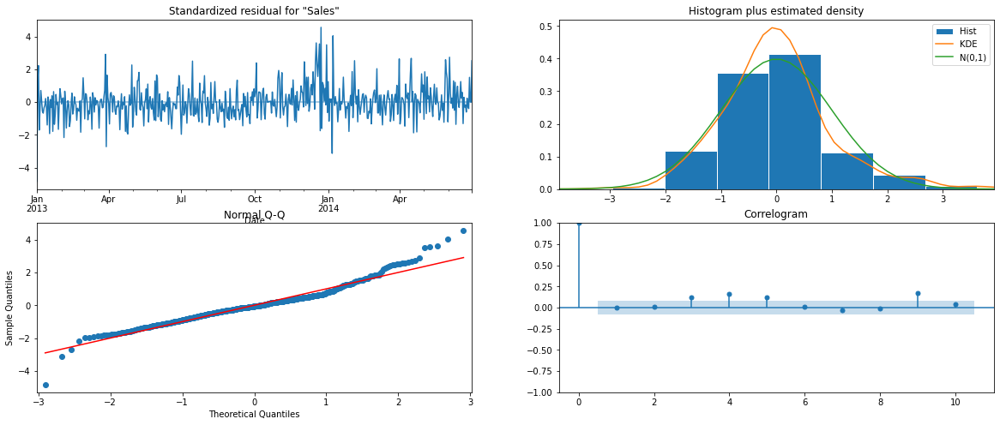

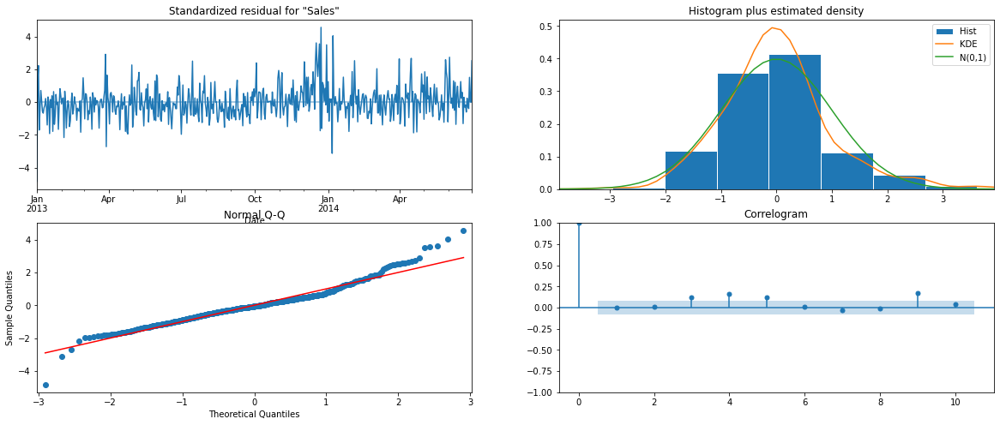

In [782]:
#VARMAX2 GIVES BETTER AIC
#Let's plot diagnostics
store46_VARMAX2.plot_diagnostics()


Residuals are normally distributed


In [783]:
# To make prediction we will create a dataframe with exogenous variables with date starting from 2014-07-01 to
# 2015-07-31 with values for null values populated as zeroes and the rest taken from test data
varmax_temp_46 = pd.DataFrame(index=pd.date_range('2013-01-01', '2015-07-31').difference(store_46.index),columns=['Open', 'Promo', 'SchoolHoliday',  1, 2, 3, 4, 5, 6, 7]).fillna(0) 
varmax_st46_temp = store_46['2015-01-01':'2015-06-19'][['Open', 'Promo', 'SchoolHoliday',  1, 2, 3, 4, 5, 6, 7]]
varmax_st46_test_temp = store46_test[['Open', 'Promo', 'SchoolHoliday',  1, 2, 3, 4, 5, 6, 7]]
varmax_store46_test_temp = pd.concat([varmax_temp_46,varmax_st46_temp,varmax_st46_test_temp],axis=0)



In [786]:
varmax_store46_test_temp.tail()

,Open,Promo,SchoolHoliday,1,2,3,4,5,6,7
2015-07-27,1,1,0,1,0,0,0,0,0,0
2015-07-28,1,1,0,0,1,0,0,0,0,0
2015-07-29,1,1,0,0,0,1,0,0,0,0
2015-07-30,1,1,0,0,0,0,1,0,0,0
2015-07-31,1,1,0,0,0,0,0,1,0,0


/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/statespace/varmax.py:163: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  EstimationWarning)
/Users/padmac/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/statespace/varmax.py:163: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  EstimationWarning)


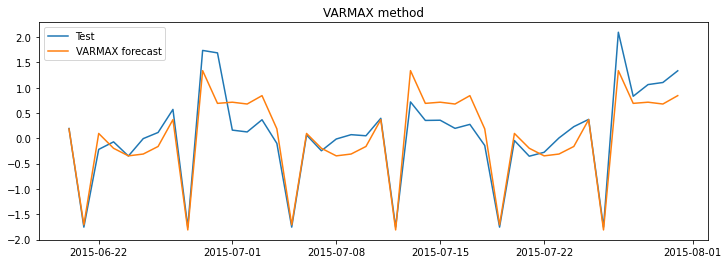

,Model,RMSE,MAPE,AIC
0,SARIMA,0.54,2.66,969.378709
1,SARIMAX,0.39,4.11,279.494376
2,VARMAX,0.36,4.22,-788.507411


In [787]:
# Calculate rmse and mapre
calculate_metrics(store46_test.Sales,store46_VARMAX2.predict(store46_start,store46_end,
                exog=varmax_store46_test_temp)['Sales'],
                  Results_store46,'VARMAX',store46_VARMAX2.aic)



VARMAX is giving best aic. Eventhough SARIMA is giving best mape, after looking at the results plot we will choose VARIMAX model for store 46 prediction

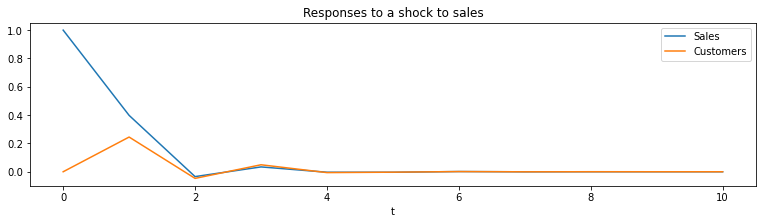

In [788]:
##### Check impluse response function

ax = store46_VARMAX2.impulse_responses(10, orthogonalized=False).plot(figsize=(13,3))
ax.set(xlabel='t', title='Responses to a shock to sales');



As per the model, after 4 lags the values of both sales and customers stabilises.
